In [6]:
library(tidyverse)
library(ggpubr)
library(cmapR)
library(pROC)

In [374]:
datadir = '../data'
wkdir = '../results'

# loocv inputs

prepare_loocv = TRUE

demo_loocv = TRUE

demo_loocv_number_or_list = 'number' # 'number' or 'list'

demo_loocv_number_cmpds = 2

demo_loocv_list_cmpds = c('BRD-K04804440','BRD-K01507359','BRD-K87202646','BRD-K59853741', 'BRD-K27302037') # Ciprofloxacin, Rifampin, Isoniazid, Q203, Thioacetazone

results_subdir_prefix = 'loocv_pcls/leave_out_cmpd_'

unique_kabx_cmpds_tbl_path = '../results/kabx_pert_ids_tbl_for_loocv.txt'

# previous Spectral Clustering inputs

thrsh_rank = 20 # threshold for average pairwise rank of correlation across KABX to connect treatments as mutual nearest-neighbors

dynamic_thrsh_per_moa = FALSE # if true then threshold is round(log(size of MOA) * thrsh_rank), otherwise identical threshold for every MOA

k_type = 'k_med_gap_den' # eigengap heuristic to take for estimating number of K clusters: k_num_zero, k_num_zero_plus_one, k_med_gap_den, k_gap_den (see create_laplacian_matrix.m for additional information)

if (dynamic_thrsh_per_moa) {
    outdir_name <- sprintf('pcls_spectral_clustering_thrsh_rank_le%dxlogsize_%s', thrsh_rank, k_type) # log(MOA size), i.e. the number of treatments/dsCGI profiles in the MOA
} else {
    outdir_name <- sprintf('pcls_spectral_clustering_thrsh_rank_le%d_%s', thrsh_rank, k_type)
}
print(outdir_name)

outdir = file.path(wkdir, outdir_name)
print(outdir)
if (dir.exists(outdir)) {
  cat("The specified PCL results folder exists.\n")
} else {
  cat("The specified PCL results folder does not exist.\n")
}

# step-specific inputs

pcls_filename = 'pcls.gmt'

any_dose_gr_filename = 'any_dose_min_gr.rds'

max_dose_gr_filename = 'max_dose_min_gr.rds'

out_tbl_savename = 'by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt'

opt_tbl_savename = 'by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt'

out_tbl_test_cmpd_savename = 'by_pcl_similarity_to_confidence_score_test_cmpd_results.txt'

pcl_train_summ_savename = "pcl_similarity_to_confidence_score_training_summary.csv"

pcl_members_and_train_summ_savename = "pcl_members_and_similarity_to_confidence_score_training_summary.csv"

pcl_members_tbl_savename = "pcl_cluster_members_table.csv"

pcl_members_summary_tbl_savename = "pcl_cluster_members_summary_table.csv"

pcl_gct_rdesc_metadata_savename = "pcl_gct_rdesc_metadata.csv"

col_meta_kabx_for_pcls_filename = 'col_meta_kabx_for_pcls.txt'

loocv_opt_tbl_combined_rds_savename = "loocv_combined_by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx_tbls.rds"

loocv_test_cmpd_results_combined_rds_savename = "loocv_combined_test_cmpd_results.rds"


loocv_opt_tbl_combined_rds_full_shared_filename = "loocv_combined_by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx_tbls_full_shared.rds"

loocv_test_cmpd_results_combined_rds_full_shared_filename = "loocv_combined_test_cmpd_results_full_shared.rds"

# PCL-based MOA prediction table outputs

test_cmpd_pcl_predictions_simplify_tbl_savename = "test_cmpd_pcl_based_moa_predictions_simplified_table.csv"

test_cmpd_pcl_predictions_full_tbl_savename = "test_cmpd_pcl_based_moa_predictions_full_metadata_table.csv"

kabx_loocv_pcl_predictions_simplify_tbl_savename = "kabx_loocv_pcl_based_moa_predictions_simplified_table.csv"

kabx_loocv_pcl_predictions_full_tbl_savename = "kabx_loocv_pcl_based_moa_predictions_full_metadata_table.csv"

kabx_demo_loocv_pcl_predictions_simplify_tbl_savename = "kabx_demo_loocv_pcl_based_moa_predictions_simplified_table.csv"

kabx_demo_loocv_pcl_predictions_full_tbl_savename = "kabx_demo_loocv_pcl_based_moa_predictions_full_metadata_table.csv"

[1] "pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den"
[1] "../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den"
The specified PCL results folder exists.


In [375]:
any_dose_gr_path = file.path(datadir, any_dose_gr_filename)
print(any_dose_gr_path)

max_dose_gr_path = file.path(datadir, max_dose_gr_filename)
print(max_dose_gr_path)

[1] "../data/any_dose_min_gr.rds"
[1] "../data/max_dose_min_gr.rds"


In [376]:
pcl_similarity_score_path = list.files(path = outdir, pattern = "pcl_similarity_score_n.*\\.gctx", full.names = TRUE)
print(pcl_similarity_score_path)

pcl_confidence_score_path = list.files(path = outdir, pattern = "pcl_confidence_score_n.*\\.gctx", full.names = TRUE)
print(pcl_confidence_score_path)

pcls_gmt_path = list.files(path = outdir, pattern = pcls_filename, full.names = TRUE)
print(pcls_gmt_path)

clusters_tbl_path = list.files(path = str_replace(outdir, "pcls", "clusters"), pattern = "clusters_spectral_clust.txt", full.names = TRUE)
print(clusters_tbl_path)

pcl_similarity_to_confidence_score_tbl_path = list.files(path = outdir, pattern = out_tbl_savename, full.names = TRUE)
print(pcl_similarity_to_confidence_score_tbl_path)

pcl_similarity_to_confidence_score_test_cmpd_results_path = list.files(path = outdir, pattern = out_tbl_test_cmpd_savename, full.names = TRUE)
print(pcl_similarity_to_confidence_score_test_cmpd_results_path)

pcl_high_confidence_similarity_score_thresholds_tbl_path = list.files(path = outdir, pattern = opt_tbl_savename, full.names = TRUE)
print(pcl_high_confidence_similarity_score_thresholds_tbl_path)

col_meta_kabx_for_pcls_path = list.files(path = wkdir, pattern = col_meta_kabx_for_pcls_filename, full.names = TRUE)
print(col_meta_kabx_for_pcls_path)

loocv_opt_tbl_combined_rds_full_shared_path = list.files(path = datadir, pattern = loocv_opt_tbl_combined_rds_full_shared_filename, full.names = TRUE)
print(loocv_opt_tbl_combined_rds_full_shared_path)

loocv_test_cmpd_results_combined_rds_full_shared_path = list.files(path = datadir, pattern = loocv_test_cmpd_results_combined_rds_full_shared_filename, full.names = TRUE)
print(loocv_test_cmpd_results_combined_rds_full_shared_path)

[1] "../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcl_similarity_score_n10819x1140.gctx"
[1] "../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcl_confidence_score_n10819x1140.gctx"
[1] "../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt"
[1] "../results/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.txt"
[1] "../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt"
[1] "../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt"
[1] "../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt"
[1] "../results/col_meta_kabx_for_pcls.txt"
[1] "../data/loocv_combined_by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx_tbls_full_shared.rds"


In [377]:
calc_f1 = function(ppv, tpr, num_decimals = 3){
    if(is.nan(ppv) | is.nan(tpr)){ 
        return(NaN)
    } else if(ppv == 0 & tpr == 0){
        return(0)
    } else { 
        return(round(((2*ppv*tpr) / (ppv + tpr)), num_decimals))
    }
}

## Process Results GCTs

In [11]:
pcl_similarity_score_all_pcls = parse_gctx(pcl_similarity_score_path)

reading ../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcl_similarity_score_n10819x1140.gctx

done



In [12]:
pcl_similarity_score_all_pcls

Formal class 'GCT' [package "cmapR"] with 7 slots
  ..@ mat    : num [1:1140, 1:10819] -0.0589 0.1414 0.1022 0.0308 -0.1028 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:1140] "30S ribosome:group1" "30S ribosome:group100" "30S ribosome:group102" "30S ribosome:group106" ...
  .. .. ..$ : chr [1:10819] "kabx2:BRD-A05468928-003-01-4:0.097500uM" "screen6:BRD-A05468928-003-01-4:0.097500uM" "kabx2:BRD-A05468928-003-01-4:0.195500uM" "screen6:BRD-A05468928-003-01-4:0.195500uM" ...
  ..@ rid    : chr [1:1140] "30S ribosome:group1" "30S ribosome:group100" "30S ribosome:group102" "30S ribosome:group106" ...
  ..@ cid    : chr [1:10819] "kabx2:BRD-A05468928-003-01-4:0.097500uM" "screen6:BRD-A05468928-003-01-4:0.097500uM" "kabx2:BRD-A05468928-003-01-4:0.195500uM" "screen6:BRD-A05468928-003-01-4:0.195500uM" ...
  ..@ rdesc  :'data.frame':	1140 obs. of  8 variables:
  .. ..$ id                           : chr [1:1140] "30S ribosome:group1" "30S ribosome:group100" "30S ribosome:group

In [13]:
pcl_confidence_score_all_pcls = parse_gctx(pcl_confidence_score_path)

reading ../results/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcl_confidence_score_n10819x1140.gctx

done



In [14]:
pcl_confidence_score_all_pcls

Formal class 'GCT' [package "cmapR"] with 7 slots
  ..@ mat    : num [1:1140, 1:10819] 0.0572 0.0603 0.0566 0.0612 0.042 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:1140] "30S ribosome:group1" "30S ribosome:group100" "30S ribosome:group102" "30S ribosome:group106" ...
  .. .. ..$ : chr [1:10819] "kabx2:BRD-A05468928-003-01-4:0.097500uM" "screen6:BRD-A05468928-003-01-4:0.097500uM" "kabx2:BRD-A05468928-003-01-4:0.195500uM" "screen6:BRD-A05468928-003-01-4:0.195500uM" ...
  ..@ rid    : chr [1:1140] "30S ribosome:group1" "30S ribosome:group100" "30S ribosome:group102" "30S ribosome:group106" ...
  ..@ cid    : chr [1:10819] "kabx2:BRD-A05468928-003-01-4:0.097500uM" "screen6:BRD-A05468928-003-01-4:0.097500uM" "kabx2:BRD-A05468928-003-01-4:0.195500uM" "screen6:BRD-A05468928-003-01-4:0.195500uM" ...
  ..@ rdesc  :'data.frame':	1140 obs. of  8 variables:
  .. ..$ id                           : chr [1:1140] "30S ribosome:group1" "30S ribosome:group100" "30S ribosome:group102

### Process PCL GMT

In [15]:
pcls_gmt = parse_gmt(pcls_gmt_path)

In [16]:
length(pcls_gmt)
head(pcls_gmt)

[1] 1140

$`30S ribosome:group1`
$`30S ribosome:group1`$head
[1] "30S ribosome:group1"

$`30S ribosome:group1`$desc
[1] "30S ribosome"

$`30S ribosome:group1`$entry
[1] "kabx2:BRD-K01825150-001-16-9:50.000000uM"
[2] "kabx2:BRD-A62336573-001-05-6:0.781250uM" 
[3] "kabx2:BRD-K40939496-001-01-5:3.125000uM" 
[4] "kabx2:BRD-K40939496-001-01-5:0.781250uM" 

$`30S ribosome:group1`$len
[1] 4


$`30S ribosome:group4`
$`30S ribosome:group4`$head
[1] "30S ribosome:group4"

$`30S ribosome:group4`$desc
[1] "30S ribosome"

$`30S ribosome:group4`$entry
[1] "kabx2:BRD-A25492003-003-16-6:0.097500uM"
[2] "kabx2:BRD-A22740840-003-07-7:0.781250uM"

$`30S ribosome:group4`$len
[1] 2


$`30S ribosome:group6`
$`30S ribosome:group6`$head
[1] "30S ribosome:group6"

$`30S ribosome:group6`$desc
[1] "30S ribosome"

$`30S ribosome:group6`$entry
[1] "screen6:BRD-A50987946-001-01-9:0.781250uM" 
[2] "screen6:BRD-M68646745-311-10-4:12.500000uM"
[3] "screen6:BRD-K71772032-001-02-1:50.000000uM"
[4] "screen6:BRD-K71772032-001-02-1:25.000000uM"
[5] "screen6:BRD-K71772032-001-02-1:12.500000uM"

$`30S ribosome:group6`$len
[1] 5


$`30S ribosome:group7`
$`30S ribosome:group7`$head
[1] "30S ribosome:group7"

$`30S ribosome:group7`$desc
[1] "30S ribosome"

$`30S ribosome:group7`$entry
[1] "screen6:BRD-K01666773-001-01-9:0.195500uM"
[2] "screen6:BRD-A34145622-003-26-9:0.097500uM"

$`30S ribosome:group7`$len
[1] 2


$`30S ribosome:group8`
$`30S ribosome:group8`$head
[1] "30S ribosome:group8"

$`30S ribosome:group8`$desc
[1] "30S ribosome"

$`30S ribosome:group8`$entry
 [1] "screen6:BRD-A54142827-003-01-7:6.250000uM" 
 [2] "screen6:BRD-A25492003-003-16-6:0.781250uM" 
 [3] "screen6:BRD-M68646745-311-10-4:0.097500uM" 
 [4] "screen6:BRD-A34145622-003-26-9:0.390500uM" 
 [5] "screen6:BRD-A22740840-003-07-7:1.562500uM" 
 [6] "screen6:BRD-A22740840-003-07-7:3.125000uM" 
 [7] "screen6:BRD-M68646745-311-10-4:3.125000uM" 
 [8] "screen6:BRD-M68646745-311-10-4:6.250000uM" 
 [9] "screen6:BRD-A22740840-003-07-7:6.250000uM" 
[10] "screen6:BRD-K01666773-001-01-9:0.390500uM" 
[11] "screen6:BRD-A50987946-001-01-9:1.562500uM" 
[12] "screen6:BRD-A50987946-001-01-9:3.125000uM" 
[13] "screen6:BRD-M68646745-311-10-4:25.000000uM"
[14] "screen6:BRD-A54142827-003-01-7:1.562500uM" 
[15] "screen6:BRD-A54142827-003-01-7:3.125000uM" 
[16] "screen6:BRD-A22740840-003-07-7:0.781250uM" 
[17] "screen6:BRD-A25492003-003-16-6:0.390500uM" 
[18] "screen6:BRD-A54142827-003-01-7:0.195500uM" 
[19] "screen6:BRD-A54142827-003-01-7:0.390500uM" 
[20] "kabx2:BRD-K01666773-001-01-9:0.097500uM"   
[21] "screen6:BRD-A54142827-003-01-7:12.500000uM"

$`30S ribosome:group8`$len
[1] 21


$`30S ribosome:group19`
$`30S ribosome:group19`$head
[1] "30S ribosome:group19"

$`30S ribosome:group19`$desc
[1] "30S ribosome"

$`30S ribosome:group19`$entry
 [1] "kabx2:BRD-A70638330-001-01-8:0.390500uM"   
 [2] "screen6:BRD-A70638330-001-01-8:6.250000uM" 
 [3] "kabx2:BRD-A70638330-001-01-8:1.562500uM"   
 [4] "kabx2:BRD-A70638330-001-01-8:6.250000uM"   
 [5] "kabx2:BRD-A70638330-001-01-8:25.000000uM"  
 [6] "kabx2:BRD-A70638330-001-01-8:50.000000uM"  
 [7] "screen6:BRD-A70638330-001-01-8:25.000000uM"
 [8] "screen6:BRD-A70638330-001-01-8:50.000000uM"
 [9] "kabx2:BRD-A70638330-001-01-8:12.500000uM"  
[10] "kabx2:BRD-A70638330-001-01-8:3.125000uM"   

$`30S ribosome:group19`$len
[1] 10

In [17]:
clusters_tbl = read.delim(clusters_tbl_path)
dim(clusters_tbl)
head(clusters_tbl)

clusters_tbl %>%
    summarize(
        n_distinct(group_id)
        )

[1] 8317   25

,cluster_id,cid,cluster_size,moa_class,broad_id,canonical_smiles,pert_class,pert_dose,pert_id,pert_id_pubchem_cid,...,proj_broad_id,project_id,target_description,target_description_long,target_pathway,target_process,trt_id,x_csv_broad_id,x_subproject_id,group_id
,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,4,30S ribosome,BRD-K01825150-001-16-9,CN(C)[C@H]1[C@@H]2C[C@@H]3Cc4c(cc(NC(=O)CNC(C)(C)C)c(O)c4C(=O)C3C(=O)[C@]2(O)C(=O)C(C(N)=O)C1=O)N(C)C,tetracycline|glycylcycline,50.00000,BRD-K01825150,54686904|73707446,...,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-K01825150-001-16-9:50.000000uM,BRD-K01825150-001-16-9,kabx2,30S ribosome:group1
2,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,4,30S ribosome,BRD-A62336573-001-05-6,CN(C)[C@H]1[C@@H]2C[C@H]3C(C(=O)c4c(O)cccc4[C@@]3(C)O)C(=O)[C@]2(O)C(=O)C(C(=O)NCN2CCCC2)C1=O,tetracycline,0.78125,BRD-A62336573,16760201|54682938,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-A62336573-001-05-6:0.781250uM,BRD-A62336573-001-05-6,kabx2,30S ribosome:group1
3,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,4,30S ribosome,BRD-K40939496-001-01-5,NC[C@H]1O[C@H](O[C@H]2[C@H](N)C[C@H](N)[C@@H](O[C@H]3O[C@H](CO)[C@@H](O)[C@H](N)[C@H]3O)[C@@H]2O)[C@H](N)[C@@H](O)[C@@H]1O,aminoglycoside,3.12500,BRD-K40939496,439318|71306482,...,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-K40939496-001-01-5:3.125000uM,BRD-K40939496-001-01-5,kabx2,30S ribosome:group1
4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,4,30S ribosome,BRD-K40939496-001-01-5,NC[C@H]1O[C@H](O[C@H]2[C@H](N)C[C@H](N)[C@@H](O[C@H]3O[C@H](CO)[C@@H](O)[C@H](N)[C@H]3O)[C@@H]2O)[C@H](N)[C@@H](O)[C@@H]1O,aminoglycoside,0.78125,BRD-K40939496,439318|71306482,...,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-K40939496-001-01-5:0.781250uM,BRD-K40939496-001-01-5,kabx2,30S ribosome:group1
5,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,2,30S ribosome,BRD-A25492003-003-16-6,CN(C)[C@H]1[C@@H]2C[C@H]3C(C(=O)c4c(O)ccc(Cl)c4[C@@]3(C)O)C(=O)[C@]2(O)C(=O)C(C(N)=O)C1=O,tetracycline,0.09750,BRD-A25492003,57222566|54675777,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-A25492003-003-16-6:0.097500uM,BRD-A25492003-003-16-6,kabx2,30S ribosome:group4
6,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,2,30S ribosome,BRD-A22740840-003-07-7,CN(C)[C@H]1[C@@H]2[C@@H](O)[C@H]3C(C(=O)c4c(O)cccc4[C@@]3(C)O)C(=O)[C@]2(O)C(=O)C(C(N)=O)C1=O,tetracycline,0.78125,BRD-A22740840,57004235|54675779,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-A22740840-003-07-7:0.781250uM,BRD-A22740840-003-07-7,kabx2,30S ribosome:group4


n_distinct(group_id)
<int>
1947


In [18]:
pcls_tbl = clusters_tbl %>%
    filter(group_id %in% names(pcls_gmt))

pcls_tbl %>%
    summarize(
        n_distinct(group_id)
        )

n_distinct(group_id)
<int>
1140


In [19]:
dim(pcls_tbl)
pcls_tbl %>%
    head()

[1] 5847   25

,cluster_id,cid,cluster_size,moa_class,broad_id,canonical_smiles,pert_class,pert_dose,pert_id,pert_id_pubchem_cid,...,proj_broad_id,project_id,target_description,target_description_long,target_pathway,target_process,trt_id,x_csv_broad_id,x_subproject_id,group_id
,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,4,30S ribosome,BRD-K01825150-001-16-9,CN(C)[C@H]1[C@@H]2C[C@@H]3Cc4c(cc(NC(=O)CNC(C)(C)C)c(O)c4C(=O)C3C(=O)[C@]2(O)C(=O)C(C(N)=O)C1=O)N(C)C,tetracycline|glycylcycline,50.00000,BRD-K01825150,54686904|73707446,...,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-K01825150-001-16-9:50.000000uM,BRD-K01825150-001-16-9,kabx2,30S ribosome:group1
2,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,4,30S ribosome,BRD-A62336573-001-05-6,CN(C)[C@H]1[C@@H]2C[C@H]3C(C(=O)c4c(O)cccc4[C@@]3(C)O)C(=O)[C@]2(O)C(=O)C(C(=O)NCN2CCCC2)C1=O,tetracycline,0.78125,BRD-A62336573,16760201|54682938,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-A62336573-001-05-6:0.781250uM,BRD-A62336573-001-05-6,kabx2,30S ribosome:group1
3,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,4,30S ribosome,BRD-K40939496-001-01-5,NC[C@H]1O[C@H](O[C@H]2[C@H](N)C[C@H](N)[C@@H](O[C@H]3O[C@H](CO)[C@@H](O)[C@H](N)[C@H]3O)[C@@H]2O)[C@H](N)[C@@H](O)[C@@H]1O,aminoglycoside,3.12500,BRD-K40939496,439318|71306482,...,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-K40939496-001-01-5:3.125000uM,BRD-K40939496-001-01-5,kabx2,30S ribosome:group1
4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,4,30S ribosome,BRD-K40939496-001-01-5,NC[C@H]1O[C@H](O[C@H]2[C@H](N)C[C@H](N)[C@@H](O[C@H]3O[C@H](CO)[C@@H](O)[C@H](N)[C@H]3O)[C@@H]2O)[C@H](N)[C@@H](O)[C@@H]1O,aminoglycoside,0.78125,BRD-K40939496,439318|71306482,...,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-K40939496-001-01-5:0.781250uM,BRD-K40939496-001-01-5,kabx2,30S ribosome:group1
5,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,2,30S ribosome,BRD-A25492003-003-16-6,CN(C)[C@H]1[C@@H]2C[C@H]3C(C(=O)c4c(O)ccc(Cl)c4[C@@]3(C)O)C(=O)[C@]2(O)C(=O)C(C(N)=O)C1=O,tetracycline,0.09750,BRD-A25492003,57222566|54675777,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-A25492003-003-16-6:0.097500uM,BRD-A25492003-003-16-6,kabx2,30S ribosome:group4
6,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,2,30S ribosome,BRD-A22740840-003-07-7,CN(C)[C@H]1[C@@H]2[C@@H](O)[C@H]3C(C(=O)c4c(O)cccc4[C@@]3(C)O)C(=O)[C@]2(O)C(=O)C(C(N)=O)C1=O,tetracycline,0.78125,BRD-A22740840,57004235|54675779,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,screen4wk_screen5wk_tbda1_kabx2,30S ribosome,30S ribosome,70S ribosome,translation,BRD-A22740840-003-07-7:0.781250uM,BRD-A22740840-003-07-7,kabx2,30S ribosome:group4


In [20]:
pcls_tbl <- pcls_tbl %>%
    mutate(
        rid = str_c(moa_class, ":", "group", cluster_id),
        pcl_desc = moa_class,
        #proj_broad_id = str_c(project_id, ":", broad_id),
        .before = cid
    )

In [21]:
pcls_tbl %>%
    group_by(rid, pcl_desc) %>%
    tally() %>%
    janitor::adorn_totals()

pcls_tbl %>%
    select(rid, pcl_desc) %>%
    distinct() %>%
    janitor::tabyl(pcl_desc) %>%
    arrange(desc(percent)) %>%
    janitor::adorn_totals()

rid,pcl_desc,n
<chr>,<chr>,<int>
30S ribosome:group1,30S ribosome,4
30S ribosome:group100,30S ribosome,17
30S ribosome:group102,30S ribosome,27
30S ribosome:group106,30S ribosome,6
30S ribosome:group112,30S ribosome,11
30S ribosome:group116,30S ribosome,2
30S ribosome:group154,30S ribosome,2
30S ribosome:group159,30S ribosome,2
30S ribosome:group19,30S ribosome,10


Warning message:
"Using one column matrices in `filter()` was deprecated in dplyr 1.1.0.
i Please use one dimensional logical vectors instead.
i The deprecated feature was likely used in the dplyr package.
  Please report the issue at <https://github.com/tidyverse/dplyr/issues>."


,pcl_desc,n,percent
,<chr>,<int>,<dbl>
1,InhA,174,0.152631579
2,GyrAB,94,0.082456140
3,50S ribosome,66,0.057894737
4,pyrimidine metabolism,63,0.055263158
5,TopA,60,0.052631579
6,DHPS,46,0.040350877
7,clp protease / proteasome,46,0.040350877
8,RpoB,43,0.037719298
9,membrane potential disruption and efflux,43,0.037719298


In [22]:
pcls_tbl %>%
    filter(cluster_size > 1) %>%
    group_by(rid, pcl_desc) %>%
    tally() %>%
    janitor::adorn_totals()

pcls_tbl %>%
    filter(cluster_size > 1) %>%
    select(rid, pcl_desc) %>%
    distinct() %>%
    janitor::tabyl(pcl_desc) %>%
    arrange(desc(percent)) %>%
    janitor::adorn_totals()

rid,pcl_desc,n
<chr>,<chr>,<int>
30S ribosome:group1,30S ribosome,4
30S ribosome:group100,30S ribosome,17
30S ribosome:group102,30S ribosome,27
30S ribosome:group106,30S ribosome,6
30S ribosome:group112,30S ribosome,11
30S ribosome:group116,30S ribosome,2
30S ribosome:group154,30S ribosome,2
30S ribosome:group159,30S ribosome,2
30S ribosome:group19,30S ribosome,10


,pcl_desc,n,percent
,<chr>,<int>,<dbl>
1,InhA,174,0.152631579
2,GyrAB,94,0.082456140
3,50S ribosome,66,0.057894737
4,pyrimidine metabolism,63,0.055263158
5,TopA,60,0.052631579
6,DHPS,46,0.040350877
7,clp protease / proteasome,46,0.040350877
8,RpoB,43,0.037719298
9,membrane potential disruption and efflux,43,0.037719298


In [23]:
names(pcls_tbl)

[1] "cluster_id"              "rid"                    
 [3] "pcl_desc"                "cid"                    
 [5] "cluster_size"            "moa_class"              
 [7] "broad_id"                "canonical_smiles"       
 [9] "pert_class"              "pert_dose"              
[11] "pert_id"                 "pert_id_pubchem_cid"    
[13] "pert_idose"              "pert_idose_tickl"       
[15] "pert_iname"              "pert_reference"         
[17] "pert_type"               "proj_broad_id"          
[19] "project_id"              "target_description"     
[21] "target_description_long" "target_pathway"         
[23] "target_process"          "trt_id"                 
[25] "x_csv_broad_id"          "x_subproject_id"        
[27] "group_id"

In [24]:
sub_pcls_tbl <- pcls_tbl %>%
    select(rid, pcl_desc, moa_class,
           cluster_size,
           cluster_id,
           cid, proj_broad_id, broad_id, pert_id, 
           pert_dose, pert_idose, project_id, x_subproject_id
          ) %>% rename("pcl_cluster_size" = "cluster_size", "pcl_moa_cluster_id" = "cluster_id")

In [25]:
check_rids <- sub_pcls_tbl %>%
    filter(pcl_cluster_size > 1) %>%
    pull(rid)

length(check_rids)
head(check_rids)

all(check_rids %in% pcl_similarity_score_all_pcls@rid)

[1] 5847

[1] "30S ribosome:group1" "30S ribosome:group1" "30S ribosome:group1"
[4] "30S ribosome:group1" "30S ribosome:group4" "30S ribosome:group4"

[1] TRUE

In [26]:
sub_pcls_tbl <- sub_pcls_tbl %>%
    group_by(rid) %>%
    mutate(
        pcl_cids = paste0(unique(cid), collapse = "|"),
        pcl_proj_broad_ids = paste0(unique(proj_broad_id), collapse = "|"),
        pcl_broad_ids = paste0(unique(broad_id), collapse = "|"),
        pcl_pert_ids = paste0(unique(pert_id), collapse = "|"),
        pcl_project_ids = paste0(unique(project_id), collapse = "|"),
        pcl_x_subproject_ids = paste0(unique(x_subproject_id), collapse = "|"),
        
        pcl_size = length(unique(cid)),
        pcl_num_proj_broad_ids_unique = length(unique(proj_broad_id)),
        pcl_num_broad_ids_unique = length(unique(broad_id)),
        pcl_num_pert_ids_unique = length(unique(pert_id)),
        pcl_num_project_ids_unique = length(unique(project_id)),
        pcl_num_x_subproject_ids_unique = length(unique(x_subproject_id)),
    )

In [27]:
head(sub_pcls_tbl) 

sub_pcls_tbl %>%
    filter(pcl_num_proj_broad_ids_unique > 1) %>%
    head()

rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,cid,proj_broad_id,broad_id,pert_id,pert_dose,...,pcl_broad_ids,pcl_pert_ids,pcl_project_ids,pcl_x_subproject_ids,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,...,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,BRD-K01825150-001-16-9,BRD-K01825150,50.00000,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,BRD-A62336573-001-05-6,BRD-A62336573,0.78125,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,3.12500,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,0.78125,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,BRD-A25492003-003-16-6,BRD-A25492003,0.09750,...,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A22740840-003-07-7,BRD-A22740840,0.78125,...,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1


rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,cid,proj_broad_id,broad_id,pert_id,pert_dose,...,pcl_broad_ids,pcl_pert_ids,pcl_project_ids,pcl_x_subproject_ids,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,...,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,BRD-K01825150-001-16-9,BRD-K01825150,50.00000,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,BRD-A62336573-001-05-6,BRD-A62336573,0.78125,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,3.12500,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,0.78125,...,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,BRD-A25492003-003-16-6,BRD-A25492003,0.09750,...,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A22740840-003-07-7,BRD-A22740840,0.78125,...,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1


In [28]:
all(sub_pcls_tbl$pcl_cluster_size == sub_pcls_tbl$pcl_size)

[1] TRUE

In [29]:
sub_pcls_tbl_long <- sub_pcls_tbl %>%
    select(rid:x_subproject_id, pcl_size:pcl_num_x_subproject_ids_unique)

dim(sub_pcls_tbl_long)
head(sub_pcls_tbl_long)

[1] 5847   19

rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,cid,proj_broad_id,broad_id,pert_id,pert_dose,pert_idose,project_id,x_subproject_id,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,BRD-K01825150-001-16-9,BRD-K01825150,50.00000,50.000000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,BRD-A62336573-001-05-6,BRD-A62336573,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,3.12500,3.125000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,BRD-A25492003-003-16-6,BRD-A25492003,0.09750,0.097500uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A22740840-003-07-7,BRD-A22740840,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1


In [30]:
sub_pcls_tbl_summ <- sub_pcls_tbl %>%
    select(rid:pcl_moa_cluster_id, pcl_cids:pcl_num_x_subproject_ids_unique) %>%
    distinct()

dim(sub_pcls_tbl_summ)
head(sub_pcls_tbl_summ)

[1] 1140   17

rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,pcl_broad_ids,pcl_pert_ids,pcl_project_ids,pcl_x_subproject_ids,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group6,30S ribosome,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,BRD-A50987946-001-01-9|BRD-M68646745-311-10-4|BRD-K71772032-001-02-1,BRD-A50987946|BRD-M68646745|BRD-K71772032,screen6,tb_screen6,5,3,3,3,1,1
30S ribosome:group7,30S ribosome,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,BRD-K01666773-001-01-9|BRD-A34145622-003-26-9,BRD-K01666773|BRD-A34145622,screen6,tb_screen6,2,2,2,2,1,1
30S ribosome:group8,30S ribosome,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-A50987946-001-01-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K01666773-001-01-9,BRD-A54142827-003-01-7|BRD-A25492003-003-16-6|BRD-M68646745-311-10-4|BRD-A34145622-003-26-9|BRD-A22740840-003-07-7|BRD-K01666773-001-01-9|BRD-A50987946-001-01-9,BRD-A54142827|BRD-A25492003|BRD-M68646745|BRD-A34145622|BRD-A22740840|BRD-K01666773|BRD-A50987946,screen6|screen4wk_screen5wk_tbda1_kabx2,tb_screen6|kabx2,21,8,7,7,2,2
30S ribosome:group19,30S ribosome,30S ribosome,10,19,kabx2:BRD-A70638330-001-01-8:0.390500uM|screen6:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:1.562500uM|kabx2:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:25.000000uM|kabx2:BRD-A70638330-001-01-8:50.000000uM|screen6:BRD-A70638330-001-01-8:25.000000uM|screen6:BRD-A70638330-001

#### Add PCL training/QC info to PCL summary table

In [31]:
pcl_similarity_to_confidence_score_tbl = read.delim(pcl_similarity_to_confidence_score_tbl_path)

dim(pcl_similarity_to_confidence_score_tbl)
head(pcl_similarity_to_confidence_score_tbl)

[1] 10746780       11

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,kabx2:BRD-K40939496-001-01-5:0.781250uM,BRD-K40939496,BRD-K40939496-001-01-5,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,30S ribosome,0.2390148,0.113592300,1,1.0000000,30S ribosome:group1,30S ribosome
2,kabx2:BRD-K01825150-001-16-9:50.000000uM,BRD-K01825150,BRD-K01825150-001-16-9,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,30S ribosome,0.2180246,-0.112830000,1,1.0000000,30S ribosome:group1,30S ribosome
3,kabx2:BRD-K87226815-001-22-1:0.390500uM,BRD-K87226815,BRD-K87226815-001-22-1,screen4wk_screen5wk_tbda1_kabx2:BRD-K87226815-001-22-1,Alr|DdlA,0.2046049,0.079127390,0,0.6666667,30S ribosome:group1,30S ribosome
4,kabx2:BRD-K40154364-001-01-0:0.097500uM,BRD-K40154364,BRD-K40154364-001-01-0,screen4wk_screen5wk_tbda1_kabx2:BRD-K40154364-001-01-0,QcrB,0.1954231,0.005037786,0,0.5000000,30S ribosome:group1,30S ribosome
5,kabx2:BRD-K17583151-001-07-3:50.000000uM,BRD-K17583151,BRD-K17583151-001-07-3,screen4wk_screen5wk_tbda1_kabx2:BRD-K17583151-001-07-3,MbtI,0.1939673,0.122491500,0,0.4000000,30S ribosome:group1,30S ribosome
6,kabx2:BRD-K63343048-001-14-8:0.195500uM,BRD-K63343048,BRD-K63343048-001-14-8,screen4wk_screen5wk_tbda1_kabx2:BRD-K63343048-001-14-8,lipid esterases,0.1881792,0.061349820,0,0.3333333,30S ribosome:group1,30S ribosome


In [32]:
pcl_similarity_to_confidence_score_tbl <- pcl_similarity_to_confidence_score_tbl %>%
    mutate(
        moa_is_separable = TRUE
        )

In [33]:
pcl_similarity_to_confidence_score_tbl %>%
    select(rid, pcl_desc, moa_is_separable) %>% distinct() %>%
    janitor::tabyl(moa_is_separable) %>%
    arrange(desc(percent)) %>% 
    janitor::adorn_totals()

pcl_similarity_to_confidence_score_tbl %>%
    select(rid, pcl_desc, moa_is_separable) %>% distinct() %>%
    janitor::tabyl(pcl_desc, moa_is_separable) %>%
    #arrange(desc(percent)) %>% 
    janitor::adorn_totals()

pcl_similarity_to_confidence_score_tbl %>%
    select(rid, pcl_desc, moa_is_separable) %>% distinct() %>%
    filter(moa_is_separable) %>%
    janitor::tabyl(pcl_desc) %>%
    arrange(desc(percent)) %>% 
    janitor::adorn_totals()

,moa_is_separable,n,percent
,<chr>,<int>,<dbl>
1,TRUE,1140,1
2,Total,1140,1


,pcl_desc,TRUE
,<chr>,<dbl>
1,30S ribosome,27
2,50S ribosome,66
3,ATP synthase,5
4,AccD6,12
5,Alr,35
6,CoaA and PyrG,21
7,CoaBC,4
8,CydAB,6
9,Cyp121,4


,pcl_desc,n,percent
,<chr>,<int>,<dbl>
1,InhA,174,0.152631579
2,GyrAB,94,0.082456140
3,50S ribosome,66,0.057894737
4,pyrimidine metabolism,63,0.055263158
5,TopA,60,0.052631579
6,DHPS,46,0.040350877
7,clp protease / proteasome,46,0.040350877
8,RpoB,43,0.037719298
9,membrane potential disruption and efflux,43,0.037719298


In [34]:
add2pcl_high_confidence_similarity_score_thresholds_tbl <- pcl_similarity_to_confidence_score_tbl %>%
    group_by(rid) %>%
    arrange(desc(pcl_similarity_score)) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = T)
    ) %>% 
    slice(1) %>%
    mutate(
        first_score_pcl_confidence_score = pcl_confidence_score
    ) %>%
    select(rid, pcl_desc,
           #cmpd_index,
           first_score_pcl_confidence_score,
           max_pcl_confidence_score,
            moa_is_separable
          )

dim(add2pcl_high_confidence_similarity_score_thresholds_tbl)
head(add2pcl_high_confidence_similarity_score_thresholds_tbl)

[1] 1140    5

rid,pcl_desc,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<chr>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,30S ribosome,1,1,TRUE
30S ribosome:group100,30S ribosome,1,1,TRUE
30S ribosome:group102,30S ribosome,1,1,TRUE
30S ribosome:group106,30S ribosome,1,1,TRUE
30S ribosome:group112,30S ribosome,1,1,TRUE
30S ribosome:group116,30S ribosome,1,1,TRUE


In [35]:
add2pcl_high_confidence_similarity_score_thresholds_tbl %>%
    filter(moa_is_separable) %>%
    janitor::tabyl(first_score_pcl_confidence_score) %>%
    arrange(desc(percent)) %>% 
    janitor::adorn_totals()

add2pcl_high_confidence_similarity_score_thresholds_tbl %>%
    filter(moa_is_separable) %>%
    janitor::tabyl(max_pcl_confidence_score) %>%
    arrange(desc(percent)) %>% 
    janitor::adorn_totals()

#add2pcl_high_confidence_similarity_score_thresholds_tbl %>%
#    filter(moa_is_separable) %>%
#    janitor::tabyl(cmpd_index) %>%
#    arrange(desc(percent)) %>% 
#    janitor::adorn_totals()

,first_score_pcl_confidence_score,n,percent
,<chr>,<int>,<dbl>
1,1,1140,1
2,Total,1140,1


,max_pcl_confidence_score,n,percent
,<chr>,<int>,<dbl>
1,1,1140,1
2,Total,1140,1


In [36]:
add2pcl_high_confidence_similarity_score_thresholds_tbl %>%
    filter(!moa_is_separable) %>%
    janitor::tabyl(first_score_pcl_confidence_score) %>%
    arrange(desc(percent)) %>% 
    janitor::adorn_totals()

add2pcl_high_confidence_similarity_score_thresholds_tbl %>%
    filter(!moa_is_separable) %>%
    janitor::tabyl(max_pcl_confidence_score) %>%
    arrange(desc(percent)) %>% 
    janitor::adorn_totals()

#add2pcl_high_confidence_similarity_score_thresholds_tbl %>%
#    filter(!moa_is_separable) %>%
#    janitor::tabyl(cmpd_index) %>%
#    arrange(desc(percent)) %>% 
#    janitor::adorn_totals()

,first_score_pcl_confidence_score,n,percent
,<chr>,<int>,<dbl>
1,Total,0,0


,max_pcl_confidence_score,n,percent
,<chr>,<int>,<dbl>
1,Total,0,0


In [37]:
pcl_high_confidence_similarity_score_thresholds_tbl <- read.delim(pcl_high_confidence_similarity_score_thresholds_tbl_path)

dim(pcl_high_confidence_similarity_score_thresholds_tbl)
head(pcl_high_confidence_similarity_score_thresholds_tbl)

[1] 1140   16

,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_high_confidence_similarity_score_threshold,pcl_high_confidence_ppv_thres,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv
,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,30S ribosome:group1,30S ribosome,437,25,9427,477,0.4375728,0.2180246,1,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667
2,30S ribosome:group100,30S ribosome,437,25,9427,477,0.6637864,0.7507007,1,0.7507007,1,0.40,0,phenazine-like,0.7493913,0.9090909
3,30S ribosome:group102,30S ribosome,437,25,9427,477,0.6089320,0.6585882,1,0.6585882,1,0.40,0,CysH,0.6566803,0.9090909
4,30S ribosome:group106,30S ribosome,437,25,9427,477,0.5016505,0.7625427,1,0.7625427,1,0.04,0,membrane integrity,0.7512171,0.5000000
5,30S ribosome:group112,30S ribosome,437,25,9427,477,0.2760194,0.6630315,1,0.6630315,1,0.04,0,PG transpeptidation and transport,0.6538508,0.5000000
6,30S ribosome:group116,30S ribosome,437,25,9427,477,0.3113592,0.3998896,1,0.3998896,1,0.04,0,clp protease / proteasome,0.3810507,0.5000000


In [38]:
pcl_high_confidence_similarity_score_thresholds_tbl <- pcl_high_confidence_similarity_score_thresholds_tbl %>%
    mutate(
        rid = pcl_rid,
        .before = pcl_rid
    )

dim(pcl_high_confidence_similarity_score_thresholds_tbl)
head(pcl_high_confidence_similarity_score_thresholds_tbl)

[1] 1140   17

,rid,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_high_confidence_similarity_score_threshold,pcl_high_confidence_ppv_thres,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv
,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,30S ribosome:group1,30S ribosome:group1,30S ribosome,437,25,9427,477,0.4375728,0.2180246,1,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667
2,30S ribosome:group100,30S ribosome:group100,30S ribosome,437,25,9427,477,0.6637864,0.7507007,1,0.7507007,1,0.40,0,phenazine-like,0.7493913,0.9090909
3,30S ribosome:group102,30S ribosome:group102,30S ribosome,437,25,9427,477,0.6089320,0.6585882,1,0.6585882,1,0.40,0,CysH,0.6566803,0.9090909
4,30S ribosome:group106,30S ribosome:group106,30S ribosome,437,25,9427,477,0.5016505,0.7625427,1,0.7625427,1,0.04,0,membrane integrity,0.7512171,0.5000000
5,30S ribosome:group112,30S ribosome:group112,30S ribosome,437,25,9427,477,0.2760194,0.6630315,1,0.6630315,1,0.04,0,PG transpeptidation and transport,0.6538508,0.5000000
6,30S ribosome:group116,30S ribosome:group116,30S ribosome,437,25,9427,477,0.3113592,0.3998896,1,0.3998896,1,0.04,0,clp protease / proteasome,0.3810507,0.5000000


In [39]:
pcl_high_confidence_similarity_score_thresholds_tbl <- inner_join(pcl_high_confidence_similarity_score_thresholds_tbl,
                          add2pcl_high_confidence_similarity_score_thresholds_tbl)

dim(pcl_high_confidence_similarity_score_thresholds_tbl)
head(pcl_high_confidence_similarity_score_thresholds_tbl)

Joining with `by = join_by(rid, pcl_desc)`


[1] 1140   20

,rid,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_high_confidence_similarity_score_threshold,pcl_high_confidence_ppv_thres,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
1,30S ribosome:group1,30S ribosome:group1,30S ribosome,437,25,9427,477,0.4375728,0.2180246,1,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
2,30S ribosome:group100,30S ribosome:group100,30S ribosome,437,25,9427,477,0.6637864,0.7507007,1,0.7507007,1,0.40,0,phenazine-like,0.7493913,0.9090909,1,1,TRUE
3,30S ribosome:group102,30S ribosome:group102,30S ribosome,437,25,9427,477,0.6089320,0.6585882,1,0.6585882,1,0.40,0,CysH,0.6566803,0.9090909,1,1,TRUE
4,30S ribosome:group106,30S ribosome:group106,30S ribosome,437,25,9427,477,0.5016505,0.7625427,1,0.7625427,1,0.04,0,membrane integrity,0.7512171,0.5000000,1,1,TRUE
5,30S ribosome:group112,30S ribosome:group112,30S ribosome,437,25,9427,477,0.2760194,0.6630315,1,0.6630315,1,0.04,0,PG transpeptidation and transport,0.6538508,0.5000000,1,1,TRUE
6,30S ribosome:group116,30S ribosome:group116,30S ribosome,437,25,9427,477,0.3113592,0.3998896,1,0.3998896,1,0.04,0,clp protease / proteasome,0.3810507,0.5000000,1,1,TRUE


Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


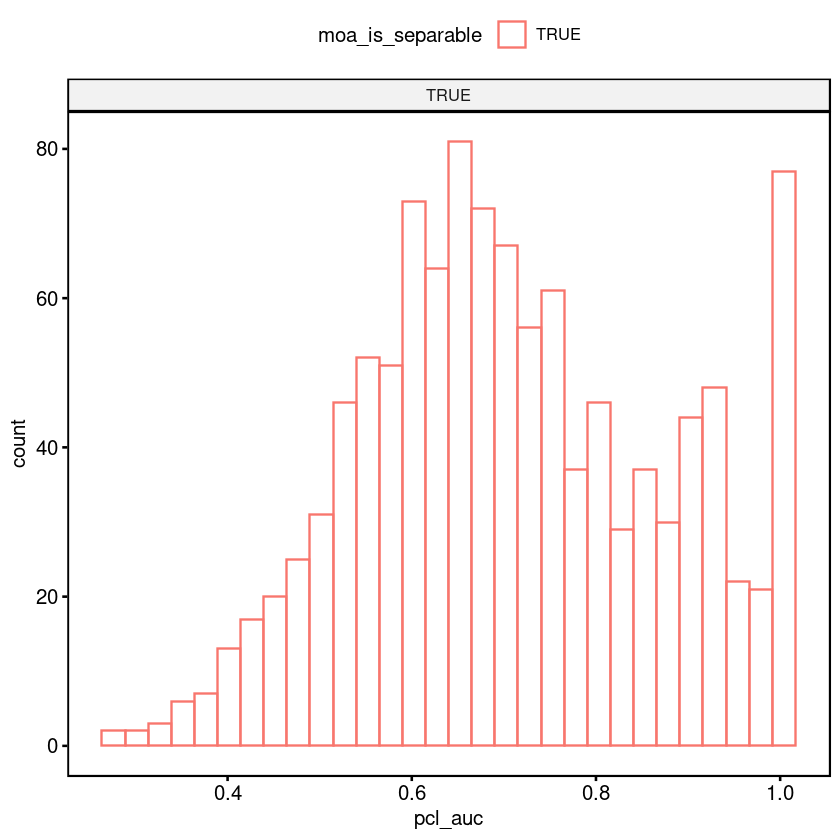

In [40]:
gghistogram(
    pcl_high_confidence_similarity_score_thresholds_tbl,
    x = "pcl_auc",
    facet.by = "moa_is_separable",
    color = "moa_is_separable"
    )

In [41]:
pcl_train_summ <- pcl_high_confidence_similarity_score_thresholds_tbl

dim(pcl_train_summ)
head(pcl_train_summ)

setdiff(names(pcl_high_confidence_similarity_score_thresholds_tbl), names(pcl_train_summ))

[1] 1140   20

,rid,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_high_confidence_similarity_score_threshold,pcl_high_confidence_ppv_thres,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
1,30S ribosome:group1,30S ribosome:group1,30S ribosome,437,25,9427,477,0.4375728,0.2180246,1,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
2,30S ribosome:group100,30S ribosome:group100,30S ribosome,437,25,9427,477,0.6637864,0.7507007,1,0.7507007,1,0.40,0,phenazine-like,0.7493913,0.9090909,1,1,TRUE
3,30S ribosome:group102,30S ribosome:group102,30S ribosome,437,25,9427,477,0.6089320,0.6585882,1,0.6585882,1,0.40,0,CysH,0.6566803,0.9090909,1,1,TRUE
4,30S ribosome:group106,30S ribosome:group106,30S ribosome,437,25,9427,477,0.5016505,0.7625427,1,0.7625427,1,0.04,0,membrane integrity,0.7512171,0.5000000,1,1,TRUE
5,30S ribosome:group112,30S ribosome:group112,30S ribosome,437,25,9427,477,0.2760194,0.6630315,1,0.6630315,1,0.04,0,PG transpeptidation and transport,0.6538508,0.5000000,1,1,TRUE
6,30S ribosome:group116,30S ribosome:group116,30S ribosome,437,25,9427,477,0.3113592,0.3998896,1,0.3998896,1,0.04,0,clp protease / proteasome,0.3810507,0.5000000,1,1,TRUE


character(0)

In [42]:
sub_pcls_tbl_long <- sub_pcls_tbl_long %>%
    mutate(
        pcl_rid = rid,
        .after = rid
        )

dim(sub_pcls_tbl_long)
head(sub_pcls_tbl_long)

[1] 5847   20

rid,pcl_rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,cid,proj_broad_id,broad_id,pert_id,pert_dose,pert_idose,project_id,x_subproject_id,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,BRD-K01825150-001-16-9,BRD-K01825150,50.00000,50.000000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,BRD-A62336573-001-05-6,BRD-A62336573,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,3.12500,3.125000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,BRD-A25492003-003-16-6,BRD-A25492003,0.09750,0.097500uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group4,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A22740840-003-07-7,BRD-A22740840,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1


In [43]:
join_pcls_tbl_long_train_summ <- left_join(sub_pcls_tbl_long,
                                           pcl_train_summ)

dim(join_pcls_tbl_long_train_summ)
head(join_pcls_tbl_long_train_summ)

Joining with `by = join_by(rid, pcl_rid, pcl_desc)`


[1] 5847   37

rid,pcl_rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,cid,proj_broad_id,broad_id,pert_id,...,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,...,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,BRD-K01825150-001-16-9,BRD-K01825150,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,BRD-A62336573-001-05-6,BRD-A62336573,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,BRD-K40939496,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group4,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,BRD-A25492003-003-16-6,BRD-A25492003,...,0.2401895,1,0.28,0,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE
30S ribosome:group4,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A22740840-003-07-7,BRD-A22740840,...,0.2401895,1,0.28,0,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE


In [44]:
sub_pcls_tbl_summ <- sub_pcls_tbl_summ %>%
    mutate(
        pcl_rid = rid,
        .after = rid
        )

dim(sub_pcls_tbl_summ)
head(sub_pcls_tbl_summ)

[1] 1140   18

rid,pcl_rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,pcl_broad_ids,pcl_pert_ids,pcl_project_ids,pcl_x_subproject_ids,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group6,30S ribosome:group6,30S ribosome,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,BRD-A50987946-001-01-9|BRD-M68646745-311-10-4|BRD-K71772032-001-02-1,BRD-A50987946|BRD-M68646745|BRD-K71772032,screen6,tb_screen6,5,3,3,3,1,1
30S ribosome:group7,30S ribosome:group7,30S ribosome,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,BRD-K01666773-001-01-9|BRD-A34145622-003-26-9,BRD-K01666773|BRD-A34145622,screen6,tb_screen6,2,2,2,2,1,1
30S ribosome:group8,30S ribosome:group8,30S ribosome,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-A50987946-001-01-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K01666773-001-01-9,BRD-A54142827-003-01-7|BRD-A25492003-003-16-6|BRD-M68646745-311-10-4|BRD-A34145622-003-26-9|BRD-A22740840-003-07-7|BRD-K01666773-001-01-9|BRD-A50987946-001-01-9,BRD-A54142827|BRD-A25492003|BRD-M68646745|BRD-A34145622|BRD-A22740840|BRD-K01666773|BRD-A50987946,screen6|screen4wk_screen5wk_tbda1_kabx2,tb_screen6|kabx2,21,8,7,7,2,2
30S ribosome:group19,30S ribosome:group19,30S ribosome,30S ribosome,10,19,kabx2:BRD-A70638330-001-01-8:0.390500uM|screen6:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:1.562500uM|kabx2:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A7063

In [45]:
join_pcls_tbl_summ_train_summ <- left_join(sub_pcls_tbl_summ,
                                           pcl_train_summ)

dim(join_pcls_tbl_summ_train_summ)
head(join_pcls_tbl_summ_train_summ)

join_pcls_tbl_summ_train_summ <- join_pcls_tbl_summ_train_summ %>%
    mutate(
            pcl_used_in_scoring_and_training = !is.na(pcl_auc),
            .before = pcl_n
        )

Joining with `by = join_by(rid, pcl_rid, pcl_desc)`


[1] 1140   35

rid,pcl_rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,pcl_broad_ids,pcl_pert_ids,...,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,...,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group4,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,...,0.2401895,1,0.28,0,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE
30S ribosome:group6,30S ribosome:group6,30S ribosome,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,BRD-A50987946-001-01-9|BRD-M68646745-311-10-4|BRD-K71772032-001-02-1,BRD-A50987946|BRD-M68646745|BRD-K71772032,...,0.5025868,1,0.44,0,clp protease / proteasome,0.5005829,0.9166667,1,1,TRUE
30S ribosome:group7,30S ribosome:group7,30S ribosome,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,BRD-K01666773-001-01-9|BRD-A34145622-003-26-9,BRD-K01666773|BRD-A34145622,...,0.4369708,1,0.32,0,GyrAB|TopA,0.4368874,0.8888889,1,1,TRUE
30S ribosome:group8,30S ribosome:group8,30S ribosome,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-A50987946-001-01-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K01666773-001-01-9,BRD-A54142827-003-01-7|BRD-A25492003-003-16-6|BRD-M68646745-311-10-4|BRD-A34145622-003-26-9|BRD-A22740840-003-07-7|BRD-K01666773-001-01-9|BRD-A50987946-001-01-9,BRD-A54142827|BRD-A25492003|BRD-M68646745|BRD-A34145622|BRD-A22740840|BRD-K01666773|BRD-A50987946,...,0.6033092,1,0.44,0,phenazine-like,0.6018475,0.9166667,1,1,TRUE
30S ribosome:group19,30S ribosome:group19,30S ribosome,30S ribosome,10,19,kabx2:BRD-A7063833

In [46]:
join_pcls_tbl_summ_train_summ %>%
    janitor::tabyl(pcl_used_in_scoring_and_training) %>%
    arrange(desc(percent)) %>%
    janitor::adorn_totals()

join_pcls_tbl_summ_train_summ %>%
    filter(pcl_size <= 1) %>%
    janitor::tabyl(pcl_used_in_scoring_and_training) %>%
    arrange(desc(percent)) %>%
    janitor::adorn_totals()

join_pcls_tbl_summ_train_summ %>%
    filter(pcl_size > 1) %>%
    janitor::tabyl(pcl_used_in_scoring_and_training) %>%
    arrange(desc(percent)) %>%
    janitor::adorn_totals()

,pcl_used_in_scoring_and_training,n,percent
,<chr>,<int>,<dbl>
1,TRUE,1140,1
2,Total,1140,1


,pcl_used_in_scoring_and_training,n,percent
,<chr>,<int>,<dbl>
1,Total,0,0


,pcl_used_in_scoring_and_training,n,percent
,<chr>,<int>,<dbl>
1,TRUE,1140,1
2,Total,1140,1


Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


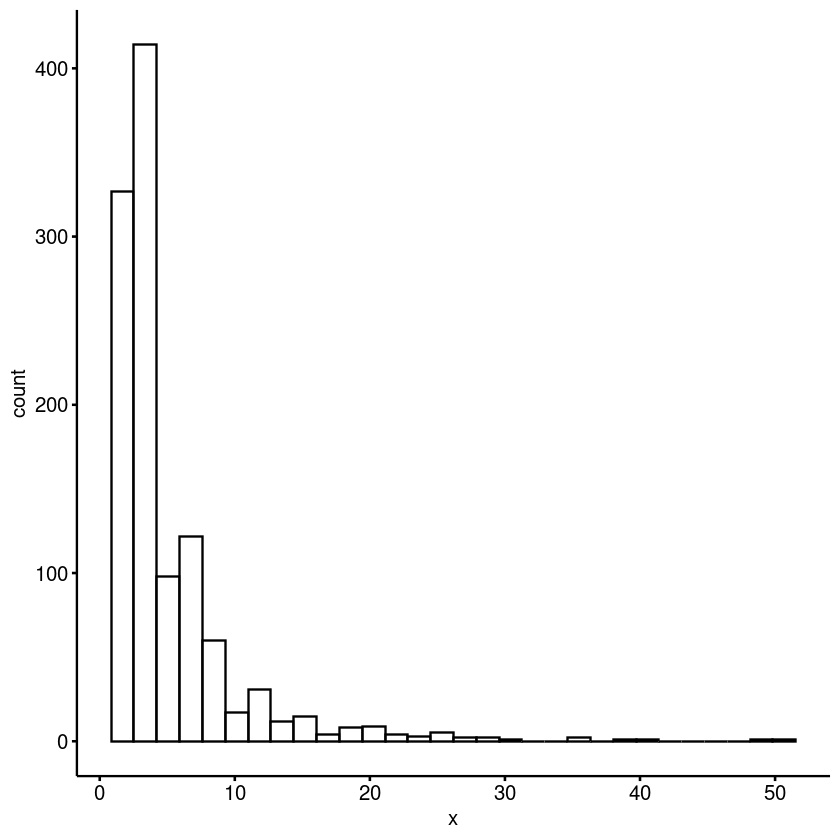

In [47]:
gghistogram(join_pcls_tbl_summ_train_summ$pcl_size)

In [48]:
join_pcls_tbl_summ_train_summ %>%
    janitor::tabyl(pcl_size, pcl_used_in_scoring_and_training) %>%
    #arrange(desc(percent)) %>%
    janitor::adorn_totals()

,pcl_size,TRUE
,<chr>,<dbl>
1,2,327
2,3,243
3,4,171
4,5,98
5,6,72
6,7,50
7,8,36
8,9,24
9,10,17


In [49]:
join_pcls_tbl_summ_train_summ %>%
    janitor::tabyl(pcl_size, moa_is_separable) %>%
    #arrange(desc(percent)) %>%
    janitor::adorn_totals()

,pcl_size,TRUE
,<chr>,<dbl>
1,2,327
2,3,243
3,4,171
4,5,98
5,6,72
6,7,50
7,8,36
8,9,24
9,10,17


In [50]:
names(join_pcls_tbl_summ_train_summ)

[1] "rid"                                           
 [2] "pcl_rid"                                       
 [3] "pcl_desc"                                      
 [4] "moa_class"                                     
 [5] "pcl_cluster_size"                              
 [6] "pcl_moa_cluster_id"                            
 [7] "pcl_cids"                                      
 [8] "pcl_proj_broad_ids"                            
 [9] "pcl_broad_ids"                                 
[10] "pcl_pert_ids"                                  
[11] "pcl_project_ids"                               
[12] "pcl_x_subproject_ids"                          
[13] "pcl_size"                                      
[14] "pcl_num_proj_broad_ids_unique"                 
[15] "pcl_num_broad_ids_unique"                      
[16] "pcl_num_pert_ids_unique"                       
[17] "pcl_num_project_ids_unique"                    
[18] "pcl_num_x_subproject_ids_unique"               
[19] "pcl_used_in_scoring_and_training"              
[20] "pcl_n"                                         
[21] "pcl_n_correct"                                 
[22] "pcl_n_trt"                                     
[23] "pcl_n_correct_trt"                             
[24] "pcl_auc"                                       
[25] "pcl_high_confidence_similarity_score_threshold"
[26] "pcl_high_confidence_ppv_thres"                 
[27] "pcl_opt_similarity_score_threshold"            
[28] "pcl_opt_ppv"                                   
[29] "pcl_opt_tpr"                                   
[30] "pcl_opt_fpr"                                   
[31] "next_score_moa"                                
[32] "full_model_next_score_thres"                   
[33] "full_model_next_score_ppv"                     
[34] "first_score_pcl_confidence_score"              
[35] "max_pcl_confidence_score"                      
[36] "moa_is_separable"

In [51]:
sub_pcls_tbl_summ_train_summ <- join_pcls_tbl_summ_train_summ %>%
    select(rid:pcl_desc,
           pcl_size,
           #pcl_cids:moa_is_separable
           everything()
          )

dim(sub_pcls_tbl_summ_train_summ)
head(sub_pcls_tbl_summ_train_summ)

[1] 1140   36

rid,pcl_rid,pcl_desc,pcl_size,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,pcl_broad_ids,...,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,...,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,30S ribosome:group1,30S ribosome,4,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group4,30S ribosome:group4,30S ribosome,2,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,...,0.2401895,1,0.28,0,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE
30S ribosome:group6,30S ribosome:group6,30S ribosome,5,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,BRD-A50987946-001-01-9|BRD-M68646745-311-10-4|BRD-K71772032-001-02-1,...,0.5025868,1,0.44,0,clp protease / proteasome,0.5005829,0.9166667,1,1,TRUE
30S ribosome:group7,30S ribosome:group7,30S ribosome,2,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,BRD-K01666773-001-01-9|BRD-A34145622-003-26-9,...,0.4369708,1,0.32,0,GyrAB|TopA,0.4368874,0.8888889,1,1,TRUE
30S ribosome:group8,30S ribosome:group8,30S ribosome,21,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-A50987946-001-01-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K01666773-001-01-9,BRD-A54142827-003-01-7|BRD-A25492003-003-16-6|BRD-M68646745-311-10-4|BRD-A34145622-003-26-9|BRD-A22740840-003-07-7|BRD-K01666773-001-01-9|BRD-A50987946-001-01-9,...,0.6033092,1,0.44,0,phenazine-like,0.6018475,0.9166667,1,1,TRUE
30S ribosome:group19,30S ribosome:group19,30S ribosome,10,30S ribosome,10,19,kabx2:BRD-A70638330-001-01-8:0.390500uM|screen6:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:1.562500uM|kabx2:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:25.000000uM|kabx2:BRD-A70638330-001-01-8:50.000000uM|sc

In [52]:
pcl_train_summ

rid,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_high_confidence_similarity_score_threshold,pcl_high_confidence_ppv_thres,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,30S ribosome:group1,30S ribosome,437,25,9427,477,0.4375728,0.2180246,1,0.2180246,1.0000000,0.0800000,0.000000000,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group100,30S ribosome:group100,30S ribosome,437,25,9427,477,0.6637864,0.7507007,1,0.7507007,1.0000000,0.4000000,0.000000000,phenazine-like,0.7493913,0.9090909,1,1,TRUE
30S ribosome:group102,30S ribosome:group102,30S ribosome,437,25,9427,477,0.6089320,0.6585882,1,0.6585882,1.0000000,0.4000000,0.000000000,CysH,0.6566803,0.9090909,1,1,TRUE
30S ribosome:group106,30S ribosome:group106,30S ribosome,437,25,9427,477,0.5016505,0.7625427,1,0.7625427,1.0000000,0.0400000,0.000000000,membrane integrity,0.7512171,0.5000000,1,1,TRUE
30S ribosome:group112,30S ribosome:group112,30S ribosome,437,25,9427,477,0.2760194,0.6630315,1,0.6630315,1.0000000,0.0400000,0.000000000,PG transpeptidation and transport,0.6538508,0.5000000,1,1,TRUE
30S ribosome:group116,30S ribosome:group116,30S ribosome,437,25,9427,477,0.3113592,0.3998896,1,0.3998896,1.0000000,0.0400000,0.000000000,clp protease / proteasome,0.3810507,0.5000000,1,1,TRUE
30S ribosome:group154,30S ribosome:group154,30S ribosome,437,25,9427,477,0.4197087,0.2685780,1,0.2685780,1.0000000,0.0800000,0.000000000,CoaBC,0.2554753,0.6666667,1,1,TRUE
30S ribosome:group159,30S ribosome:group159,30S ribosome,437,25,9427,477,0.3020388,0.3460408,1,0.3460408,1.0000000,0.0400000,0.000000000,TrpAB,0.3074488,0.5000000,1,1,TRUE
30S ribosome:group19,30S ribosome:group19,30S ribosome,437,25,9427,477,0.5718447,0.3001586,1,0.3001586,1.0000000,0.0400000,0.000000000,pyrimidine metabolism,0.2343921,0.5000000,1,1,TRUE


In [53]:
dim(sub_pcls_tbl_long)

sub_pcls_tbl_long <- right_join(sub_pcls_tbl_summ_train_summ %>%
              select(rid, pcl_used_in_scoring_and_training),
           sub_pcls_tbl_long,
              multiple = "all"
          )

dim(sub_pcls_tbl_long)
head(sub_pcls_tbl_long)

[1] 5847   20

Joining with `by = join_by(rid)`


[1] 5847   21

rid,pcl_used_in_scoring_and_training,pcl_rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,cid,proj_broad_id,broad_id,...,pert_dose,pert_idose,project_id,x_subproject_id,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<lgl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,...,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,BRD-K01825150-001-16-9,...,50.00000,50.000000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,BRD-A62336573-001-05-6,...,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,...,3.12500,3.125000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,...,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,TRUE,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,BRD-A25492003-003-16-6,...,0.09750,0.097500uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group4,TRUE,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A22740840-003-07-7,...,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1


In [54]:
dim(sub_pcls_tbl_summ)

sub_pcls_tbl_summ <- right_join(sub_pcls_tbl_summ_train_summ %>%
              select(rid, pcl_used_in_scoring_and_training),
           sub_pcls_tbl_summ
          )

dim(sub_pcls_tbl_summ)
head(sub_pcls_tbl_summ)

[1] 1140   18

Joining with `by = join_by(rid)`


[1] 1140   19

rid,pcl_used_in_scoring_and_training,pcl_rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,pcl_broad_ids,pcl_pert_ids,pcl_project_ids,pcl_x_subproject_ids,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<lgl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,BRD-K01825150|BRD-A62336573|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,TRUE,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A25492003-003-16-6|BRD-A22740840-003-07-7,BRD-A25492003|BRD-A22740840,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group6,TRUE,30S ribosome:group6,30S ribosome,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,BRD-A50987946-001-01-9|BRD-M68646745-311-10-4|BRD-K71772032-001-02-1,BRD-A50987946|BRD-M68646745|BRD-K71772032,screen6,tb_screen6,5,3,3,3,1,1
30S ribosome:group7,TRUE,30S ribosome:group7,30S ribosome,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,BRD-K01666773-001-01-9|BRD-A34145622-003-26-9,BRD-K01666773|BRD-A34145622,screen6,tb_screen6,2,2,2,2,1,1
30S ribosome:group8,TRUE,30S ribosome:group8,30S ribosome,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-A50987946-001-01-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K01666773-001-01-9,BRD-A54142827-003-01-7|BRD-A25492003-003-16-6|BRD-M68646745-311-10-4|BRD-A34145622-003-26-9|BRD-A22740840-003-07-7|BRD-K01666773-001-01-9|BRD-A50987946-001-01-9,BRD-A54142827|BRD-A25492003|BRD-M68646745|BRD-A34145622|BRD-A22740840|BRD-K01666773|BRD-A50987946,screen6|screen4wk_screen5wk_tbda1_kabx2,tb_screen6|kabx2,21,8,7,7,2,2
30S ribosome:group19,TRUE,30S ribosome:group19,30S ribosome,30S ribosome,10,19,kabx2:BRD-A70638330-001-01-8:0.390500uM|screen6:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01

In [55]:
dim(pcl_train_summ)

pcl_train_summ <- right_join(sub_pcls_tbl_summ_train_summ %>%
              select(rid, pcl_used_in_scoring_and_training),
           pcl_train_summ
          )

dim(pcl_train_summ)
head(pcl_train_summ)

[1] 1140   20

Joining with `by = join_by(rid)`


[1] 1140   21

rid,pcl_used_in_scoring_and_training,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_high_confidence_similarity_score_threshold,...,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<lgl>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,437,25,9427,477,0.4375728,0.2180246,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group4,TRUE,30S ribosome:group4,30S ribosome,437,25,9427,477,0.6231068,0.2401895,...,0.2401895,1,0.28,0,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE
30S ribosome:group6,TRUE,30S ribosome:group6,30S ribosome,437,25,9427,477,0.6790291,0.5025868,...,0.5025868,1,0.44,0,clp protease / proteasome,0.5005829,0.9166667,1,1,TRUE
30S ribosome:group7,TRUE,30S ribosome:group7,30S ribosome,437,25,9427,477,0.7063107,0.4369708,...,0.4369708,1,0.32,0,GyrAB|TopA,0.4368874,0.8888889,1,1,TRUE
30S ribosome:group8,TRUE,30S ribosome:group8,30S ribosome,437,25,9427,477,0.6832039,0.6033092,...,0.6033092,1,0.44,0,phenazine-like,0.6018475,0.9166667,1,1,TRUE
30S ribosome:group19,TRUE,30S ribosome:group19,30S ribosome,437,25,9427,477,0.5718447,0.3001586,...,0.3001586,1,0.04,0,pyrimidine metabolism,0.2343921,0.5000000,1,1,TRUE


In [56]:
write_csv(pcl_train_summ, file.path(outdir, pcl_train_summ_savename))

In [57]:
sub_pcl_tbl_summ_train_summ <- sub_pcls_tbl_summ_train_summ %>% 
    select(rid, pcl_used_in_scoring_and_training,
           everything())

dim(sub_pcls_tbl_summ_train_summ)
head(sub_pcl_tbl_summ_train_summ)

[1] 1140   36

rid,pcl_used_in_scoring_and_training,pcl_rid,pcl_desc,pcl_size,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,...,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<lgl>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,...,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,4,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group4,TRUE,30S ribosome:group4,30S ribosome,2,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,...,0.2401895,1,0.28,0,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE
30S ribosome:group6,TRUE,30S ribosome:group6,30S ribosome,5,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,...,0.5025868,1,0.44,0,clp protease / proteasome,0.5005829,0.9166667,1,1,TRUE
30S ribosome:group7,TRUE,30S ribosome:group7,30S ribosome,2,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,...,0.4369708,1,0.32,0,GyrAB|TopA,0.4368874,0.8888889,1,1,TRUE
30S ribosome:group8,TRUE,30S ribosome:group8,30S ribosome,21,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-A50987946-001-01-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K01666773-001-01-9,...,0.6033092,1,0.44,0,phenazine-like,0.6018475,0.9166667,1,1,TRUE
30S ribosome:group19,TRUE,30S ribosome:group19,30S ribosome,10,30S ribosome,10,19,kabx2:BRD-A70638330-001-01-8:0.390500uM|screen6:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:1.562500uM|kabx2:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:25.000000uM|kabx2:BRD-A70638330-001-01-8:50.000000uM|screen6:BRD-A70638330-001-01-8:25.000000uM|screen6:BRD-A70638330-001-01-8:50.000000uM|kabx2:BRD-A70638330-001-01-8:12.500000uM|kabx2:BRD-A70638330-001-01-8:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A70638330-001-01-8|screen6:BRD-A70638330-001-01-8,...,0.3001586,1,0.04,0,pyrimidine metabolism,0.2343921,0.5000000,1,1,TRUE


In [58]:
dim(sub_pcls_tbl_summ_train_summ)

sub_pcls_tbl_summ_train_summ %>%
    filter(pcl_used_in_scoring_and_training) %>%
    dim()

[1] 1140   36

[1] 1140   36

In [59]:
write_csv(sub_pcls_tbl_summ_train_summ %>% filter(pcl_used_in_scoring_and_training), file.path(outdir, pcl_members_and_train_summ_savename))

In [60]:
write_csv(sub_pcls_tbl_long, file.path(outdir, pcl_members_tbl_savename))

In [61]:
write_csv(sub_pcls_tbl_summ, file.path(outdir, pcl_members_summary_tbl_savename))

### Annotate rids with additional PCL metadata

In [62]:
pcl_metadata2add <- sub_pcls_tbl_summ_train_summ

In [63]:
pcl_metadata2add <- pcl_metadata2add %>%
    mutate(
        id = rid,
        .before = rid
    )

dim(pcl_metadata2add)
head(pcl_metadata2add)

[1] 1140   37

id,rid,pcl_rid,pcl_desc,pcl_size,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,...,pcl_opt_similarity_score_threshold,pcl_opt_ppv,pcl_opt_tpr,pcl_opt_fpr,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,...,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
30S ribosome:group1,30S ribosome:group1,30S ribosome:group1,30S ribosome,4,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,...,0.2180246,1,0.08,0,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE
30S ribosome:group4,30S ribosome:group4,30S ribosome:group4,30S ribosome,2,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,...,0.2401895,1,0.28,0,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE
30S ribosome:group6,30S ribosome:group6,30S ribosome:group6,30S ribosome,5,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,...,0.5025868,1,0.44,0,clp protease / proteasome,0.5005829,0.9166667,1,1,TRUE
30S ribosome:group7,30S ribosome:group7,30S ribosome:group7,30S ribosome,2,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,...,0.4369708,1,0.32,0,GyrAB|TopA,0.4368874,0.8888889,1,1,TRUE
30S ribosome:group8,30S ribosome:group8,30S ribosome:group8,30S ribosome,21,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-A50987946-001-01-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K01666773-001-01-9,...,0.6033092,1,0.44,0,phenazine-like,0.6018475,0.9166667,1,1,TRUE
30S ribosome:group19,30S ribosome:group19,30S ribosome:group19,30S ribosome,10,30S ribosome,10,19,kabx2:BRD-A70638330-001-01-8:0.390500uM|screen6:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:1.562500uM|kabx2:BRD-A70638330-001-01-8:6.250000uM|kabx2:BRD-A70638330-001-01-8:25.000000uM|kabx2:BRD-A70638330-001-01-8:50.000000uM|screen6:BRD-A70638330-001-01-8:25.000000uM|screen6:BRD-A70638330-001-01-8:50.000000uM|kabx2:BRD-A70638330-001-01-8:12.500000uM|kabx2:BRD-A70638330-001-01-8:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A70638330-001-01-8|screen6:BRD-A70638330-001-01-8,...,0.3001586,1,0.04,0,pyrimid

#### PCL Similarity Score All PCLs gct

In [64]:
identical(pcl_similarity_score_all_pcls@rid, 
          pcl_metadata2add %>%
    filter(rid %in% pcl_similarity_score_all_pcls@rid) %>% pull(rid))

[1] FALSE

In [65]:
length(pcl_similarity_score_all_pcls@rid)

pcl_similarity_score_all_pcls <- subset_gct(pcl_similarity_score_all_pcls, 
           rid = pcl_metadata2add %>%
    filter(rid %in% pcl_similarity_score_all_pcls@rid) %>% pull(rid))

length(pcl_similarity_score_all_pcls@rid)

[1] 1140

[1] 1140

In [66]:
identical(pcl_similarity_score_all_pcls@rid, 
          pcl_metadata2add %>%
    filter(rid %in% pcl_similarity_score_all_pcls@rid) %>% pull(rid))

[1] TRUE

In [67]:
setdiff(names(pcl_similarity_score_all_pcls@rdesc), names(pcl_metadata2add))

setdiff(names(pcl_metadata2add), names(pcl_similarity_score_all_pcls@rdesc))

[1] "pcl_broad_id"                  "pcl_max_kabx_similarity_score"
[3] "pcl_pert_id"                   "pcl_proj_broad_id"

[1] "rid"                                           
 [2] "pcl_rid"                                       
 [3] "moa_class"                                     
 [4] "pcl_cluster_size"                              
 [5] "pcl_moa_cluster_id"                            
 [6] "pcl_cids"                                      
 [7] "pcl_proj_broad_ids"                            
 [8] "pcl_broad_ids"                                 
 [9] "pcl_pert_ids"                                  
[10] "pcl_project_ids"                               
[11] "pcl_x_subproject_ids"                          
[12] "pcl_num_proj_broad_ids_unique"                 
[13] "pcl_num_broad_ids_unique"                      
[14] "pcl_num_project_ids_unique"                    
[15] "pcl_num_x_subproject_ids_unique"               
[16] "pcl_used_in_scoring_and_training"              
[17] "pcl_n"                                         
[18] "pcl_n_correct"                                 
[19] "pcl_n_trt"                                     
[20] "pcl_n_correct_trt"                             
[21] "pcl_auc"                                       
[22] "pcl_high_confidence_similarity_score_threshold"
[23] "pcl_high_confidence_ppv_thres"                 
[24] "pcl_opt_similarity_score_threshold"            
[25] "pcl_opt_ppv"                                   
[26] "pcl_opt_tpr"                                   
[27] "pcl_opt_fpr"                                   
[28] "next_score_moa"                                
[29] "full_model_next_score_thres"                   
[30] "full_model_next_score_ppv"                     
[31] "first_score_pcl_confidence_score"              
[32] "max_pcl_confidence_score"                      
[33] "moa_is_separable"

In [68]:
dim(pcl_metadata2add)

pcl_metadata2add <- inner_join(pcl_metadata2add,
           pcl_similarity_score_all_pcls@rdesc %>%
               select(id, setdiff(names(pcl_similarity_score_all_pcls@rdesc), names(pcl_metadata2add)))
           )

dim(pcl_metadata2add)

[1] 1140   37

Joining with `by = join_by(id)`


[1] 1140   41

In [69]:
pcl_similarity_score_all_pcls@rdesc <- pcl_metadata2add %>%
    filter(rid %in% pcl_similarity_score_all_pcls@rid)

In [70]:
identical(pcl_similarity_score_all_pcls@rid, pcl_similarity_score_all_pcls@rdesc$id)

[1] TRUE

#### PCL Confidence Score All PCLs gct

In [71]:
identical(pcl_confidence_score_all_pcls@rid, 
          pcl_metadata2add %>%
    filter(rid %in% pcl_confidence_score_all_pcls@rid) %>% pull(rid))

[1] FALSE

In [72]:
length(pcl_confidence_score_all_pcls@rid)

pcl_confidence_score_all_pcls <- subset_gct(pcl_confidence_score_all_pcls, 
           rid = pcl_metadata2add %>%
    filter(rid %in% pcl_confidence_score_all_pcls@rid) %>% pull(rid))

length(pcl_confidence_score_all_pcls@rid)

[1] 1140

[1] 1140

In [73]:
identical(pcl_confidence_score_all_pcls@rid, 
          pcl_metadata2add %>%
    filter(rid %in% pcl_confidence_score_all_pcls@rid) %>% pull(rid))

[1] TRUE

In [74]:
setdiff(names(pcl_confidence_score_all_pcls@rdesc), names(pcl_metadata2add))

setdiff(names(pcl_metadata2add), names(pcl_confidence_score_all_pcls@rdesc))

character(0)

[1] "rid"                                           
 [2] "pcl_rid"                                       
 [3] "moa_class"                                     
 [4] "pcl_cluster_size"                              
 [5] "pcl_moa_cluster_id"                            
 [6] "pcl_cids"                                      
 [7] "pcl_proj_broad_ids"                            
 [8] "pcl_broad_ids"                                 
 [9] "pcl_pert_ids"                                  
[10] "pcl_project_ids"                               
[11] "pcl_x_subproject_ids"                          
[12] "pcl_num_proj_broad_ids_unique"                 
[13] "pcl_num_broad_ids_unique"                      
[14] "pcl_num_project_ids_unique"                    
[15] "pcl_num_x_subproject_ids_unique"               
[16] "pcl_used_in_scoring_and_training"              
[17] "pcl_n"                                         
[18] "pcl_n_correct"                                 
[19] "pcl_n_trt"                                     
[20] "pcl_n_correct_trt"                             
[21] "pcl_auc"                                       
[22] "pcl_high_confidence_similarity_score_threshold"
[23] "pcl_high_confidence_ppv_thres"                 
[24] "pcl_opt_similarity_score_threshold"            
[25] "pcl_opt_ppv"                                   
[26] "pcl_opt_tpr"                                   
[27] "pcl_opt_fpr"                                   
[28] "next_score_moa"                                
[29] "full_model_next_score_thres"                   
[30] "full_model_next_score_ppv"                     
[31] "first_score_pcl_confidence_score"              
[32] "max_pcl_confidence_score"                      
[33] "moa_is_separable"

In [75]:
pcl_confidence_score_all_pcls@rdesc <- pcl_metadata2add %>%
    filter(rid %in% pcl_confidence_score_all_pcls@rid)

In [76]:
identical(pcl_confidence_score_all_pcls@rid, pcl_confidence_score_all_pcls@rdesc$id)

[1] TRUE

### Save PCL similarity and confidence score GCTs with additional annotated row (PCL metadata)

### Save PCL metadata for GCT rdesc

In [77]:
dim(pcl_metadata2add)

head(pcl_metadata2add)

write_csv(pcl_metadata2add, file.path(outdir, pcl_gct_rdesc_metadata_savename))

[1] 1140   41

id,rid,pcl_rid,pcl_desc,pcl_size,moa_class,pcl_cluster_size,pcl_moa_cluster_id,pcl_cids,pcl_proj_broad_ids,...,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable,pcl_broad_id,pcl_max_kabx_similarity_score,pcl_pert_id,pcl_proj_broad_id
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,...,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<chr>
30S ribosome:group1,30S ribosome:group1,30S ribosome:group1,30S ribosome,4,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,...,Alr|DdlA,0.2046049,0.6666667,1,1,TRUE,BRD-A62336573-001-05-6|BRD-K01825150-001-16-9|BRD-K40939496-001-01-5,0.2390148,BRD-A62336573|BRD-K01825150|BRD-K40939496,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9|screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5
30S ribosome:group4,30S ribosome:group4,30S ribosome:group4,30S ribosome,2,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM|kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6|screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,...,NADH dehydrogenase,0.2396100,0.8750000,1,1,TRUE,BRD-A22740840-003-07-7|BRD-A25492003-003-16-6,0.2910226,BRD-A22740840|BRD-A25492003,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7|screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6
30S ribosome:group6,30S ribosome:group6,30S ribosome:group6,30S ribosome,5,30S ribosome,5,6,screen6:BRD-A50987946-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:12.500000uM|screen6:BRD-K71772032-001-02-1:50.000000uM|screen6:BRD-K71772032-001-02-1:25.000000uM|screen6:BRD-K71772032-001-02-1:12.500000uM,screen6:BRD-A50987946-001-01-9|screen6:BRD-M68646745-311-10-4|screen6:BRD-K71772032-001-02-1,...,clp protease / proteasome,0.5005829,0.9166667,1,1,TRUE,BRD-A50987946-001-01-9|BRD-K71772032-001-02-1|BRD-M68646745-311-10-4,0.6387284,BRD-A50987946|BRD-K71772032|BRD-M68646745,screen6:BRD-A50987946-001-01-9|screen6:BRD-K71772032-001-02-1|screen6:BRD-M68646745-311-10-4
30S ribosome:group7,30S ribosome:group7,30S ribosome:group7,30S ribosome,2,30S ribosome,2,7,screen6:BRD-K01666773-001-01-9:0.195500uM|screen6:BRD-A34145622-003-26-9:0.097500uM,screen6:BRD-K01666773-001-01-9|screen6:BRD-A34145622-003-26-9,...,GyrAB|TopA,0.4368874,0.8888889,1,1,TRUE,BRD-A34145622-003-26-9|BRD-K01666773-001-01-9,0.5256622,BRD-A34145622|BRD-K01666773,screen6:BRD-A34145622-003-26-9|screen6:BRD-K01666773-001-01-9
30S ribosome:group8,30S ribosome:group8,30S ribosome:group8,30S ribosome,21,30S ribosome,21,8,screen6:BRD-A54142827-003-01-7:6.250000uM|screen6:BRD-A25492003-003-16-6:0.781250uM|screen6:BRD-M68646745-311-10-4:0.097500uM|screen6:BRD-A34145622-003-26-9:0.390500uM|screen6:BRD-A22740840-003-07-7:1.562500uM|screen6:BRD-A22740840-003-07-7:3.125000uM|screen6:BRD-M68646745-311-10-4:3.125000uM|screen6:BRD-M68646745-311-10-4:6.250000uM|screen6:BRD-A22740840-003-07-7:6.250000uM|screen6:BRD-K01666773-001-01-9:0.390500uM|screen6:BRD-A50987946-001-01-9:1.562500uM|screen6:BRD-A50987946-001-01-9:3.125000uM|screen6:BRD-M68646745-311-10-4:25.000000uM|screen6:BRD-A54142827-003-01-7:1.562500uM|screen6:BRD-A54142827-003-01-7:3.125000uM|screen6:BRD-A22740840-003-07-7:0.781250uM|screen6:BRD-A25492003-003-16-6:0.390500uM|screen6:BRD-A54142827-003-01-7:0.195500uM|screen6:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-K01666773-001-01-9:0.097500uM|screen6:BRD-A54142827-003-01-7:12.500000uM,screen6:BRD-A54142827-003-01-7|screen6:BRD-A25492003-003-16-6|screen6:BRD-M68646745-311-10-4|screen6:BRD-A34145622-003-26-9|screen6:BRD-A22740840-003-07-7|screen6:BRD-K01666773-001-01-9|screen6:BRD-

## Read KABX Pert ID list and check if LOOCV files exist

In [78]:
kabx_pert_id_list = read.delim(unique_kabx_cmpds_tbl_path)

In [79]:
if (demo_loocv) {
    
    if(demo_loocv_number_or_list == "number"){
        
        kabx_pert_id_list <- kabx_pert_id_list %>% 
            mutate(
                demo_loocv_cmpd = kabx_cmpd_idx <= demo_loocv_number_cmpds
            )
        
    } else if(demo_loocv_number_or_list == "list"){
        
        kabx_pert_id_list <- kabx_pert_id_list %>% 
            mutate(
                demo_loocv_cmpd = kabx_cmpd %in% demo_loocv_list_cmpds
            )
        
    } else {
        print(sprintf("demo_loocv_number_or_list option not recognized: %s", demo_loocv_number_or_list))
    }
        
    kabx_pert_id_list <- kabx_pert_id_list %>%
        mutate(
            expect_loocv_data = demo_loocv_cmpd
        )
    
} else {
    
    kabx_pert_id_list <- kabx_pert_id_list %>%
        mutate(
            expect_loocv_data = TRUE
        )
    
}

In [80]:
head(kabx_pert_id_list)
dim(kabx_pert_id_list)

,kabx_cmpd_idx,kabx_cmpd,expect_loocv_data
,<int>,<chr>,<lgl>
1,1,BRD-A02179977,TRUE
2,2,BRD-A03433762,TRUE
3,3,BRD-A05354310,TRUE
4,4,BRD-A05468928,TRUE
5,5,BRD-A06889673,TRUE
6,6,BRD-A07244995,TRUE


[1] 437   3

In [81]:
kabx_pert_id_list = kabx_pert_id_list %>%
    group_by(kabx_cmpd) %>%
    mutate(
        
        loocv_moa_corr_summary_path = file.path(wkdir, str_c(results_subdir_prefix, kabx_cmpd), '/verify_moas/figures_corr_summary.txt'),
        
        loocv_clusters_path = file.path(wkdir, str_c(results_subdir_prefix, kabx_cmpd), str_replace(outdir_name, "pcls", "clusters"), "clusters_spectral_clust.gmt"),
        
        loocv_pcl_path = file.path(wkdir, str_c(results_subdir_prefix, kabx_cmpd), outdir_name, pcls_filename),
        
        loocv_full_model_path = file.path(wkdir, str_c(results_subdir_prefix, kabx_cmpd), outdir_name, out_tbl_savename),
        
        loocv_cmpd_results_path = file.path(wkdir, str_c(results_subdir_prefix, kabx_cmpd), outdir_name, out_tbl_test_cmpd_savename),
        
        loocv_full_model_opt_score_tbl_path = file.path(wkdir, str_c(results_subdir_prefix, kabx_cmpd), outdir_name, opt_tbl_savename),
        
        moa_corr_summary_exist = file.exists(loocv_moa_corr_summary_path),
        
        clusters_exist = file.exists(loocv_clusters_path),
        
        pcls_exist = file.exists(loocv_pcl_path),
        
        full_model_exist = file.exists(loocv_full_model_path),
        
        loocv_cmpd_results_exist = file.exists(loocv_cmpd_results_path),
        
        loocv_full_model_opt_score_tbl_exist = file.exists(loocv_full_model_opt_score_tbl_path)
    )

kabx_pert_id_list %>%
    ungroup() %>%
    janitor::tabyl(moa_corr_summary_exist)

kabx_pert_id_list %>%
    ungroup() %>%
    janitor::tabyl(clusters_exist)

kabx_pert_id_list %>%
    ungroup() %>%
    janitor::tabyl(pcls_exist)

kabx_pert_id_list %>%
    ungroup() %>%
    janitor::tabyl(full_model_exist)

kabx_pert_id_list %>%
    ungroup() %>%
    janitor::tabyl(loocv_cmpd_results_exist)

kabx_pert_id_list %>%
    ungroup() %>%
    janitor::tabyl(loocv_full_model_opt_score_tbl_exist)

kabx_pert_id_list %>%
    ungroup() %>%
    janitor::tabyl(full_model_exist, loocv_cmpd_results_exist)

moa_corr_summary_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


clusters_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


pcls_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


full_model_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


loocv_cmpd_results_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


loocv_full_model_opt_score_tbl_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


full_model_exist,TRUE
<lgl>,<dbl>
TRUE,437


In [82]:
kabx_pert_id_list %>%
    filter(!moa_corr_summary_exist)

kabx_cmpd_idx,kabx_cmpd,expect_loocv_data,loocv_moa_corr_summary_path,loocv_clusters_path,loocv_pcl_path,loocv_full_model_path,loocv_cmpd_results_path,loocv_full_model_opt_score_tbl_path,moa_corr_summary_exist,clusters_exist,pcls_exist,full_model_exist,loocv_cmpd_results_exist,loocv_full_model_opt_score_tbl_exist
<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


In [83]:
kabx_pert_id_list %>%
    filter(!clusters_exist)

kabx_cmpd_idx,kabx_cmpd,expect_loocv_data,loocv_moa_corr_summary_path,loocv_clusters_path,loocv_pcl_path,loocv_full_model_path,loocv_cmpd_results_path,loocv_full_model_opt_score_tbl_path,moa_corr_summary_exist,clusters_exist,pcls_exist,full_model_exist,loocv_cmpd_results_exist,loocv_full_model_opt_score_tbl_exist
<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


In [84]:
kabx_pert_id_list %>%
    filter(!pcls_exist)

kabx_cmpd_idx,kabx_cmpd,expect_loocv_data,loocv_moa_corr_summary_path,loocv_clusters_path,loocv_pcl_path,loocv_full_model_path,loocv_cmpd_results_path,loocv_full_model_opt_score_tbl_path,moa_corr_summary_exist,clusters_exist,pcls_exist,full_model_exist,loocv_cmpd_results_exist,loocv_full_model_opt_score_tbl_exist
<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


In [85]:
kabx_pert_id_list %>%
    filter(!full_model_exist | !loocv_cmpd_results_exist)

kabx_cmpd_idx,kabx_cmpd,expect_loocv_data,loocv_moa_corr_summary_path,loocv_clusters_path,loocv_pcl_path,loocv_full_model_path,loocv_cmpd_results_path,loocv_full_model_opt_score_tbl_path,moa_corr_summary_exist,clusters_exist,pcls_exist,full_model_exist,loocv_cmpd_results_exist,loocv_full_model_opt_score_tbl_exist
<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


In [86]:
kabx_pert_id_list %>%
    filter(expect_loocv_data) %>%
    ungroup() %>%
    janitor::tabyl(moa_corr_summary_exist)

kabx_pert_id_list %>%
    filter(expect_loocv_data) %>%
    ungroup() %>%
    janitor::tabyl(clusters_exist)

kabx_pert_id_list %>%
    filter(expect_loocv_data) %>%
    ungroup() %>%
    janitor::tabyl(pcls_exist)

kabx_pert_id_list %>%
    filter(expect_loocv_data) %>%
    ungroup() %>%
    janitor::tabyl(full_model_exist)

kabx_pert_id_list %>%
    filter(expect_loocv_data) %>%
    ungroup() %>%
    janitor::tabyl(loocv_cmpd_results_exist)

kabx_pert_id_list %>%
    filter(expect_loocv_data) %>%
    ungroup() %>%
    janitor::tabyl(loocv_full_model_opt_score_tbl_exist)

kabx_pert_id_list %>%
    filter(expect_loocv_data) %>%
    ungroup() %>%
    janitor::tabyl(full_model_exist, loocv_cmpd_results_exist)

moa_corr_summary_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


clusters_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


pcls_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


full_model_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


loocv_cmpd_results_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


loocv_full_model_opt_score_tbl_exist,n,percent
<lgl>,<int>,<dbl>
TRUE,437,1


full_model_exist,TRUE
<lgl>,<dbl>
TRUE,437


In [87]:
missing_expected_loocv_cmpds <- kabx_pert_id_list %>% 
    filter(expect_loocv_data & !full_model_exist)

missing_expected_loocv_cmpds

nrow(missing_expected_loocv_cmpds) == 0

kabx_cmpd_idx,kabx_cmpd,expect_loocv_data,loocv_moa_corr_summary_path,loocv_clusters_path,loocv_pcl_path,loocv_full_model_path,loocv_cmpd_results_path,loocv_full_model_opt_score_tbl_path,moa_corr_summary_exist,clusters_exist,pcls_exist,full_model_exist,loocv_cmpd_results_exist,loocv_full_model_opt_score_tbl_exist
<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


[1] TRUE

## Iterate through to read and combine LOOCV results

In [88]:
kabx_pert_id_list <- kabx_pert_id_list %>%
    mutate(
        #loocv_full_model_n = NA_real_,
        #loocv_full_model_optimal_ppv_threshold = NA_real_,
        #loocv_full_model_tp = NA_real_,
        #loocv_full_model_tpr = NA_real_,
        #loocv_full_model_ppv = NA_real_,
        #loocv_full_model_f1 = NA_real_,
        
        possible_pcl_matches_in_loocv = NA
    )

In [89]:
head(kabx_pert_id_list)

kabx_cmpd_idx,kabx_cmpd,expect_loocv_data,loocv_moa_corr_summary_path,loocv_clusters_path,loocv_pcl_path,loocv_full_model_path,loocv_cmpd_results_path,loocv_full_model_opt_score_tbl_path,moa_corr_summary_exist,clusters_exist,pcls_exist,full_model_exist,loocv_cmpd_results_exist,loocv_full_model_opt_score_tbl_exist,possible_pcl_matches_in_loocv
<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
1,BRD-A02179977,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,NA
2,BRD-A03433762,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,NA
3,BRD-A05354310,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,NA
4,BRD-A05468928,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_cluste

In [90]:
dim(kabx_pert_id_list)

kabx_pert_id_list_expect_loocv_data = kabx_pert_id_list %>%
    filter(expect_loocv_data)

dim(kabx_pert_id_list_expect_loocv_data)
head(kabx_pert_id_list_expect_loocv_data)

[1] 437  16

[1] 437  16

kabx_cmpd_idx,kabx_cmpd,expect_loocv_data,loocv_moa_corr_summary_path,loocv_clusters_path,loocv_pcl_path,loocv_full_model_path,loocv_cmpd_results_path,loocv_full_model_opt_score_tbl_path,moa_corr_summary_exist,clusters_exist,pcls_exist,full_model_exist,loocv_cmpd_results_exist,loocv_full_model_opt_score_tbl_exist,possible_pcl_matches_in_loocv
<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
1,BRD-A02179977,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A02179977/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,NA
2,BRD-A03433762,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A03433762/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,NA
3,BRD-A05354310,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05354310/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_high_confidence_similarity_score_thresholds_from_training_on_kabx.txt,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,NA
4,BRD-A05468928,TRUE,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928//verify_moas/figures_corr_summary.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/clusters_spectral_clustering_thrsh_rank_le20_k_med_gap_den/clusters_spectral_clust.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/pcls.gmt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_thresholds_from_training_on_kabx.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_clustering_thrsh_rank_le20_k_med_gap_den/by_pcl_similarity_to_confidence_score_test_cmpd_results.txt,../results/loocv_pcls/leave_out_cmpd_BRD-A05468928/pcls_spectral_cluste

In [91]:
loocv_combined_results = data.frame()

In [92]:
loocv_combined_opt_scores_tbls = data.frame()

### Read in and combine LOOCV PCL high-confidence similarity score thresholds files

In [93]:
### Combine PCL optimal score thresholds files and sizes in loop only

for(i in 1:nrow(kabx_pert_id_list_expect_loocv_data)){
    
    if(i %% 100 == 0){
        print(i)
        flush.console()  # Force the output to be printed immediately
    }
    
    this_loocv_cmpd = kabx_pert_id_list_expect_loocv_data$kabx_cmpd[i]
    this_full_model_opt_scores_path = kabx_pert_id_list_expect_loocv_data$loocv_full_model_opt_score_tbl_path[i]
    this_loocv_pcl_set_path = kabx_pert_id_list_expect_loocv_data$loocv_pcl_path[i]
    
    if(!kabx_pert_id_list_expect_loocv_data$pcls_exist[i] | !kabx_pert_id_list_expect_loocv_data$full_model_exist[i] | !kabx_pert_id_list_expect_loocv_data$loocv_cmpd_results_exist[i] | !kabx_pert_id_list_expect_loocv_data$loocv_full_model_opt_score_tbl_exist[i]){
        print(str_c("Skipping: ", this_loocv_cmpd, " does not exist"))
        next
    }
    
    this_full_model_opt_scores_tbl = read.delim(this_full_model_opt_scores_path)

    #dim(this_full_model_opt_scores_tbl)

    this_full_model_opt_scores_tbl <- this_full_model_opt_scores_tbl %>%
        mutate(
            loocv_pert_id = this_loocv_cmpd,
            .before = pcl_rid
        ) %>%
        group_by(pcl_rid) %>%
        mutate(
            pcl_f1_score = calc_f1(pcl_opt_ppv, pcl_opt_tpr)
        ) %>%
        rename(
            pcl_ppv = pcl_opt_ppv,
            pcl_tpr = pcl_opt_tpr,
            pcl_fpr = pcl_opt_fpr,
            pcl_next_score_moa = next_score_moa,
            pcl_full_model_opt_score_thres = pcl_opt_similarity_score_threshold,
            pcl_full_model_next_score_thres = full_model_next_score_thres,
            pcl_full_model_next_score_ppv = full_model_next_score_ppv
        )

    #dim(this_full_model_opt_scores_tbl)
    
    this_loocv_pcl_set = cmapR::parse_gmt(this_loocv_pcl_set_path)

    this_num_pcls = length(this_loocv_pcl_set)
    
    this_loocv_pcl_member_table = data.table::rbindlist(this_loocv_pcl_set, fill=TRUE) # Source: https://stackoverflow.com/questions/26177565/converting-nested-list-to-dataframe

    #dim(this_loocv_pcl_member_table)
    #head(this_loocv_pcl_member_table)

    this_loocv_pcl_member_table = this_loocv_pcl_member_table %>% 
        rename(
            pcl_rid = head,
            pcl_desc = desc,
            cid = entry,
            pcl_size = len
        ) 
    
    this_loocv_pcl_member_table$broad_id <- sapply(strsplit(this_loocv_pcl_member_table$cid, ":"), function(x) x[2])

    this_loocv_pcl_member_table <- this_loocv_pcl_member_table %>%
        mutate(
            pert_id = if_else(str_detect(broad_id, "BRD-"), str_sub(broad_id, 1, 13), broad_id)
        ) 
                                                   
    this_loocv_pcl_member_table = this_loocv_pcl_member_table %>%
    group_by(pcl_rid, pcl_desc, pcl_size) %>%
    summarise(
        pcl_num_pert_ids_unique = n_distinct(pert_id),
        pcl_num_broad_ids_unique = n_distinct(broad_id),
        pcl_pert_ids = paste0(unique(pert_id), collapse = "|"),
        pcl_broad_ids = paste0(unique(broad_id), collapse = "|"),
        pcl_cids = paste0(cid, collapse = "|"),
        .groups = 'keep'
    )

    #dim(this_loocv_pcl_member_table)
    #head(this_loocv_pcl_member_table)

    if(this_num_pcls != nrow(this_loocv_pcl_member_table)){
        error(str_c("this_num_pcls != nrow(this_loocv_pcl_member_table)", this_num_pcls, nrow(this_loocv_pcl_member_table), sep = ", "))
    }
    
    #dim(this_full_model_opt_scores_tbl)

    nrows_pre_join = nrow(this_full_model_opt_scores_tbl)

    this_full_model_opt_scores_tbl <- inner_join(this_full_model_opt_scores_tbl, 
                  this_loocv_pcl_member_table,
                  by = c("pcl_rid", "pcl_desc")
                 )

    if(nrows_pre_join != nrow(this_full_model_opt_scores_tbl)){
        error(str_c("nrows_pre_join != nrow(this_full_model_opt_scores_tbl)", nrows_pre_join, nrow(this_full_model_opt_scores_tbl), sep = ", "))
    }

    #dim(this_full_model_opt_scores_tbl)
    
    loocv_combined_opt_scores_tbls = bind_rows(loocv_combined_opt_scores_tbls, this_full_model_opt_scores_tbl)
    
}   

[1] 100
[1] 200
[1] 300
[1] 400


In [94]:
dim(loocv_combined_opt_scores_tbls)
head(loocv_combined_opt_scores_tbls)

[1] 488871     24

,loocv_pert_id,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_high_confidence_similarity_score_threshold,pcl_high_confidence_ppv_thres,...,pcl_next_score_moa,pcl_full_model_next_score_thres,pcl_full_model_next_score_ppv,pcl_f1_score,pcl_size,pcl_num_pert_ids_unique,pcl_num_broad_ids_unique,pcl_pert_ids,pcl_broad_ids,pcl_cids
,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,...,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>
1,BRD-A02179977,30S ribosome:group1,30S ribosome,436,25,9419,477,0.4363017,0.2180246,1,...,Alr|DdlA,0.2046049,0.6666667,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM
2,BRD-A02179977,30S ribosome:group100,30S ribosome,436,25,9419,477,0.6642336,0.7507007,1,...,phenazine-like,0.7493913,0.9090909,0.571,17,10,10,BRD-M68646745|BRD-A69651145|BRD-A22740840|BRD-A34145622|BRD-K01666773|BRD-A54142827|BRD-A25492003|BRD-A15637061|BRD-A49035384|BRD-A50987946,BRD-M68646745-311-10-4|BRD-A69651145-003-12-2|BRD-A22740840-003-07-7|BRD-A34145622-003-26-9|BRD-K01666773-001-01-9|BRD-A54142827-003-01-7|BRD-A25492003-003-16-6|BRD-A15637061-003-01-9|BRD-A49035384-003-31-3|BRD-A50987946-001-01-9,screen6:BRD-M68646745-311-10-4:1.562500uM|screen6:BRD-A69651145-003-12-2:0.390500uM|screen6:BRD-A22740840-003-07-7:12.500000uM|screen6:BRD-A34145622-003-26-9:0.781250uM|screen6:BRD-A69651145-003-12-2:0.195500uM|screen6:BRD-K01666773-001-01-9:0.781250uM|screen6:BRD-K01666773-001-01-9:1.562500uM|screen6:BRD-A54142827-003-01-7:25.000000uM|screen6:BRD-A25492003-003-16-6:1.562500uM|screen6:BRD-M68646745-311-10-4:50.000000uM|screen6:BRD-M68646745-311-10-4:0.195500uM|screen6:BRD-A69651145-003-12-2:3.125000uM|screen6:BRD-M68646745-311-10-4:0.390500uM|screen6:BRD-A15637061-003-01-9:0.195500uM|screen6:BRD-A49035384-003-31-3:0.097500uM|screen6:BRD-A15637061-003-01-9:0.097500uM|screen6:BRD-A50987946-001-01-9:6.250000uM
3,BRD-A02179977,30S ribosome:group102,30S ribosome,436,25,9419,477,0.6092457,0.6585882,1,...,CysH,0.6566803,0.9090909,0.571,27,8,8,BRD-A34145622|BRD-A15637061|BRD-A69651145|BRD-A49035384|BRD-A22740840|BRD-A25492003|BRD-K01666773|BRD-A50987946,BRD-A34145622-003-26-9|BRD-A15637061-003-01-9|BRD-A69651145-003-12-2|BRD-A49035384-003-31-3|BRD-A22740840-003-07-7|BRD-A25492003-003-16-6|BRD-K01666773-001-01-9|BRD-A50987946-001-01-9,kabx2:BRD-A34145622-003-26-9:50.000000uM|kabx2:BRD-A15637061-003-01-9:50.000000uM|kabx2:BRD-A69651145-003-12-2:50.000000uM|kabx2:BRD-A69651145-003-12-2:25.000000uM|kabx2:BRD-A69651145-003-12-2:12.500000uM|kabx2:BRD-A69651145-003-12-2:6.250000uM|kabx2:BRD-A49035384-003-31-3:25.000000uM|kabx2:BRD-A15637061-003-01-9:12.500000uM|kabx2:BRD-A15637061-003-01-9:25.000000uM|kabx2:BRD-A49035384-003-31-3:6.250000uM|kabx2:BRD-A22740840-003-07-7:50.000000uM|kabx2:BRD-A49035384-003-31-3:3.125000uM|kabx2:BRD-A25492003-003-16-6:12.500000uM|kabx2:BRD-K01666773-001-01-9:25.000000uM|kabx2:BRD-K01666773-001-01-9:50.000000uM|kabx2:BRD-A25492003-003-16-6:50.000000uM|kabx2:BRD-A49035384-003-31-3:12.500000uM|kabx2:BRD-A25492003-003-16-6:25.000000uM|kabx2:BRD-A34145622-003-26-9:6.250000uM|kabx2:BRD-A15637061-003-01-9:3.125000uM|kabx2:BRD-A15637061-003-01-9:6.250000uM|kabx2:BRD-A49035384-003-31-3:50.000000uM|kabx2:BRD-A50987946-001-01-9:50.000000uM|kabx2:BRD-A34145622-003-26-9:25.000000uM|kabx2:BRD-A34145622-003-26-9:12.500000uM|kabx2:BRD-A50987946-001-01-9:25.000000uM|kabx2:BRD-A50987946-001-01-9:12.500000uM
4,BRD-A02179977,30S ribosome:group106,30S ribosome,436,25,9419,477,0.5026764,0.7625427,1,...,membrane integrity,0.7512171,0.5000000,0.077,6,1,1,BRD-M29626677,BRD-M29626677-343-04-2,screen6:BRD-M29626677-343-04-2:25.000000uM|screen6:BRD-M29626677-343-04-2:12.500000uM|screen6:BRD-M29626677-343-04-2:50.000000uM|screen6:BRD-M29626677-343-04-2:3.125000uM|scre

In [95]:
loocv_combined_opt_scores_tbls <- loocv_combined_opt_scores_tbls %>%
    mutate(
        pcl_from_single_cmpd_moa = pcl_n_correct == 1,
        pcl_multi_cmpd = pcl_num_pert_ids_unique > 1,
        pcl_multi_cmpd_or_single_cmpd_moa = pcl_multi_cmpd | pcl_from_single_cmpd_moa
    )

n_distinct(loocv_pert_id)
<int>
437


pcl_from_single_cmpd_moa,n,percent
<lgl>,<int>,<dbl>
FALSE,470933,0.96330729
TRUE,17938,0.03669271


pcl_multi_cmpd,n,percent
<lgl>,<int>,<dbl>
FALSE,175996,0.360005
TRUE,312875,0.639995


pcl_multi_cmpd_or_single_cmpd_moa,n,percent
<lgl>,<int>,<dbl>
FALSE,158058,0.3233123
TRUE,330813,0.6766877


Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."
Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


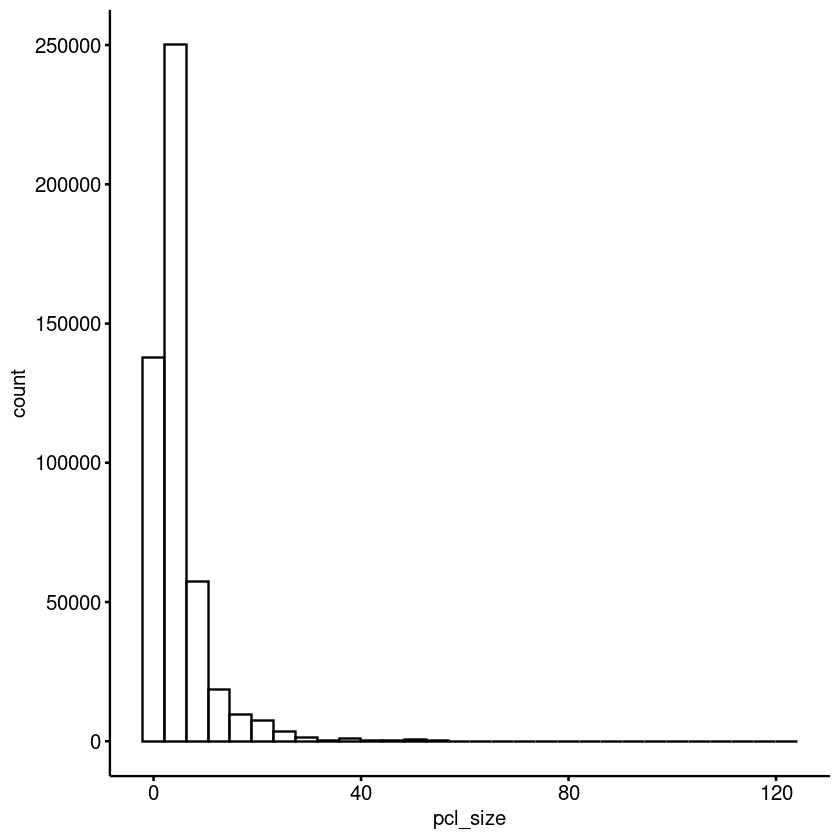

Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


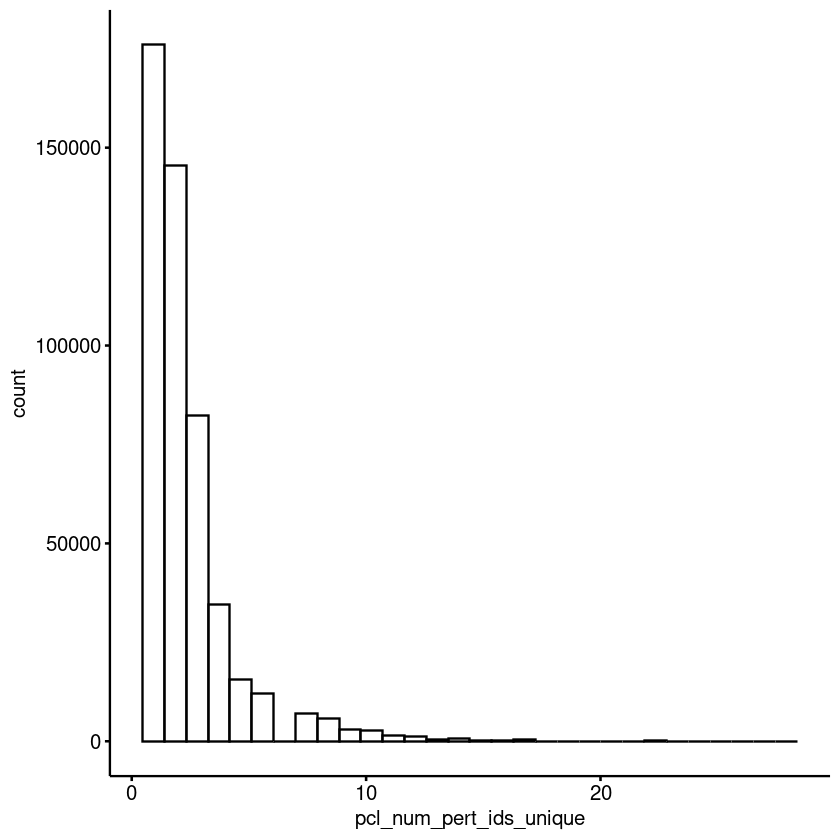

Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


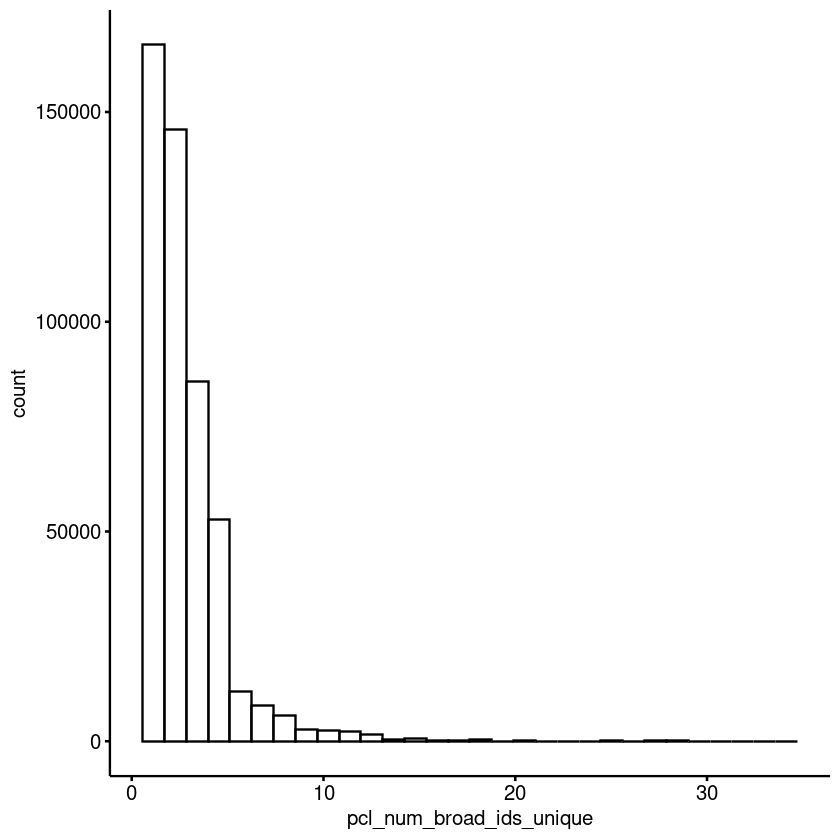

Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


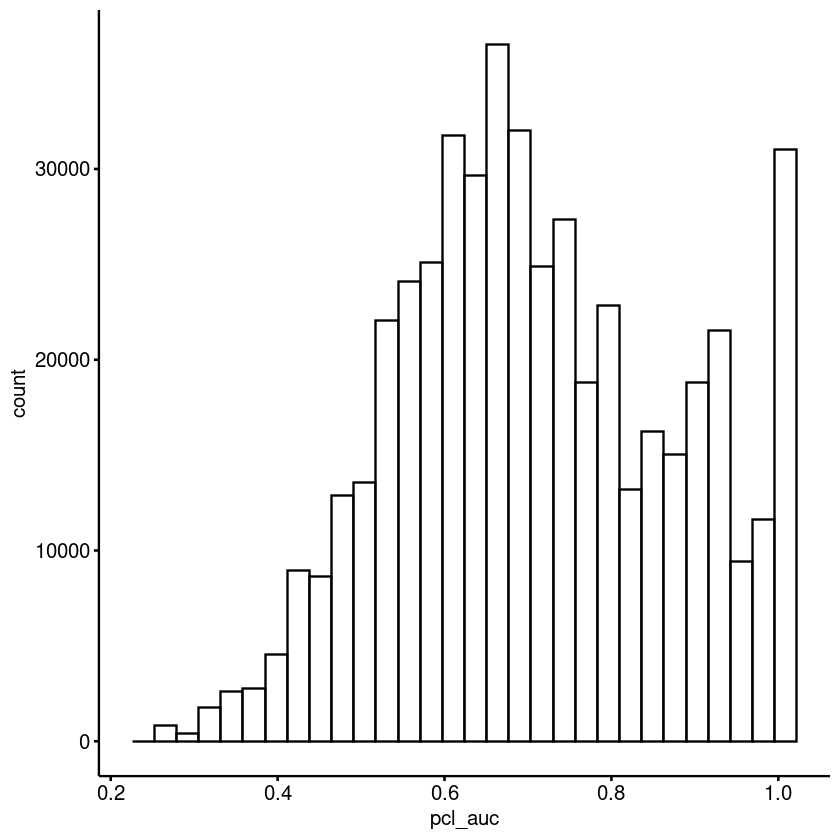

Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


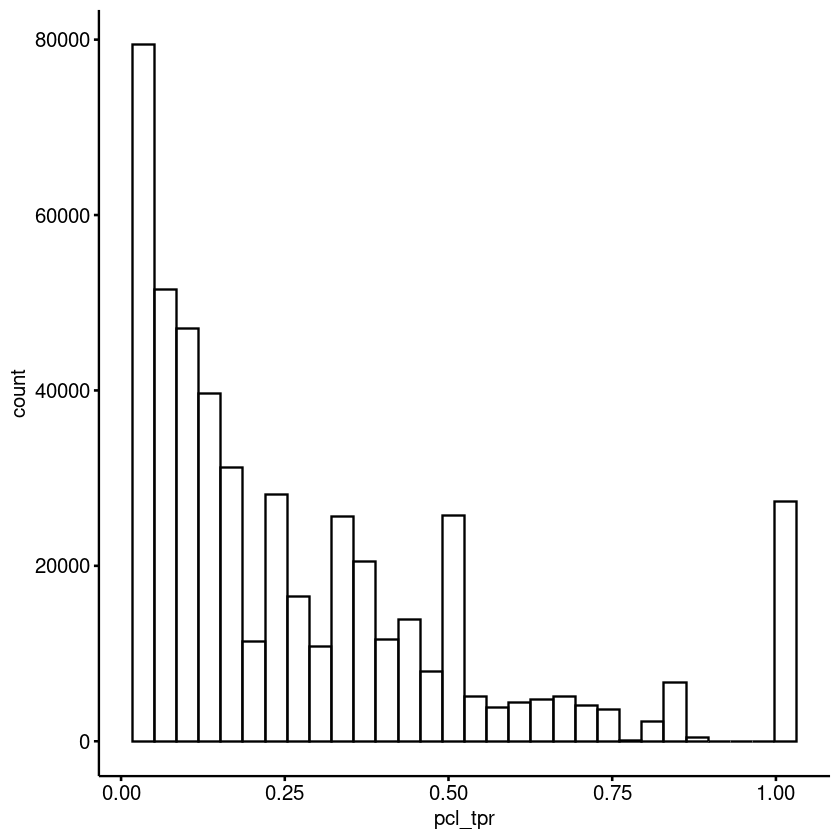

Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


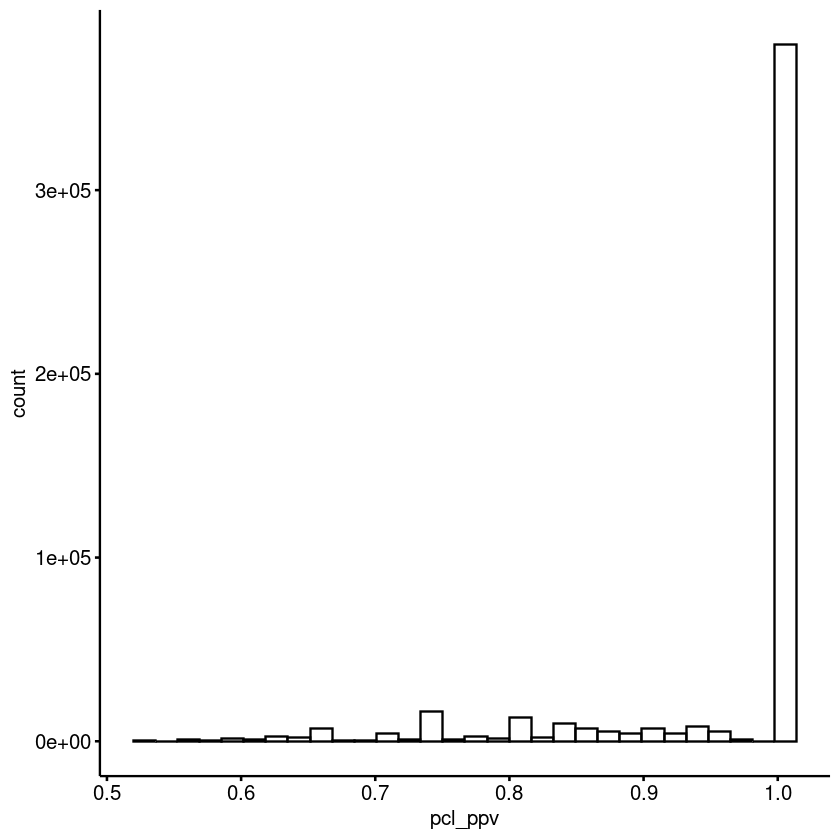

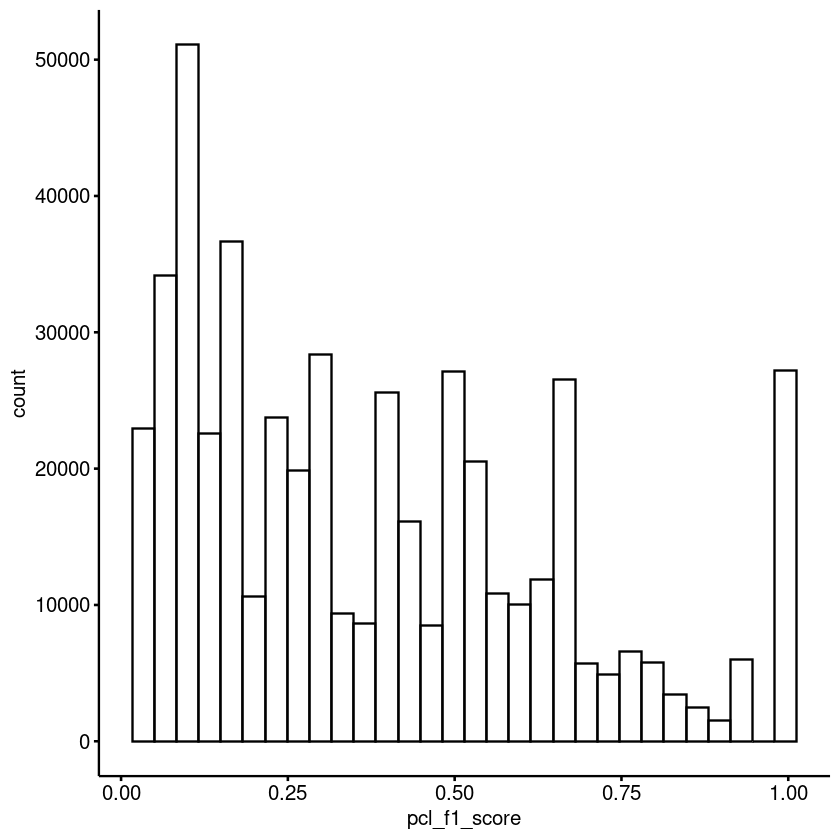

In [96]:
loocv_combined_opt_scores_tbls %>%
    summarize(
        n_distinct(loocv_pert_id)
    )

loocv_combined_opt_scores_tbls %>%
    janitor::tabyl(pcl_from_single_cmpd_moa)

loocv_combined_opt_scores_tbls %>%
    janitor::tabyl(pcl_multi_cmpd)

loocv_combined_opt_scores_tbls %>%
    janitor::tabyl(pcl_multi_cmpd_or_single_cmpd_moa)

gghistogram(loocv_combined_opt_scores_tbls, x = "pcl_size")

gghistogram(loocv_combined_opt_scores_tbls, x = "pcl_num_pert_ids_unique")

gghistogram(loocv_combined_opt_scores_tbls, x = "pcl_num_broad_ids_unique")

gghistogram(loocv_combined_opt_scores_tbls, x = "pcl_auc")

gghistogram(loocv_combined_opt_scores_tbls, x = "pcl_tpr")

gghistogram(loocv_combined_opt_scores_tbls, x = "pcl_ppv")

gghistogram(loocv_combined_opt_scores_tbls, x = "pcl_f1_score")

In [97]:
saveRDS(loocv_combined_opt_scores_tbls, 
        file.path(outdir, loocv_opt_tbl_combined_rds_savename))

### Read in and combine LOOCV results

In [98]:
### Combine LOOCV results in loop only

for(i in 1:nrow(kabx_pert_id_list_expect_loocv_data)){
    
    if(i %% 100 == 0){
        print(i)
        flush.console()  # Force the output to be printed immediately
    }
    
    this_loocv_cmpd = kabx_pert_id_list_expect_loocv_data$kabx_cmpd[i]
    this_full_model_path = kabx_pert_id_list_expect_loocv_data$loocv_full_model_path[i]
    this_loocv_cmpd_results_path = kabx_pert_id_list_expect_loocv_data$loocv_cmpd_results_path[i]
    
    if(!kabx_pert_id_list_expect_loocv_data$pcls_exist[i] | !kabx_pert_id_list_expect_loocv_data$full_model_exist[i] | !kabx_pert_id_list_expect_loocv_data$loocv_cmpd_results_exist[i]){
        print(str_c("Skipping: ", this_loocv_cmpd, " does not exist"))
        next
    }
    
    this_loocv_cmpd_results = read.delim(this_loocv_cmpd_results_path)

    dim(this_loocv_cmpd_results)

    check_loocv_results_only_loocv_cmpd = all(this_loocv_cmpd == this_loocv_cmpd_results$pert_id)
    check_if_possible_pcl_matches_for_loocv_cmpd = any(this_loocv_cmpd_results$pcl_and_moa_agree == 1)

    if(!check_loocv_results_only_loocv_cmpd ){
        stop(str_c(this_loocv_cmpd, " is not only compound in its loocv results"))
    }

    kabx_pert_id_list_expect_loocv_data$possible_pcl_matches_in_loocv[i] = check_if_possible_pcl_matches_for_loocv_cmpd

    loocv_combined_results = bind_rows(loocv_combined_results, this_loocv_cmpd_results)
    
}

[1] 100
[1] 200
[1] 300
[1] 400


In [99]:
dim(loocv_combined_results)
head(loocv_combined_results)

[1] 10519174       11

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,30S ribosome
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392076,0.2822036,0,0.05542725,30S ribosome:group1,30S ribosome
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,30S ribosome
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105439,0.6339073,0,0.05747126,30S ribosome:group1,30S ribosome
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,30S ribosome
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,30S ribosome


In [100]:
saveRDS(loocv_combined_results, 
        file.path(outdir, loocv_test_cmpd_results_combined_rds_savename))

## Summarize compound activity, if well-represented in KABX based on full dataset PCL membership info, and if validatable in LOOCV (from an annotated MOA with more than 1 compound)
Read-in compound activity, full dataset PCL membership info, and if validatable in LOOCV (more than 1 compound MOA)

### Read-in col_meta_kabx_for_pcls file to identify compounds whose annotated MOAs are only represented by themselves (a single compound) and therefore can't be predicted accurately in LOOCV

In [101]:
col_meta_kabx_for_pcls_tbl = read.delim(col_meta_kabx_for_pcls_path)

dim(col_meta_kabx_for_pcls_tbl)
head(col_meta_kabx_for_pcls_tbl)

[1] 11081    22

,cid,broad_id,canonical_smiles,pert_class,pert_dose,pert_id,pert_id_pubchem_cid,pert_idose,pert_idose_tickl,pert_iname,...,proj_broad_id,project_id,target_description,target_description_long,target_pathway,target_process,trt_id,x_csv_broad_id,x_subproject_id,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,kabx2:BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.0975,BRD-A05468928,60021,0.097500uM,0.0975uM,temafloxacin,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A05468928-003-01-4,screen4wk_screen5wk_tbda1_kabx2,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,kabx2,GyrAB
2,screen6:BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.0975,BRD-A05468928,60021,0.097500uM,NA,temafloxacin,...,screen6:BRD-A05468928-003-01-4,screen6,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB
3,kabx2:BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.1955,BRD-A05468928,60021,0.195500uM,0.1955uM,temafloxacin,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A05468928-003-01-4,screen4wk_screen5wk_tbda1_kabx2,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,kabx2,GyrAB
4,screen6:BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.1955,BRD-A05468928,60021,0.195500uM,NA,temafloxacin,...,screen6:BRD-A05468928-003-01-4,screen6,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB
5,kabx2:BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.3905,BRD-A05468928,60021,0.390500uM,0.3905uM,temafloxacin,...,screen4wk_screen5wk_tbda1_kabx2:BRD-A05468928-003-01-4,screen4wk_screen5wk_tbda1_kabx2,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,kabx2,GyrAB
6,screen6:BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.3905,BRD-A05468928,60021,0.390500uM,NA,temafloxacin,...,screen6:BRD-A05468928-003-01-4,screen6,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB


In [102]:
pcl_moa_num_kabx_cmpds_tbl <- col_meta_kabx_for_pcls_tbl %>%
    group_by(pcl_desc) %>%
    summarize(
        num_cmpds_with_annotated_moa = n_distinct(pert_id),
        pcl_moa_validatable_in_loocv = num_cmpds_with_annotated_moa > 1
    ) %>% ungroup()

pcl_moa_num_kabx_cmpds_tbl

pcl_moas_more_than_one_cmpd <- pcl_moa_num_kabx_cmpds_tbl %>%
    filter(num_cmpds_with_annotated_moa > 1) %>% pull(pcl_desc)

pcl_moas_single_cmpd <- pcl_moa_num_kabx_cmpds_tbl %>%
    filter(num_cmpds_with_annotated_moa == 1) %>% pull(pcl_desc)

length(pcl_moas_more_than_one_cmpd)
length(pcl_moas_single_cmpd)

pcl_desc,num_cmpds_with_annotated_moa,pcl_moa_validatable_in_loocv
<chr>,<int>,<lgl>
30S ribosome,25,TRUE
50S ribosome,34,TRUE
ATP synthase,1,FALSE
AccD6,4,TRUE
Alr,17,TRUE
CoaA and PyrG,6,TRUE
CoaBC,2,TRUE
CydAB,3,TRUE
Cyp121,3,TRUE


[1] 49

[1] 22

In [103]:
dim(col_meta_kabx_for_pcls_tbl)

col_meta_kabx_for_pcls_tbl <- inner_join(col_meta_kabx_for_pcls_tbl,
           pcl_moa_num_kabx_cmpds_tbl)

dim(col_meta_kabx_for_pcls_tbl)
head(col_meta_kabx_for_pcls_tbl)

[1] 11081    22

Joining with `by = join_by(pcl_desc)`


[1] 11081    24

,cid,broad_id,canonical_smiles,pert_class,pert_dose,pert_id,pert_id_pubchem_cid,pert_idose,pert_idose_tickl,pert_iname,...,target_description,target_description_long,target_pathway,target_process,trt_id,x_csv_broad_id,x_subproject_id,pcl_desc,num_cmpds_with_annotated_moa,pcl_moa_validatable_in_loocv
,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<lgl>
1,kabx2:BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.0975,BRD-A05468928,60021,0.097500uM,0.0975uM,temafloxacin,...,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,kabx2,GyrAB,53,TRUE
2,screen6:BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.0975,BRD-A05468928,60021,0.097500uM,NA,temafloxacin,...,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB,53,TRUE
3,kabx2:BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.1955,BRD-A05468928,60021,0.195500uM,0.1955uM,temafloxacin,...,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,kabx2,GyrAB,53,TRUE
4,screen6:BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.1955,BRD-A05468928,60021,0.195500uM,NA,temafloxacin,...,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB,53,TRUE
5,kabx2:BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.3905,BRD-A05468928,60021,0.390500uM,0.3905uM,temafloxacin,...,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,kabx2,GyrAB,53,TRUE
6,screen6:BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.3905,BRD-A05468928,60021,0.390500uM,NA,temafloxacin,...,GyrAB,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB,53,TRUE


In [104]:
dim(col_meta_kabx_for_pcls_tbl)

col_meta_kabx_for_pcls_tbl <- col_meta_kabx_for_pcls_tbl %>%
    group_by(pert_id) %>%
    mutate(
        cmpd_from_validatable_moa = any(pcl_moa_validatable_in_loocv)
    ) %>%
    ungroup()

dim(col_meta_kabx_for_pcls_tbl)
head(col_meta_kabx_for_pcls_tbl)

[1] 11081    24

[1] 11081    25

cid,broad_id,canonical_smiles,pert_class,pert_dose,pert_id,pert_id_pubchem_cid,pert_idose,pert_idose_tickl,pert_iname,...,target_description_long,target_pathway,target_process,trt_id,x_csv_broad_id,x_subproject_id,pcl_desc,num_cmpds_with_annotated_moa,pcl_moa_validatable_in_loocv,cmpd_from_validatable_moa
<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<lgl>,<lgl>
kabx2:BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.0975,BRD-A05468928,60021,0.097500uM,0.0975uM,temafloxacin,...,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,kabx2,GyrAB,53,TRUE,TRUE
screen6:BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.0975,BRD-A05468928,60021,0.097500uM,NA,temafloxacin,...,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.097500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB,53,TRUE,TRUE
kabx2:BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.1955,BRD-A05468928,60021,0.195500uM,0.1955uM,temafloxacin,...,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,kabx2,GyrAB,53,TRUE,TRUE
screen6:BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.1955,BRD-A05468928,60021,0.195500uM,NA,temafloxacin,...,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.195500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB,53,TRUE,TRUE
kabx2:BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.3905,BRD-A05468928,60021,0.390500uM,0.3905uM,temafloxacin,...,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,kabx2,GyrAB,53,TRUE,TRUE
screen6:BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,CC1CN(CCN1)c1cc2n(cc(C(O)=O)c(=O)c2cc1F)-c1ccc(F)cc1F,fluoroquinolone,0.3905,BRD-A05468928,60021,0.390500uM,NA,temafloxacin,...,DNA gyrase,DNA replication,DNA replication and repair,BRD-A05468928-003-01-4:0.390500uM,BRD-A05468928-003-01-4,tb_screen6,GyrAB,53,TRUE,TRUE


In [105]:
names(col_meta_kabx_for_pcls_tbl)

[1] "cid"                          "broad_id"                    
 [3] "canonical_smiles"             "pert_class"                  
 [5] "pert_dose"                    "pert_id"                     
 [7] "pert_id_pubchem_cid"          "pert_idose"                  
 [9] "pert_idose_tickl"             "pert_iname"                  
[11] "pert_reference"               "pert_type"                   
[13] "proj_broad_id"                "project_id"                  
[15] "target_description"           "target_description_long"     
[17] "target_pathway"               "target_process"              
[19] "trt_id"                       "x_csv_broad_id"              
[21] "x_subproject_id"              "pcl_desc"                    
[23] "num_cmpds_with_annotated_moa" "pcl_moa_validatable_in_loocv"
[25] "cmpd_from_validatable_moa"

In [106]:
col_meta_kabx_for_pcls_tbl %>%
    group_by(cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(pert_id)
    ) %>% 
    janitor::adorn_totals()

col_meta_kabx_for_pcls_tbl %>%
    filter(!cmpd_from_validatable_moa) %>%
    select(pert_id, pert_iname, target_description:target_process, pcl_desc) %>%
    distinct() %>%
    arrange(target_process, target_pathway, target_description)

cmpd_from_validatable_moa,n_distinct(pert_id)
<chr>,<int>
FALSE,19
TRUE,418
Total,437


pert_id,pert_iname,target_description,target_description_long,target_pathway,target_process,pcl_desc
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
BRD-K31740437,"[n-(5-(azepan-1-ylsulfonyl)-2-methoxyphenyl)-2-(4-oxo-3,4-dihydrophthalazin-1-yl)acetamide]",Fum,fumarate hydratase,TCA cycle,"carbon, amino acid, and cofactor metabolism",Fum
BRD-K54145401,LW6,Mdh,malate dehydrogenase,TCA cycle,"carbon, amino acid, and cofactor metabolism",Mdh
BRD-K99844592,BRD-4592,TrpAB,tryptophan synthase,amino acid synthesis,"carbon, amino acid, and cofactor metabolism",TrpAB
BRD-K52025859,V-12-007960,cAMP modulation,cholesterol metabolism,cholesterol metabolism,"carbon, amino acid, and cofactor metabolism",cAMP modulation
BRD-K05512067,8-hydroxyquinoline-2-carboxylic acid,Fba,"fructose 1,6-bisphosphate aldolase",glycolysis,"carbon, amino acid, and cofactor metabolism",Fba
BRD-K36292707,Fosmidomycin prodrug,Dxr,Dxr,isoprenoid biosynthesis,"carbon, amino acid, and cofactor metabolism",Dxr
BRD-K87317809,Redoxal,UppS,polyprenoid synthesis,isoprenoid biosynthesis,"carbon, amino acid, and cofactor metabolism",UppS
BRD-K93231391,Ethambutol,EmbABC,arabinosyl transferase,LAM/AG synthesis and transport,cell shape/integrity,EmbABC
BRD-K63343048,Orlistat|Tetrahydrolipstatin|THL|Alli,lipid esterases,lipid esterases,MA synthesis and transport,cell shape/integrity,lipid esterases


### Read-in compound activity (minimum strain curve-fit GR) RDS files at top concentration tested as well as at each concentration tested

In [107]:
any_dose_gr_tbl = readRDS(any_dose_gr_path)

dim(any_dose_gr_tbl)
head(any_dose_gr_tbl)

[1] 10819     9

cid,proj_broad_id,broad_id,pert_id,pert_dose,num_pert_doses,min_gr,gr_value,strain_id
<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>
kabx2:BRD-A03433762-001-01-3:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,BRD-A03433762-001-01-3,BRD-A03433762,0.09750,10,0.7872256,fitted,rplJ
kabx2:BRD-A03433762-001-01-3:0.195500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,BRD-A03433762-001-01-3,BRD-A03433762,0.19550,10,0.7489587,fitted,Rv0913c
kabx2:BRD-A03433762-001-01-3:0.390500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,BRD-A03433762-001-01-3,BRD-A03433762,0.39050,10,0.6952423,fitted,glcB
kabx2:BRD-A03433762-001-01-3:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,BRD-A03433762-001-01-3,BRD-A03433762,0.78125,10,0.6085899,fitted,glcB
kabx2:BRD-A03433762-001-01-3:1.562500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,BRD-A03433762-001-01-3,BRD-A03433762,1.56250,10,0.5221219,fitted,glcB
kabx2:BRD-A03433762-001-01-3:12.500000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,BRD-A03433762-001-01-3,BRD-A03433762,12.50000,10,0.2915181,fitted,rpoA


In [108]:
names(any_dose_gr_tbl)

[1] "cid"            "proj_broad_id"  "broad_id"       "pert_id"       
[5] "pert_dose"      "num_pert_doses" "min_gr"         "gr_value"      
[9] "strain_id"

In [109]:
max_dose_gr_tbl = readRDS(max_dose_gr_path)

dim(max_dose_gr_tbl)
head(max_dose_gr_tbl)

[1] 1141    9

cid,proj_broad_id,broad_id,pert_id,pert_dose,num_pert_doses,min_gr,gr_value,strain_id
<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>
tbda1:TCMDC-142807:100.000000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142807,TCMDC-142807,TCMDC-142807,100.00000,8,4.483312e-04,fitted,trpG
tbda1:TCMDC-143670:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143670,TCMDC-143670,TCMDC-143670,50.00000,8,-5.982078e-02,fitted,ppk1
tbda1:TCMDC-143688:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143688,TCMDC-143688,TCMDC-143688,50.00000,8,1.528112e-01,fitted,ppk1
tbda1:TCMDC-137799:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-137799,TCMDC-137799,TCMDC-137799,0.78125,8,1.554312e-15,fitted,mtrA
tbda1:TCMDC-143654:12.500000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143654,TCMDC-143654,TCMDC-143654,12.50000,8,-9.979261e-03,fitted,hemL
tbda1:TCMDC-142515:12.500000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142515,TCMDC-142515,TCMDC-142515,12.50000,8,0.000000e+00,fitted,rpmC


In [110]:
names(max_dose_gr_tbl)

[1] "cid"            "proj_broad_id"  "broad_id"       "pert_id"       
[5] "pert_dose"      "num_pert_doses" "min_gr"         "gr_value"      
[9] "strain_id"

In [111]:
any_dose_gr_tbl %>%
    filter(pert_id %in% kabx_pert_id_list$kabx_cmpd) %>%
    group_by(pert_id) %>%
    mutate(
        num_cids = n(),
        #highest_doses = paste0(signif(pert_dose, 3), collapse = '|'),
        min_gr_at_any_dose = min(min_gr, na.rm = TRUE),
        pert_id_only_weak_active_0.3_fit_gr_any_dose = min_gr_at_any_dose > 0.3,
        cid_is_min_gr_at_any_dose_dose = min_gr == min_gr_at_any_dose
    ) %>%
    filter(cid_is_min_gr_at_any_dose_dose) %>%
    select(
        cid, 
        pert_id,
        num_cids, 
        min_gr_at_any_dose,
        pert_id_only_weak_active_0.3_fit_gr_any_dose,
        cid_is_min_gr_at_any_dose_dose
    )

cid,pert_id,num_cids,min_gr_at_any_dose,pert_id_only_weak_active_0.3_fit_gr_any_dose,cid_is_min_gr_at_any_dose_dose
<chr>,<chr>,<int>,<dbl>,<lgl>,<lgl>
kabx2:BRD-A03433762-001-01-3:50.000000uM,BRD-A03433762,20,1.102390e-01,FALSE,TRUE
kabx2:BRD-A05468928-003-01-4:50.000000uM,BRD-A05468928,20,-6.892957e-02,FALSE,TRUE
kabx2:BRD-A07932845-050-17-4:50.000000uM,BRD-A07932845,20,-2.346957e-02,FALSE,TRUE
kabx2:BRD-A11805855-001-01-0:50.000000uM,BRD-A11805855,20,2.095548e-02,FALSE,TRUE
kabx2:BRD-A17655518-001-27-7:50.000000uM,BRD-A17655518,20,2.067006e-02,FALSE,TRUE
kabx2:BRD-A18840826-001-08-1:50.000000uM,BRD-A18840826,20,-3.533787e-02,FALSE,TRUE
kabx2:BRD-A22740840-003-07-7:50.000000uM,BRD-A22740840,20,1.692318e-01,FALSE,TRUE
kabx2:BRD-A24397426-001-12-0:50.000000uM,BRD-A24397426,20,-2.254003e-02,FALSE,TRUE
kabx2:BRD-A27303082-001-08-8:50.000000uM,BRD-A27303082,20,5.638773e-01,TRUE,TRUE


In [112]:
summ_pert_id_activity_any_dose = any_dose_gr_tbl %>%
    filter(pert_id %in% kabx_pert_id_list$kabx_cmpd) %>%
    group_by(pert_id) %>%
    summarise(
        num_cids = n(),
        #highest_doses = paste0(signif(pert_dose, 3), collapse = '|'),
        min_gr_at_any_dose = min(min_gr, na.rm = TRUE),
        pert_id_only_weak_active_0.3_fit_gr_any_dose = min_gr_at_any_dose > 0.3,
    ) #%>% arrange(desc(min_gr_at_highest_doses))

#summ_pert_id_activity_any_dose %>% janitor::tabyl(cmpd_from_validatable_moa)

summ_pert_id_activity_any_dose %>% janitor::tabyl(pert_id_only_weak_active_0.3_fit_gr_any_dose)

#summ_pert_id_activity_any_dose %>% janitor::tabyl(cmpd_from_validatable_moa, pert_id_only_weak_active_0.3_fit_gr)

pert_id_only_weak_active_0.3_fit_gr_any_dose,n,percent
<lgl>,<int>,<dbl>
FALSE,351,0.8032037
TRUE,86,0.1967963


In [113]:
dim(max_dose_gr_tbl)

max_dose_gr_tbl <- left_join(max_dose_gr_tbl,
          col_meta_kabx_for_pcls_tbl %>%
              select(pert_id, cmpd_from_validatable_moa) %>% distinct())

dim(max_dose_gr_tbl)
head(max_dose_gr_tbl, 20)

[1] 1141    9

Joining with `by = join_by(pert_id)`


[1] 1141   10

cid,proj_broad_id,broad_id,pert_id,pert_dose,num_pert_doses,min_gr,gr_value,strain_id,cmpd_from_validatable_moa
<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<lgl>
tbda1:TCMDC-142807:100.000000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142807,TCMDC-142807,TCMDC-142807,100.00000,8,4.483312e-04,fitted,trpG,NA
tbda1:TCMDC-143670:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143670,TCMDC-143670,TCMDC-143670,50.00000,8,-5.982078e-02,fitted,ppk1,NA
tbda1:TCMDC-143688:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143688,TCMDC-143688,TCMDC-143688,50.00000,8,1.528112e-01,fitted,ppk1,NA
tbda1:TCMDC-137799:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-137799,TCMDC-137799,TCMDC-137799,0.78125,8,1.554312e-15,fitted,mtrA,NA
tbda1:TCMDC-143654:12.500000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143654,TCMDC-143654,TCMDC-143654,12.50000,8,-9.979261e-03,fitted,hemL,NA
tbda1:TCMDC-142515:12.500000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142515,TCMDC-142515,TCMDC-142515,12.50000,8,0.000000e+00,fitted,rpmC,NA
tbda1:TCMDC-143662:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143662,TCMDC-143662,TCMDC-143662,3.12500,8,1.444533e-01,fitted,dxr,NA
tbda1:TCMDC-143656:100.000000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143656,TCMDC-143656,TCMDC-143656,100.00000,8,2.220446e-16,fitted,Rv1797,NA
tbda1:TCMDC-142455:6.250000uM,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142455,TCMDC-142455,TCMDC-142455,6.25000,8,7.150795e-02,fitted,dxr,NA


In [114]:
summ_pert_id_activity = max_dose_gr_tbl %>%
    #filter(pert_id %in% kabx_pert_id_list$kabx_cmpd) %>%
    group_by(pert_id, cmpd_from_validatable_moa) %>%
    mutate(
        num_proj_broad_id = n(),
        highest_doses = paste0(signif(pert_dose, 3), collapse = '|'),
        min_gr_at_highest_doses = min(min_gr, na.rm = TRUE),
        pert_id_only_weak_active_0.3_fit_gr = min_gr_at_highest_doses > 0.3,
        cid_is_min_gr_at_highest_doses_dose = min_gr == min_gr_at_highest_doses
    ) %>%
    filter(cid_is_min_gr_at_highest_doses_dose) %>%
    mutate(
        cid_with_min_gr_at_highest_dose = cid
    ) %>%
    select(
        cid_with_min_gr_at_highest_dose, 
        pert_id, cmpd_from_validatable_moa, 
        num_proj_broad_id, highest_doses, 
        min_gr_at_highest_doses,
        pert_id_only_weak_active_0.3_fit_gr#, cid_is_min_gr_at_highest_doses_dose
    )

summ_pert_id_activity %>%
    janitor::tabyl(cmpd_from_validatable_moa)

summ_pert_id_activity %>%
    janitor::tabyl(pert_id_only_weak_active_0.3_fit_gr)

summ_pert_id_activity %>%
    janitor::tabyl(cmpd_from_validatable_moa, pert_id_only_weak_active_0.3_fit_gr)

,cmpd_from_validatable_moa,n,percent,valid_percent
,<lgl>,<int>,<dbl>,<dbl>
1,FALSE,19,0.03109656,0.04347826
2,TRUE,418,0.68412439,0.95652174
3,NA,174,0.28477905,NA


pert_id_only_weak_active_0.3_fit_gr,n,percent
<lgl>,<int>,<dbl>
FALSE,511,0.8363339
TRUE,100,0.1636661


cmpd_from_validatable_moa,FALSE,TRUE
<lgl>,<dbl>,<dbl>
FALSE,14,5
TRUE,337,81
NA,160,14


In [115]:
summ_pert_id_activity

cid_with_min_gr_at_highest_dose,pert_id,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr
<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>
tbda1:TCMDC-142807:100.000000uM,TCMDC-142807,NA,1,100,4.483312e-04,FALSE
tbda1:TCMDC-143670:50.000000uM,TCMDC-143670,NA,1,50,-5.982078e-02,FALSE
tbda1:TCMDC-143688:50.000000uM,TCMDC-143688,NA,1,50,1.528112e-01,FALSE
tbda1:TCMDC-137799:0.781250uM,TCMDC-137799,NA,1,0.781,1.554312e-15,FALSE
tbda1:TCMDC-143654:12.500000uM,TCMDC-143654,NA,1,12.5,-9.979261e-03,FALSE
tbda1:TCMDC-142515:12.500000uM,TCMDC-142515,NA,1,12.5,0.000000e+00,FALSE
tbda1:TCMDC-143662:3.125000uM,TCMDC-143662,NA,1,3.12,1.444533e-01,FALSE
tbda1:TCMDC-143656:100.000000uM,TCMDC-143656,NA,1,100,2.220446e-16,FALSE
tbda1:TCMDC-142455:6.250000uM,TCMDC-142455,NA,1,6.25,7.150795e-02,FALSE


In [116]:
left_join(summ_pert_id_activity,
          summ_pert_id_activity_any_dose) %>%
    mutate(
        min_gr_any_and_highest_match = min_gr_at_highest_doses == min_gr_at_any_dose
    ) %>%
    arrange(min_gr_any_and_highest_match)

Joining with `by = join_by(pert_id)`


cid_with_min_gr_at_highest_dose,pert_id,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,num_cids,min_gr_at_any_dose,pert_id_only_weak_active_0.3_fit_gr_any_dose,min_gr_any_and_highest_match
<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>,<int>,<dbl>,<lgl>,<lgl>
screen6:BRD-A62336573-001-05-6:50.000000uM,BRD-A62336573,TRUE,2,50|50,5.779158e-01,TRUE,20,5.000000e-01,TRUE,FALSE
kabx2:BRD-A03433762-001-01-3:50.000000uM,BRD-A03433762,TRUE,2,50|50,1.102390e-01,FALSE,20,1.102390e-01,FALSE,TRUE
kabx2:BRD-A05468928-003-01-4:50.000000uM,BRD-A05468928,TRUE,2,50|50,-6.892957e-02,FALSE,20,-6.892957e-02,FALSE,TRUE
kabx2:BRD-A07932845-050-17-4:50.000000uM,BRD-A07932845,TRUE,2,50|50,-2.346957e-02,FALSE,20,-2.346957e-02,FALSE,TRUE
kabx2:BRD-A11805855-001-01-0:50.000000uM,BRD-A11805855,TRUE,2,50|50,2.095548e-02,FALSE,20,2.095548e-02,FALSE,TRUE
kabx2:BRD-A17655518-001-27-7:50.000000uM,BRD-A17655518,TRUE,2,50|50,2.067006e-02,FALSE,20,2.067006e-02,FALSE,TRUE
kabx2:BRD-A18840826-001-08-1:50.000000uM,BRD-A18840826,TRUE,2,50|50,-3.533787e-02,FALSE,20,-3.533787e-02,FALSE,TRUE
kabx2:BRD-A22740840-003-07-7:50.000000uM,BRD-A22740840,TRUE,2,50|50,1.692318e-01,FALSE,20,1.692318e-01,FALSE,TRUE
kabx2:BRD-A24397426-001-12-0:50.000000uM,BRD-A24397426,TRUE,2,50|50,-2.254003e-02,FALSE,20,-2.254003e-02,FALSE,TRUE


### Read-in full dataset PCL members table

In [117]:
pcl_members_table = read_csv(file.path(outdir, pcl_members_tbl_savename))

dim(pcl_members_table)
head(pcl_members_table)

Rows: 5847 Columns: 21
-- Column specification ------------------------------------------------------------------------------------------------------
Delimiter: ","
chr (11): rid, pcl_rid, pcl_desc, moa_class, cid, proj_broad_id, broad_id, p...
dbl  (9): pcl_cluster_size, pcl_moa_cluster_id, pert_dose, pcl_size, pcl_num...
lgl  (1): pcl_used_in_scoring_and_training

i Use `spec()` to retrieve the full column specification for this data.
i Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 5847   21

rid,pcl_used_in_scoring_and_training,pcl_rid,pcl_desc,moa_class,pcl_cluster_size,pcl_moa_cluster_id,cid,proj_broad_id,broad_id,...,pert_dose,pert_idose,project_id,x_subproject_id,pcl_size,pcl_num_proj_broad_ids_unique,pcl_num_broad_ids_unique,pcl_num_pert_ids_unique,pcl_num_project_ids_unique,pcl_num_x_subproject_ids_unique
<chr>,<lgl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,...,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K01825150-001-16-9:50.000000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,BRD-K01825150-001-16-9,...,50.00000,50.000000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-A62336573-001-05-6:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A62336573-001-05-6,BRD-A62336573-001-05-6,...,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:3.125000uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,...,3.12500,3.125000uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group1,TRUE,30S ribosome:group1,30S ribosome,30S ribosome,4,1,kabx2:BRD-K40939496-001-01-5:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,BRD-K40939496-001-01-5,...,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,4,3,3,3,1,1
30S ribosome:group4,TRUE,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A25492003-003-16-6:0.097500uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A25492003-003-16-6,BRD-A25492003-003-16-6,...,0.09750,0.097500uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1
30S ribosome:group4,TRUE,30S ribosome:group4,30S ribosome,30S ribosome,2,4,kabx2:BRD-A22740840-003-07-7:0.781250uM,screen4wk_screen5wk_tbda1_kabx2:BRD-A22740840-003-07-7,BRD-A22740840-003-07-7,...,0.78125,0.781250uM,screen4wk_screen5wk_tbda1_kabx2,kabx2,2,2,2,2,1,1


In [118]:
pcl_members_table <- pcl_members_table %>%
    #filter(pcl_cluster_size > 1)
    filter(pcl_used_in_scoring_and_training)

dim(pcl_members_table)

pcl_members_table %>%
    summarize(
        n_distinct(rid), 
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] 5847   21

n_distinct(rid),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>
1140,422,488,889,5134


In [119]:
names(pcl_members_table)

[1] "rid"                              "pcl_used_in_scoring_and_training"
 [3] "pcl_rid"                          "pcl_desc"                        
 [5] "moa_class"                        "pcl_cluster_size"                
 [7] "pcl_moa_cluster_id"               "cid"                             
 [9] "proj_broad_id"                    "broad_id"                        
[11] "pert_id"                          "pert_dose"                       
[13] "pert_idose"                       "project_id"                      
[15] "x_subproject_id"                  "pcl_size"                        
[17] "pcl_num_proj_broad_ids_unique"    "pcl_num_broad_ids_unique"        
[19] "pcl_num_pert_ids_unique"          "pcl_num_project_ids_unique"      
[21] "pcl_num_x_subproject_ids_unique"

In [120]:
pcl_members_table %>%
    select(rid, pcl_size) %>% distinct() %>%
    summarise(
        min_pcl_size = min(pcl_size),
        median_pcl_size = median(pcl_size),
        max_pcl_size = max(pcl_size)
    )

min_pcl_size,median_pcl_size,max_pcl_size
<dbl>,<dbl>,<dbl>
2,3.5,51


In [121]:
pcl_members_table %>%
    filter(pcl_num_pert_ids_unique > 1) %>%
    summarize(
        n_distinct(rid), 
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

pert_ids_in_multi_cmpd_pcl = pcl_members_table %>%
    filter(pcl_num_pert_ids_unique > 1) %>%
    pull(pert_id) %>% unique()

length(pert_ids_in_multi_cmpd_pcl)

n_distinct(rid),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>
730,378,439,774,4030


[1] 378

In [122]:
head(summ_pert_id_activity)

cid_with_min_gr_at_highest_dose,pert_id,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr
<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>
tbda1:TCMDC-142807:100.000000uM,TCMDC-142807,NA,1,100,4.483312e-04,FALSE
tbda1:TCMDC-143670:50.000000uM,TCMDC-143670,NA,1,50,-5.982078e-02,FALSE
tbda1:TCMDC-143688:50.000000uM,TCMDC-143688,NA,1,50,1.528112e-01,FALSE
tbda1:TCMDC-137799:0.781250uM,TCMDC-137799,NA,1,0.781,1.554312e-15,FALSE
tbda1:TCMDC-143654:12.500000uM,TCMDC-143654,NA,1,12.5,-9.979261e-03,FALSE
tbda1:TCMDC-142515:12.500000uM,TCMDC-142515,NA,1,12.5,0.000000e+00,FALSE


In [123]:
summ_pert_id_activity <- summ_pert_id_activity %>%
    mutate(
        pert_id_in_multi_cmpd_pcl = pert_id %in% pert_ids_in_multi_cmpd_pcl
    )

head(summ_pert_id_activity)

summ_pert_id_activity %>%
    janitor::tabyl(cmpd_from_validatable_moa, pert_id_in_multi_cmpd_pcl)

summ_pert_id_activity %>%
    janitor::tabyl(pert_id_only_weak_active_0.3_fit_gr, pert_id_in_multi_cmpd_pcl)

cid_with_min_gr_at_highest_dose,pert_id,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl
<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>,<lgl>
tbda1:TCMDC-142807:100.000000uM,TCMDC-142807,NA,1,100,4.483312e-04,FALSE,FALSE
tbda1:TCMDC-143670:50.000000uM,TCMDC-143670,NA,1,50,-5.982078e-02,FALSE,FALSE
tbda1:TCMDC-143688:50.000000uM,TCMDC-143688,NA,1,50,1.528112e-01,FALSE,FALSE
tbda1:TCMDC-137799:0.781250uM,TCMDC-137799,NA,1,0.781,1.554312e-15,FALSE,FALSE
tbda1:TCMDC-143654:12.500000uM,TCMDC-143654,NA,1,12.5,-9.979261e-03,FALSE,FALSE
tbda1:TCMDC-142515:12.500000uM,TCMDC-142515,NA,1,12.5,0.000000e+00,FALSE,FALSE


cmpd_from_validatable_moa,FALSE,TRUE
<lgl>,<dbl>,<dbl>
FALSE,19,0
TRUE,40,378
NA,174,0


pert_id_only_weak_active_0.3_fit_gr,FALSE,TRUE
<lgl>,<dbl>,<dbl>
FALSE,196,315
TRUE,37,63


## Assess accuracy of PCL-based MOA Predictions on KABX compounds in full model (fit to data/training) and in LOOCV

### Full model

In [124]:
full_model <- pcl_similarity_to_confidence_score_tbl

dim(full_model)
head(full_model)

[1] 10746780       12

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc,moa_is_separable
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<lgl>
1,kabx2:BRD-K40939496-001-01-5:0.781250uM,BRD-K40939496,BRD-K40939496-001-01-5,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,30S ribosome,0.2390148,0.113592300,1,1.0000000,30S ribosome:group1,30S ribosome,TRUE
2,kabx2:BRD-K01825150-001-16-9:50.000000uM,BRD-K01825150,BRD-K01825150-001-16-9,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,30S ribosome,0.2180246,-0.112830000,1,1.0000000,30S ribosome:group1,30S ribosome,TRUE
3,kabx2:BRD-K87226815-001-22-1:0.390500uM,BRD-K87226815,BRD-K87226815-001-22-1,screen4wk_screen5wk_tbda1_kabx2:BRD-K87226815-001-22-1,Alr|DdlA,0.2046049,0.079127390,0,0.6666667,30S ribosome:group1,30S ribosome,TRUE
4,kabx2:BRD-K40154364-001-01-0:0.097500uM,BRD-K40154364,BRD-K40154364-001-01-0,screen4wk_screen5wk_tbda1_kabx2:BRD-K40154364-001-01-0,QcrB,0.1954231,0.005037786,0,0.5000000,30S ribosome:group1,30S ribosome,TRUE
5,kabx2:BRD-K17583151-001-07-3:50.000000uM,BRD-K17583151,BRD-K17583151-001-07-3,screen4wk_screen5wk_tbda1_kabx2:BRD-K17583151-001-07-3,MbtI,0.1939673,0.122491500,0,0.4000000,30S ribosome:group1,30S ribosome,TRUE
6,kabx2:BRD-K63343048-001-14-8:0.195500uM,BRD-K63343048,BRD-K63343048-001-14-8,screen4wk_screen5wk_tbda1_kabx2:BRD-K63343048-001-14-8,lipid esterases,0.1881792,0.061349820,0,0.3333333,30S ribosome:group1,30S ribosome,TRUE


In [125]:
dim(full_model)

dim(inner_join(full_model, summ_pert_id_activity, by = 'pert_id'))

full_model = inner_join(full_model, summ_pert_id_activity, by = 'pert_id')

dim(full_model)
head(full_model)

print("All KABX compounds")
full_model %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA")
full_model %>%
    filter(cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA and active")
full_model %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA, active, and well-represented in KABX")
full_model %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] 10746780       12

[1] 10746780       19

[1] 10746780       19

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc,moa_is_separable,cid_with_min_gr_at_highest_dose,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<lgl>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>,<lgl>
1,kabx2:BRD-K40939496-001-01-5:0.781250uM,BRD-K40939496,BRD-K40939496-001-01-5,screen4wk_screen5wk_tbda1_kabx2:BRD-K40939496-001-01-5,30S ribosome,0.2390148,0.113592300,1,1.0000000,30S ribosome:group1,30S ribosome,TRUE,screen6:BRD-K40939496-001-01-5:50.000000uM,TRUE,2,50|50,-0.06555496,FALSE,TRUE
2,kabx2:BRD-K01825150-001-16-9:50.000000uM,BRD-K01825150,BRD-K01825150-001-16-9,screen4wk_screen5wk_tbda1_kabx2:BRD-K01825150-001-16-9,30S ribosome,0.2180246,-0.112830000,1,1.0000000,30S ribosome:group1,30S ribosome,TRUE,kabx2:BRD-K01825150-001-16-9:50.000000uM,TRUE,2,50|50,0.18776370,FALSE,TRUE
3,kabx2:BRD-K87226815-001-22-1:0.390500uM,BRD-K87226815,BRD-K87226815-001-22-1,screen4wk_screen5wk_tbda1_kabx2:BRD-K87226815-001-22-1,Alr|DdlA,0.2046049,0.079127390,0,0.6666667,30S ribosome:group1,30S ribosome,TRUE,screen6:BRD-K87226815-001-22-1:50.000000uM,TRUE,3,50|12.5|50,0.43105250,TRUE,FALSE
4,kabx2:BRD-K40154364-001-01-0:0.097500uM,BRD-K40154364,BRD-K40154364-001-01-0,screen4wk_screen5wk_tbda1_kabx2:BRD-K40154364-001-01-0,QcrB,0.1954231,0.005037786,0,0.5000000,30S ribosome:group1,30S ribosome,TRUE,screen6:BRD-K40154364-001-01-0:50.000000uM,TRUE,2,50|50,0.02658708,FALSE,TRUE
5,kabx2:BRD-K17583151-001-07-3:50.000000uM,BRD-K17583151,BRD-K17583151-001-07-3,screen4wk_screen5wk_tbda1_kabx2:BRD-K17583151-001-07-3,MbtI,0.1939673,0.122491500,0,0.4000000,30S ribosome:group1,30S ribosome,TRUE,kabx2:BRD-K17583151-001-07-3:50.000000uM,TRUE,2,50|50,0.47625330,TRUE,FALSE
6,kabx2:BRD-K63343048-001-14-8:0.195500uM,BRD-K63343048,BRD-K63343048-001-14-8,screen4wk_screen5wk_tbda1_kabx2:BRD-K63343048-001-14-8,lipid esterases,0.1881792,0.061349820,0,0.3333333,30S ribosome:group1,30S ribosome,TRUE,screen6:BRD-K63343048-001-14-8:50.000000uM,FALSE,2,50|50,0.36321560,TRUE,FALSE


[1] "All KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1140,68,437,505,967,9427


[1] "In multi-compound MOA"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1140,68,418,483,924,9006


[1] "In multi-compound MOA and active"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1140,68,337,400,763,7427


[1] "In multi-compound MOA, active, and well-represented in KABX"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1140,68,315,378,721,7011


#### All KABX - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4454876"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.92708335"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "Full model accuracy on all KABX compounds (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 411"
[1] "Number of incorrect MOA assignments: 0"
[1] "Number of uncertain assignments: 26"
[1] "Precision (PPV): 1"
[1] "Sensitivity (TPR): 0.94"
[1] "F1 score: 0.97"
[1] "----------------------------------"


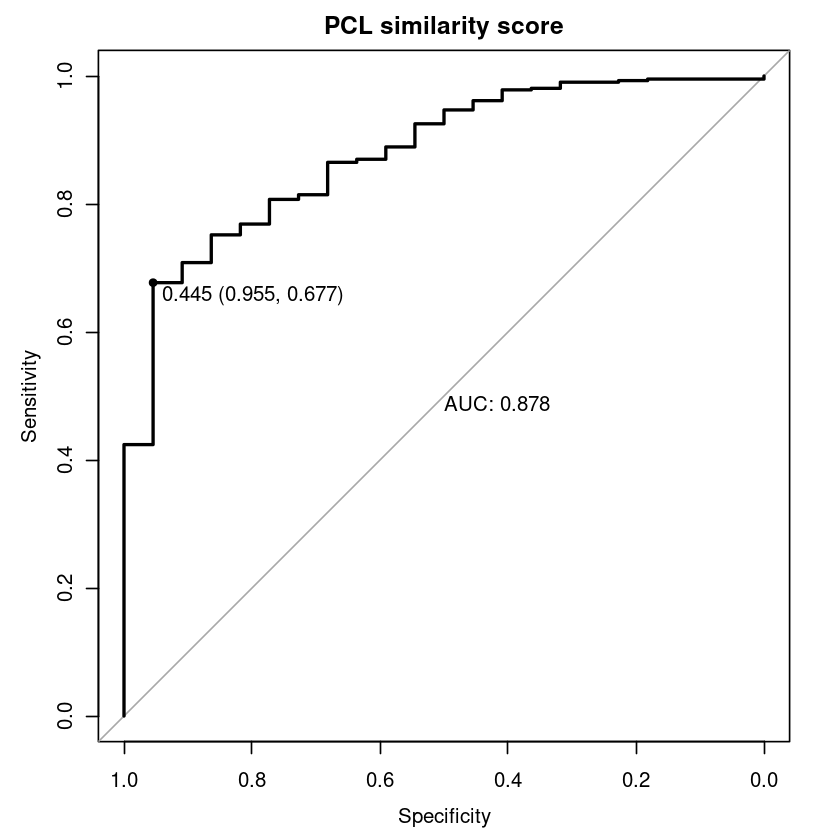

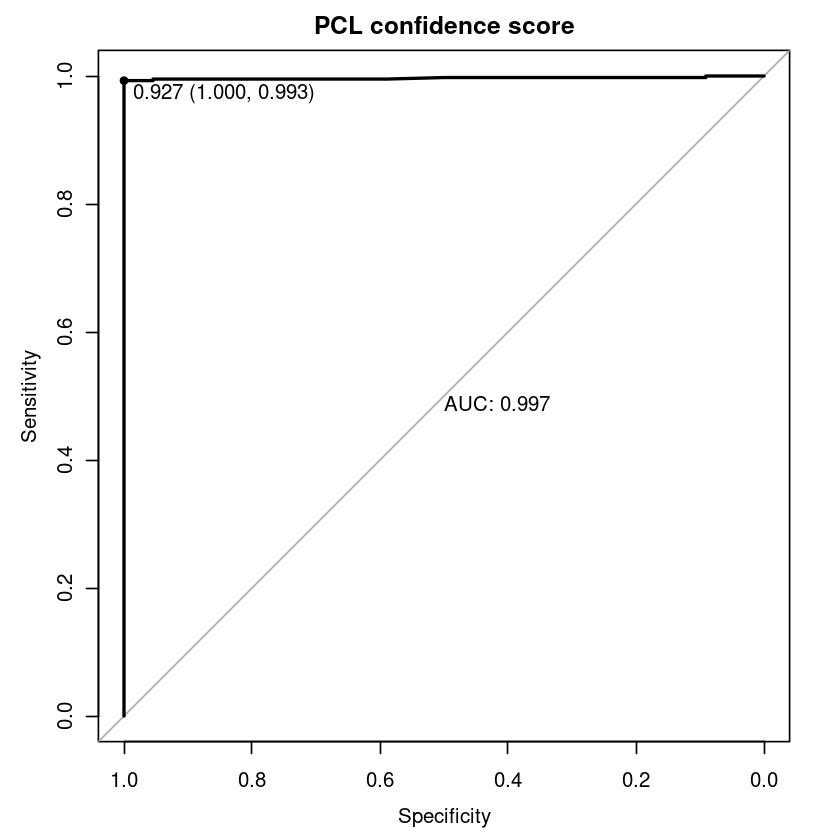

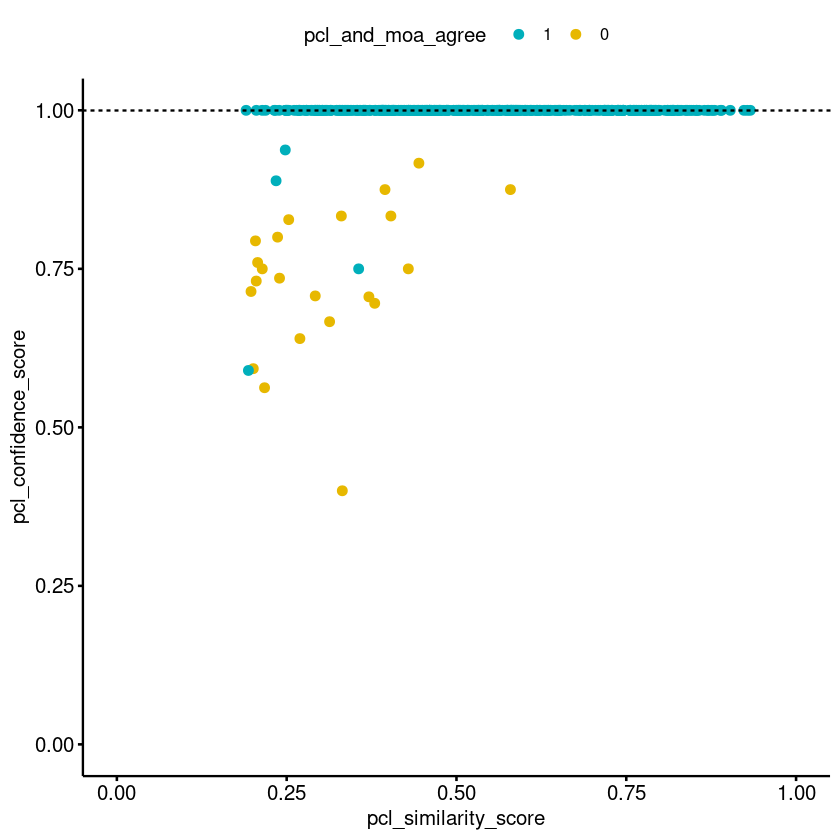

In [126]:
full_model_kabx_preds = full_model %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_similarity_score
actual <- full_model_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    full_model_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_confidence_score
actual <- full_model_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    full_model_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}

full_model_kabx_preds_results_n = nrow(full_model_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

full_model_kabx_preds_results_tp = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_fp = sum(full_model_kabx_preds$pcl_and_moa_agree == 0 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_tpr = full_model_kabx_preds_results_tp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_fpr = full_model_kabx_preds_results_fp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_ppv = full_model_kabx_preds_results_tp / sum(full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_f1 = calc_f1(full_model_kabx_preds_results_ppv, full_model_kabx_preds_results_tpr)
full_model_kabx_preds_results_fns = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_ns = sum(full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("Full model accuracy on all KABX compounds (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", full_model_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", full_model_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", full_model_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", full_model_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(full_model_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(full_model_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(full_model_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(full_model_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### All KABX - broad_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4454876"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.92708335"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "Full model accuracy on all batches of KABX compounds (broad_id)"
[1] "Total number of KABX compounds or treatments evaluated: 505"
[1] "Number of correct MOA assignments: 477"
[1] "Number of incorrect MOA assignments: 0"
[1] "Number of uncertain assignments: 28"
[1] "Precision (PPV): 1"
[1] "Sensitivity (TPR): 0.94"
[1] "F1 score: 0.97"
[1] "----------------------------------"


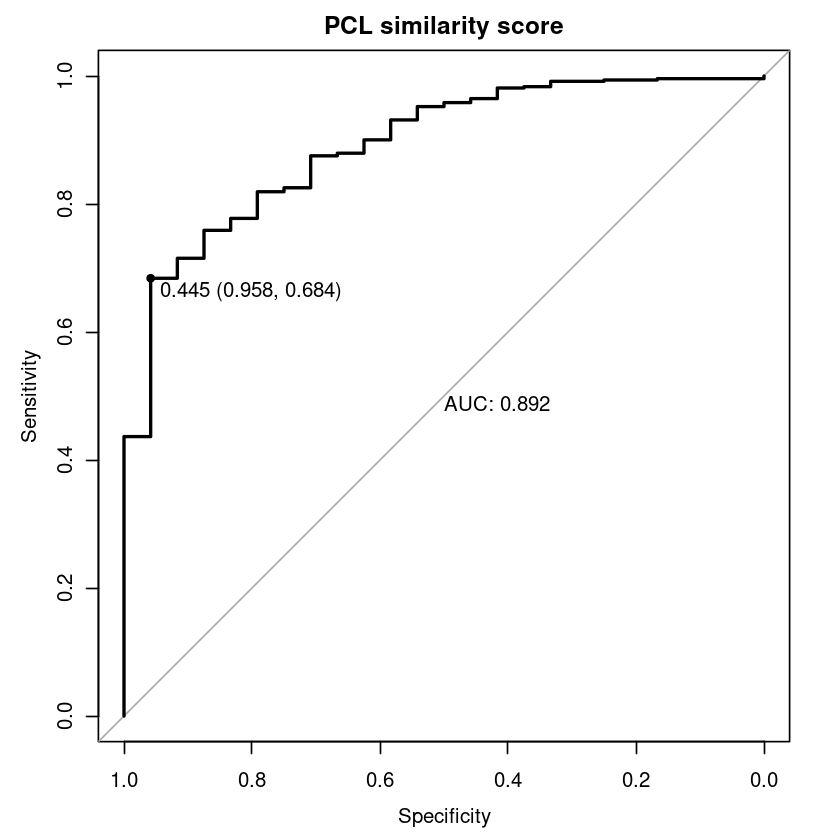

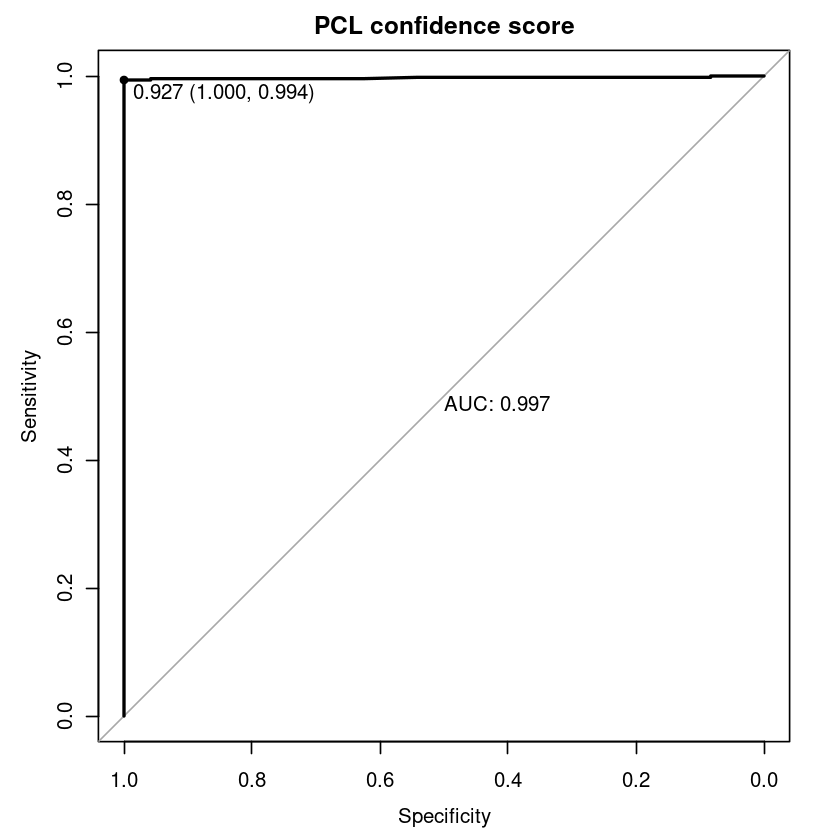

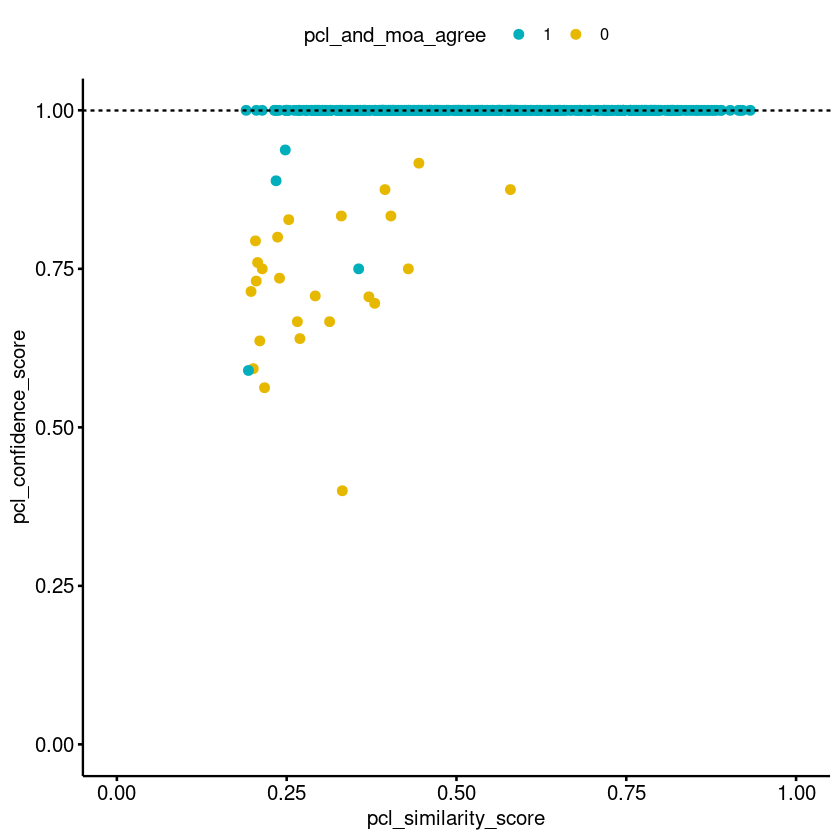

In [127]:
full_model_kabx_preds = full_model %>%
    group_by(broad_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(broad_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(broad_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_similarity_score
actual <- full_model_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    full_model_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_confidence_score
actual <- full_model_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    full_model_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}

full_model_kabx_preds_results_n = nrow(full_model_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

full_model_kabx_preds_results_tp = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_fp = sum(full_model_kabx_preds$pcl_and_moa_agree == 0 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_tpr = full_model_kabx_preds_results_tp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_fpr = full_model_kabx_preds_results_fp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_ppv = full_model_kabx_preds_results_tp / sum(full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_f1 = calc_f1(full_model_kabx_preds_results_ppv, full_model_kabx_preds_results_tpr)
full_model_kabx_preds_results_fns = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_ns = sum(full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("Full model accuracy on all batches of KABX compounds (broad_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", full_model_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", full_model_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", full_model_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", full_model_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(full_model_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(full_model_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(full_model_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(full_model_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### All KABX - proj_broad_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.3327313"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.95445135"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "Full model accuracy on all screening wave instances of batches of KABX compounds (proj_broad_id)"
[1] "Total number of KABX compounds or treatments evaluated: 967"
[1] "Number of correct MOA assignments: 850"
[1] "Number of incorrect MOA assignments: 0"
[1] "Number of uncertain assignments: 117"
[1] "Precision (PPV): 1"
[1] "Sensitivity (TPR): 0.88"
[1] "F1 score: 0.94"
[1] "----------------------------------"


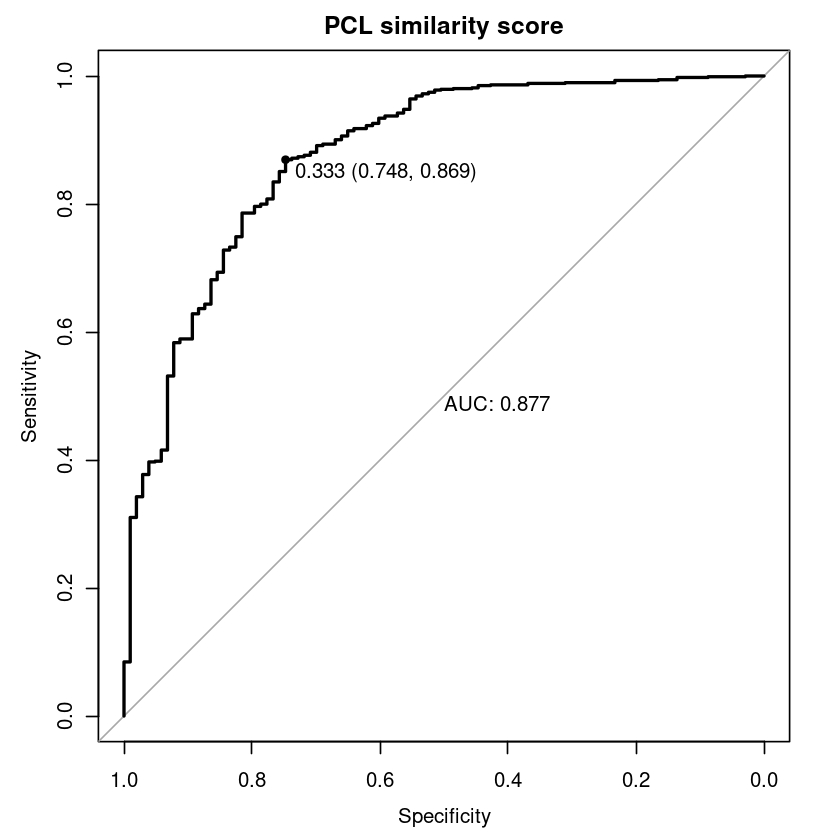

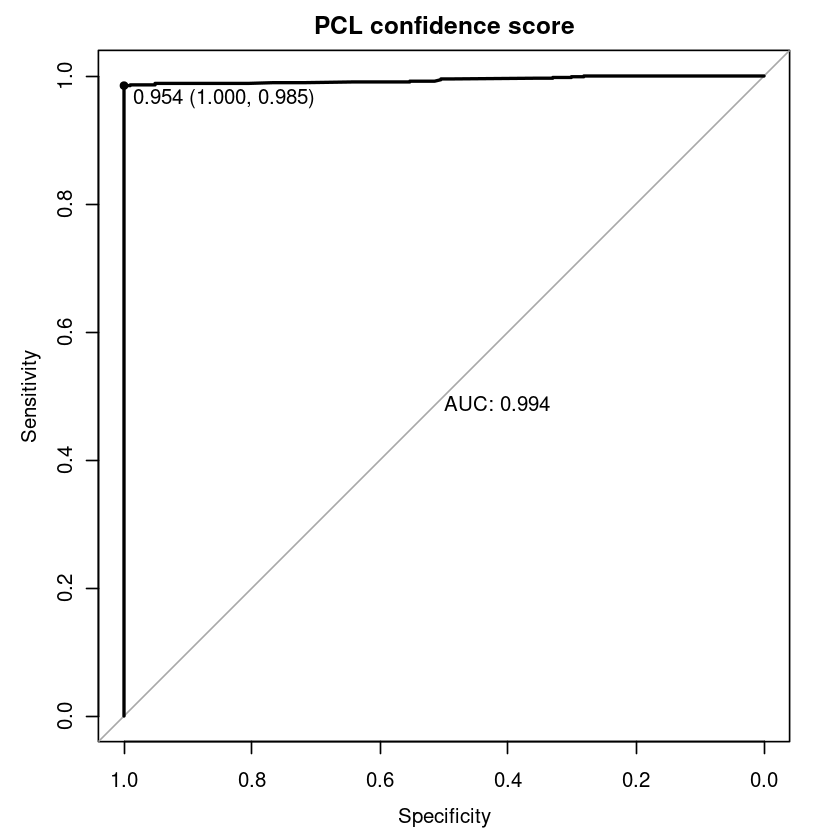

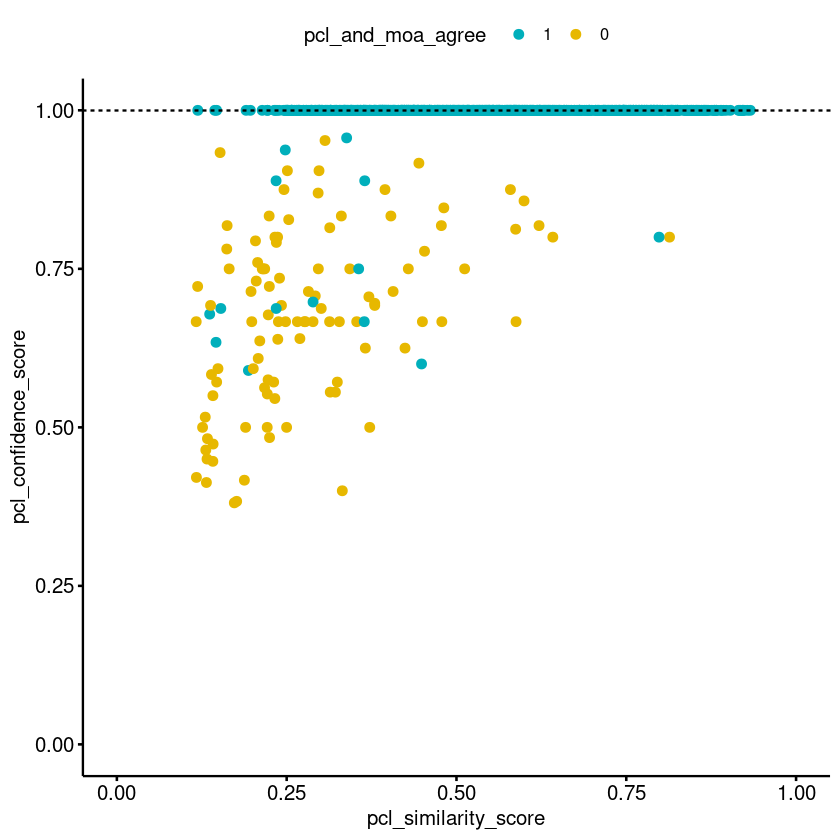

In [128]:
full_model_kabx_preds = full_model %>%
    group_by(proj_broad_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(proj_broad_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(proj_broad_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_similarity_score
actual <- full_model_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    full_model_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_confidence_score
actual <- full_model_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    full_model_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}

full_model_kabx_preds_results_n = nrow(full_model_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

full_model_kabx_preds_results_tp = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_fp = sum(full_model_kabx_preds$pcl_and_moa_agree == 0 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_tpr = full_model_kabx_preds_results_tp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_fpr = full_model_kabx_preds_results_fp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_ppv = full_model_kabx_preds_results_tp / sum(full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_f1 = calc_f1(full_model_kabx_preds_results_ppv, full_model_kabx_preds_results_tpr)
full_model_kabx_preds_results_fns = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_ns = sum(full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("Full model accuracy on all screening wave instances of batches of KABX compounds (proj_broad_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", full_model_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", full_model_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", full_model_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", full_model_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(full_model_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(full_model_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(full_model_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(full_model_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### All KABX - treatment/dsCGI profiles (cid)

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.27833585"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.9069264"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "Full model accuracy on all KABX treatments/dsCGI profiles (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 9427"
[1] "Number of correct MOA assignments: 3840"
[1] "Number of incorrect MOA assignments: 0"
[1] "Number of uncertain assignments: 5587"
[1] "Precision (PPV): 1"
[1] "Sensitivity (TPR): 0.41"
[1] "F1 score: 0.58"
[1] "----------------------------------"


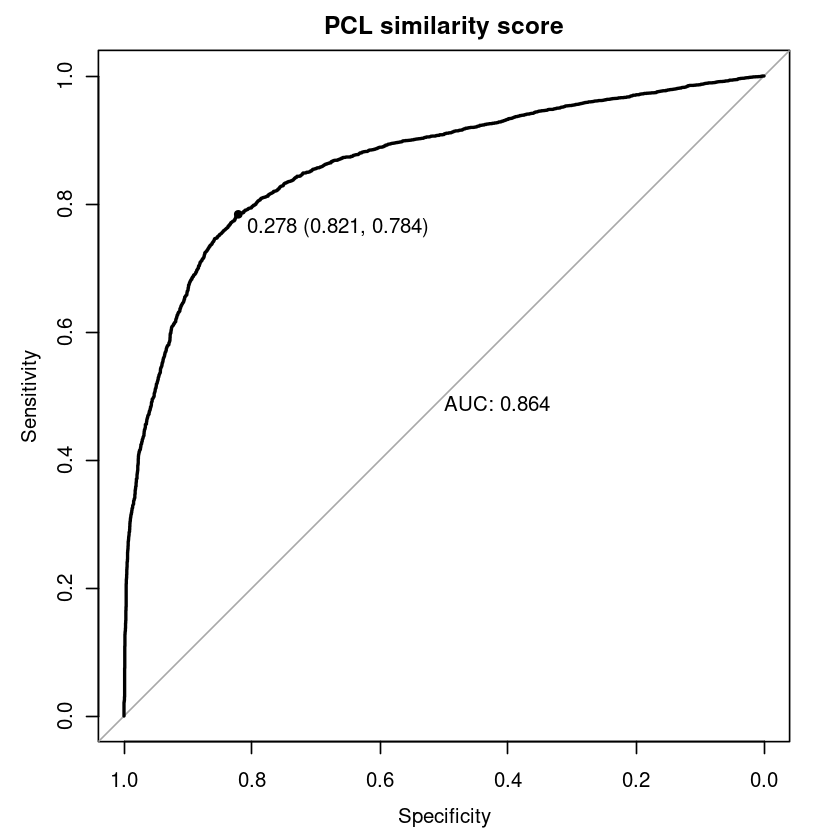

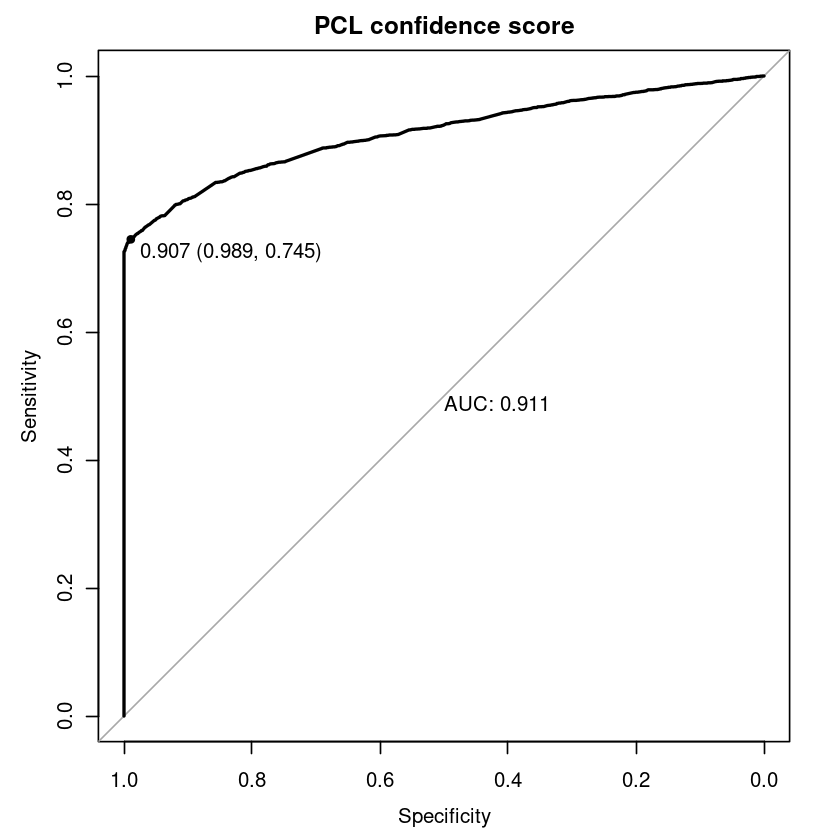

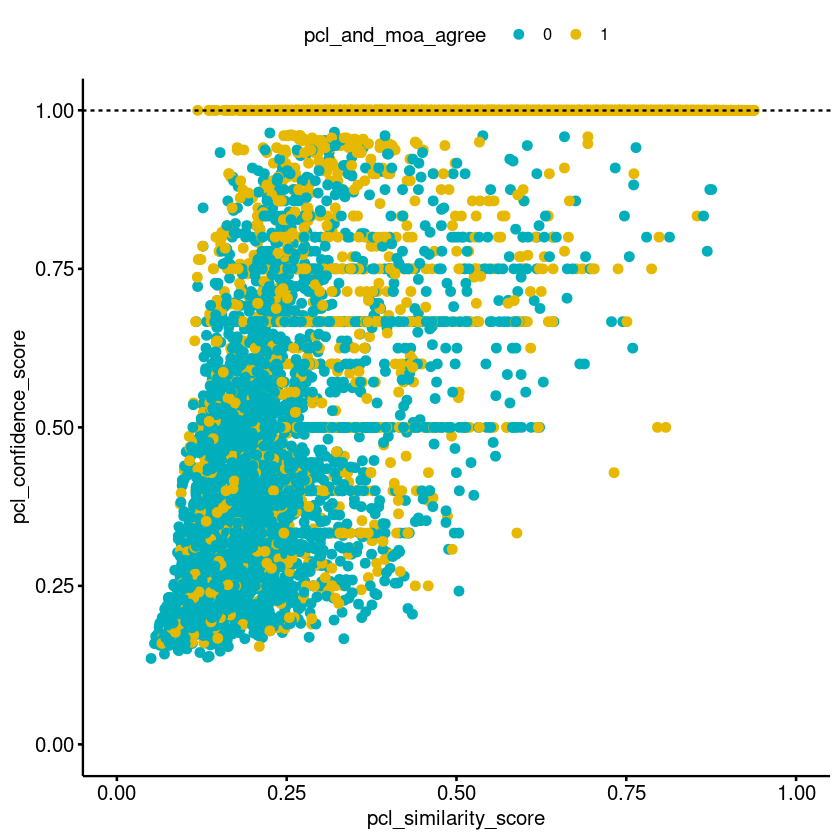

In [129]:
full_model_kabx_preds = full_model %>%
    group_by(cid) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(cid, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(cid) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_similarity_score
actual <- full_model_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    full_model_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_confidence_score
actual <- full_model_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    full_model_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}

full_model_kabx_preds_results_n = nrow(full_model_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

full_model_kabx_preds_results_tp = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_fp = sum(full_model_kabx_preds$pcl_and_moa_agree == 0 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_tpr = full_model_kabx_preds_results_tp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_fpr = full_model_kabx_preds_results_fp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_ppv = full_model_kabx_preds_results_tp / sum(full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_f1 = calc_f1(full_model_kabx_preds_results_ppv, full_model_kabx_preds_results_tpr)
full_model_kabx_preds_results_fns = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_ns = sum(full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("Full model accuracy on all KABX treatments/dsCGI profiles (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", full_model_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", full_model_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", full_model_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", full_model_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(full_model_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(full_model_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(full_model_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(full_model_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### All KABX - all treatment/dsCGI profile-PCL pairs

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.04258958"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.0778256"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "Full model accuracy on all KABX treatments/dsCGI profiles (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 10746780"
[1] "Number of correct MOA assignments: 11079"
[1] "Number of incorrect MOA assignments: 0"
[1] "Number of uncertain assignments: 10735701"
[1] "Precision (PPV): 1"
[1] "Sensitivity (TPR): 0.001"
[1] "F1 score: 0.002"
[1] "----------------------------------"


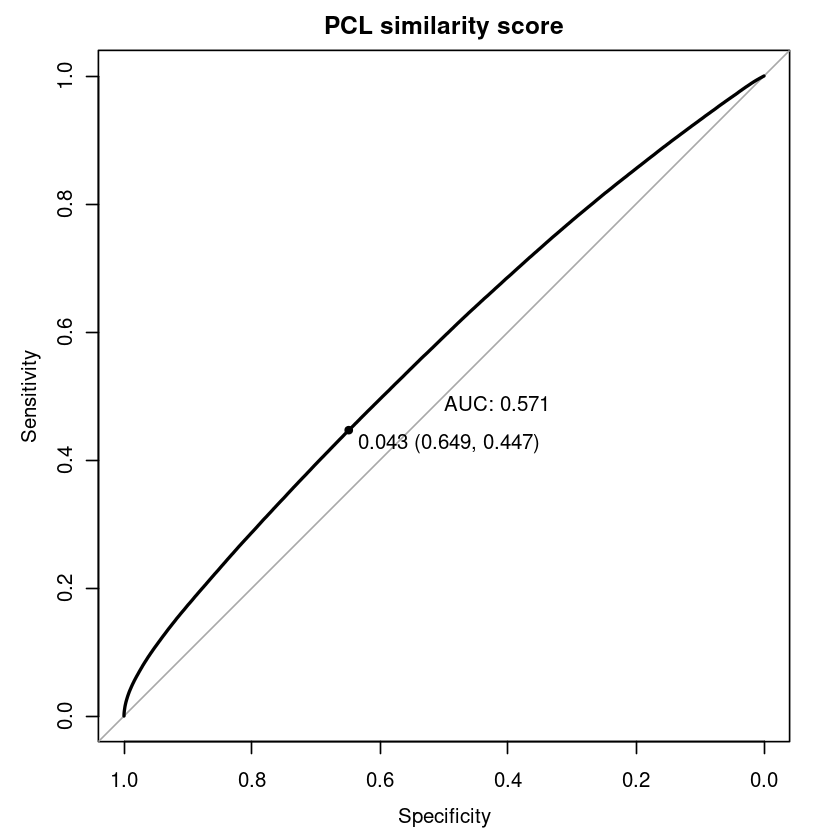

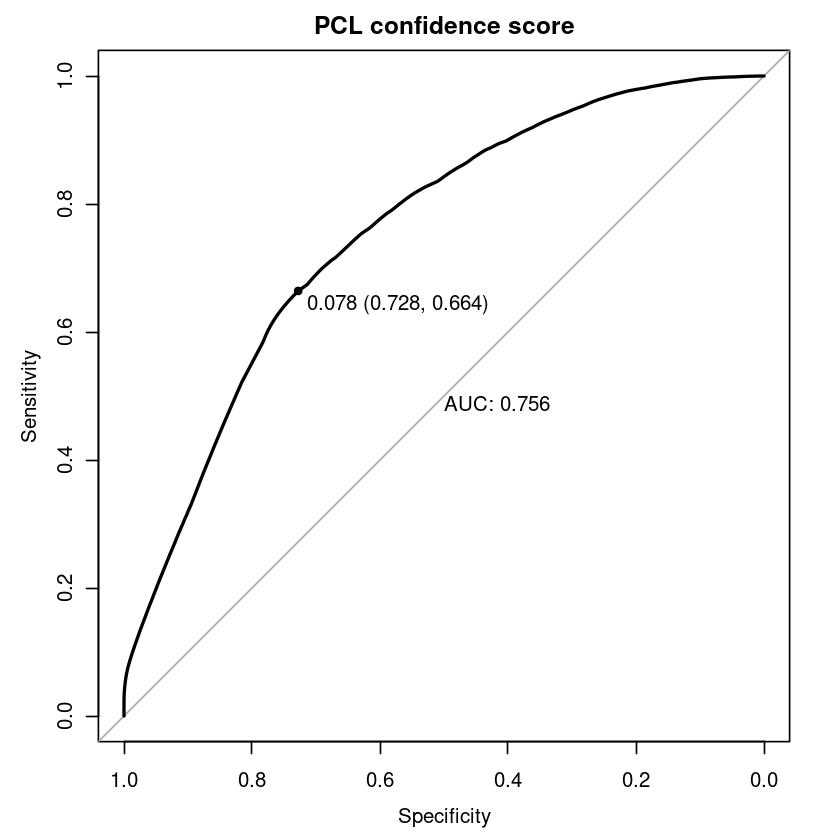

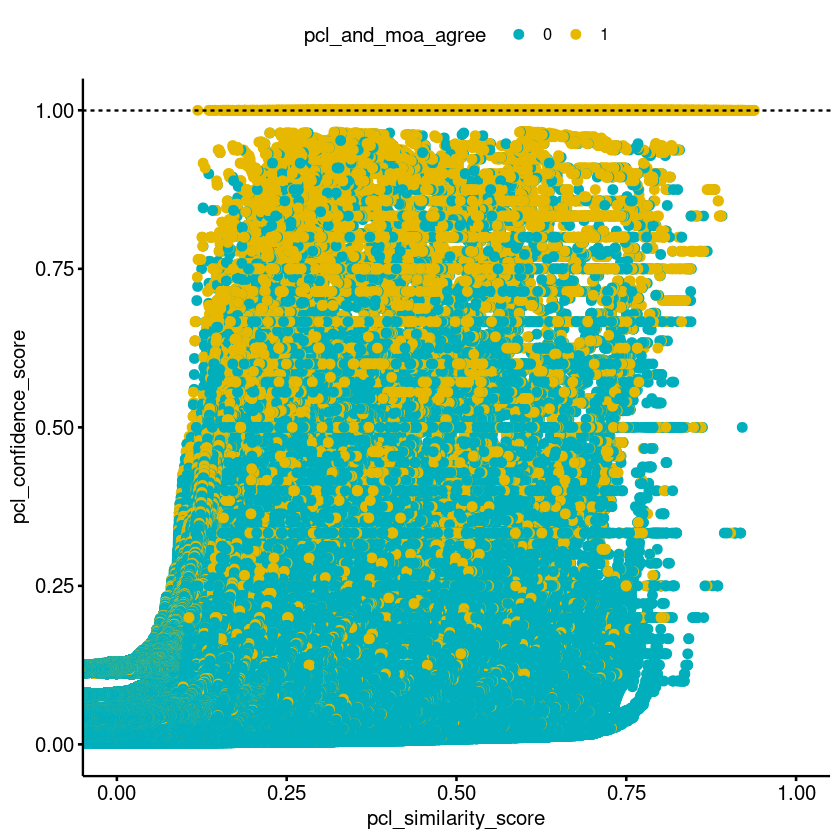

In [130]:
full_model_kabx_preds = full_model

### ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_similarity_score
actual <- full_model_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    full_model_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- full_model_kabx_preds$pcl_confidence_score
actual <- full_model_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    full_model_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}

full_model_kabx_preds_results_n = nrow(full_model_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

full_model_kabx_preds_results_tp = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_fp = sum(full_model_kabx_preds$pcl_and_moa_agree == 0 & full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_tpr = full_model_kabx_preds_results_tp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_fpr = full_model_kabx_preds_results_fp / full_model_kabx_preds_results_n
full_model_kabx_preds_results_ppv = full_model_kabx_preds_results_tp / sum(full_model_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_f1 = calc_f1(full_model_kabx_preds_results_ppv, full_model_kabx_preds_results_tpr)
full_model_kabx_preds_results_fns = sum(full_model_kabx_preds$pcl_and_moa_agree == 1 & full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
full_model_kabx_preds_results_ns = sum(full_model_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("Full model accuracy on all KABX treatments/dsCGI profiles (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", full_model_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", full_model_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", full_model_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", full_model_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(full_model_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(full_model_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(full_model_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(full_model_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

### Processed LOOCV results for KABX (demo)

In [131]:
loocv_combined_results <- readRDS(file.path(outdir, loocv_test_cmpd_results_combined_rds_savename))

dim(loocv_combined_results)
head(loocv_combined_results)

[1] 10519174       11

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,30S ribosome
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392076,0.2822036,0,0.05542725,30S ribosome:group1,30S ribosome
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,30S ribosome
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105439,0.6339073,0,0.05747126,30S ribosome:group1,30S ribosome
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,30S ribosome
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,30S ribosome


In [132]:
dim(loocv_combined_results)

dim(inner_join(loocv_combined_results, summ_pert_id_activity, by = 'pert_id'))

loocv_combined_results = inner_join(loocv_combined_results, summ_pert_id_activity, by = 'pert_id')

dim(loocv_combined_results)
head(loocv_combined_results)

print("All KABX compounds")
loocv_combined_results %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA")
loocv_combined_results %>%
    filter(cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA and active")
loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA, active, and well-represented in KABX")
loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] 10519174       11

[1] 10519174       18

[1] 10519174       18

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc,cid_with_min_gr_at_highest_dose,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>,<lgl>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392076,0.2822036,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105439,0.6339073,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE


[1] "All KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4240,70,437,505,967,9427


[1] "In multi-compound MOA"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4235,70,418,483,924,9006


[1] "In multi-compound MOA and active"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4130,70,337,400,763,7427


[1] "In multi-compound MOA, active, and well-represented in KABX"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4093,70,315,378,721,7011


In [133]:
dim(inner_join(loocv_combined_results, 
               loocv_combined_opt_scores_tbls,
               by = c("pert_id" = "loocv_pert_id",
                      "rid" = "pcl_rid",
                      "pcl_desc" = "pcl_desc")
              ))

loocv_combined_results <-inner_join(loocv_combined_results, 
               loocv_combined_opt_scores_tbls,
               by = c("pert_id" = "loocv_pert_id",
                      "rid" = "pcl_rid",
                      "pcl_desc" = "pcl_desc")
              )

dim(loocv_combined_results)
head(loocv_combined_results)

[1] 10519174       42

[1] 10519174       42

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,...,pcl_f1_score,pcl_size,pcl_num_pert_ids_unique,pcl_num_broad_ids_unique,pcl_pert_ids,pcl_broad_ids,pcl_cids,pcl_from_single_cmpd_moa,pcl_multi_cmpd,pcl_multi_cmpd_or_single_cmpd_moa
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,...,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392076,0.2822036,0,0.05542725,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105439,0.6339073,0,0.05747126,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE


In [134]:
loocv_combined_results %>%
    group_by(pert_id) %>%
    mutate(
        has_matching_pcl = any(pcl_and_moa_agree == 1)
    ) %>% select(pert_id, has_matching_pcl) %>% distinct() %>%
    ungroup() %>%
    janitor::tabyl(has_matching_pcl)

pert_ids_with_matching_pcl = loocv_combined_results %>%
    group_by(pert_id) %>%
    mutate(
        has_matching_pcl = any(pcl_and_moa_agree == 1)
    ) %>% filter(has_matching_pcl) %>% pull(pert_id) %>% unique()

length(pert_ids_with_matching_pcl)

has_matching_pcl,n,percent
<lgl>,<int>,<dbl>
FALSE,23,0.05263158
TRUE,414,0.94736842


[1] 414

In [135]:
loocv_combined_results %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 1) %>%
    summarise(
        n_distinct(pert_id)
        )

loocv_combined_results %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 0.9) %>%
    summarise(
        n_distinct(pert_id)
        )

loocv_combined_results %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 0.8) %>%
    summarise(
        n_distinct(pert_id)
        )

loocv_combined_results %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 0.5) %>%
    summarise(
        n_distinct(pert_id)
        )

n_distinct(pert_id)
<int>
271


n_distinct(pert_id)
<int>
279


n_distinct(pert_id)
<int>
285


n_distinct(pert_id)
<int>
315


#### All KABX - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4935738"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.99568265"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on all KABX compounds (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 247"
[1] "Number of incorrect MOA assignments: 141"
[1] "Number of uncertain assignments: 49"
[1] "Precision (PPV): 0.64"
[1] "Sensitivity (TPR): 0.57"
[1] "F1 score: 0.6"
[1] "----------------------------------"


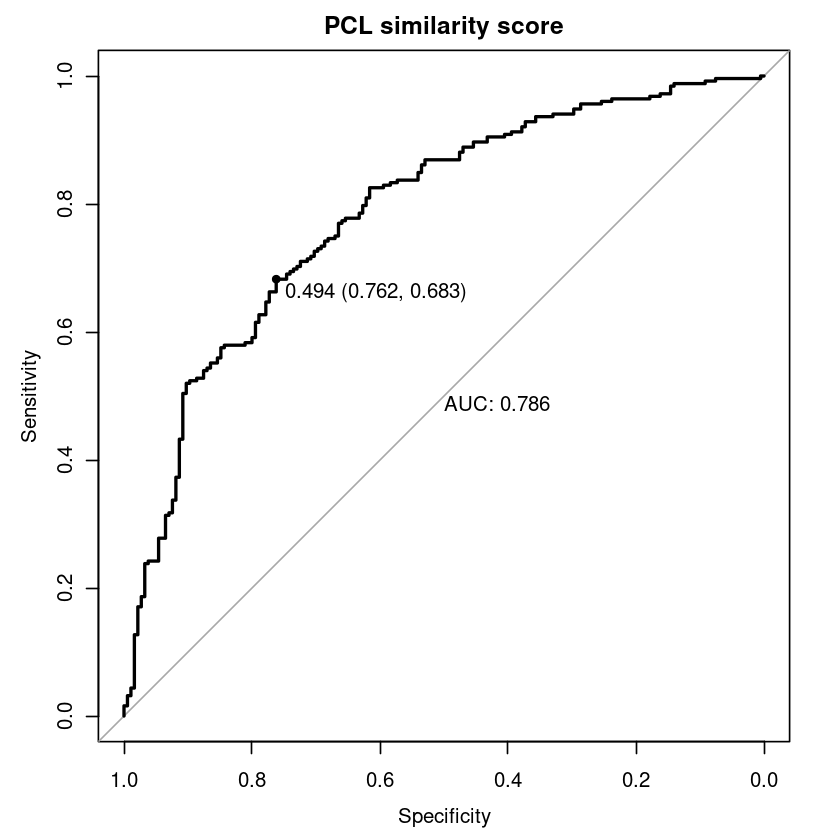

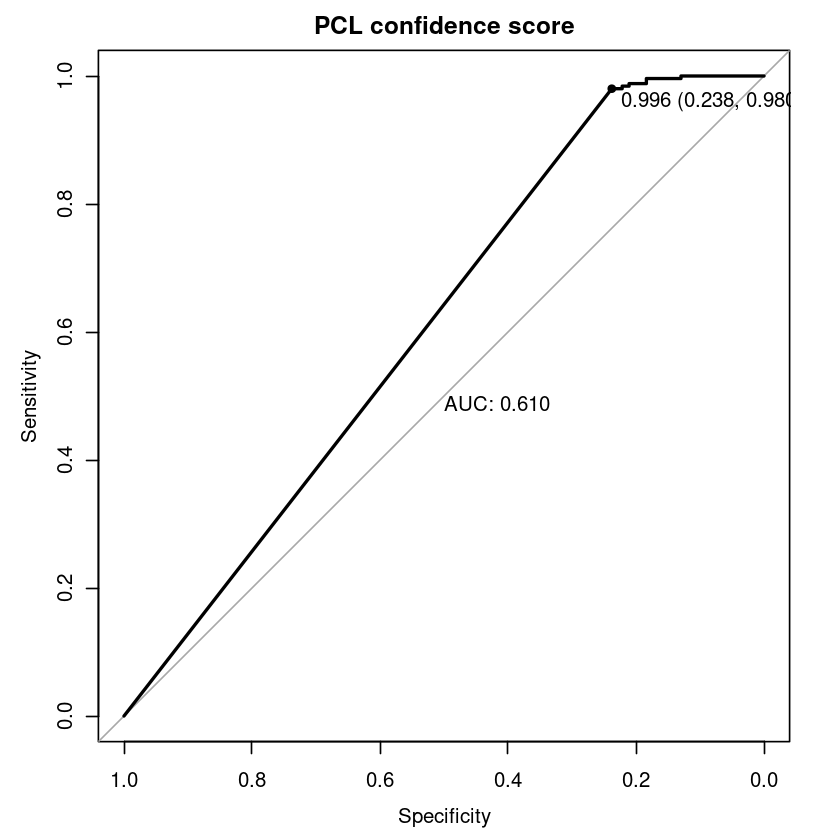

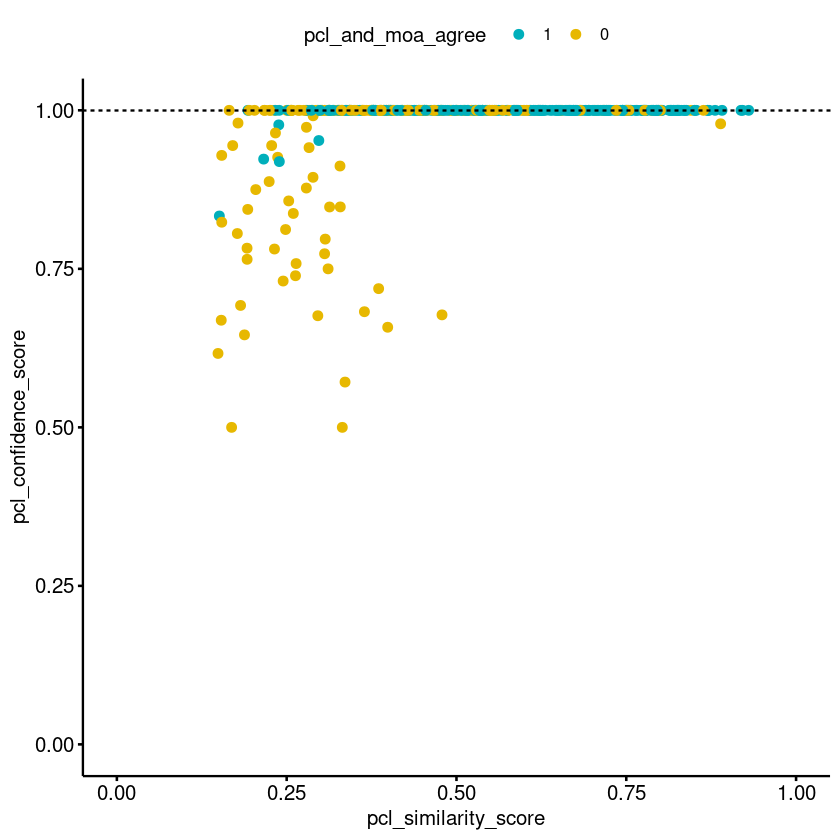

In [136]:
loocv_kabx_preds = loocv_combined_results %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on all KABX compounds (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4935738"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.99568265"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 418"
[1] "Number of correct MOA assignments: 247"
[1] "Number of incorrect MOA assignments: 125"
[1] "Number of uncertain assignments: 46"
[1] "Precision (PPV): 0.66"
[1] "Sensitivity (TPR): 0.59"
[1] "F1 score: 0.62"
[1] "----------------------------------"


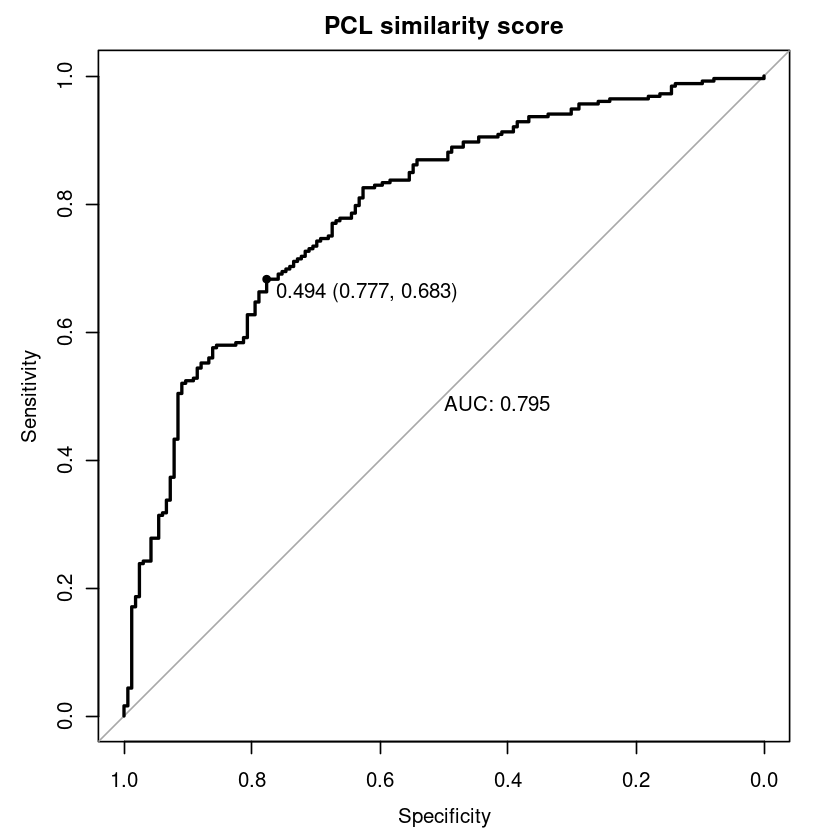

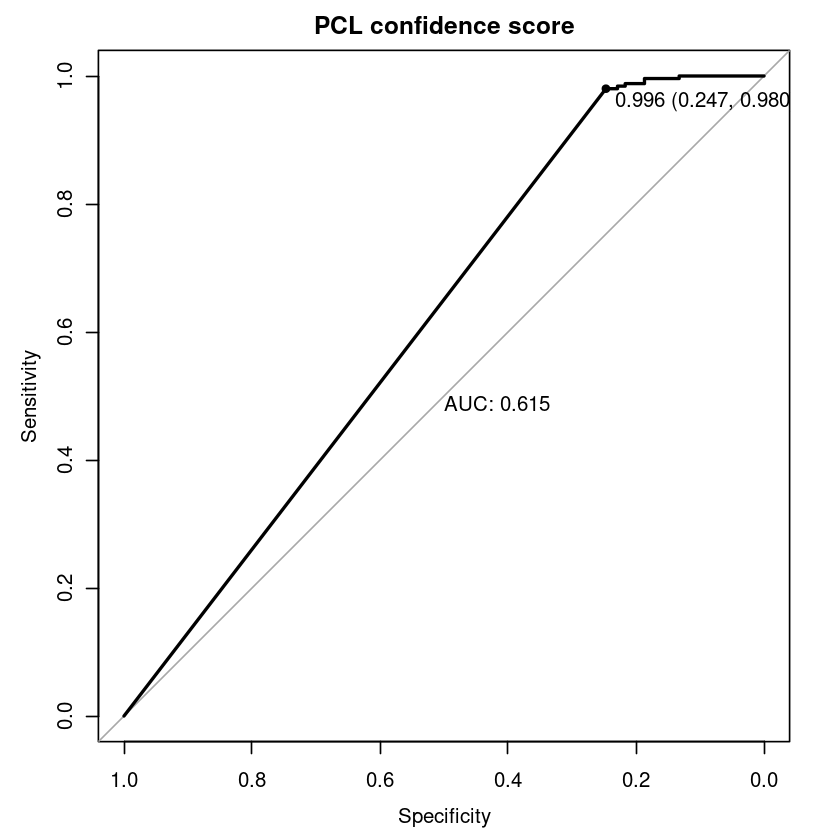

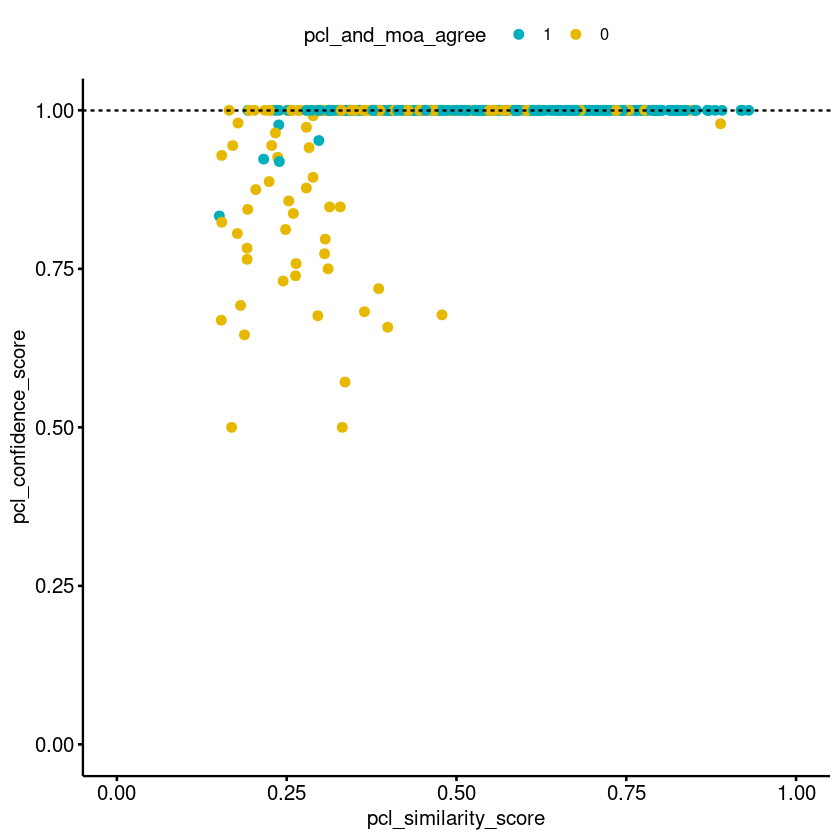

In [137]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs and active - active if minimum, strain curve-fit GR <= 0.3 at highest tested concentrations - pert_id 

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.43549615"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.98995495"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs and active (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 337"
[1] "Number of correct MOA assignments: 230"
[1] "Number of incorrect MOA assignments: 81"
[1] "Number of uncertain assignments: 26"
[1] "Precision (PPV): 0.74"
[1] "Sensitivity (TPR): 0.68"
[1] "F1 score: 0.71"
[1] "----------------------------------"


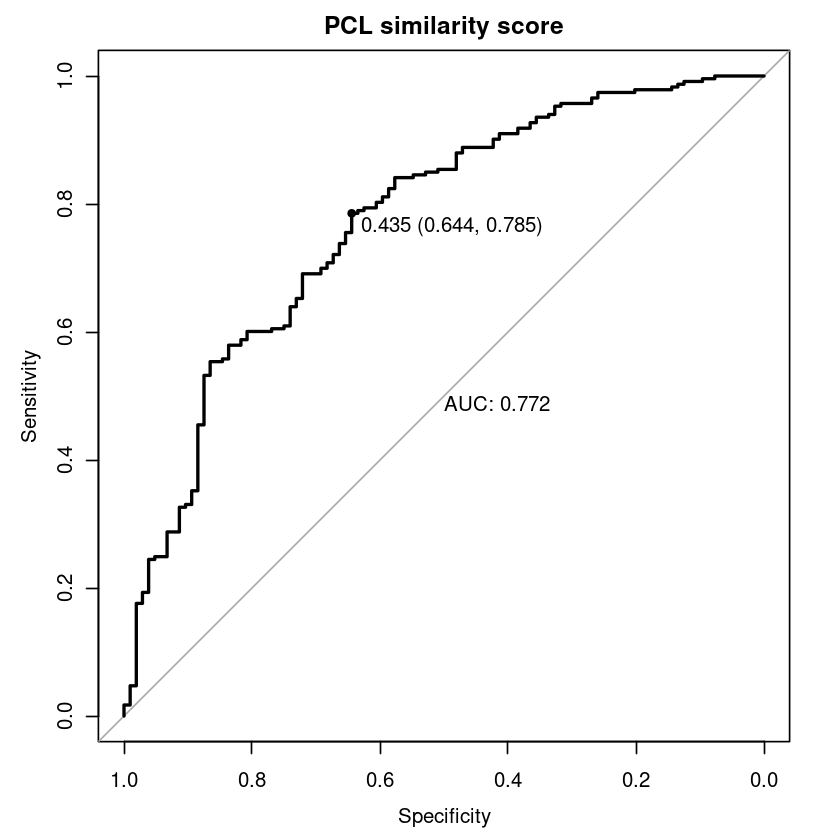

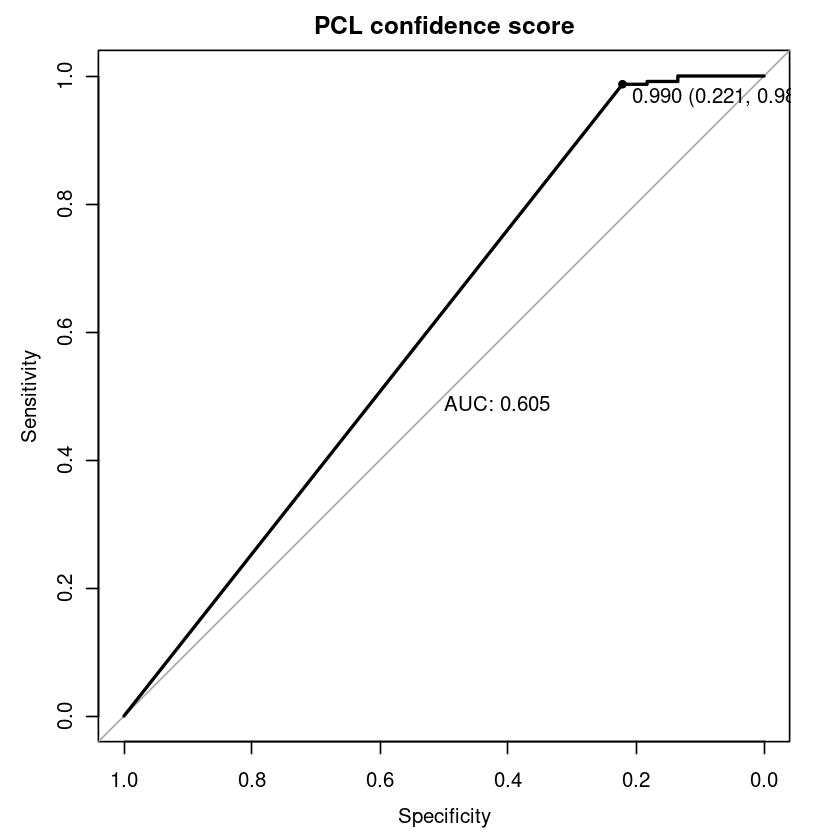

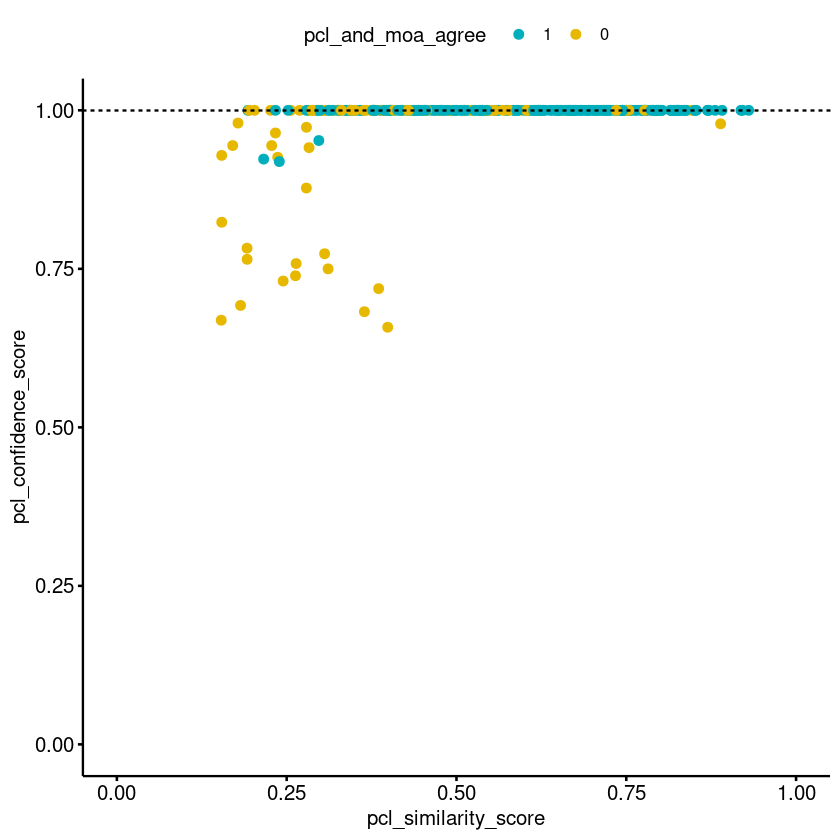

In [138]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs and active (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs but inactive - inactive if minimum, strain curve-fit GR > 0.3 at highest tested concentrations - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.50887775"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.93570895"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 81"
[1] "Number of correct MOA assignments: 17"
[1] "Number of incorrect MOA assignments: 44"
[1] "Number of uncertain assignments: 20"
[1] "Precision (PPV): 0.28"
[1] "Sensitivity (TPR): 0.21"
[1] "F1 score: 0.24"
[1] "----------------------------------"


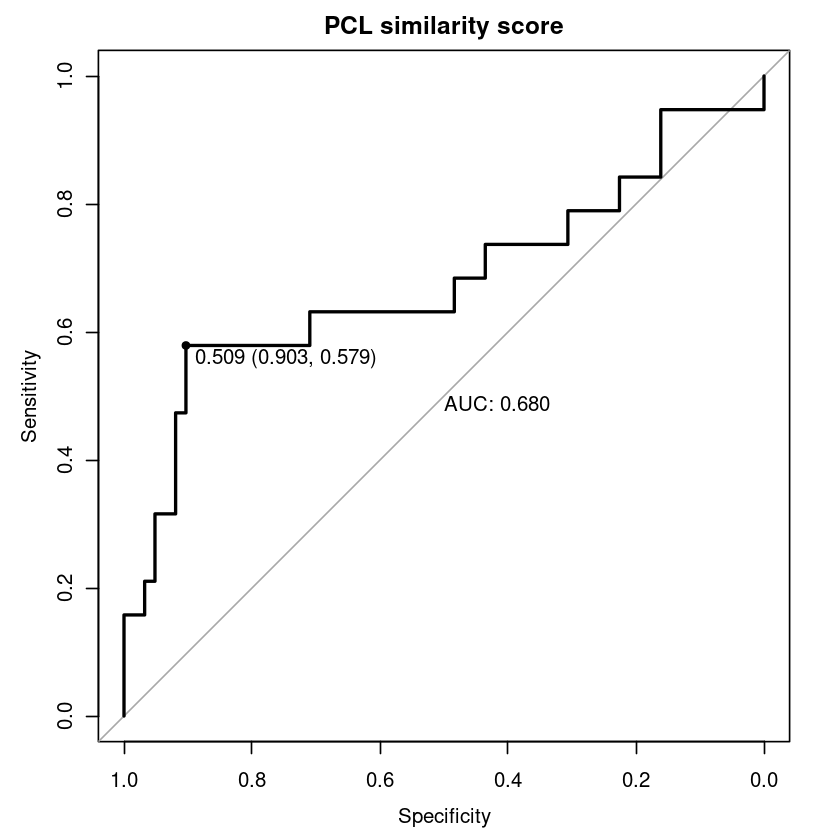

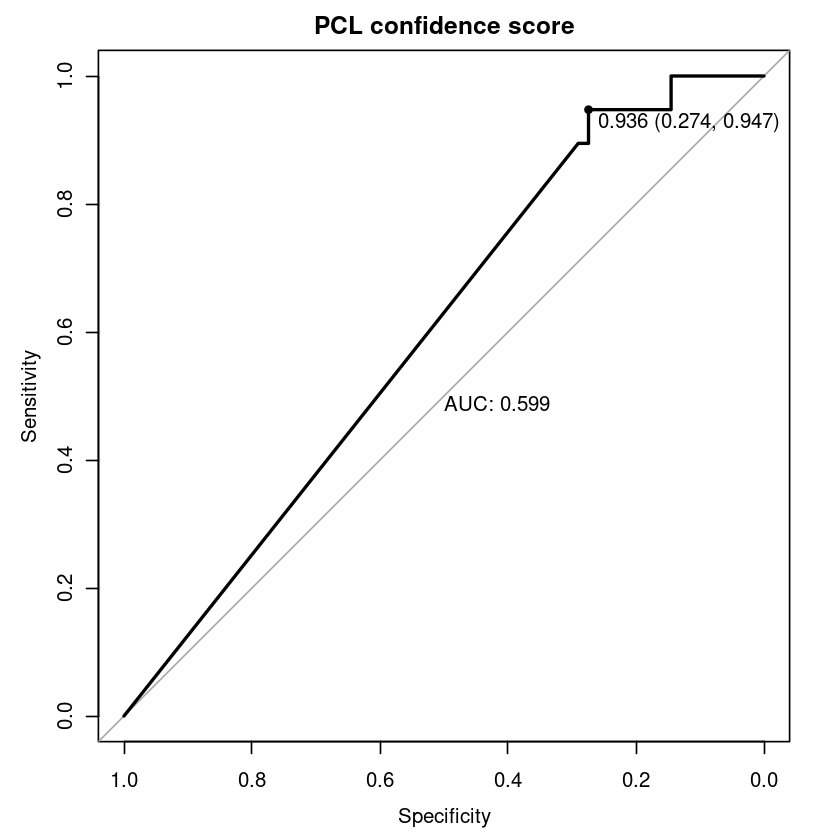

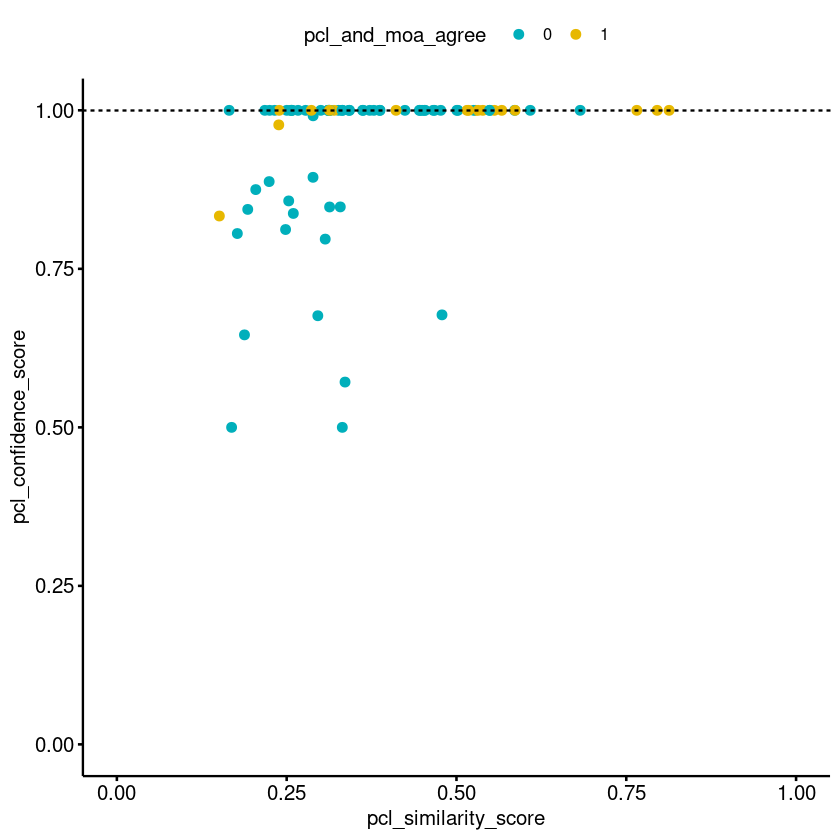

In [139]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & pert_id_only_weak_active_0.3_fit_gr) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - active if minimum, strain curve-fit GR <= 0.3 at highest tested concentrations and well-represented if in multi-compound PCL in full model - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.43549615"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.98995495"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 315"
[1] "Number of correct MOA assignments: 228"
[1] "Number of incorrect MOA assignments: 64"
[1] "Number of uncertain assignments: 23"
[1] "Precision (PPV): 0.78"
[1] "Sensitivity (TPR): 0.72"
[1] "F1 score: 0.75"
[1] "----------------------------------"


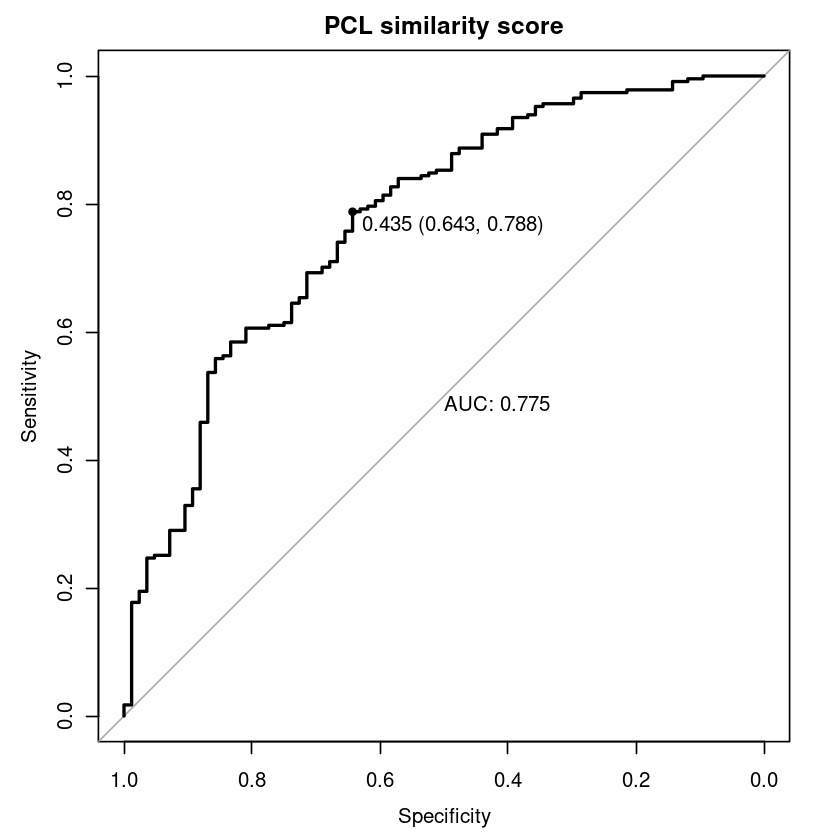

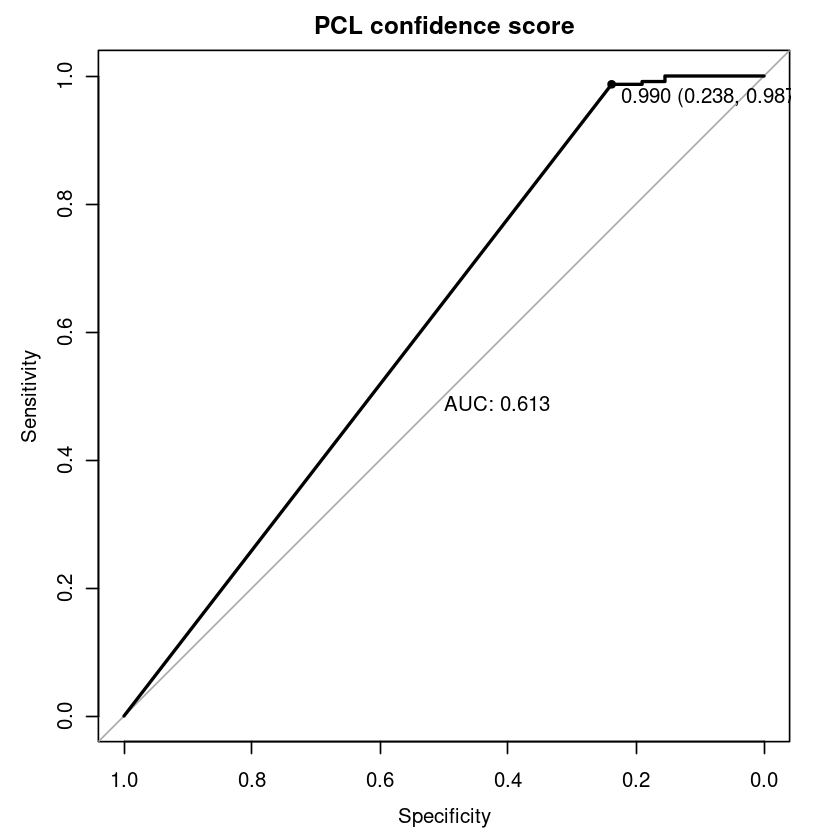

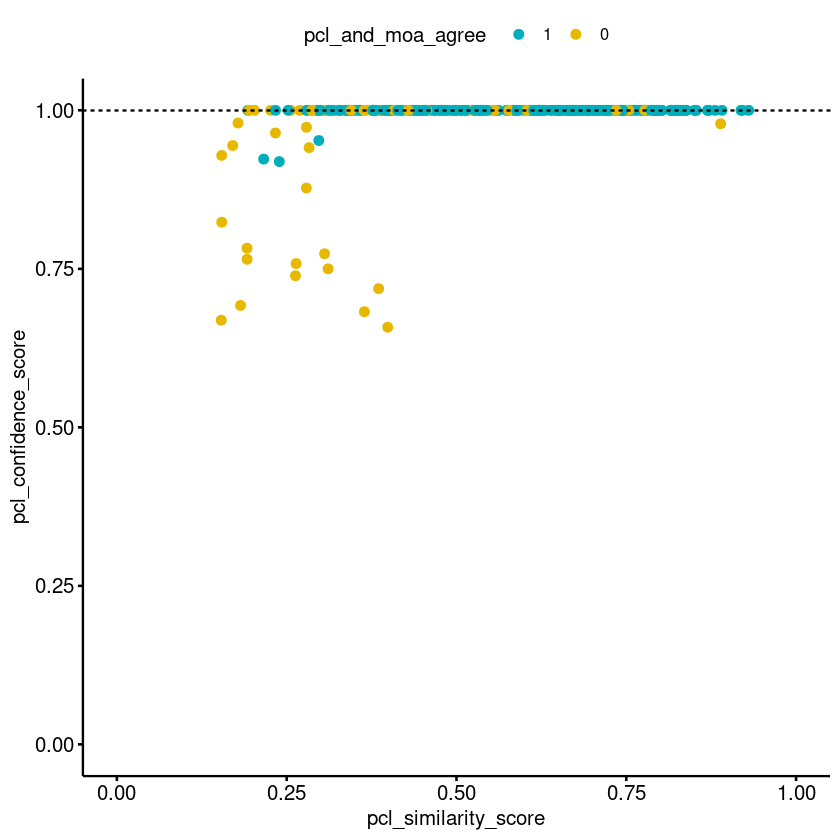

In [140]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOA but inactive and/or not well-represented in KABX - inactive if minimum, strain curve-fit GR > 0.3 at highest tested concentrations and not well-represented if not in PCL or in single-compound PCL only in full model - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.50887775"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.96075315"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive or not well-represented in KABX (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 103"
[1] "Number of correct MOA assignments: 19"
[1] "Number of incorrect MOA assignments: 61"
[1] "Number of uncertain assignments: 23"
[1] "Precision (PPV): 0.24"
[1] "Sensitivity (TPR): 0.18"
[1] "F1 score: 0.21"
[1] "----------------------------------"


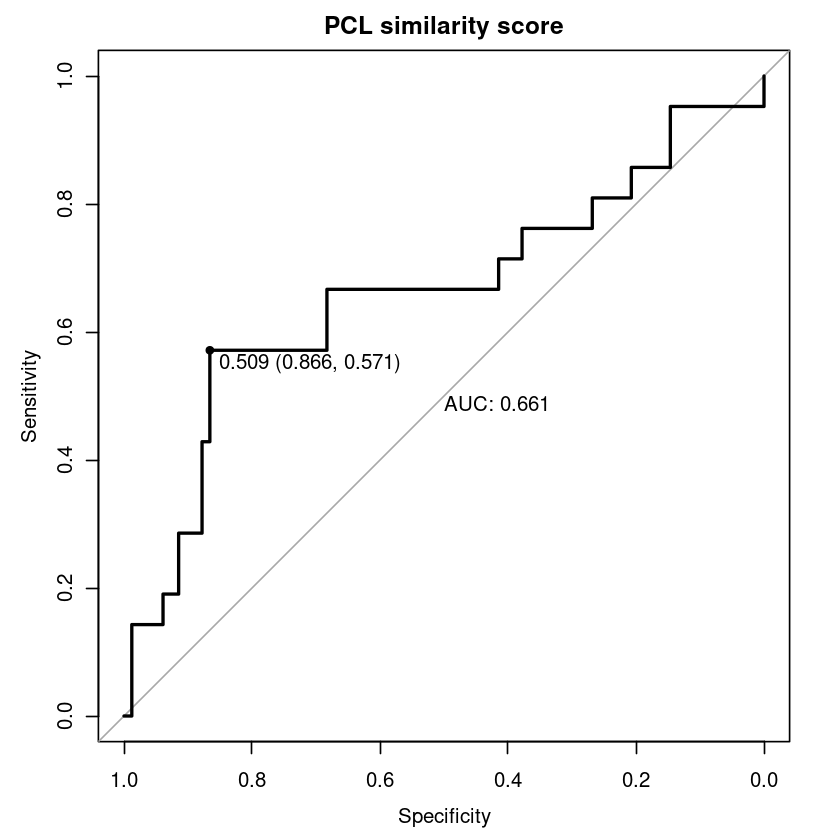

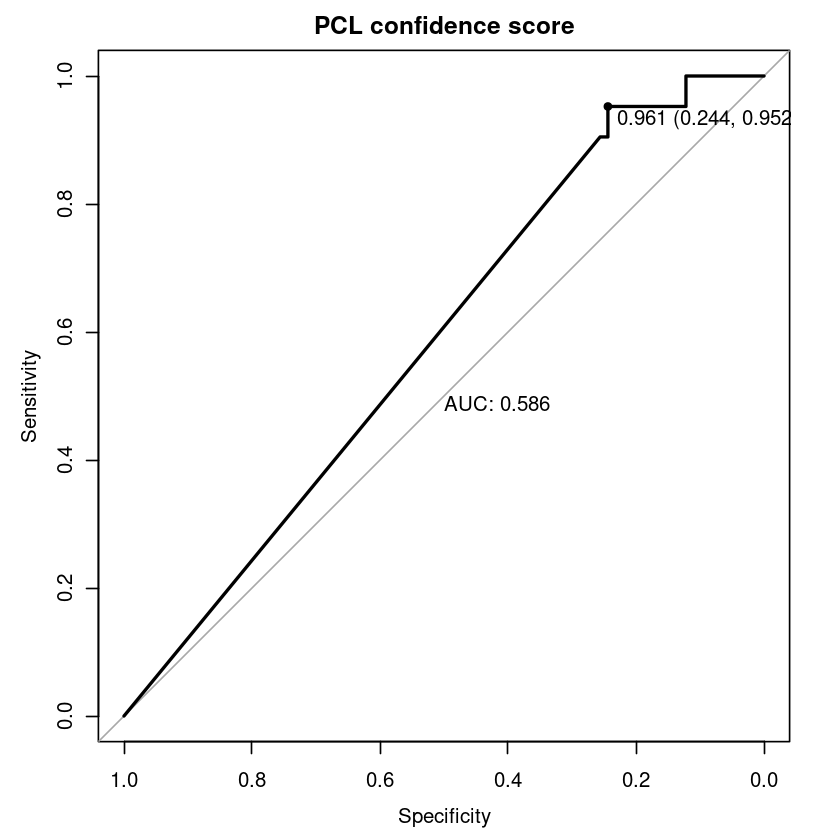

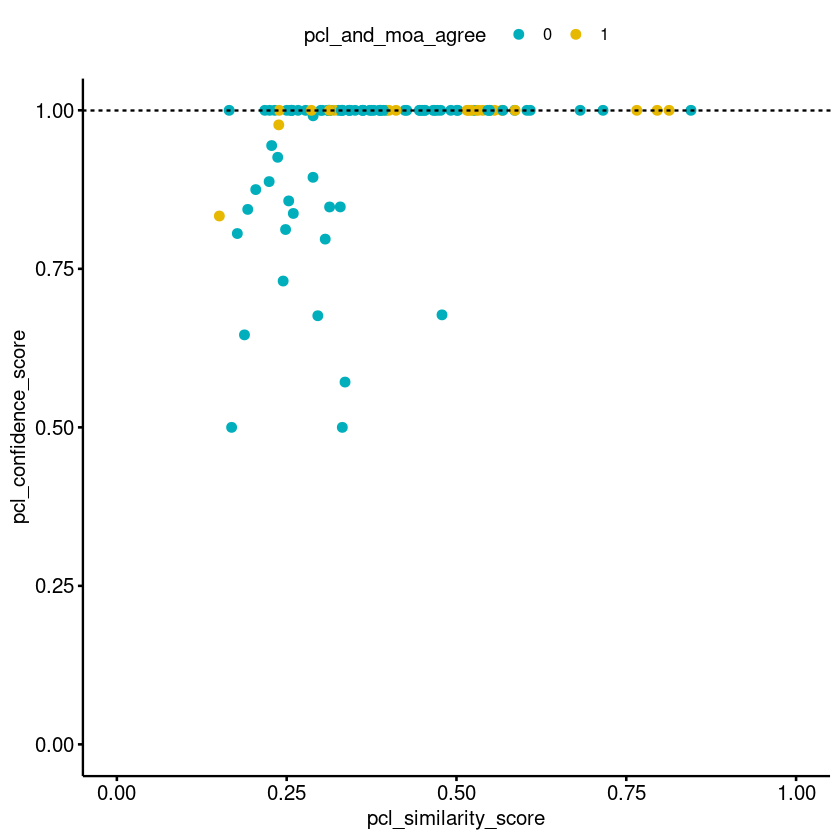

In [141]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & (pert_id_only_weak_active_0.3_fit_gr | !pert_id_in_multi_cmpd_pcl)) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive or not well-represented in KABX (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - broad_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.43549615"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.98995495"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at batch level (broad_id)"
[1] "Total number of KABX compounds or treatments evaluated: 378"
[1] "Number of correct MOA assignments: 273"
[1] "Number of incorrect MOA assignments: 70"
[1] "Number of uncertain assignments: 35"
[1] "Precision (PPV): 0.8"
[1] "Sensitivity (TPR): 0.72"
[1] "F1 score: 0.76"
[1] "----------------------------------"


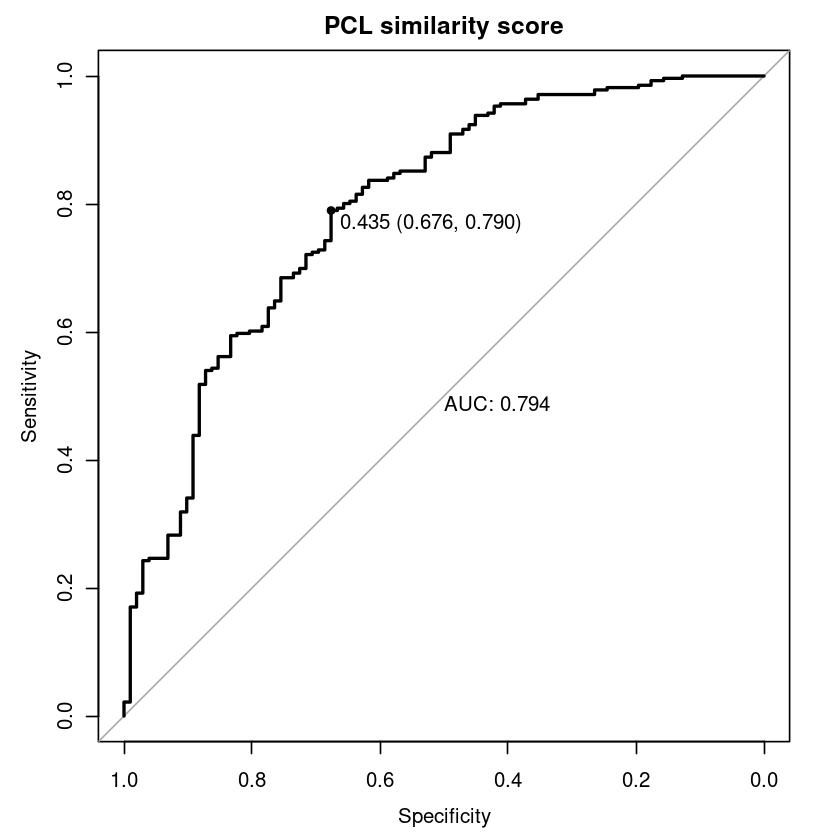

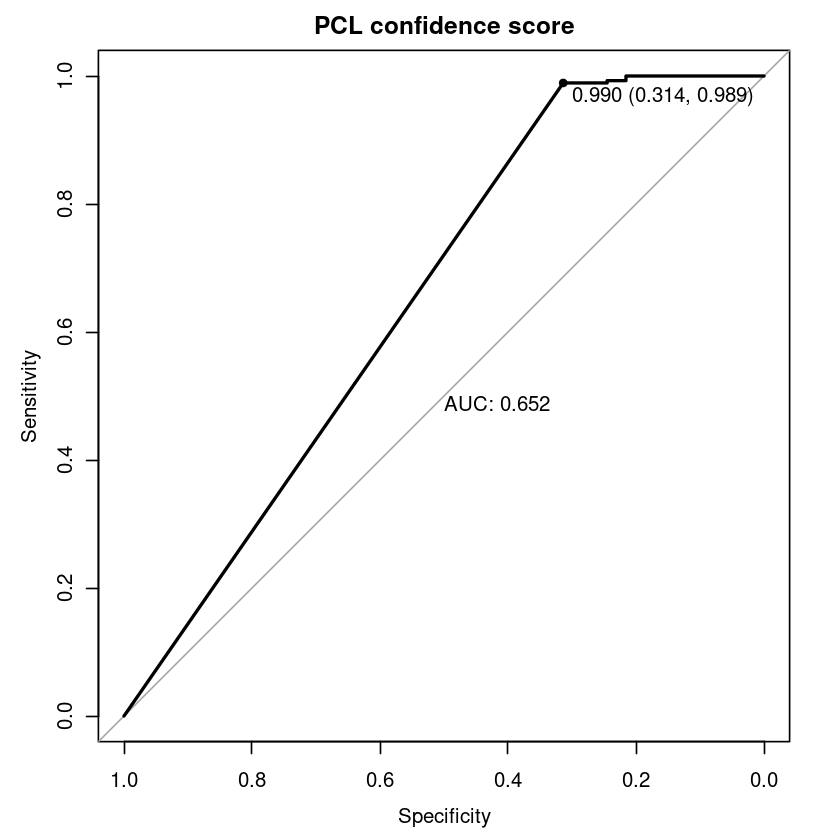

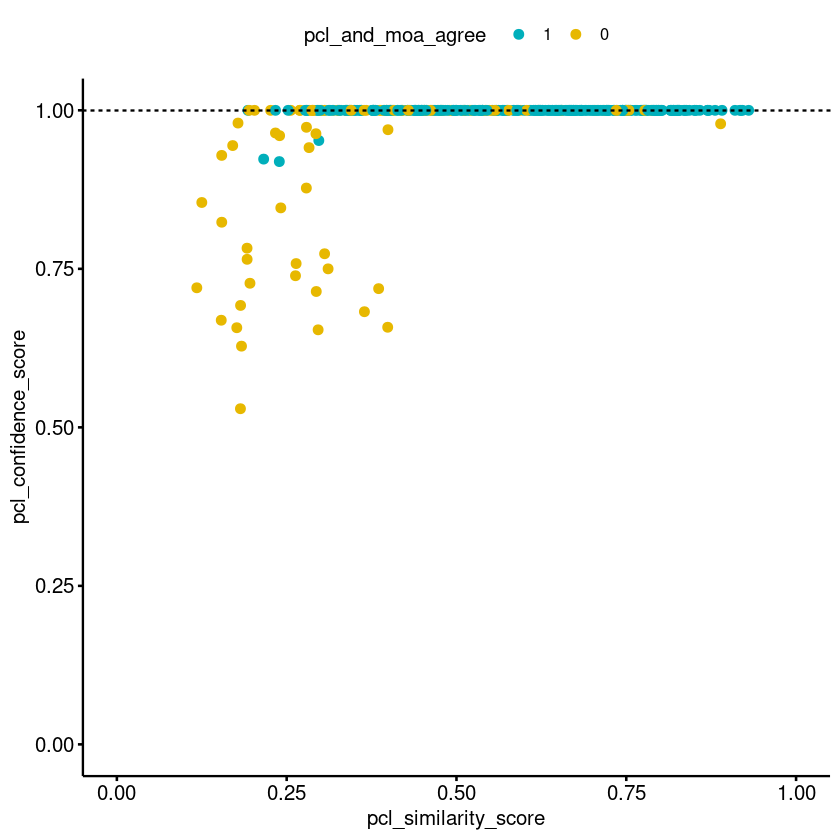

In [142]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(broad_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(broad_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(broad_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at batch level (broad_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - proj_broad_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4343474"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.99636715"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at screening wave x batch level (proj_broad_id)"
[1] "Total number of KABX compounds or treatments evaluated: 721"
[1] "Number of correct MOA assignments: 466"
[1] "Number of incorrect MOA assignments: 122"
[1] "Number of uncertain assignments: 133"
[1] "Precision (PPV): 0.79"
[1] "Sensitivity (TPR): 0.65"
[1] "F1 score: 0.71"
[1] "----------------------------------"


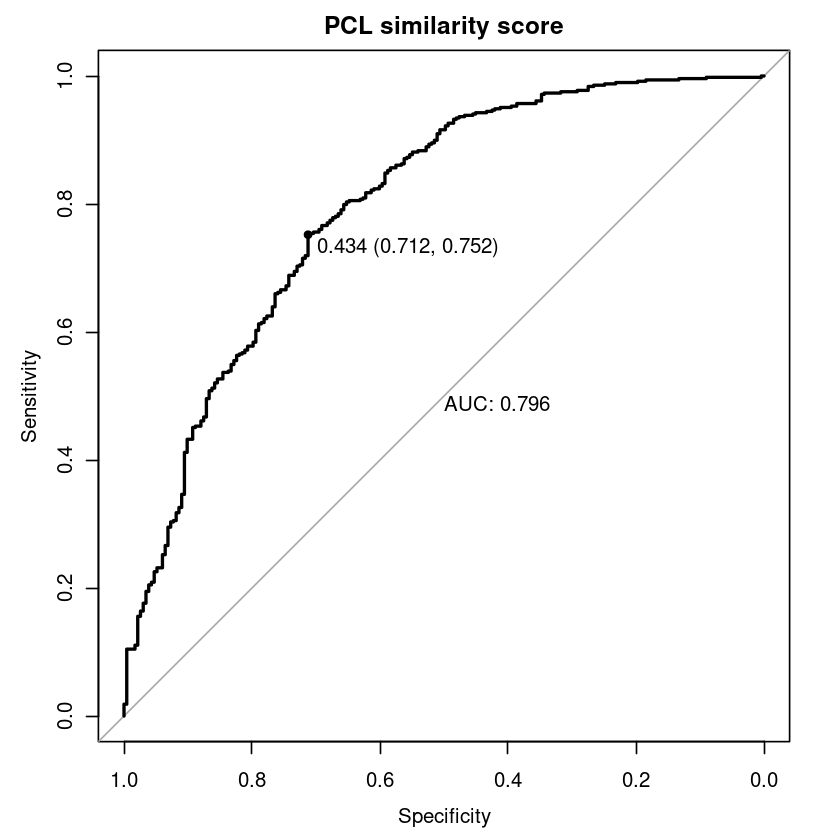

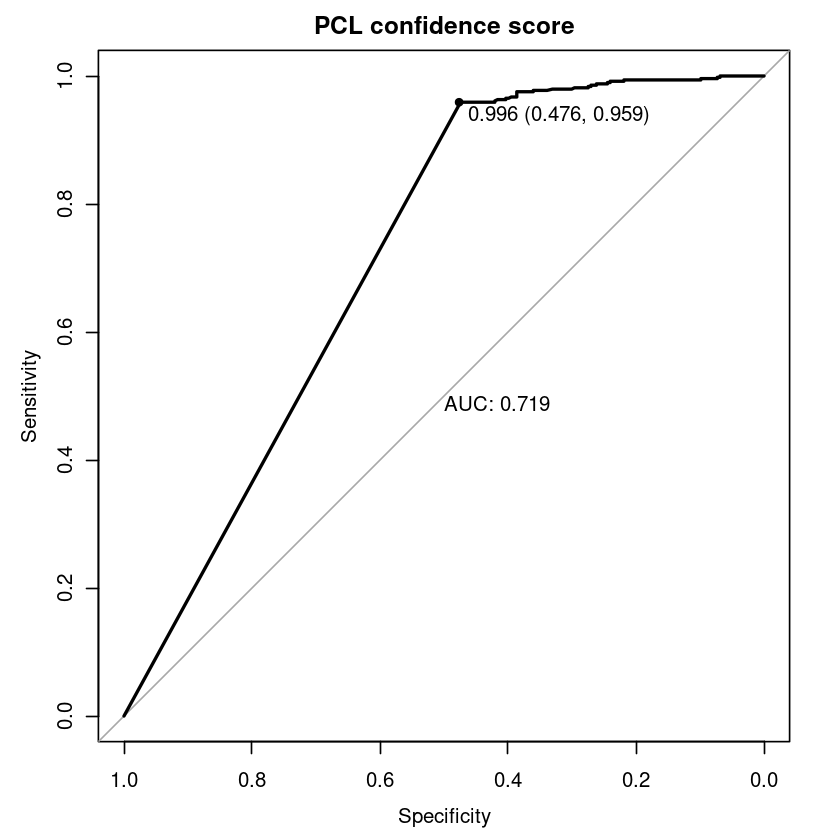

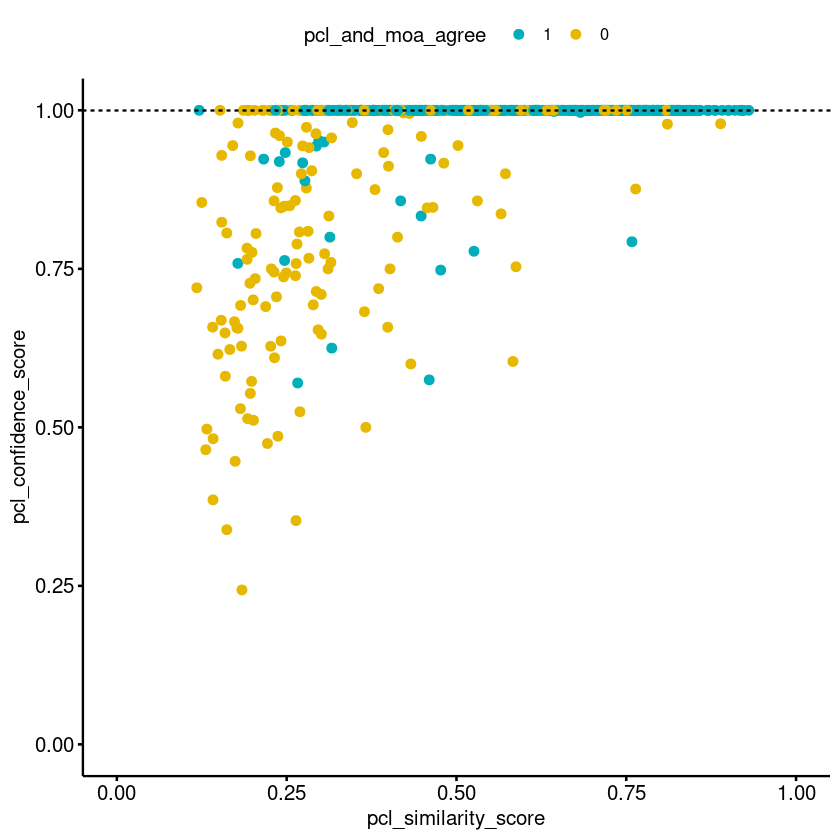

In [143]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(proj_broad_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(proj_broad_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(proj_broad_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at screening wave x batch level (proj_broad_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - treatment/dsCGI profile (cid)

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.29431355"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.7687884"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 7011"
[1] "Number of correct MOA assignments: 1984"
[1] "Number of incorrect MOA assignments: 376"
[1] "Number of uncertain assignments: 4651"
[1] "Precision (PPV): 0.84"
[1] "Sensitivity (TPR): 0.28"
[1] "F1 score: 0.42"
[1] "----------------------------------"


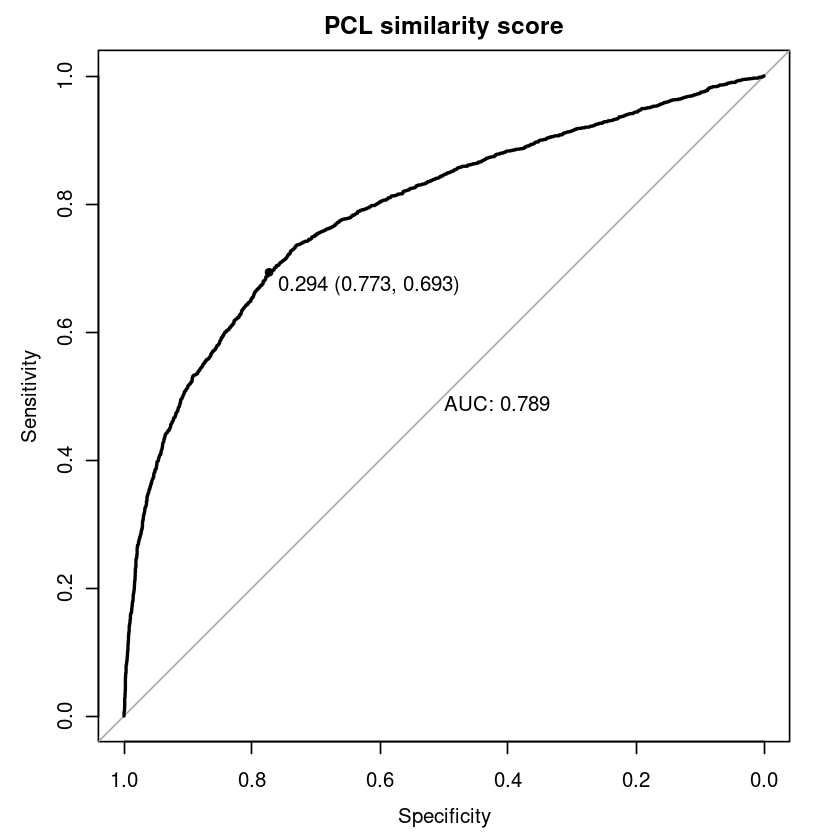

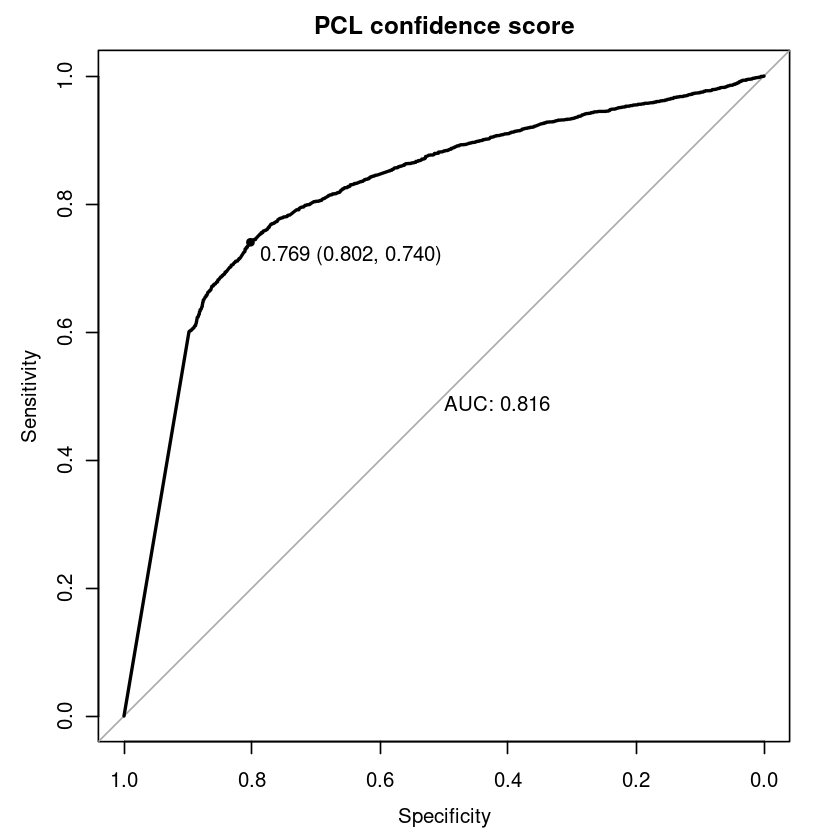

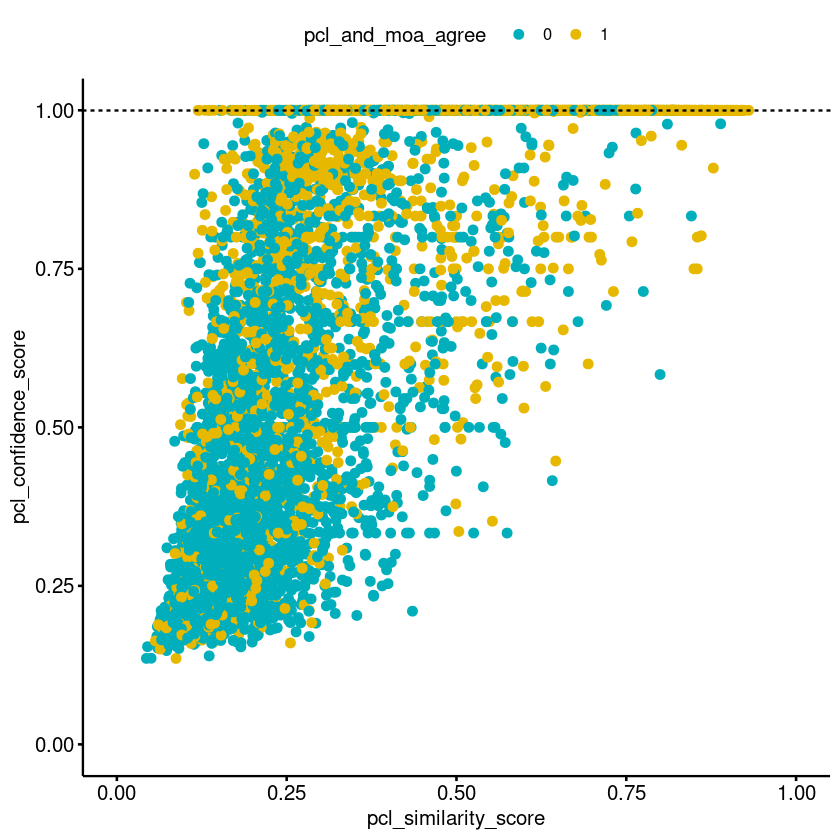

In [144]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(cid) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(cid, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(cid) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### All KABX - all treatment/dsCGI profile-PCL pairs

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.0068871705"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.07171849"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 10519174"
[1] "Number of correct MOA assignments: 7436"
[1] "Number of incorrect MOA assignments: 1180"
[1] "Number of uncertain assignments: 10510558"
[1] "Precision (PPV): 0.86"
[1] "Sensitivity (TPR): 0.00071"
[1] "F1 score: 0.001"
[1] "----------------------------------"


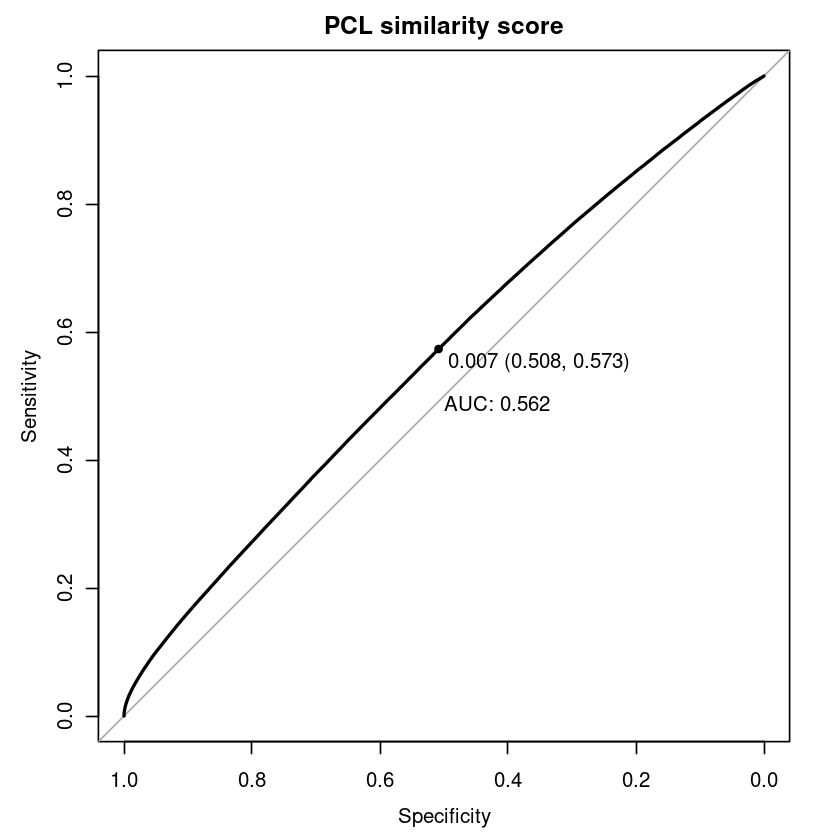

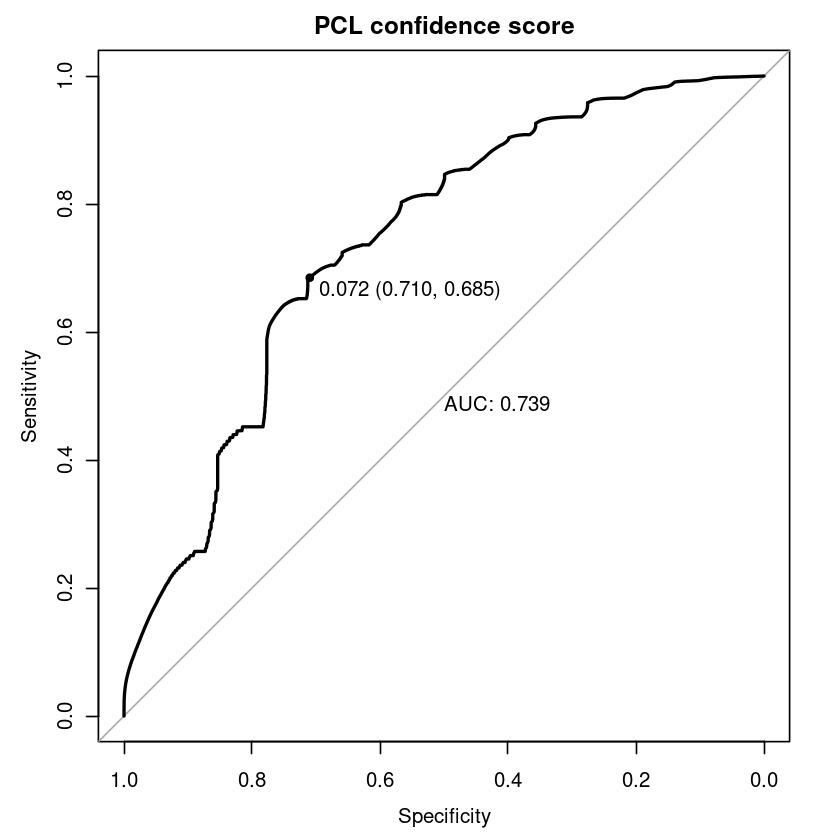

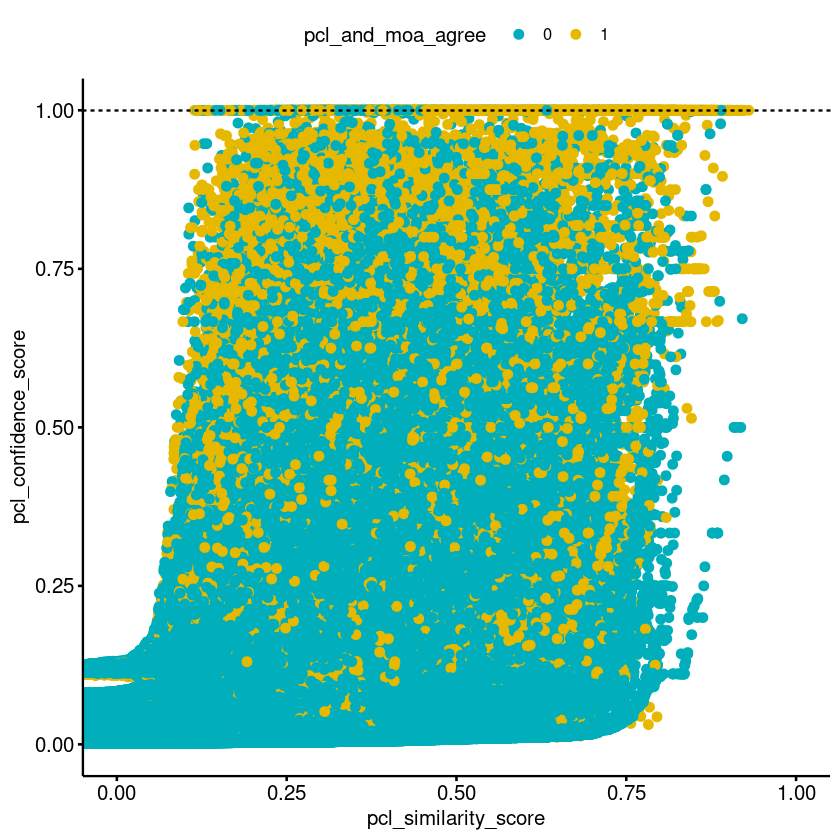

In [145]:
loocv_kabx_preds = loocv_combined_results

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - all treatment/dsCGI profile-PCL pairs

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.01375015"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.072326775"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 7829839"
[1] "Number of correct MOA assignments: 7164"
[1] "Number of incorrect MOA assignments: 881"
[1] "Number of uncertain assignments: 7821794"
[1] "Precision (PPV): 0.89"
[1] "Sensitivity (TPR): 0.00091"
[1] "F1 score: 0.002"
[1] "----------------------------------"


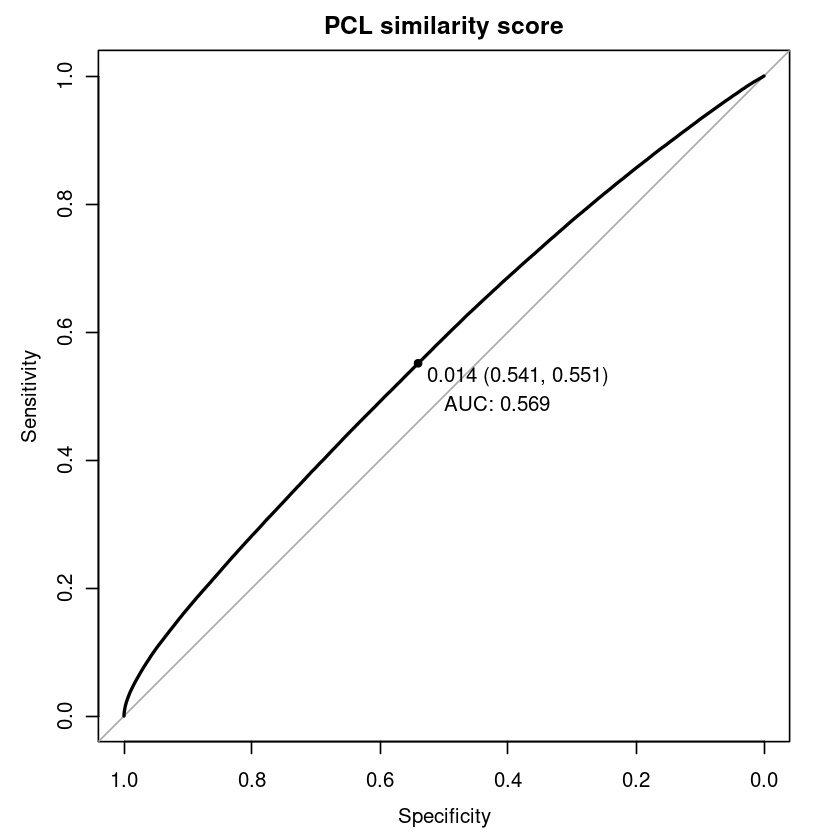

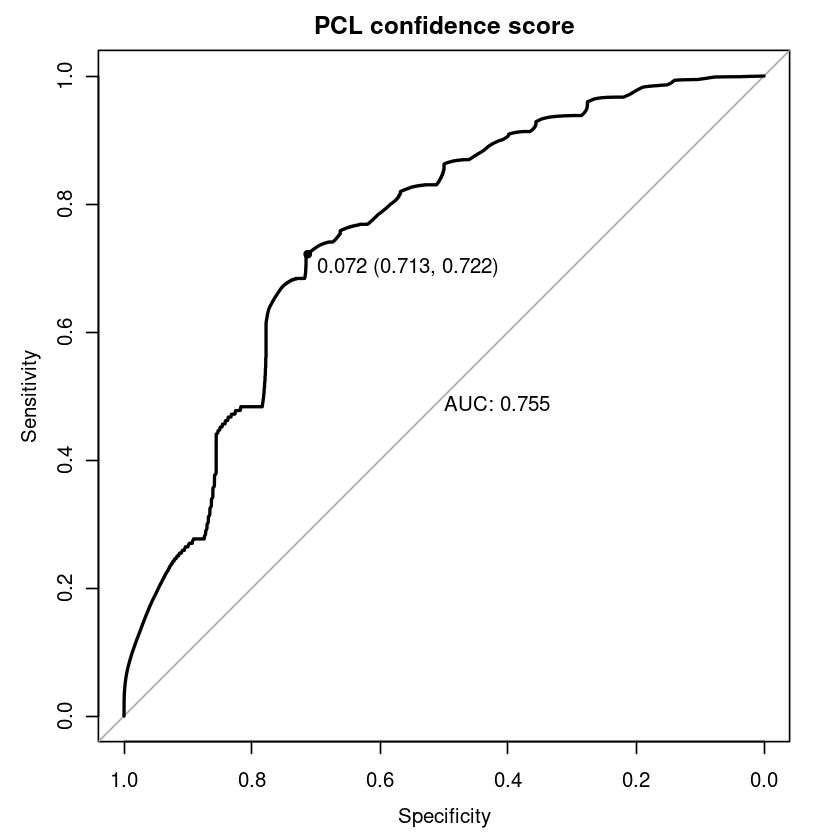

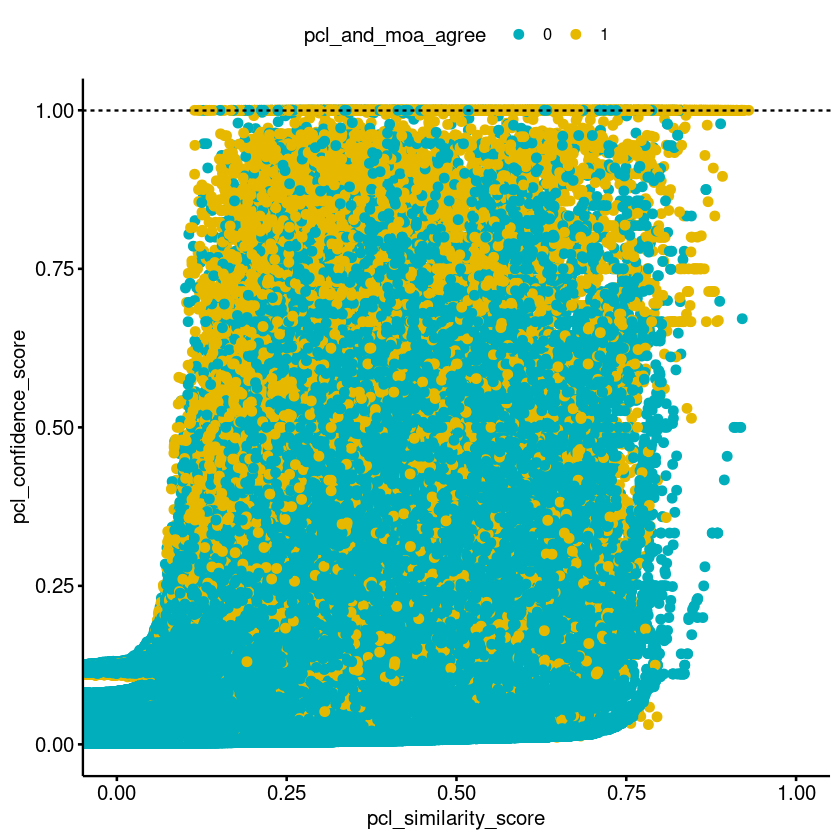

In [146]:
loocv_kabx_preds = loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### Check accuracy using single, optimal PCL similarity score threshold for all PCLs/MOAs and MOA prediction made as PCL with highest similarity score to compound (as opposed to highest confidence score)

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.69257635"
[1] "Defined high-confidence PCL similarity score threshold is: 0.69257635"
[1] "----------------------------------"
[1] "Using high-confidence PCL similarity score threshold of 0.692576 to assign MOA"
[1] "LOOCV accuracy on all KABX compounds using single PCL similarity score threshold (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 142"
[1] "Number of incorrect MOA assignments: 63"
[1] "Number of uncertain assignments: 232"
[1] "Precision (PPV): 0.69"
[1] "Sensitivity (TPR): 0.32"
[1] "F1 score: 0.44"
[1] "----------------------------------"


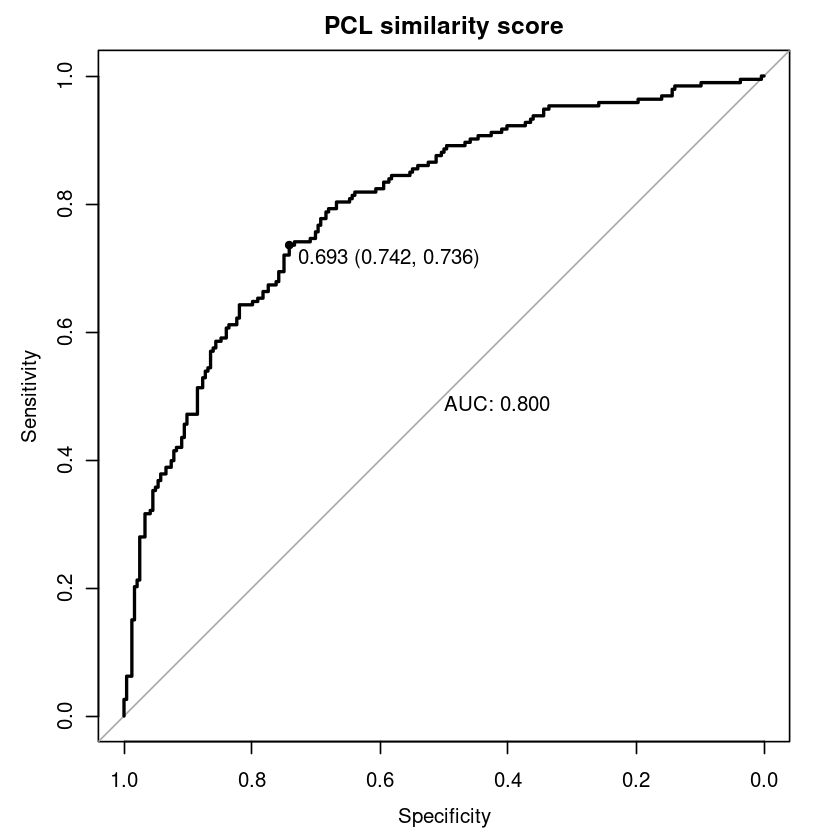

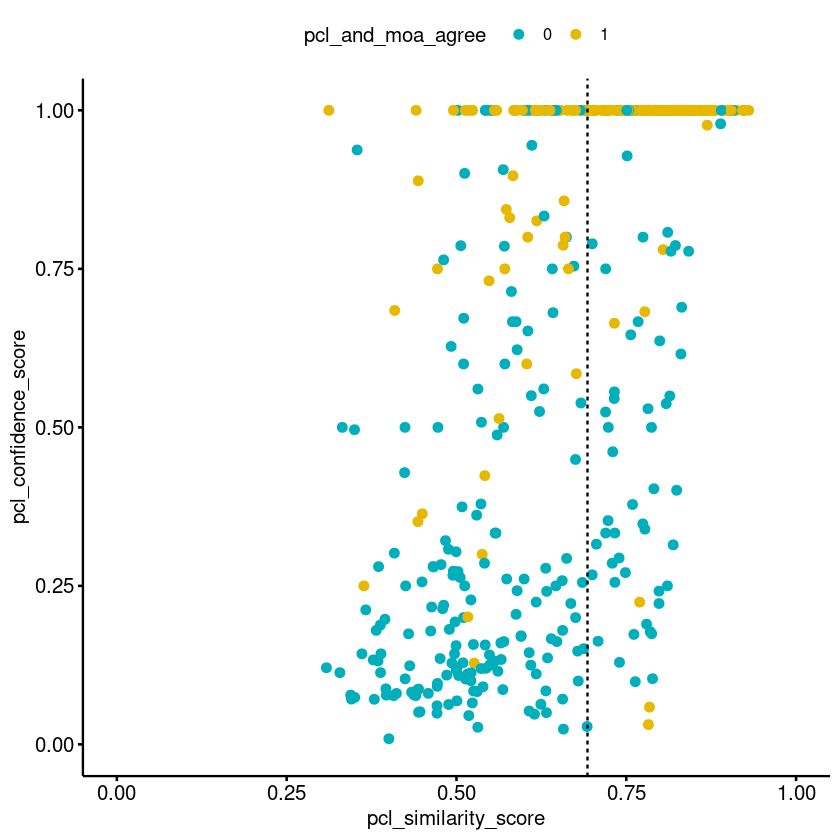

In [147]:
loocv_kabx_preds = loocv_combined_results %>%
    group_by(pert_id) %>%
    arrange(desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score

}
### End ROC for PCL similarity score
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_similarity_score_threshold = loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold

print(str_c("Defined high-confidence PCL similarity score threshold is: ", high_confidence_pcl_similarity_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL similarity score threshold of %f to assign MOA', high_confidence_pcl_similarity_score_threshold))
print("LOOCV accuracy on all KABX compounds using single PCL similarity score threshold (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_vline(xintercept = high_confidence_pcl_similarity_score_threshold, linetype = "dashed")

### Full LOOCV results for KABX (full, shared results)

In [378]:
if (exists("loocv_combined_opt_scores_tbls_full_shared")) {
    print("The loocv_combined_opt_scores_tbls_full_shared object is loaded.")
} else {
    print("Loading loocv_combined_opt_scores_tbls_full_shared object now: ")
  
    loocv_combined_opt_scores_tbls_full_shared <- readRDS(loocv_opt_tbl_combined_rds_full_shared_path)
  
}

dim(loocv_combined_opt_scores_tbls_full_shared)
head(loocv_combined_opt_scores_tbls_full_shared)

[1] "The loocv_combined_opt_scores_tbls_full_shared object is loaded."


[1] 486706     26

,loocv_pert_id,pcl_rid,pcl_desc,pcl_n,pcl_n_correct,pcl_n_trt,pcl_n_correct_trt,pcl_auc,pcl_score_threshold,pcl_ppv,...,pcl_f1_score,pcl_size,pcl_num_pert_ids_unique,pcl_num_broad_ids_unique,pcl_pert_ids,pcl_broad_ids,pcl_cids,pcl_from_single_cmpd_moa,pcl_multi_cmpd,pcl_multi_cmpd_or_single_cmpd_moa
,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,...,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>
1,BRD-A02179977,30S ribosome:group1,30S ribosome,436,25,9419,477,0.4363017,0.2180247,1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
2,BRD-A02179977,30S ribosome:group100,30S ribosome,436,25,9419,477,0.6541119,0.6664475,1,...,0.571,30,10,10,BRD-A69651145|BRD-K01666773|BRD-M68646745|BRD-A50987946|BRD-A34145622|BRD-A25492003|BRD-A49035384|BRD-A22740840|BRD-A15637061|BRD-A54142827,BRD-A69651145-003-12-2|BRD-K01666773-001-01-9|BRD-M68646745-311-10-4|BRD-A50987946-001-01-9|BRD-A34145622-003-26-9|BRD-A25492003-003-16-6|BRD-A49035384-003-31-3|BRD-A22740840-003-07-7|BRD-A15637061-003-01-9|BRD-A54142827-003-01-7,kabx2:BRD-A69651145-003-12-2:0.195500uM|kabx2:BRD-K01666773-001-01-9:0.781250uM|kabx2:BRD-M68646745-311-10-4:0.097500uM|kabx2:BRD-M68646745-311-10-4:6.250000uM|kabx2:BRD-M68646745-311-10-4:25.000000uM|kabx2:BRD-A69651145-003-12-2:0.097500uM|kabx2:BRD-A50987946-001-01-9:3.125000uM|kabx2:BRD-A50987946-001-01-9:1.562500uM|kabx2:BRD-A34145622-003-26-9:0.781250uM|kabx2:BRD-K01666773-001-01-9:0.390500uM|kabx2:BRD-A25492003-003-16-6:0.390500uM|kabx2:BRD-A49035384-003-31-3:0.097500uM|kabx2:BRD-A22740840-003-07-7:6.250000uM|kabx2:BRD-A15637061-003-01-9:0.097500uM|kabx2:BRD-M68646745-311-10-4:50.000000uM|kabx2:BRD-M68646745-311-10-4:12.500000uM|kabx2:BRD-A34145622-003-26-9:0.390500uM|kabx2:BRD-A54142827-003-01-7:6.250000uM|kabx2:BRD-A54142827-003-01-7:3.125000uM|kabx2:BRD-A54142827-003-01-7:1.562500uM|kabx2:BRD-A54142827-003-01-7:0.781250uM|kabx2:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-A54142827-003-01-7:0.195500uM|kabx2:BRD-A22740840-003-07-7:3.125000uM|kabx2:BRD-A50987946-001-01-9:0.781250uM|kabx2:BRD-A25492003-003-16-6:0.195500uM|kabx2:BRD-A34145622-003-26-9:0.195500uM|kabx2:BRD-K01666773-001-01-9:0.195500uM|kabx2:BRD-A54142827-003-01-7:0.097500uM|kabx2:BRD-A49035384-003-31-3:0.195500uM,FALSE,TRUE,TRUE
3,BRD-A02179977,30S ribosome:group101,30S ribosome,436,25,9419,477,0.6611192,0.7364432,1,...,0.571,10,6,6,BRD-M68646745|BRD-A69651145|BRD-A34145622|BRD-K01666773|BRD-A15637061|BRD-A50987946,BRD-M68646745-311-10-4|BRD-A69651145-003-12-2|BRD-A34145622-003-26-9|BRD-K01666773-001-01-9|BRD-A15637061-003-01-9|BRD-A50987946-001-01-9,screen6:BRD-M68646745-311-10-4:1.562500uM|screen6:BRD-A69651145-003-12-2:0.390500uM|screen6:BRD-A34145622-003-26-9:0.781250uM|screen6:BRD-A69651145-003-12-2:0.195500uM|screen6:BRD-K01666773-001-01-9:0.781250uM|screen6:BRD-M68646745-311-10-4:50.000000uM|screen6:BRD-M68646745-311-10-4:0.195500uM|screen6:BRD-A69651145-003-12-2:3.125000uM|screen6:BRD-A15637061-003-01-9:0.097500uM|screen6:BRD-A50987946-001-01-9:6.250000uM,FALSE,TRUE,TRUE
4,BRD-A02179977,30S ribosome:group102,30S ribosome,436,25,9419,477,0.6698783,0.7916318,1,...,0.529,10,9,9,BRD-A22740840|BRD-A34145622|BRD-M68646745|BRD-A69651145|BRD-K01666773|BRD-A54142827|BRD-A25492003|BRD-A15637061|BRD-A49035384,BRD-A22740840-003-07-7|BRD-A34145622-003-26-9|BRD-M68646745-311-10-4|BRD-A69651145-003-12-2|BRD-K01666773-001-01-9|BRD-A54142827-003-01-7|BRD-A25492003-003-16-6|BRD-A15637061-003-01-9|BRD-A49035384-003-31-3,screen6:BRD-A22740840-003-07-7:12.500000uM|screen6:BRD-A34145622-003-26-9:1.562500uM|screen6:BRD-M68646745-311-10-4:0.781250uM|screen6:BRD-A69651145-003-12-2:0.781250uM|screen6:BRD-K01666773-001-01-9:1.562500uM|screen6:BRD-A54142827-003-01-7:25.000000uM|screen6:BRD-A25492003-003-16

In [379]:
loocv_combined_results_full_shared <- readRDS(loocv_test_cmpd_results_combined_rds_full_shared_path)

dim(loocv_combined_results_full_shared)
head(loocv_combined_results_full_shared)

[1] 10470531       11

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,30S ribosome
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392074,0.2822036,0,0.05542725,30S ribosome:group1,30S ribosome
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,30S ribosome
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105441,0.6339073,0,0.05747126,30S ribosome:group1,30S ribosome
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,30S ribosome
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,30S ribosome


In [380]:
if("pcl_score" %in% names(loocv_combined_results_full_shared)){
    loocv_combined_results_full_shared <- loocv_combined_results_full_shared %>%
        rename("pcl_similarity_score" = "pcl_score")
}

if("leftout_ppv" %in% names(loocv_combined_results_full_shared)){
    loocv_combined_results_full_shared <- loocv_combined_results_full_shared %>%
        rename("pcl_confidence_score" = "leftout_ppv")
}

dim(loocv_combined_results_full_shared)
head(loocv_combined_results_full_shared)

[1] 10470531       11

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,30S ribosome
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392074,0.2822036,0,0.05542725,30S ribosome:group1,30S ribosome
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,30S ribosome
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105441,0.6339073,0,0.05747126,30S ribosome:group1,30S ribosome
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,30S ribosome
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,30S ribosome


In [381]:
dim(loocv_combined_results_full_shared)

dim(inner_join(loocv_combined_results_full_shared, summ_pert_id_activity, by = 'pert_id'))

loocv_combined_results_full_shared = inner_join(loocv_combined_results_full_shared, summ_pert_id_activity, by = 'pert_id')

dim(loocv_combined_results_full_shared)
head(loocv_combined_results_full_shared)

print("All KABX compounds")
loocv_combined_results_full_shared %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA")
loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA and active")
loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("In multi-compound MOA, active, and well-represented in KABX")
loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] 10470531       11

[1] 10470531       18

[1] 10470531       18

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc,cid_with_min_gr_at_highest_dose,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>,<lgl>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392074,0.2822036,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105441,0.6339073,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE


[1] "All KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4265,70,437,505,967,9427


[1] "In multi-compound MOA"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4264,70,418,483,924,9006


[1] "In multi-compound MOA and active"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4158,70,337,400,763,7427


[1] "In multi-compound MOA, active, and well-represented in KABX"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4124,70,315,378,721,7011


In [382]:
loocv_combined_results_full_shared %>%
    group_by(pert_id) %>%
    mutate(
        has_matching_pcl = any(pcl_and_moa_agree == 1)
    ) %>% select(pert_id, has_matching_pcl) %>% distinct() %>%
    ungroup() %>%
    janitor::tabyl(has_matching_pcl)

pert_ids_with_matching_pcl = loocv_combined_results_full_shared %>%
    group_by(pert_id) %>%
    mutate(
        has_matching_pcl = any(pcl_and_moa_agree == 1)
    ) %>% filter(has_matching_pcl) %>% pull(pert_id) %>% unique()

length(pert_ids_with_matching_pcl)

has_matching_pcl,n,percent
<lgl>,<int>,<dbl>
FALSE,23,0.05263158
TRUE,414,0.94736842


[1] 414

In [383]:
loocv_combined_results_full_shared %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 1) %>%
    summarise(
        n_distinct(pert_id)
        )

loocv_combined_results_full_shared %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 0.9) %>%
    summarise(
        n_distinct(pert_id)
        )

loocv_combined_results_full_shared %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 0.8) %>%
    summarise(
        n_distinct(pert_id)
        )

loocv_combined_results_full_shared %>%
    filter(pcl_and_moa_agree == 1 & pcl_confidence_score >= 0.5) %>%
    summarise(
        n_distinct(pert_id)
        )

n_distinct(pert_id)
<int>
273


n_distinct(pert_id)
<int>
280


n_distinct(pert_id)
<int>
283


n_distinct(pert_id)
<int>
318


#### All KABX - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.45116315"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.97695475"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on all KABX compounds (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 256"
[1] "Number of incorrect MOA assignments: 132"
[1] "Number of uncertain assignments: 49"
[1] "Precision (PPV): 0.66"
[1] "Sensitivity (TPR): 0.59"
[1] "F1 score: 0.62"
[1] "----------------------------------"


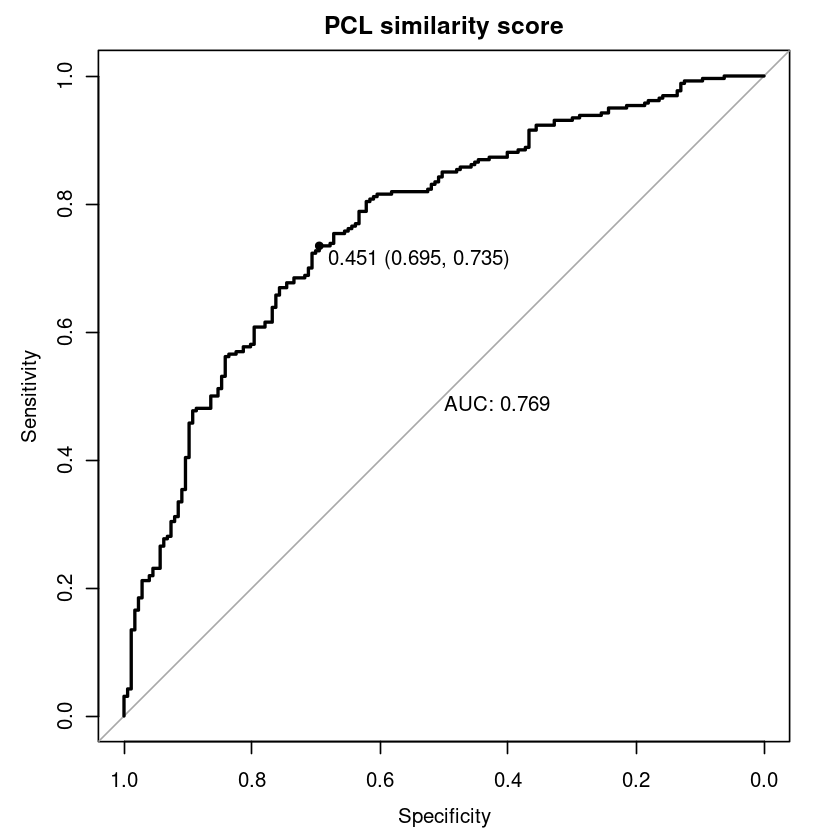

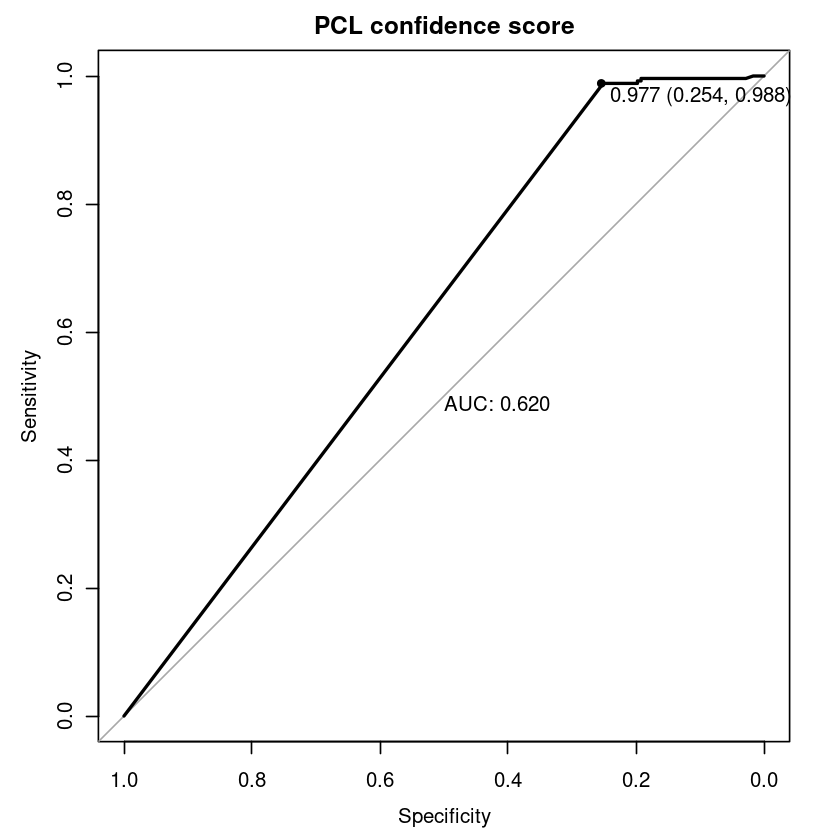

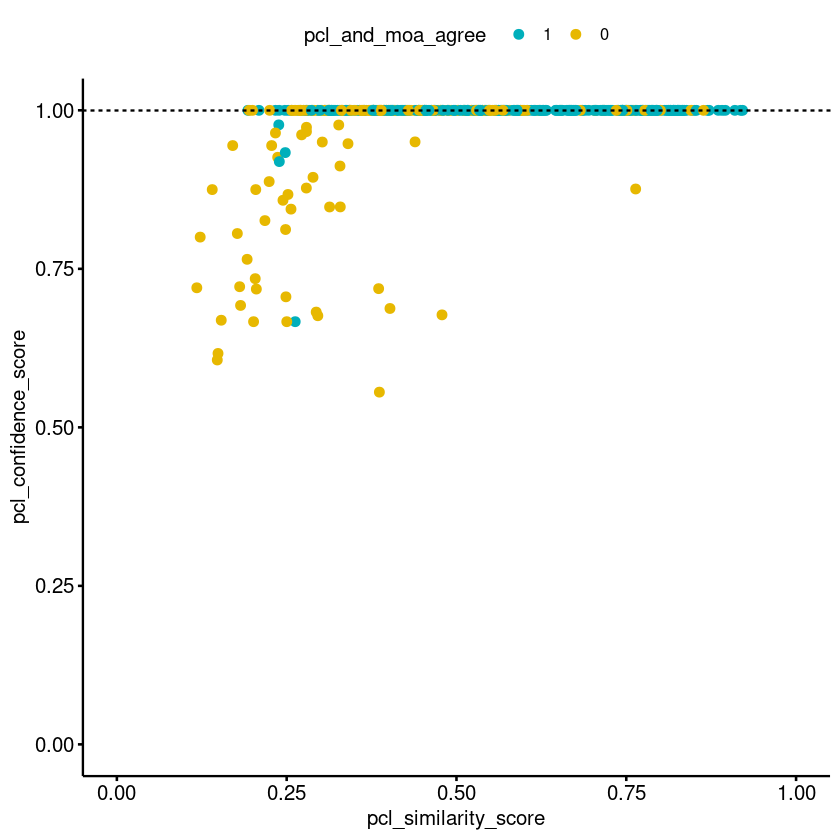

In [384]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on all KABX compounds (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.45438035"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.97695475"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 418"
[1] "Number of correct MOA assignments: 256"
[1] "Number of incorrect MOA assignments: 118"
[1] "Number of uncertain assignments: 44"
[1] "Precision (PPV): 0.68"
[1] "Sensitivity (TPR): 0.61"
[1] "F1 score: 0.65"
[1] "----------------------------------"


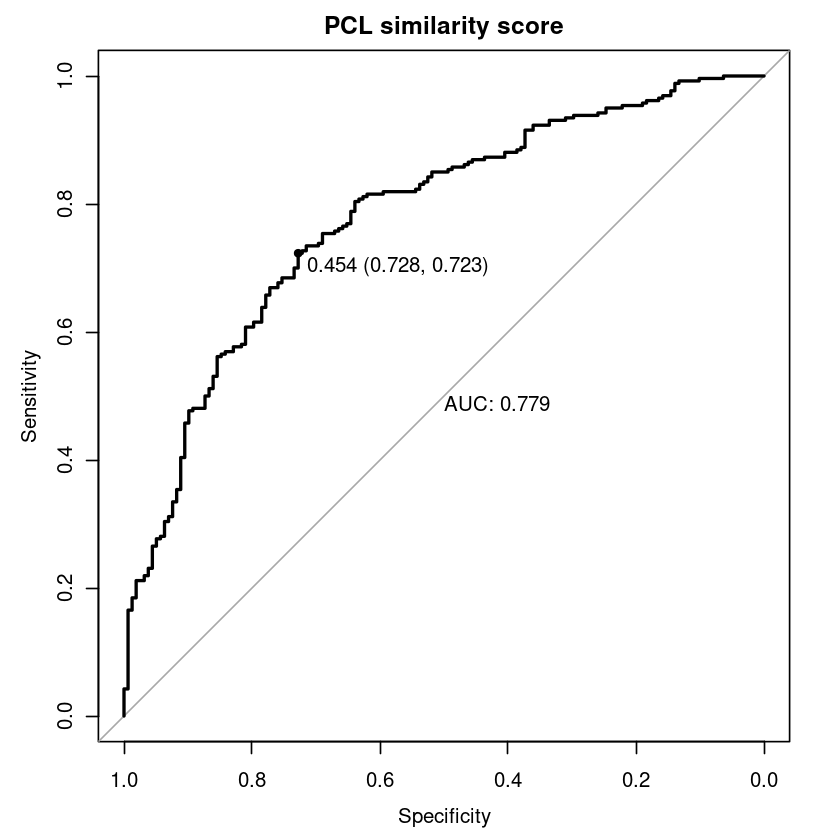

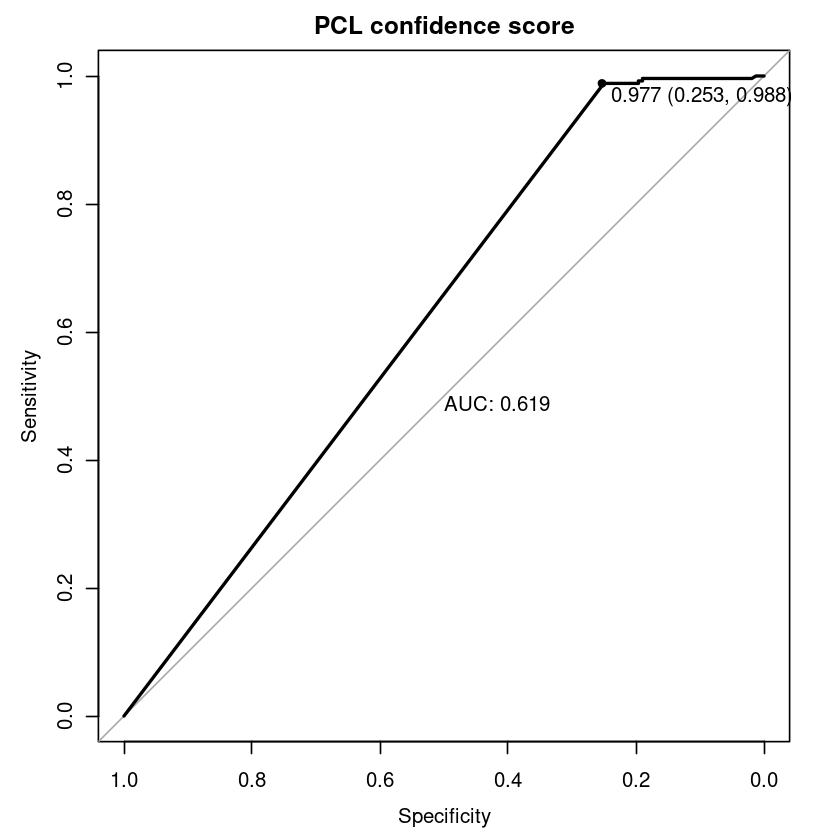

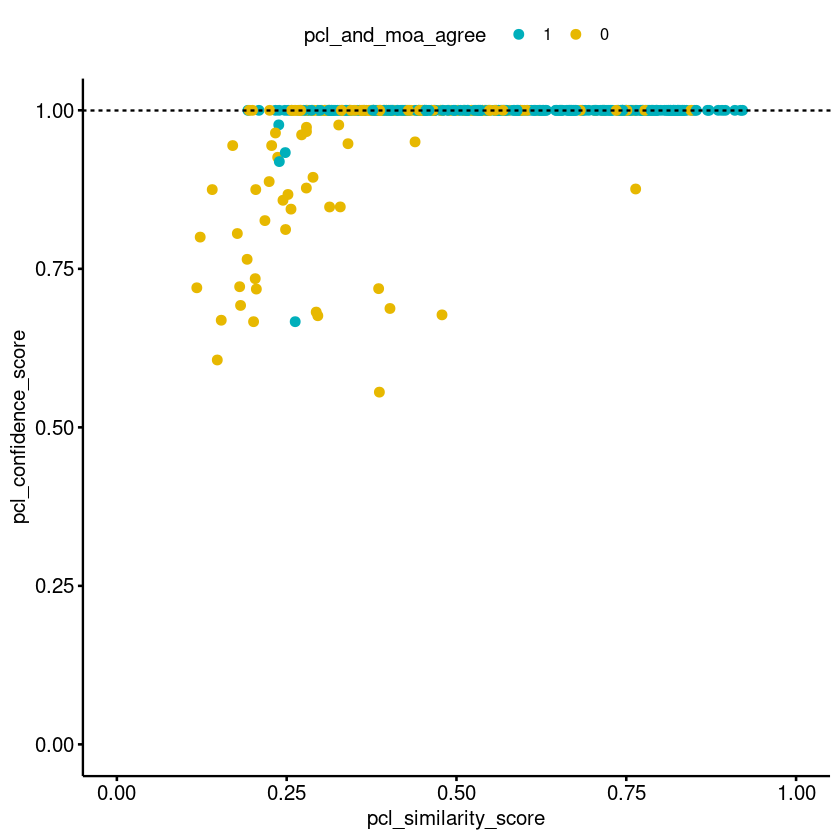

In [385]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs and active - active if minimum, strain curve-fit GR <= 0.3 at highest tested concentrations - pert_id 

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4397975"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.9884233"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs and active (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 337"
[1] "Number of correct MOA assignments: 235"
[1] "Number of incorrect MOA assignments: 77"
[1] "Number of uncertain assignments: 25"
[1] "Precision (PPV): 0.75"
[1] "Sensitivity (TPR): 0.7"
[1] "F1 score: 0.72"
[1] "----------------------------------"


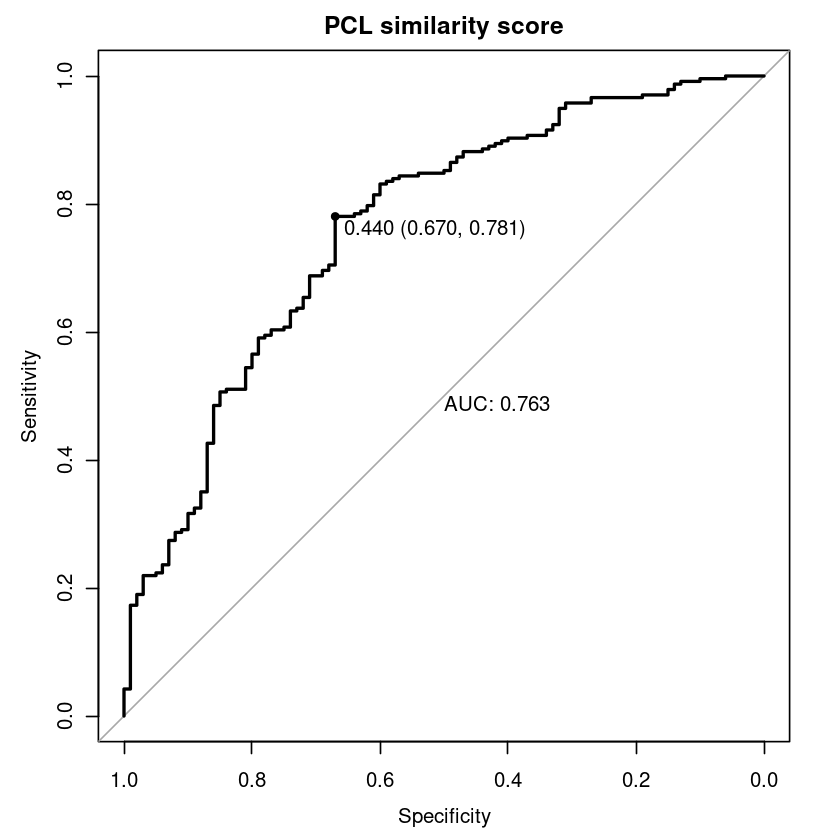

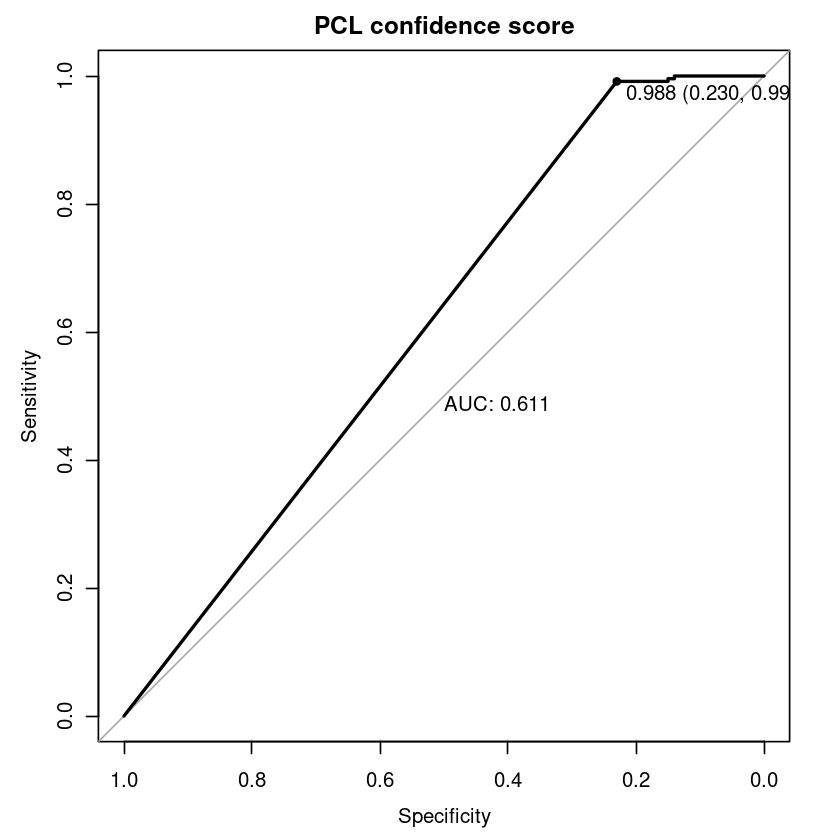

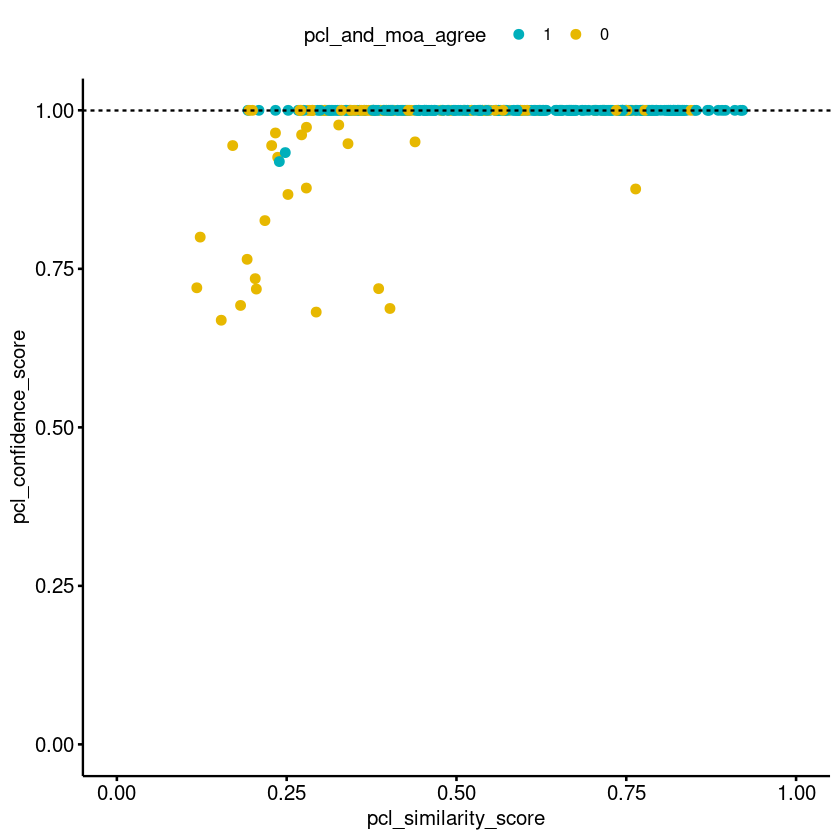

In [386]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs and active (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs but inactive - inactive if minimum, strain curve-fit GR > 0.3 at highest tested concentrations - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.50887785"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.97175375"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 81"
[1] "Number of correct MOA assignments: 21"
[1] "Number of incorrect MOA assignments: 41"
[1] "Number of uncertain assignments: 19"
[1] "Precision (PPV): 0.34"
[1] "Sensitivity (TPR): 0.26"
[1] "F1 score: 0.29"
[1] "----------------------------------"


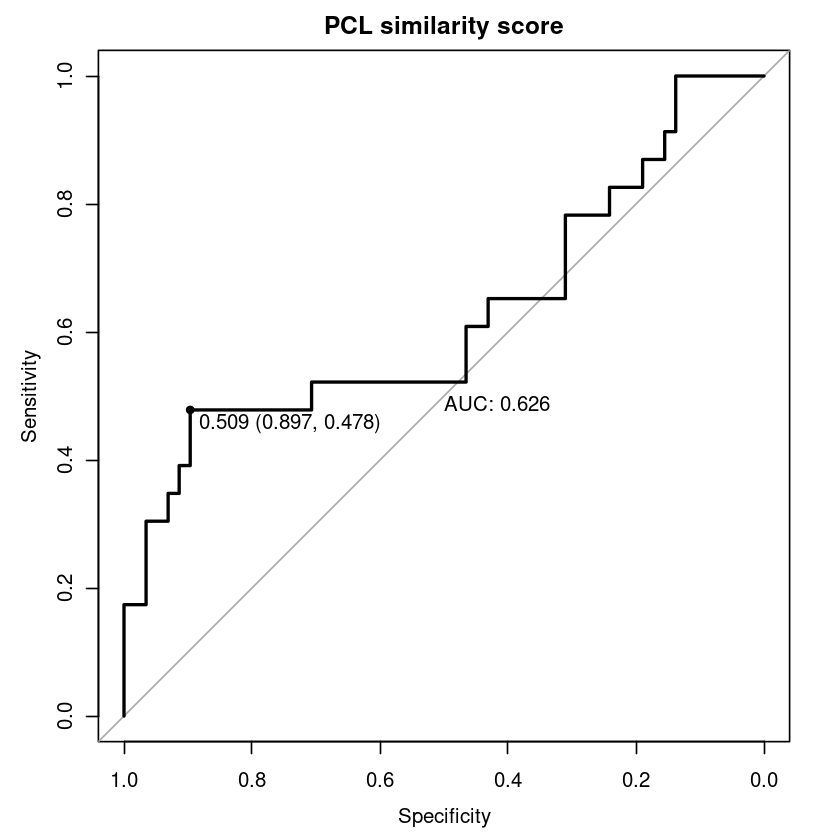

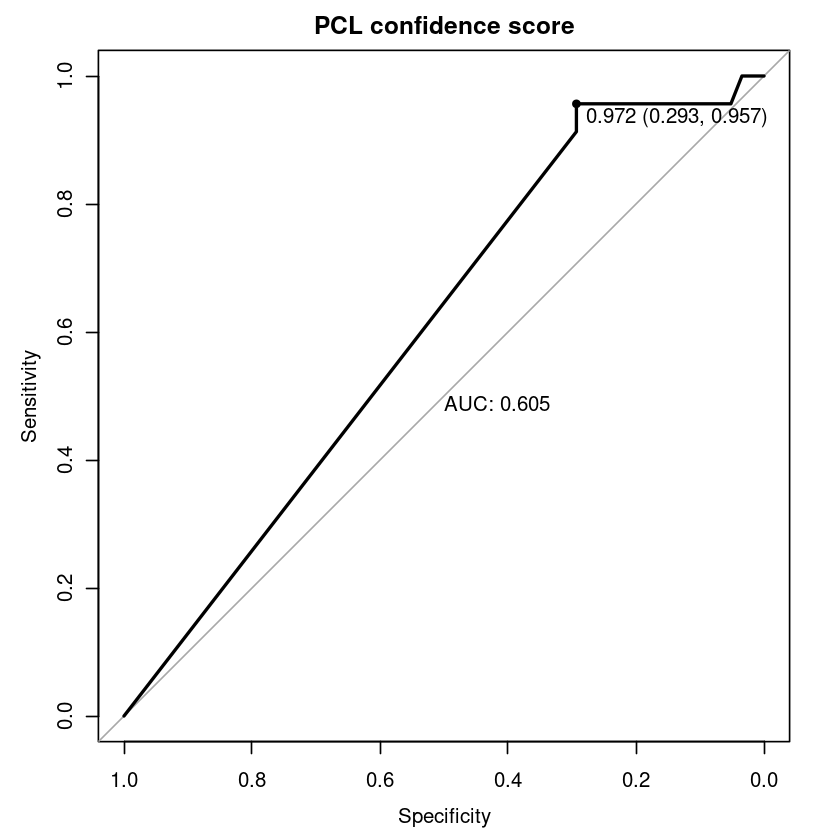

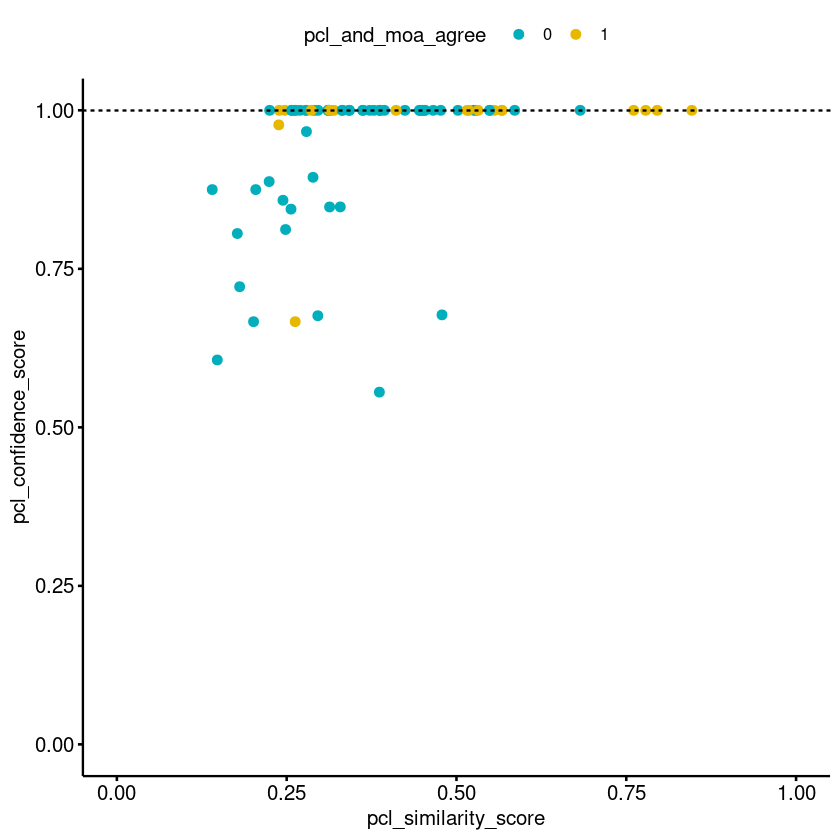

In [387]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & pert_id_only_weak_active_0.3_fit_gr) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - active if minimum, strain curve-fit GR <= 0.3 at highest tested concentrations and well-represented if in multi-compound PCL in full model - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4397975"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.9884233"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 315"
[1] "Number of correct MOA assignments: 233"
[1] "Number of incorrect MOA assignments: 60"
[1] "Number of uncertain assignments: 22"
[1] "Precision (PPV): 0.8"
[1] "Sensitivity (TPR): 0.74"
[1] "F1 score: 0.77"
[1] "----------------------------------"


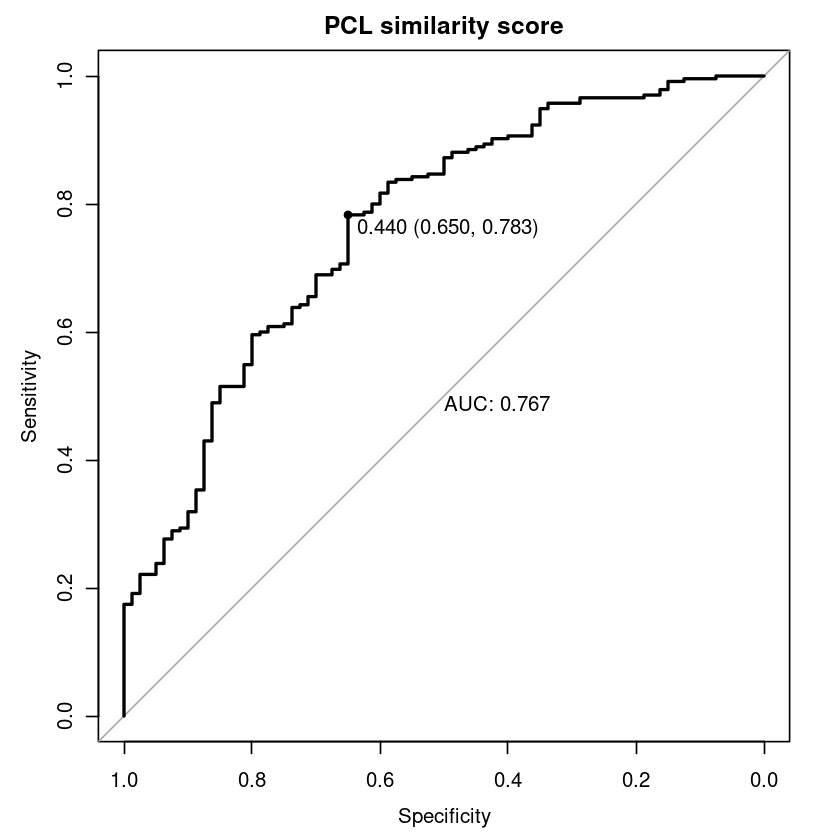

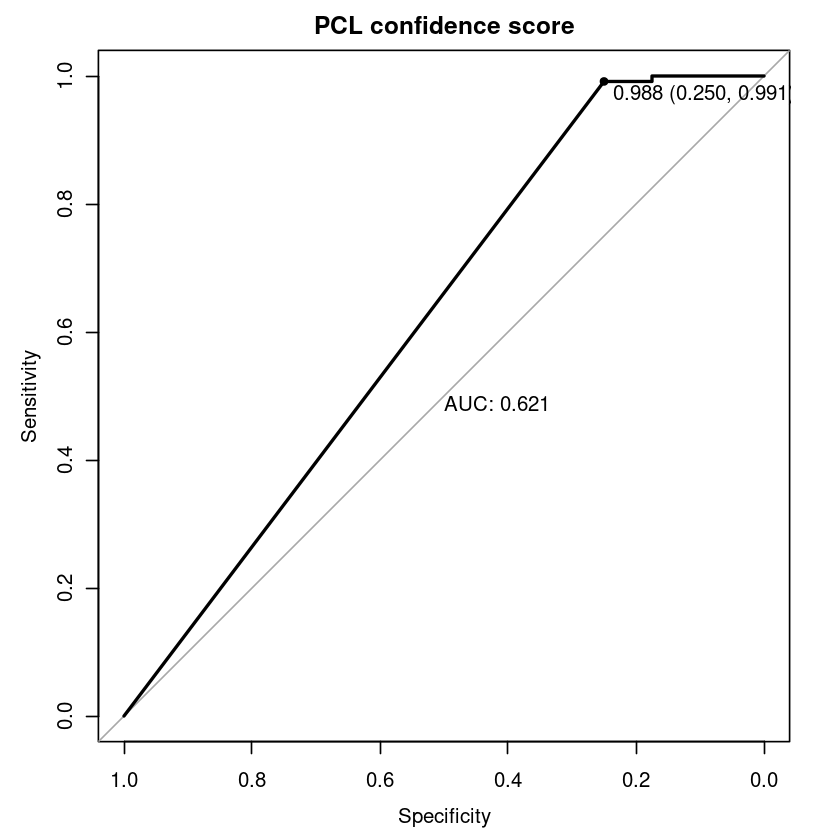

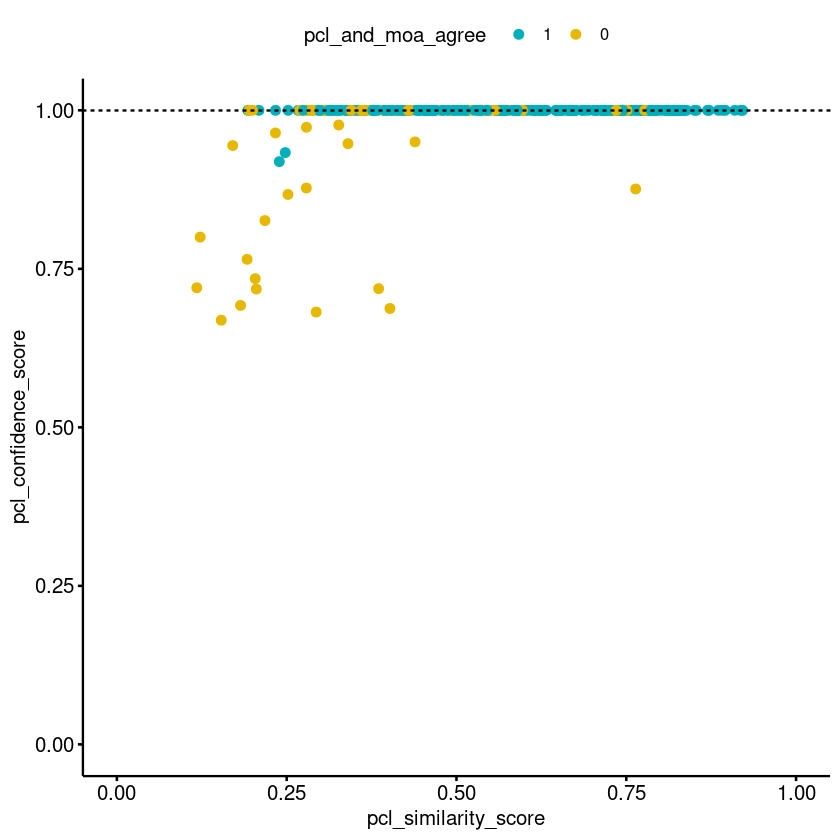

In [388]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOA but inactive and/or not well-represented in KABX - inactive if minimum, strain curve-fit GR > 0.3 at highest tested concentrations and not well-represented if not in PCL or in single-compound PCL only in full model - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.50887785"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.97175375"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive or not well-represented in KABX (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 103"
[1] "Number of correct MOA assignments: 23"
[1] "Number of incorrect MOA assignments: 58"
[1] "Number of uncertain assignments: 22"
[1] "Precision (PPV): 0.28"
[1] "Sensitivity (TPR): 0.22"
[1] "F1 score: 0.25"
[1] "----------------------------------"


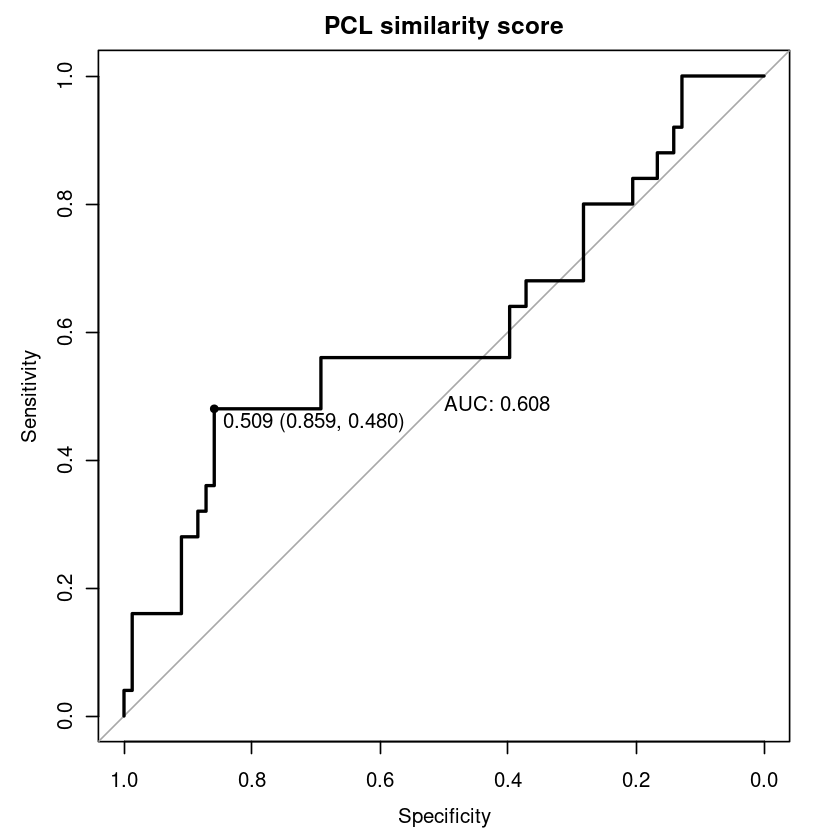

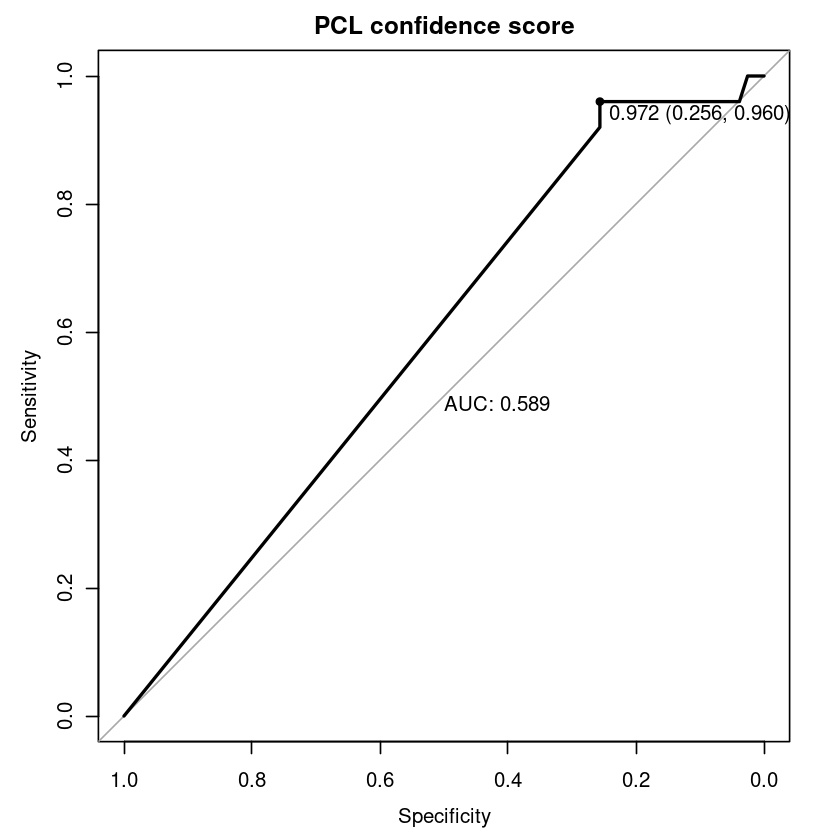

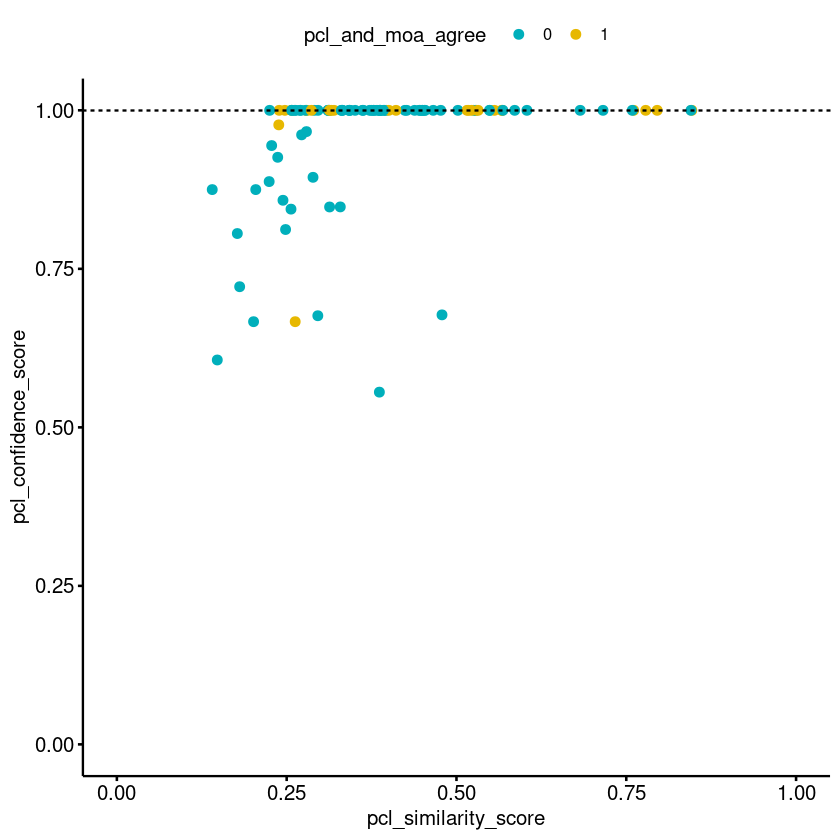

In [389]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & (pert_id_only_weak_active_0.3_fit_gr | !pert_id_in_multi_cmpd_pcl)) %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs but inactive or not well-represented in KABX (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - broad_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.40374595"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.9884233"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at batch level (broad_id)"
[1] "Total number of KABX compounds or treatments evaluated: 378"
[1] "Number of correct MOA assignments: 276"
[1] "Number of incorrect MOA assignments: 67"
[1] "Number of uncertain assignments: 35"
[1] "Precision (PPV): 0.8"
[1] "Sensitivity (TPR): 0.73"
[1] "F1 score: 0.77"
[1] "----------------------------------"


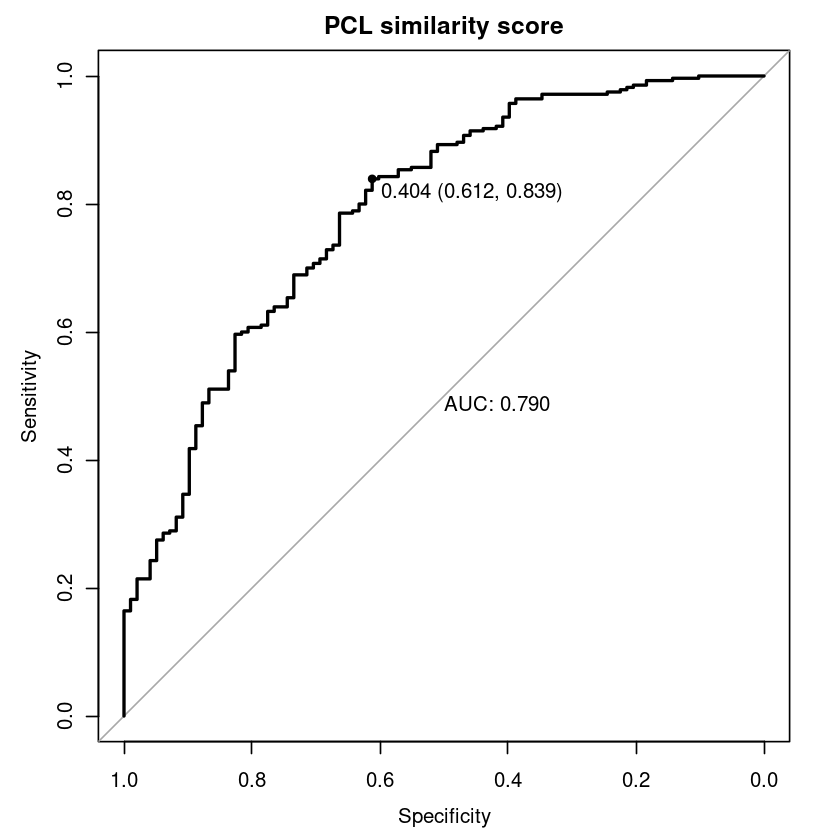

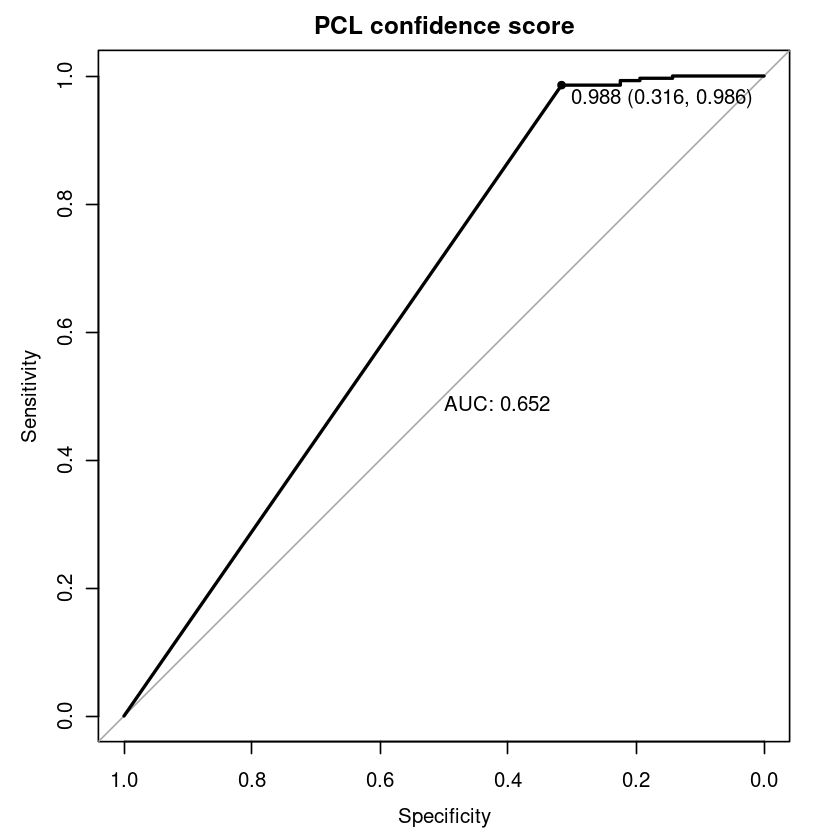

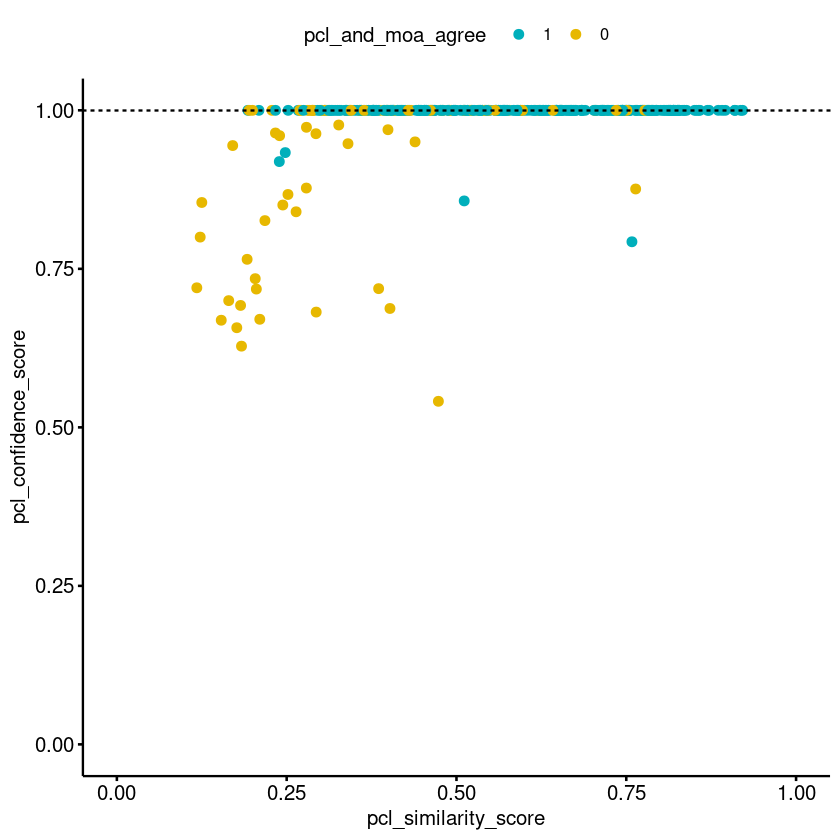

In [160]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(broad_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(broad_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(broad_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at batch level (broad_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - proj_broad_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.4031848"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.9903323"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at screening wave x batch level (proj_broad_id)"
[1] "Total number of KABX compounds or treatments evaluated: 721"
[1] "Number of correct MOA assignments: 473"
[1] "Number of incorrect MOA assignments: 117"
[1] "Number of uncertain assignments: 131"
[1] "Precision (PPV): 0.8"
[1] "Sensitivity (TPR): 0.66"
[1] "F1 score: 0.72"
[1] "----------------------------------"


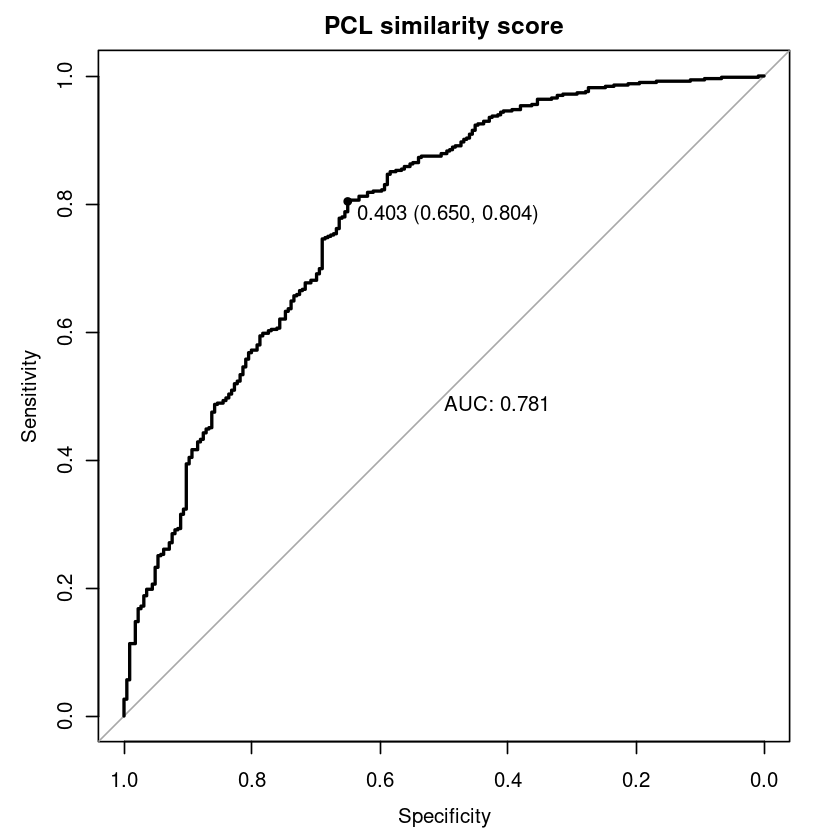

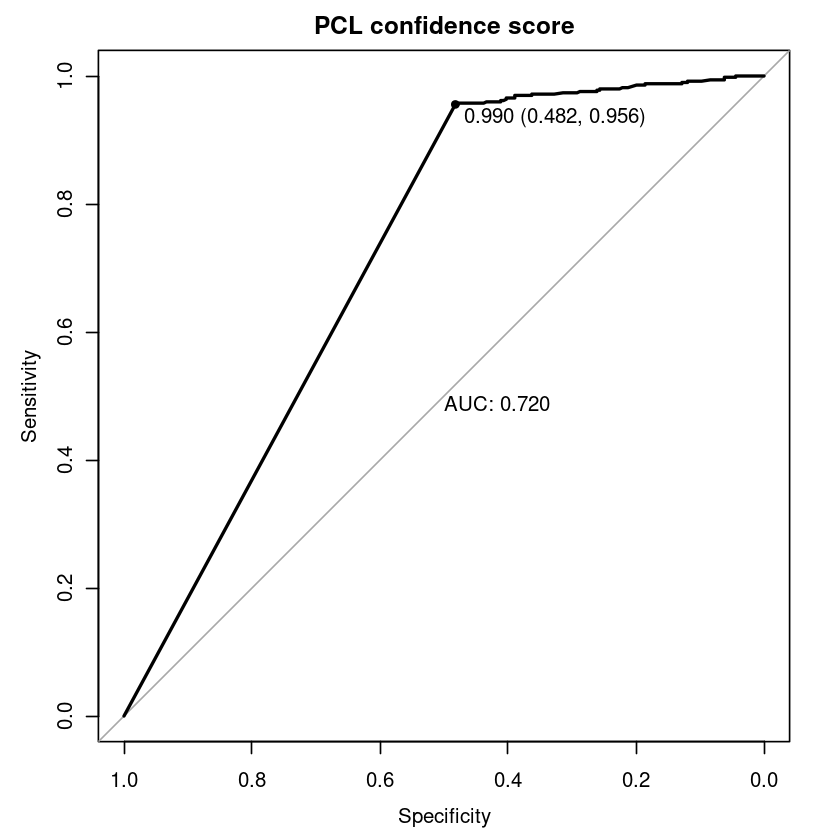

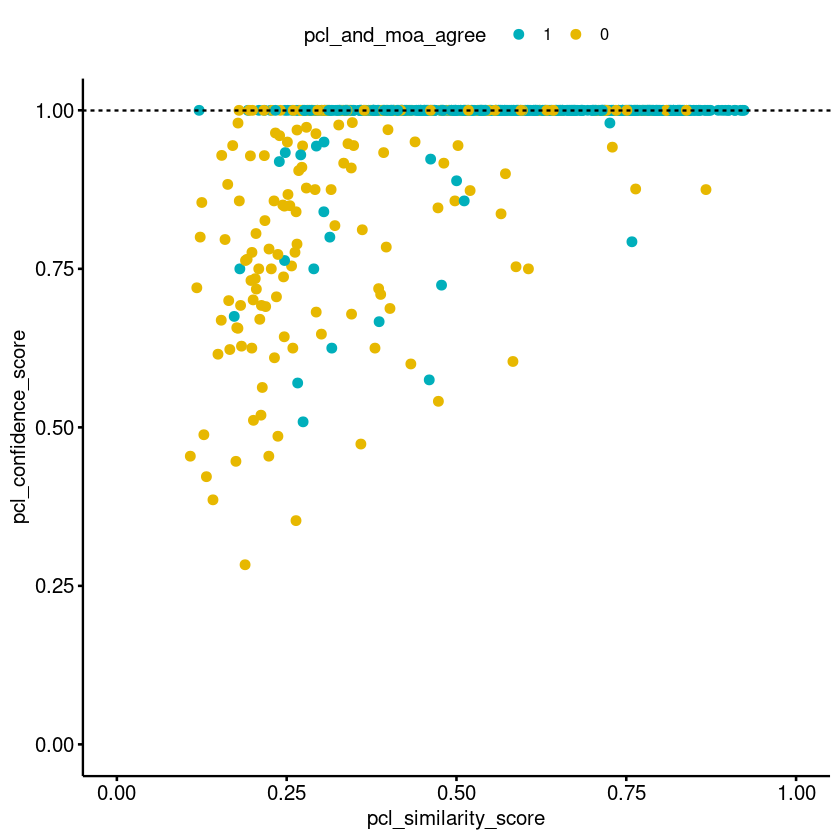

In [161]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(proj_broad_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(proj_broad_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(proj_broad_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at screening wave x batch level (proj_broad_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - treatment/dsCGI profile (cid)

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.28448615"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.7827511"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 7011"
[1] "Number of correct MOA assignments: 2002"
[1] "Number of incorrect MOA assignments: 377"
[1] "Number of uncertain assignments: 4632"
[1] "Precision (PPV): 0.84"
[1] "Sensitivity (TPR): 0.29"
[1] "F1 score: 0.43"
[1] "----------------------------------"


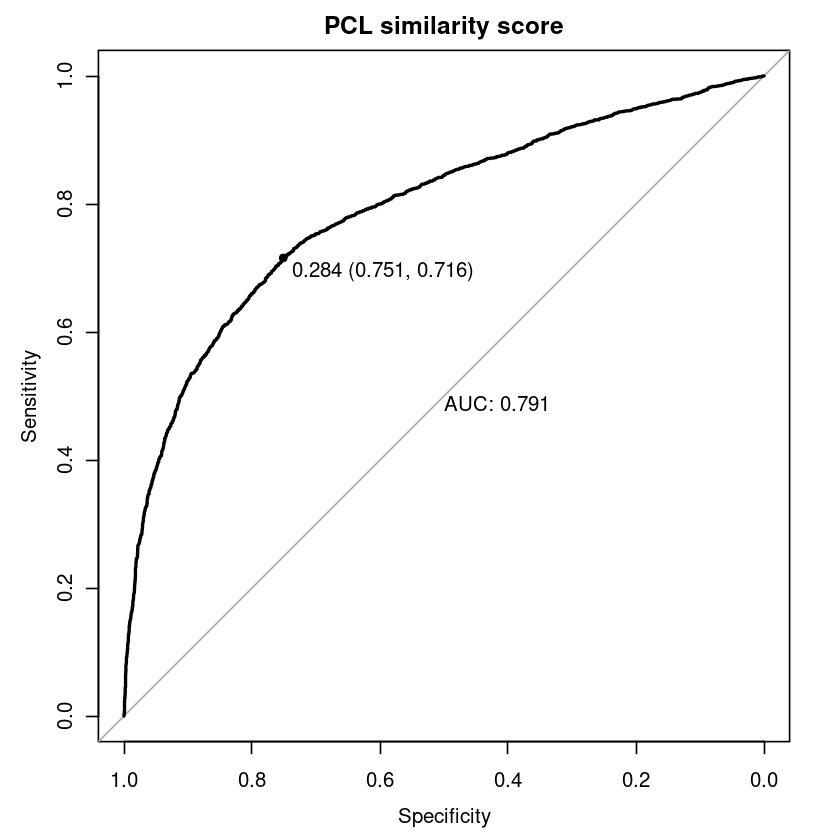

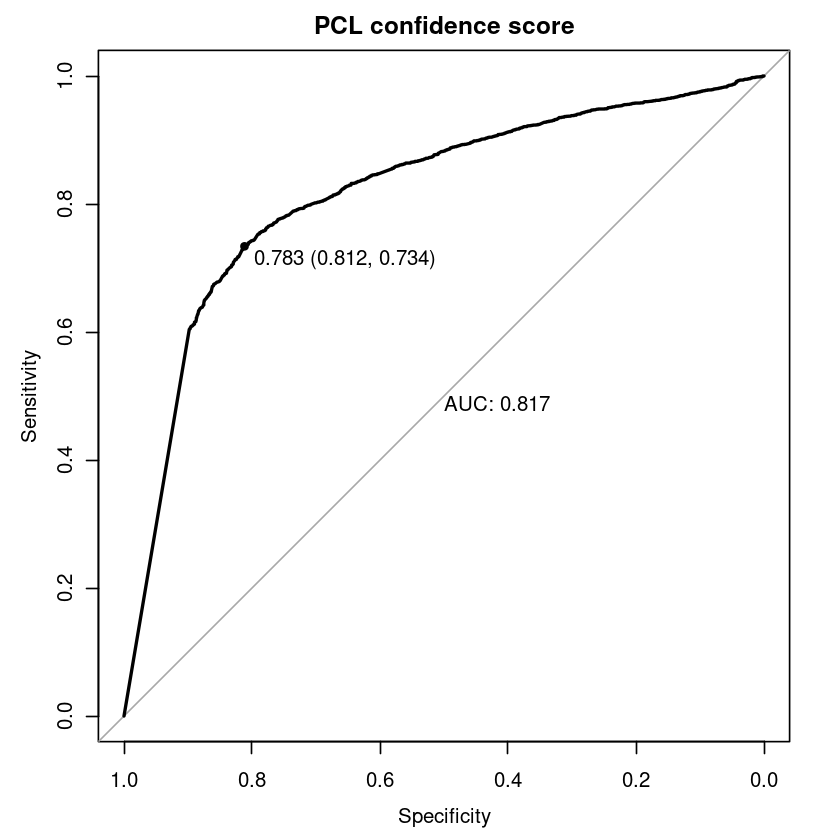

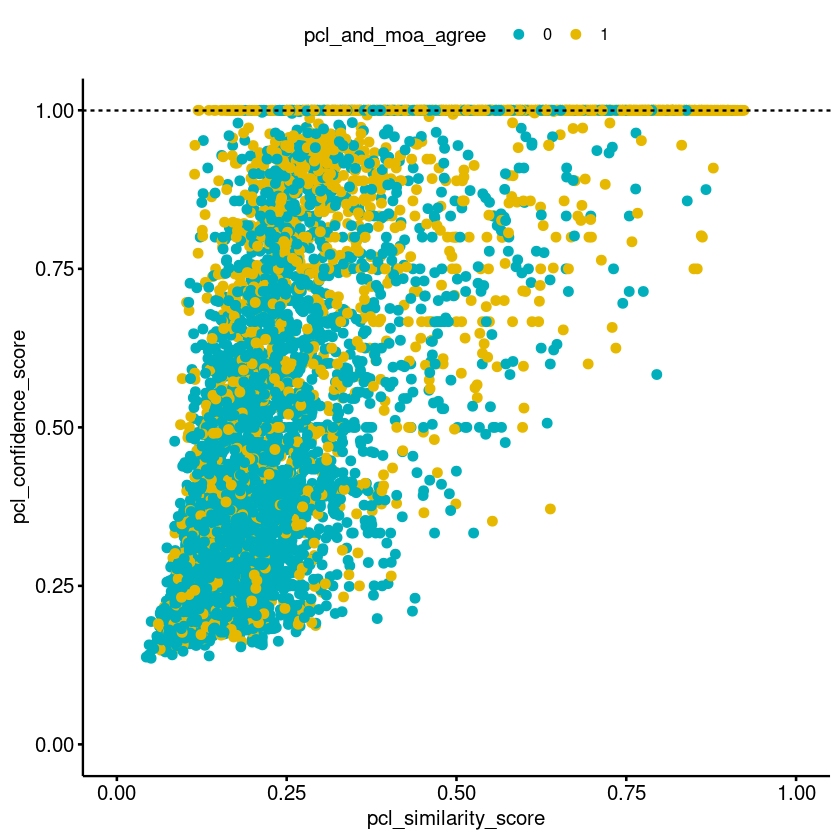

In [162]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(cid) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(cid, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(cid) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### All KABX - all treatment/dsCGI profile-PCL pairs

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.026222355"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.07158605"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 10470531"
[1] "Number of correct MOA assignments: 7525"
[1] "Number of incorrect MOA assignments: 1166"
[1] "Number of uncertain assignments: 10461840"
[1] "Precision (PPV): 0.87"
[1] "Sensitivity (TPR): 0.00072"
[1] "F1 score: 0.001"
[1] "----------------------------------"


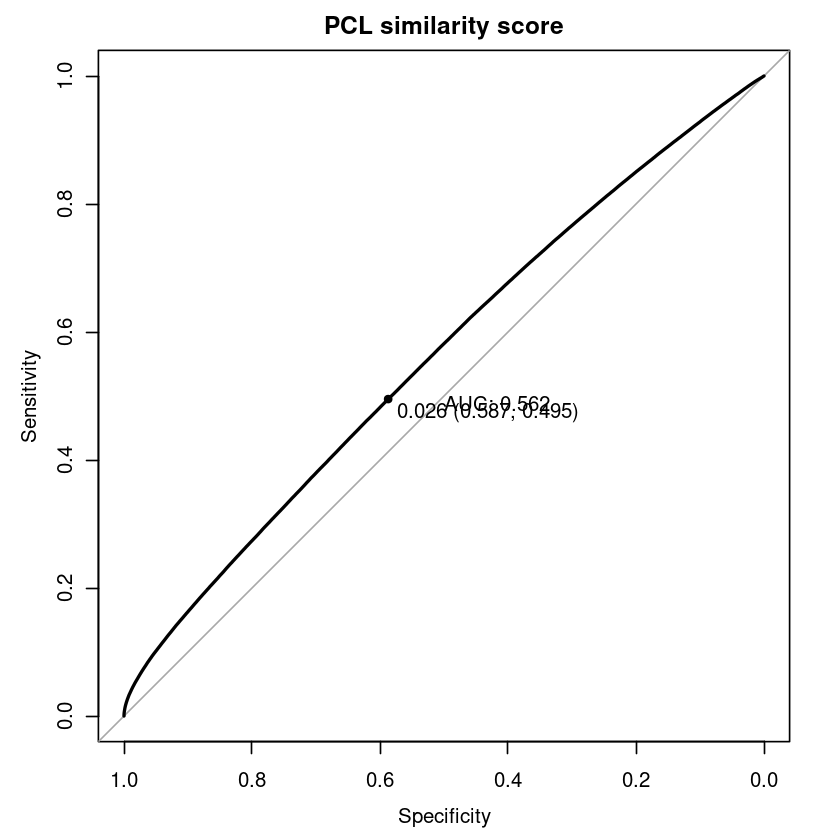

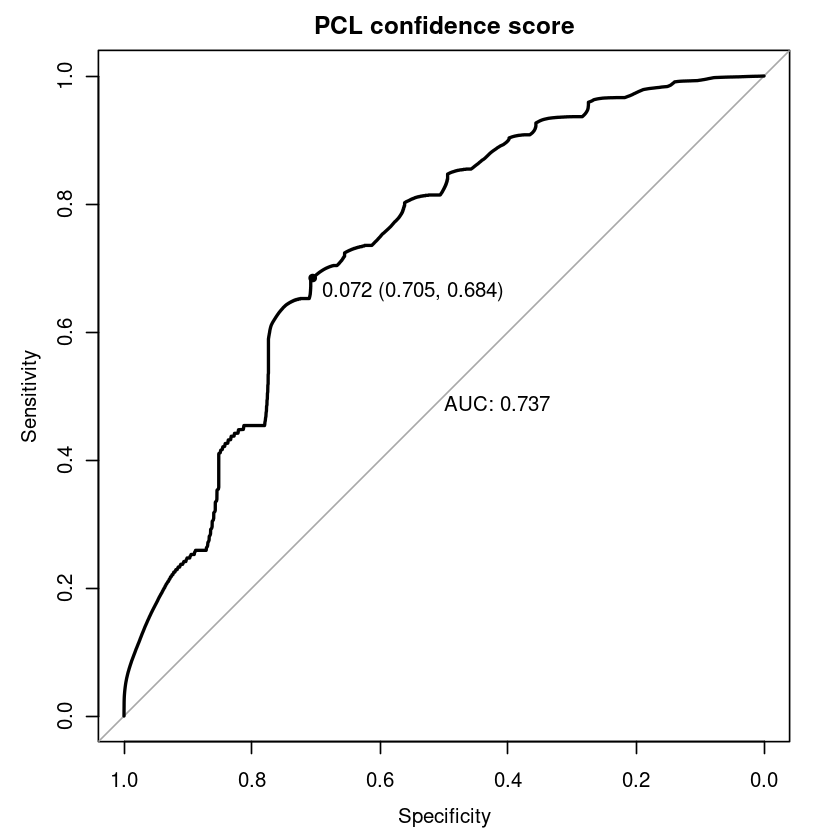

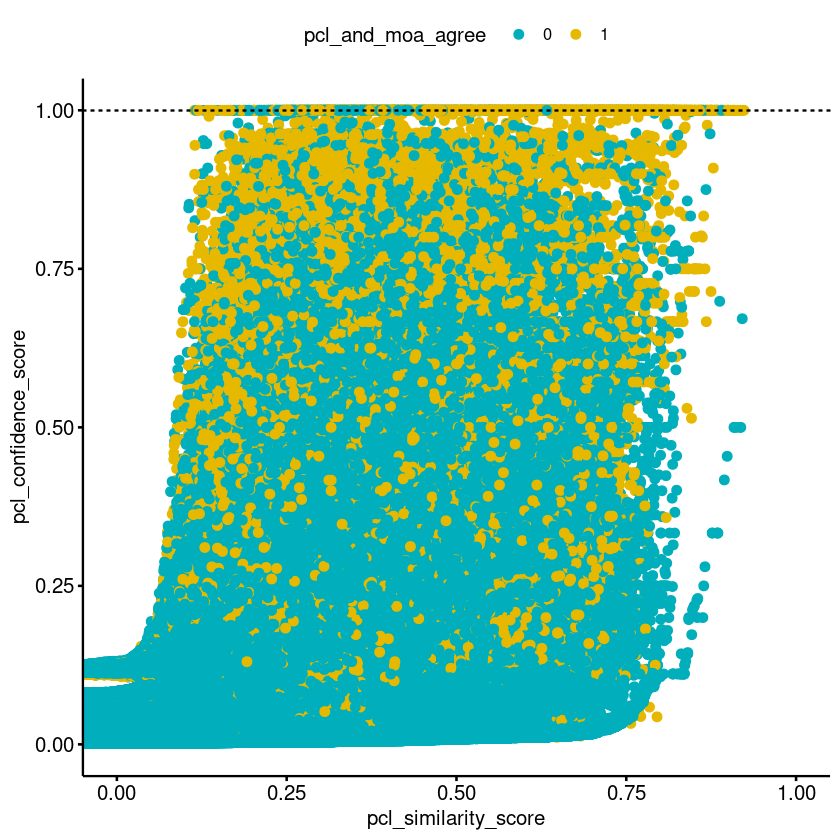

In [163]:
loocv_kabx_preds = loocv_combined_results_full_shared

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### KABX in multi-compound MOAs, active, and well-represented in KABX - all treatment/dsCGI profile-PCL pairs

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.026259405"


Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL confidence score threshold is: 0.07075464"
[1] "Defined high-confidence PCL confidence score threshold is: 1"
[1] "----------------------------------"
[1] "Using high-confidence PCL confidence score threshold of 1 to assign MOA"
[1] "LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)"
[1] "Total number of KABX compounds or treatments evaluated: 7793836"
[1] "Number of correct MOA assignments: 7271"
[1] "Number of incorrect MOA assignments: 885"
[1] "Number of uncertain assignments: 7785680"
[1] "Precision (PPV): 0.89"
[1] "Sensitivity (TPR): 0.00093"
[1] "F1 score: 0.002"
[1] "----------------------------------"


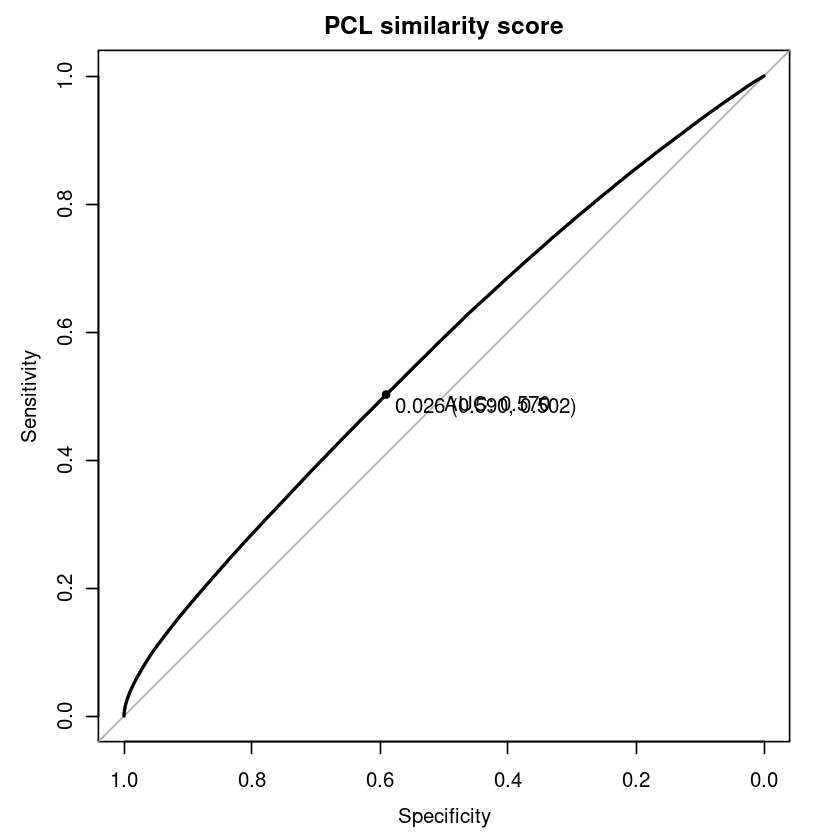

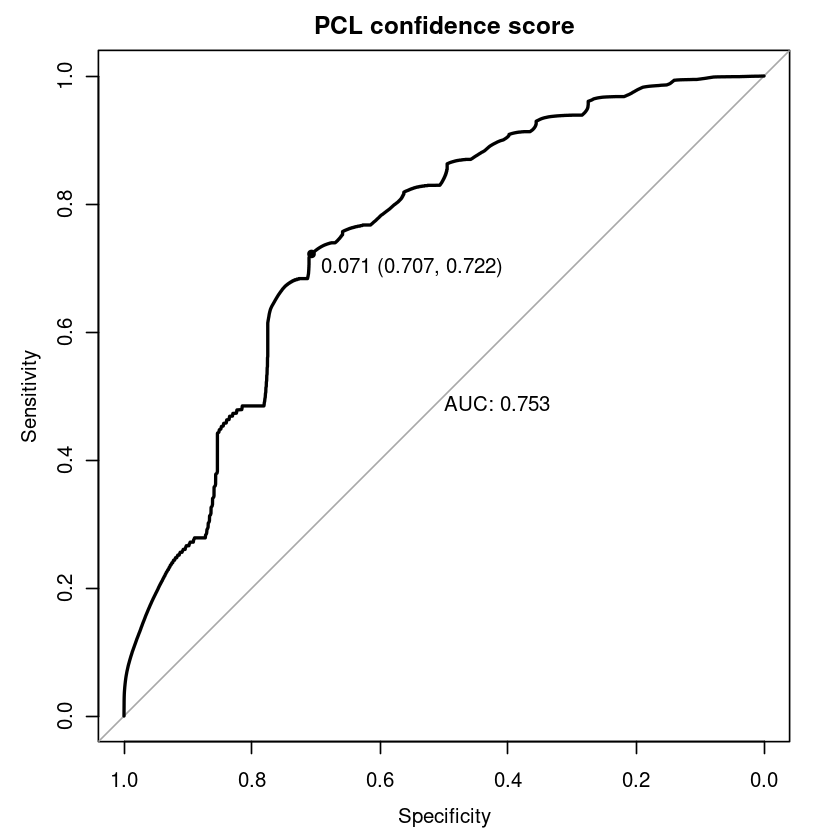

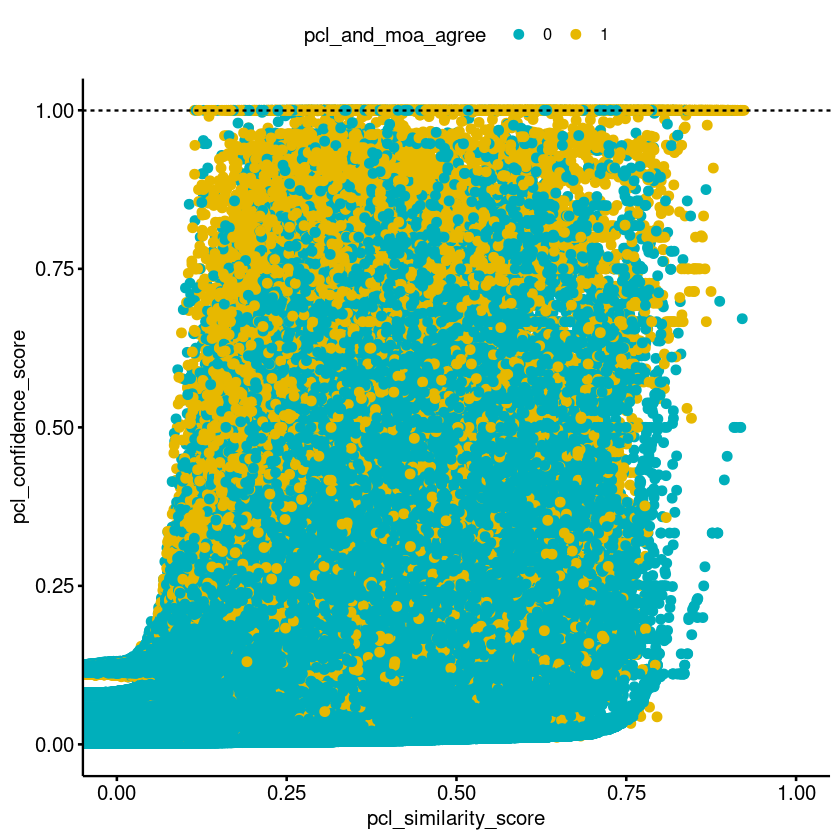

In [164]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score
    
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)
}
### End ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_confidence_score
actual <- loocv_kabx_preds$pcl_and_moa_agree

if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_confidence_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL confidence score threshold is: ", optimal_pcl_confidence_score))

    loocv_kabx_preds_results_optimal_pcl_confidence_score_threshold = optimal_pcl_confidence_score
}
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_confidence_score_threshold = 1

print(str_c("Defined high-confidence PCL confidence score threshold is: ", high_confidence_pcl_confidence_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_confidence_score >= high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_confidence_score < high_confidence_pcl_confidence_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL confidence score threshold of %d to assign MOA', high_confidence_pcl_confidence_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX at treatment/dsCGI profile level (cid)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL confidence score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_hline(yintercept = high_confidence_pcl_confidence_score_threshold, linetype = "dashed")

#### Check accuracy using single, optimal PCL similarity score threshold for all PCLs/MOAs and MOA prediction made as PCL with highest similarity score to compound (as opposed to highest confidence score)

##### All KABX - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.6323394"
[1] "Defined high-confidence PCL similarity score threshold is: 0.6323394"
[1] "----------------------------------"
[1] "Using high-confidence PCL similarity score threshold of 0.632339 to assign MOA"
[1] "LOOCV accuracy on all KABX compounds using single PCL similarity score threshold (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 165"
[1] "Number of incorrect MOA assignments: 83"
[1] "Number of uncertain assignments: 189"
[1] "Precision (PPV): 0.67"
[1] "Sensitivity (TPR): 0.38"
[1] "F1 score: 0.48"
[1] "----------------------------------"


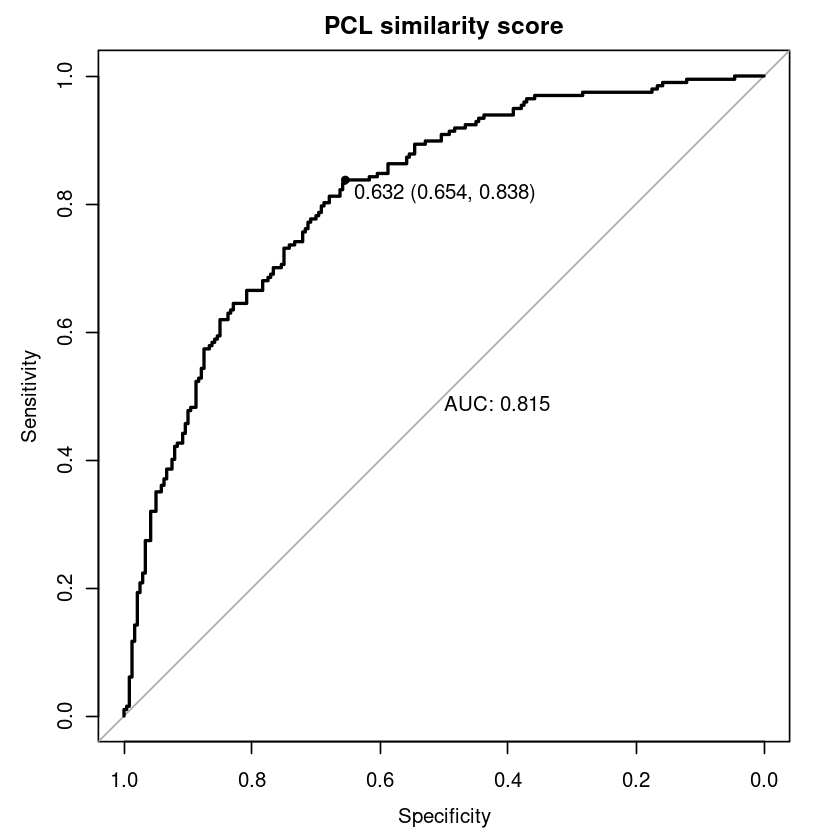

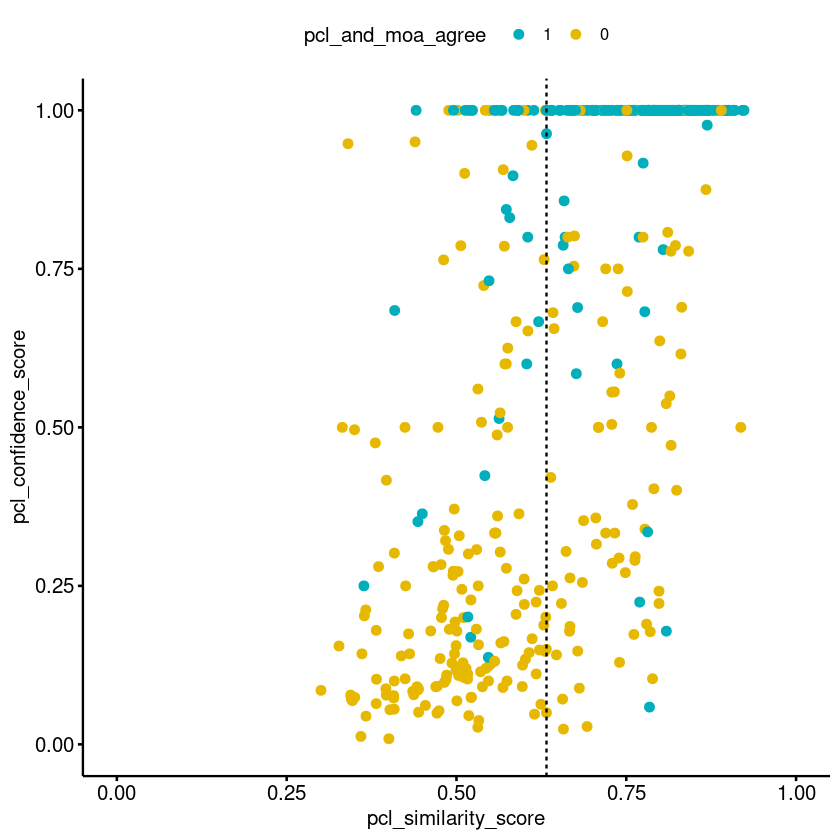

In [165]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    group_by(pert_id) %>%
    arrange(desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score

}
### End ROC for PCL similarity score
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_similarity_score_threshold = loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold

print(str_c("Defined high-confidence PCL similarity score threshold is: ", high_confidence_pcl_similarity_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL similarity score threshold of %f to assign MOA', high_confidence_pcl_similarity_score_threshold))
print("LOOCV accuracy on all KABX compounds using single PCL similarity score threshold (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_vline(xintercept = high_confidence_pcl_similarity_score_threshold, linetype = "dashed")

##### KABX in multi-compound MOAs - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.6323394"
[1] "Defined high-confidence PCL similarity score threshold is: 0.6323394"
[1] "----------------------------------"
[1] "Using high-confidence PCL similarity score threshold of 0.632339 to assign MOA"
[1] "LOOCV accuracy on all KABX compounds using single PCL similarity score threshold (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 165"
[1] "Number of incorrect MOA assignments: 83"
[1] "Number of uncertain assignments: 189"
[1] "Precision (PPV): 0.67"
[1] "Sensitivity (TPR): 0.38"
[1] "F1 score: 0.48"
[1] "----------------------------------"


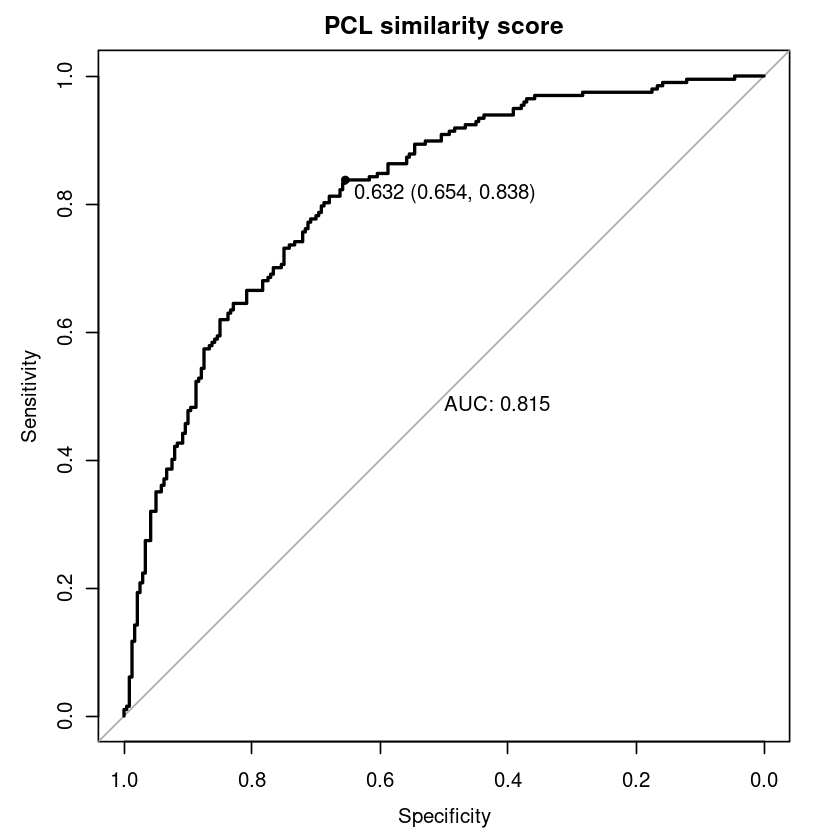

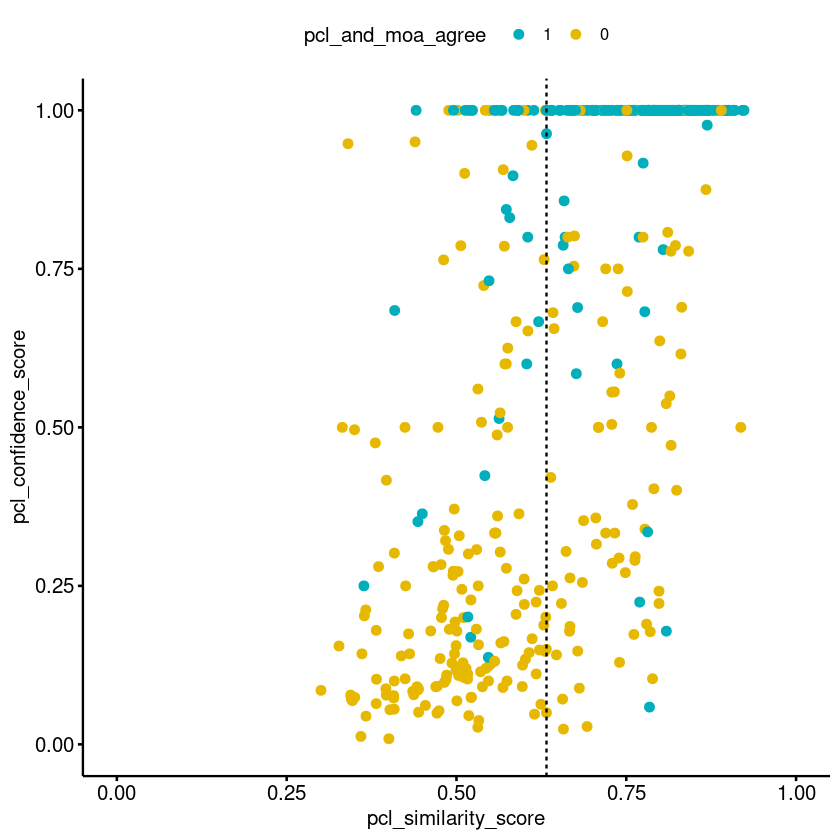

In [165]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa) %>%
    group_by(pert_id) %>%
    arrange(desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score

}
### End ROC for PCL similarity score
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_similarity_score_threshold = loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold

print(str_c("Defined high-confidence PCL similarity score threshold is: ", high_confidence_pcl_similarity_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL similarity score threshold of %f to assign MOA', high_confidence_pcl_similarity_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs using single PCL similarity score threshold (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_vline(xintercept = high_confidence_pcl_similarity_score_threshold, linetype = "dashed")

##### KABX in multi-compound MOAs and active - pert_id 

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.6323394"
[1] "Defined high-confidence PCL similarity score threshold is: 0.6323394"
[1] "----------------------------------"
[1] "Using high-confidence PCL similarity score threshold of 0.632339 to assign MOA"
[1] "LOOCV accuracy on all KABX compounds using single PCL similarity score threshold (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 165"
[1] "Number of incorrect MOA assignments: 83"
[1] "Number of uncertain assignments: 189"
[1] "Precision (PPV): 0.67"
[1] "Sensitivity (TPR): 0.38"
[1] "F1 score: 0.48"
[1] "----------------------------------"


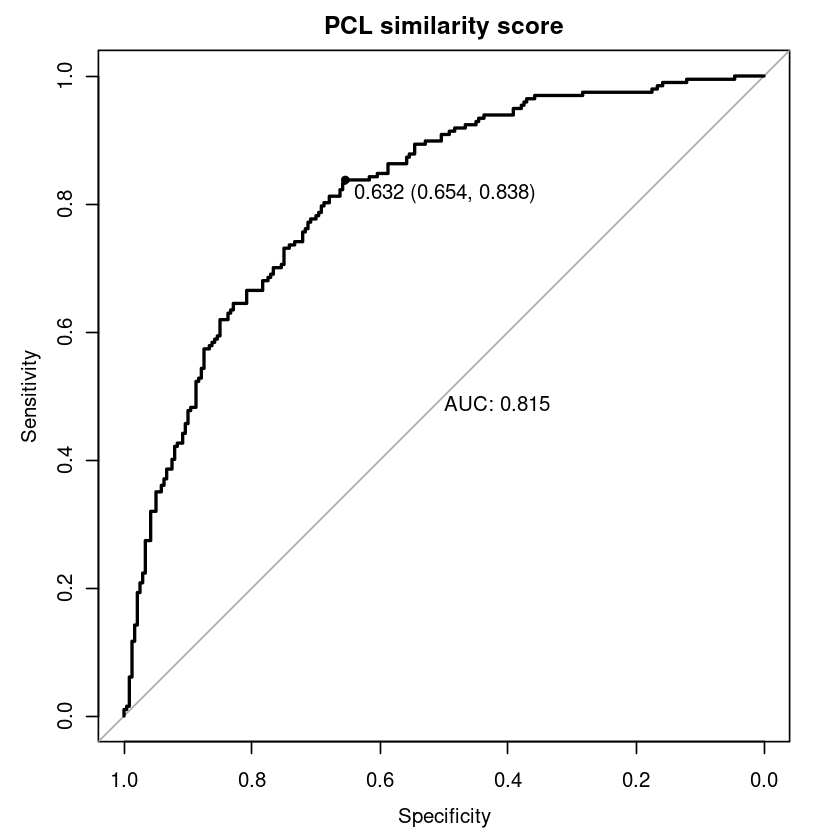

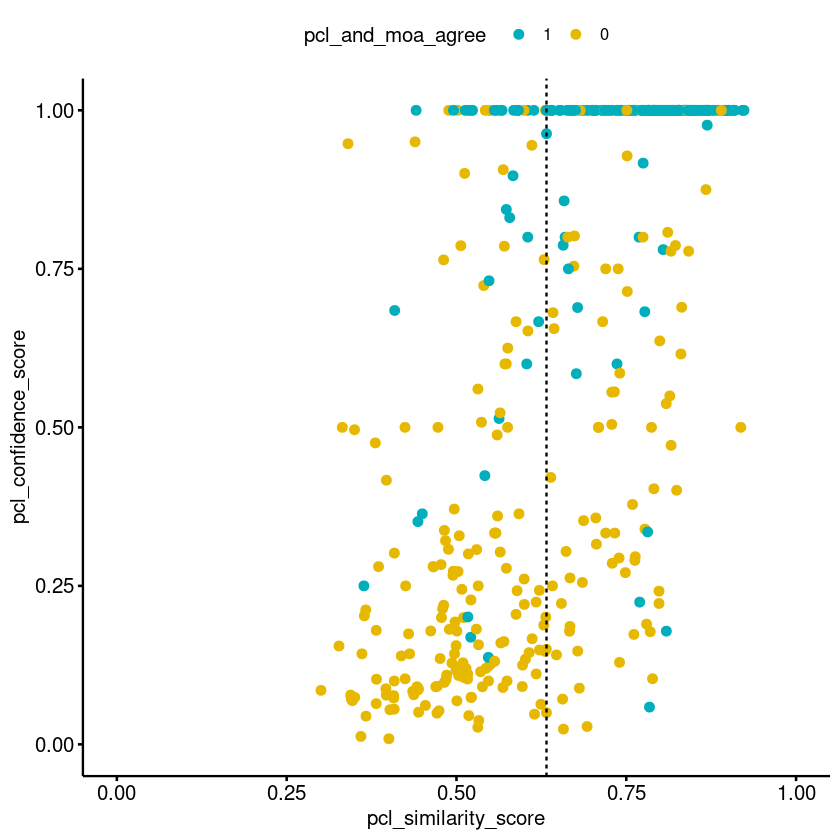

In [165]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr) %>%
    group_by(pert_id) %>%
    arrange(desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score

}
### End ROC for PCL similarity score
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_similarity_score_threshold = loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold

print(str_c("Defined high-confidence PCL similarity score threshold is: ", high_confidence_pcl_similarity_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL similarity score threshold of %f to assign MOA', high_confidence_pcl_similarity_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs and active using single PCL similarity score threshold (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_vline(xintercept = high_confidence_pcl_similarity_score_threshold, linetype = "dashed")

##### KABX in multi-compound MOAs, active, and well-represented in KABX - pert_id

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Optimal PCL similarity score threshold is: 0.6323394"
[1] "Defined high-confidence PCL similarity score threshold is: 0.6323394"
[1] "----------------------------------"
[1] "Using high-confidence PCL similarity score threshold of 0.632339 to assign MOA"
[1] "LOOCV accuracy on all KABX compounds using single PCL similarity score threshold (pert_id)"
[1] "Total number of KABX compounds or treatments evaluated: 437"
[1] "Number of correct MOA assignments: 165"
[1] "Number of incorrect MOA assignments: 83"
[1] "Number of uncertain assignments: 189"
[1] "Precision (PPV): 0.67"
[1] "Sensitivity (TPR): 0.38"
[1] "F1 score: 0.48"
[1] "----------------------------------"


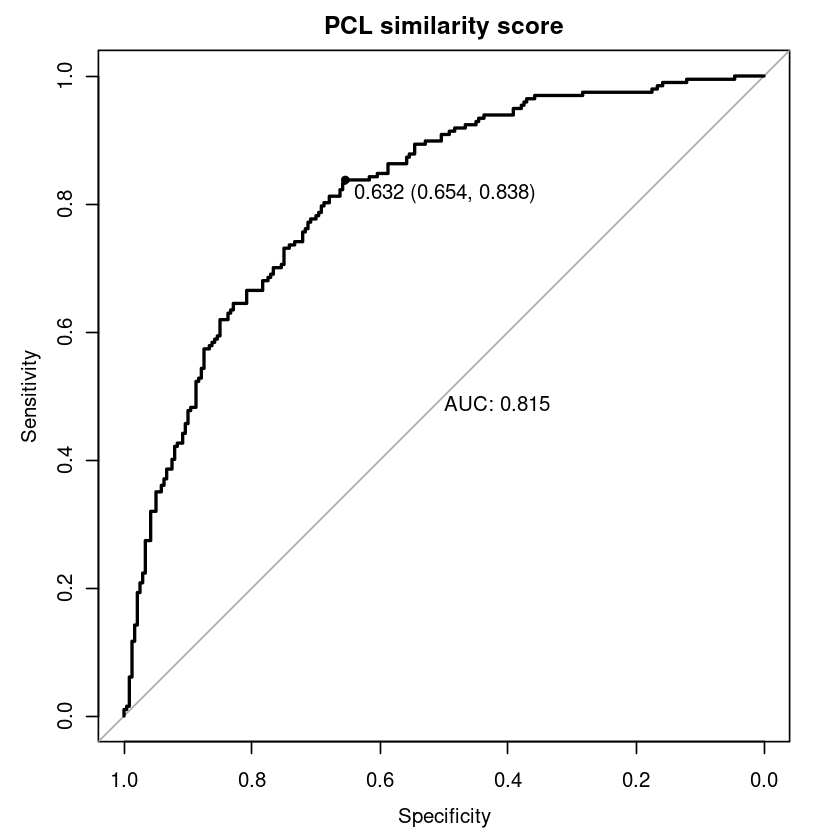

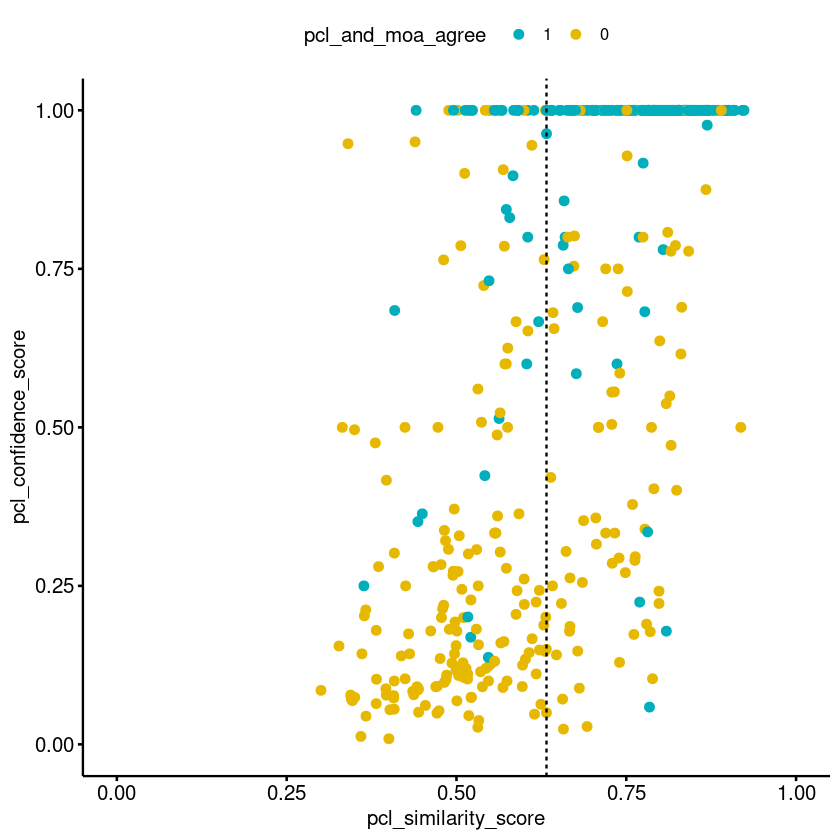

In [165]:
loocv_kabx_preds = loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & !pert_id_only_weak_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl) %>%
    group_by(pert_id) %>%
    arrange(desc(pcl_similarity_score), .by_group = TRUE) %>%
    slice(1)

### ROC for PCL similarity score

predicted <- loocv_kabx_preds$pcl_similarity_score
actual <- loocv_kabx_preds$pcl_and_moa_agree


if (!(all(actual) == 1)){

    # Calculate the ROC curve and AUC
    rocData <- roc(actual, predicted)
    auc <- auc(rocData)

    coords(rocData, "best")


    optimal_pcl_similarity_score = coords(rocData, "best") %>% pull(threshold)

    print(str_c("Optimal PCL similarity score threshold is: ", optimal_pcl_similarity_score))

    loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold = optimal_pcl_similarity_score

}
### End ROC for PCL similarity score
    
loocv_kabx_preds_results_n = nrow(loocv_kabx_preds)

high_confidence_pcl_similarity_score_threshold = loocv_kabx_preds_results_optimal_pcl_similarity_score_threshold

print(str_c("Defined high-confidence PCL similarity score threshold is: ", high_confidence_pcl_similarity_score_threshold))

loocv_kabx_preds_results_tp = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_fp = sum(loocv_kabx_preds$pcl_and_moa_agree == 0 & loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_tpr = loocv_kabx_preds_results_tp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_fpr = loocv_kabx_preds_results_fp / loocv_kabx_preds_results_n
loocv_kabx_preds_results_ppv = loocv_kabx_preds_results_tp / sum(loocv_kabx_preds$pcl_similarity_score >= high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_f1 = calc_f1(loocv_kabx_preds_results_ppv, loocv_kabx_preds_results_tpr)
loocv_kabx_preds_results_fns = sum(loocv_kabx_preds$pcl_and_moa_agree == 1 & loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)
loocv_kabx_preds_results_ns = sum(loocv_kabx_preds$pcl_similarity_score < high_confidence_pcl_similarity_score_threshold)

print('----------------------------------')
print(sprintf('Using high-confidence PCL similarity score threshold of %f to assign MOA', high_confidence_pcl_similarity_score_threshold))
print("LOOCV accuracy on KABX compounds in multi-compound MOAs, active, and well-represented in KABX using single PCL similarity score threshold (pert_id)")
print(str_c("Total number of KABX compounds or treatments evaluated: ", loocv_kabx_preds_results_n))
print(str_c("Number of correct MOA assignments: ", loocv_kabx_preds_results_tp))
print(str_c("Number of incorrect MOA assignments: ", loocv_kabx_preds_results_fp))
print(str_c("Number of uncertain assignments: ", loocv_kabx_preds_results_ns))
print(str_c("Precision (PPV): ", signif(loocv_kabx_preds_results_ppv, 2)))
print(str_c("Sensitivity (TPR): ", signif(loocv_kabx_preds_results_tpr, 2)))
print(str_c("F1 score: ", signif(loocv_kabx_preds_results_f1, 2)))

print('----------------------------------')

if (!(all(actual) == 1)){
    # Plot the ROC curve
    plot(rocData, main = "PCL similarity score", print.thres = TRUE, print.auc = TRUE)

    #coords(rocData, "best")
}

ggscatter(loocv_kabx_preds %>% mutate(pcl_and_moa_agree = as.factor(pcl_and_moa_agree)), 
          x = "pcl_similarity_score", 
          y = "pcl_confidence_score",
          color = "pcl_and_moa_agree",
          palette = c("#00AFBB", "#E7B800"),
          xlim = c(0, 1),
          ylim = c(0, 1)
         ) + geom_vline(xintercept = high_confidence_pcl_similarity_score_threshold, linetype = "dashed")

## Make KABX set PCL-based MOA predictions in LOOCV (demo)

In [329]:
dim(loocv_combined_results)
head(loocv_combined_results)

print("All KABX compounds")
loocv_combined_results %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Validatable (in multi-compound MOA) KABX compounds")
loocv_combined_results %>%
    filter(cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA) KABX compounds")
loocv_combined_results %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA), and well-represented KABX compounds")
loocv_combined_results %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa & pert_id_in_multi_cmpd_pcl) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] 10519174       42

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,...,pcl_f1_score,pcl_size,pcl_num_pert_ids_unique,pcl_num_broad_ids_unique,pcl_pert_ids,pcl_broad_ids,pcl_cids,pcl_from_single_cmpd_moa,pcl_multi_cmpd,pcl_multi_cmpd_or_single_cmpd_moa
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,...,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392076,0.2822036,0,0.05542725,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105439,0.6339073,0,0.05747126,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,...,0.148,4,3,3,BRD-K01825150|BRD-A62336573|BRD-K40939496,BRD-K01825150-001-16-9|BRD-A62336573-001-05-6|BRD-K40939496-001-01-5,kabx2:BRD-K01825150-001-16-9:50.000000uM|kabx2:BRD-A62336573-001-05-6:0.781250uM|kabx2:BRD-K40939496-001-01-5:3.125000uM|kabx2:BRD-K40939496-001-01-5:0.781250uM,FALSE,TRUE,TRUE


[1] "All KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4240,70,437,505,967,9427


[1] "Validatable (in multi-compound MOA) KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4235,70,418,483,924,9006


[1] "Active, validatable (in multi-compound MOA) KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4130,70,337,400,763,7427


[1] "Active, validatable (in multi-compound MOA), and well-represented KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4093,70,315,378,721,7011


In [330]:
print("All KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results %>%
    filter(pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results %>%
    filter(cmpd_from_validatable_moa & pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa & pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA), and well-represented KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa & pert_id_in_multi_cmpd_pcl & pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] "All KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1932,63,388,440,722,2624


[1] "Validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1908,61,372,424,693,2557


[1] "Active, validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1829,57,311,362,615,2412


[1] "Active, validatable (in multi-compound MOA), and well-represented KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1793,54,292,343,588,2360


### Make predictions

#### Pert ID (allow multiple PCLs)

In [340]:
pert_id_demo_loocv_preds_multi = loocv_combined_results %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    mutate(
        matched_rids = paste0(unique(rid), collapse = "|"),
        matched_pcl_descs = paste0(unique(pcl_desc), collapse = "|"),
        
        has_multiple_matched_rids = n_distinct(rid) > 1,
        has_multiple_matched_pcl_descs = n_distinct(pcl_desc) > 1,
        
        num_matched_rids = n_distinct(rid),
        num_matched_pcl_descs = n_distinct(pcl_desc)

    ) %>%
    slice(1)

nrow(pert_id_demo_loocv_preds_multi)

pert_id_demo_loocv_preds_multi %>%
    filter(!is.na(pcl_and_moa_agree) & pcl_and_moa_agree == 1 & pcl_confidence_score >= 1) %>%
    nrow()

pert_id_demo_loocv_preds_multi %>%
    filter(!is.na(pcl_and_moa_agree) & pcl_and_moa_agree == 0 & pcl_confidence_score >= 1) %>%
    nrow()

[1] 437

[1] 247

[1] 141

In [341]:
# Include KABX

print("Including KABX")

pert_id_demo_loocv_preds_multi %>%
    filter(pcl_confidence_score >= 1 & has_multiple_matched_rids) %>%
    nrow()

pert_id_demo_loocv_preds_multi %>%
    filter(pcl_confidence_score >= 1 & has_multiple_matched_pcl_descs) %>%
    nrow()

pert_id_demo_loocv_preds_multi %>%
    filter(pcl_confidence_score>= 1 & has_multiple_matched_rids) %>%
    nrow() / nrow(pert_id_demo_loocv_preds_multi)

pert_id_demo_loocv_preds_multi %>%
    filter(pcl_confidence_score >= 1 & has_multiple_matched_pcl_descs) %>%
    nrow() / nrow(pert_id_demo_loocv_preds_multi)

pert_id_demo_loocv_preds_multi %>%
    filter(has_multiple_matched_rids) %>%
    nrow()

pert_id_demo_loocv_preds_multi %>%
    filter(has_multiple_matched_pcl_descs) %>%
    nrow()

pert_id_demo_loocv_preds_multi %>%
    filter(has_multiple_matched_rids) %>%
    nrow() / nrow(pert_id_demo_loocv_preds_multi)

pert_id_demo_loocv_preds_multi %>%
    filter(has_multiple_matched_pcl_descs) %>%
    nrow() / nrow(pert_id_demo_loocv_preds_multi)

[1] "Including KABX"


[1] 332

[1] 250

[1] 0.7597254

[1] 0.5720824

[1] 333

[1] 250

[1] 0.7620137

[1] 0.5720824

In [342]:
pert_id_demo_loocv_preds_multi %>%
    head()

pert_id_demo_loocv_preds_multi %>%
    names()

cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,...,pcl_multi_cmpd,pcl_multi_cmpd_or_single_cmpd_moa,max_pcl_confidence_score,n_pcl_desc_votes,matched_rids,matched_pcl_descs,has_multiple_matched_rids,has_multiple_matched_pcl_descs,num_matched_rids,num_matched_pcl_descs
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,...,<lgl>,<lgl>,<dbl>,<int>,<chr>,<chr>,<lgl>,<lgl>,<int>,<int>
screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,0.8237780,0.7492256,1,1.000000,FadD32:group12,...,TRUE,TRUE,1.000000,3,FadD32:group12|DprE1-DprE2 complex:group45|InhA:group420|InhA:group423|FadD32:group10|FadD32:group8|InhA:group383|FadD32:group5,FadD32|DprE1-DprE2 complex|InhA,TRUE,TRUE,8,3
kabx2:BRD-A03433762-001-01-3:6.250000uM,BRD-A03433762,BRD-A03433762-001-01-3,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,50S ribosome,0.2973417,0.3206951,1,0.952381,50S ribosome:group75,...,TRUE,TRUE,0.952381,1,50S ribosome:group75,50S ribosome,FALSE,FALSE,1,1
screen6:BRD-A05354310-001-01-6:1.562500uM,BRD-A05354310,BRD-A05354310-001-01-6,screen6:BRD-A05354310-001-01-6,InhA,0.6086252,0.4551921,0,1.000000,DHPS:group35,...,FALSE,FALSE,1.000000,1,DHPS:group35|30S ribosome:group11|DHPS:group28|GyrAB:group47|InhA:group163|InhA:group230,DHPS|30S ribosome|GyrAB|InhA,TRUE,TRUE,6,4
kabx2:BRD-A05468928-003-01-4:0.781250uM,BRD-A05468928,BRD-A05468928-003-01-4,screen4wk_screen5wk_tbda1_kabx2:BRD-A05468928-003-01-4,GyrAB,0.7779282,0.7900035,1,1.000000,GyrAB:group62,...,TRUE,TRUE,1.000000,2,GyrAB:group62|GyrAB:group53|GyrAB:group85|GyrAB:group287|GyrAB:group43|GyrAB:group172|GyrAB:group50|GyrAB:group5|GyrAB:group90|GyrAB:group86|GyrAB:group91|GyrAB:group286|GyrAB:group288|GyrAB:group285|GyrAB:group284|GyrAB:group269|GyrAB:group181|GyrAB:group163,GyrAB,TRUE,FALSE,18,1
screen6:BRD-A06889673-999-99-9:0.001526uM,BRD-A06889673,BRD-A06889673-999-99-9,screen6:BRD-A06889673-999-99-9,RpoB,0.4460736,0.4263821,1,1.000000,RpoB:group12,...,TRUE,TRUE,1.000000,2,RpoB:group12|RpoB:group7|RpoB:group8|RpoB:group13|50S ribosome:group30|50S ribosome:group32|RpoB:group73|RpoB:group56|RpoB:group29,RpoB|50S ribosome,TRUE,TRUE,9,2
kabx2:BRD-A07244995-001-01-9:0.097500uM,BRD-A07244995,BRD-A07244995-001-01-9,screen4wk_screen5wk_tbda1_kabx2:BRD-A07244995-001-01-9,GyrAB,0.6813666,0.7884849,1,1.000000,GyrAB:group139,...,TRUE,TRUE,1.000000,2,GyrAB:group139|GyrAB:group158|DHPS:group107|DHPS:group103|DHPS:group99|GyrAB:group193|DHPS:group110,GyrAB|DHPS,TRUE,TRUE,7,2


[1] "cid"                                           
 [2] "pert_id"                                       
 [3] "broad_id"                                      
 [4] "proj_broad_id"                                 
 [5] "target_description"                            
 [6] "pcl_similarity_score"                          
 [7] "rcorr"                                         
 [8] "pcl_and_moa_agree"                             
 [9] "pcl_confidence_score"                          
[10] "rid"                                           
[11] "pcl_desc"                                      
[12] "cid_with_min_gr_at_highest_dose"               
[13] "cmpd_from_validatable_moa"                     
[14] "num_proj_broad_id"                             
[15] "highest_doses"                                 
[16] "min_gr_at_highest_doses"                       
[17] "pert_id_only_weak_active_0.3_fit_gr"           
[18] "pert_id_in_multi_cmpd_pcl"                     
[19] "pcl_n"                                         
[20] "pcl_n_correct"                                 
[21] "pcl_n_trt"                                     
[22] "pcl_n_correct_trt"                             
[23] "pcl_auc"                                       
[24] "pcl_high_confidence_similarity_score_threshold"
[25] "pcl_high_confidence_ppv_thres"                 
[26] "pcl_full_model_opt_score_thres"                
[27] "pcl_ppv"                                       
[28] "pcl_tpr"                                       
[29] "pcl_fpr"                                       
[30] "pcl_next_score_moa"                            
[31] "pcl_full_model_next_score_thres"               
[32] "pcl_full_model_next_score_ppv"                 
[33] "pcl_f1_score"                                  
[34] "pcl_size"                                      
[35] "pcl_num_pert_ids_unique"                       
[36] "pcl_num_broad_ids_unique"                      
[37] "pcl_pert_ids"                                  
[38] "pcl_broad_ids"                                 
[39] "pcl_cids"                                      
[40] "pcl_from_single_cmpd_moa"                      
[41] "pcl_multi_cmpd"                                
[42] "pcl_multi_cmpd_or_single_cmpd_moa"             
[43] "max_pcl_confidence_score"                      
[44] "n_pcl_desc_votes"                              
[45] "matched_rids"                                  
[46] "matched_pcl_descs"                             
[47] "has_multiple_matched_rids"                     
[48] "has_multiple_matched_pcl_descs"                
[49] "num_matched_rids"                              
[50] "num_matched_pcl_descs"

In [343]:
pert_id_demo_loocv_preds_multi <- pert_id_demo_loocv_preds_multi %>%
    mutate( 
        pert_id_active_0.3_fit_gr = !pert_id_only_weak_active_0.3_fit_gr,
        compound_group = case_when(
            !cmpd_from_validatable_moa ~ 'compound not validatable (from single-compound MOA)',
            pert_id_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl ~ 'compound active and well-represented in KABX',
            !pert_id_active_0.3_fit_gr ~ 'compound inactive',
            !pert_id_in_multi_cmpd_pcl ~ 'compound not well-represented in KABX',
            TRUE ~ "other"
        ),
        min_gr_at_highest_doses = signif(min_gr_at_highest_doses, 3),
        pcl_and_moa_agree = ifelse(pcl_and_moa_agree == 1, TRUE, FALSE)
    ) %>%
    select(-max_pcl_confidence_score) %>%
    select(pert_id, 
           target_description,
           pcl_confidence_score, 
           pcl_desc,
           rid,
           matched_rids,
           matched_pcl_descs,
           compound_group,
           
           everything()
          ) %>%
    mutate(
            high_confidence_pred = pcl_confidence_score >= 1,
            active_and_high_confidence_pred = high_confidence_pred & !pert_id_only_weak_active_0.3_fit_gr,
            compound_activity_group = if_else(pert_id_only_weak_active_0.3_fit_gr, "Weakly active/inactive", "Active"),
            .after = matched_pcl_descs
        ) %>%
    mutate(
        moa_assignment = if_else(high_confidence_pred, pcl_desc, "uncertain"),
        moa_assignment_concordance = case_when(
            !high_confidence_pred ~ "",
            pcl_and_moa_agree ~ "concordant",
            !pcl_and_moa_agree ~ "discordant",
            TRUE ~ "error"
        ),
        .after = pcl_confidence_score
    ) %>%
    mutate(
        pcl_and_moa_concordance = if_else(pcl_and_moa_agree, "concordant", "discordant"),
        .after = pcl_desc
    ) %>%
    arrange(desc(pcl_confidence_score), target_description, pert_id)

pert_id_demo_loocv_preds_multi %>%
    head()

pert_id_demo_loocv_preds_multi %>%
    names()

pert_id,target_description,pcl_confidence_score,moa_assignment,moa_assignment_concordance,pcl_desc,pcl_and_moa_concordance,rid,matched_rids,matched_pcl_descs,...,pcl_cids,pcl_from_single_cmpd_moa,pcl_multi_cmpd,pcl_multi_cmpd_or_single_cmpd_moa,n_pcl_desc_votes,has_multiple_matched_rids,has_multiple_matched_pcl_descs,num_matched_rids,num_matched_pcl_descs,pert_id_active_0.3_fit_gr
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<lgl>,<lgl>,<lgl>,<int>,<lgl>,<lgl>,<int>,<int>,<lgl>
BRD-A15637061,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group115,30S ribosome:group115|30S ribosome:group92|30S ribosome:group111|30S ribosome:group91|30S ribosome:group113|30S ribosome:group90|30S ribosome:group89|30S ribosome:group112|30S ribosome:group114|30S ribosome:group116|30S ribosome:group100|30S ribosome:group99|30S ribosome:group93|30S ribosome:group101|30S ribosome:group95|30S ribosome:group97|30S ribosome:group98|30S ribosome:group96|30S ribosome:group94|30S ribosome:group117|30S ribosome:group102|30S ribosome:group105|30S ribosome:group104|30S ribosome:group108,30S ribosome,...,kabx2:BRD-A22740840-003-07-7:50.000000uM|kabx2:BRD-A49035384-003-31-3:3.125000uM|kabx2:BRD-A25492003-003-16-6:12.500000uM|kabx2:BRD-A49035384-003-31-3:12.500000uM|kabx2:BRD-A50987946-001-01-9:12.500000uM,FALSE,TRUE,TRUE,13,TRUE,FALSE,24,1,TRUE
BRD-A22740840,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group68,30S ribosome:group68|30S ribosome:group55|30S ribosome:group59|30S ribosome:group69|30S ribosome:group56|30S ribosome:group7|30S ribosome:group57|30S ribosome:group58|30S ribosome:group70|30S ribosome:group65|30S ribosome:group61|TopA:group112|GyrAB:group326|Fum:group10,30S ribosome|TopA|GyrAB|Fum,...,kabx2:BRD-A34145622-003-26-9:0.781250uM|kabx2:BRD-K01666773-001-01-9:0.390500uM|kabx2:BRD-A25492003-003-16-6:0.390500uM|kabx2:BRD-A25492003-003-16-6:0.781250uM|kabx2:BRD-A49035384-003-31-3:0.097500uM|kabx2:BRD-A34145622-003-26-9:0.390500uM|kabx2:BRD-M68646745-311-10-4:12.500000uM|kabx2:BRD-M68646745-311-10-4:50.000000uM|kabx2:BRD-A15637061-003-01-9:0.097500uM|kabx2:BRD-A50987946-001-01-9:1.562500uM|kabx2:BRD-A69651145-003-12-2:0.195500uM|kabx2:BRD-M68646745-311-10-4:25.000000uM|kabx2:BRD-M68646745-311-10-4:6.250000uM|kabx2:BRD-A50987946-001-01-9:3.125000uM|kabx2:BRD-A69651145-003-12-2:0.097500uM|kabx2:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-A54142827-003-01-7:0.781250uM|kabx2:BRD-A54142827-003-01-7:1.562500uM|kabx2:BRD-A54142827-003-01-7:6.250000uM|kabx2:BRD-A54142827-003-01-7:3.125000uM|kabx2:BRD-M68646745-311-10-4:0.097500uM|kabx2:BRD-M68646745-311-10-4:0.390500uM|kabx2:BRD-M68646745-311-10-4:0.195500uM|kabx2:BRD-A54142827-003-01-7:12.500000uM|kabx2:BRD-A69651145-003-12-2:0.390500uM|kabx2:BRD-K01666773-001-01-9:3.125000uM|kabx2:BRD-K01666773-001-01-9:0.781250uM|kabx2:BRD-K01666773-001-01-9:1.562500uM|kabx2:BRD-A50987946-001-01-9:6.250000uM|kabx2:BRD-A15637061-003-01-9:0.195500uM|kabx2:BRD-A49035384-003-31-3:0.390500uM|kabx2:BRD-A25492003-003-16-6:1.562500uM|kabx2:BRD-A49035384-003-31-3:1.562500uM,FALSE,TRUE,TRUE,8,TRUE,TRUE,14,4,TRUE
BRD-A25492003,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group70,30S ribosome:group70|30S ribosome:group72|30S ribosome:group73|30S ribosome:group79|30S ribosome:group71|30S ribosome:group78|30S ribosome:group69|30S ribosome:group85|30S ribosome:group86|30S ribosome:group81|30S ribosome:group76|30S ribosome:group100|30S ribosome:group68|30S ribosome:group75|30S ribosome:group74|30S ribosome:group97|30S ribosome:group67|30S ribosome:group66|30S ribosome:group84|30S ribosome:group82|30S ribosome:group139,30S ribosome,...,kabx2:BRD-M68646745-311-10-4:0.195500uM|kabx2:BRD-M68646745-311-10-4:0.390500uM|kabx2:BRD-A54142827-003-01-7:12.500000uM|kabx2:BRD-A49035384-003-31-3:0.390500uM|kabx2:BRD-A15637061-003-01-9:0.195500uM|kabx2:BRD-A22740840-003-07-7:12.500000uM|kabx2:BRD-A69651145-003-12-2:0.390500uM|kabx2:BRD-A3

[1] "pert_id"                                       
 [2] "target_description"                            
 [3] "pcl_confidence_score"                          
 [4] "moa_assignment"                                
 [5] "moa_assignment_concordance"                    
 [6] "pcl_desc"                                      
 [7] "pcl_and_moa_concordance"                       
 [8] "rid"                                           
 [9] "matched_rids"                                  
[10] "matched_pcl_descs"                             
[11] "high_confidence_pred"                          
[12] "active_and_high_confidence_pred"               
[13] "compound_activity_group"                       
[14] "compound_group"                                
[15] "cid"                                           
[16] "broad_id"                                      
[17] "proj_broad_id"                                 
[18] "pcl_similarity_score"                          
[19] "rcorr"                                         
[20] "pcl_and_moa_agree"                             
[21] "cid_with_min_gr_at_highest_dose"               
[22] "cmpd_from_validatable_moa"                     
[23] "num_proj_broad_id"                             
[24] "highest_doses"                                 
[25] "min_gr_at_highest_doses"                       
[26] "pert_id_only_weak_active_0.3_fit_gr"           
[27] "pert_id_in_multi_cmpd_pcl"                     
[28] "pcl_n"                                         
[29] "pcl_n_correct"                                 
[30] "pcl_n_trt"                                     
[31] "pcl_n_correct_trt"                             
[32] "pcl_auc"                                       
[33] "pcl_high_confidence_similarity_score_threshold"
[34] "pcl_high_confidence_ppv_thres"                 
[35] "pcl_full_model_opt_score_thres"                
[36] "pcl_ppv"                                       
[37] "pcl_tpr"                                       
[38] "pcl_fpr"                                       
[39] "pcl_next_score_moa"                            
[40] "pcl_full_model_next_score_thres"               
[41] "pcl_full_model_next_score_ppv"                 
[42] "pcl_f1_score"                                  
[43] "pcl_size"                                      
[44] "pcl_num_pert_ids_unique"                       
[45] "pcl_num_broad_ids_unique"                      
[46] "pcl_pert_ids"                                  
[47] "pcl_broad_ids"                                 
[48] "pcl_cids"                                      
[49] "pcl_from_single_cmpd_moa"                      
[50] "pcl_multi_cmpd"                                
[51] "pcl_multi_cmpd_or_single_cmpd_moa"             
[52] "n_pcl_desc_votes"                              
[53] "has_multiple_matched_rids"                     
[54] "has_multiple_matched_pcl_descs"                
[55] "num_matched_rids"                              
[56] "num_matched_pcl_descs"                         
[57] "pert_id_active_0.3_fit_gr"

In [344]:
pert_id_demo_loocv_preds_multi %>%
    janitor::tabyl(moa_assignment_concordance)

moa_assignment_concordance,n,percent
<chr>,<int>,<dbl>
,49,0.1121281
concordant,247,0.5652174
discordant,141,0.3226545


In [351]:
#dim(pert_id_demo_loocv_preds_multi)

#pert_id_demo_loocv_preds_multi = inner_join(pert_id_demo_loocv_preds_multi,
#           loocv_combined_opt_scores_tbls,
#                                       by = c("pert_id" = "loocv_pert_id", "rid" = "pcl_rid", "pcl_desc" = "pcl_desc")
#                                      )

dim(pert_id_demo_loocv_preds_multi)
head(pert_id_demo_loocv_preds_multi)

names(pert_id_demo_loocv_preds_multi)

[1] 437  57

pert_id,target_description,pcl_confidence_score,moa_assignment,moa_assignment_concordance,pcl_desc,pcl_and_moa_concordance,rid,matched_rids,matched_pcl_descs,...,pcl_cids,pcl_from_single_cmpd_moa,pcl_multi_cmpd,pcl_multi_cmpd_or_single_cmpd_moa,n_pcl_desc_votes,has_multiple_matched_rids,has_multiple_matched_pcl_descs,num_matched_rids,num_matched_pcl_descs,pert_id_active_0.3_fit_gr
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<lgl>,<lgl>,<lgl>,<int>,<lgl>,<lgl>,<int>,<int>,<lgl>
BRD-A15637061,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group115,30S ribosome:group115|30S ribosome:group92|30S ribosome:group111|30S ribosome:group91|30S ribosome:group113|30S ribosome:group90|30S ribosome:group89|30S ribosome:group112|30S ribosome:group114|30S ribosome:group116|30S ribosome:group100|30S ribosome:group99|30S ribosome:group93|30S ribosome:group101|30S ribosome:group95|30S ribosome:group97|30S ribosome:group98|30S ribosome:group96|30S ribosome:group94|30S ribosome:group117|30S ribosome:group102|30S ribosome:group105|30S ribosome:group104|30S ribosome:group108,30S ribosome,...,kabx2:BRD-A22740840-003-07-7:50.000000uM|kabx2:BRD-A49035384-003-31-3:3.125000uM|kabx2:BRD-A25492003-003-16-6:12.500000uM|kabx2:BRD-A49035384-003-31-3:12.500000uM|kabx2:BRD-A50987946-001-01-9:12.500000uM,FALSE,TRUE,TRUE,13,TRUE,FALSE,24,1,TRUE
BRD-A22740840,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group68,30S ribosome:group68|30S ribosome:group55|30S ribosome:group59|30S ribosome:group69|30S ribosome:group56|30S ribosome:group7|30S ribosome:group57|30S ribosome:group58|30S ribosome:group70|30S ribosome:group65|30S ribosome:group61|TopA:group112|GyrAB:group326|Fum:group10,30S ribosome|TopA|GyrAB|Fum,...,kabx2:BRD-A34145622-003-26-9:0.781250uM|kabx2:BRD-K01666773-001-01-9:0.390500uM|kabx2:BRD-A25492003-003-16-6:0.390500uM|kabx2:BRD-A25492003-003-16-6:0.781250uM|kabx2:BRD-A49035384-003-31-3:0.097500uM|kabx2:BRD-A34145622-003-26-9:0.390500uM|kabx2:BRD-M68646745-311-10-4:12.500000uM|kabx2:BRD-M68646745-311-10-4:50.000000uM|kabx2:BRD-A15637061-003-01-9:0.097500uM|kabx2:BRD-A50987946-001-01-9:1.562500uM|kabx2:BRD-A69651145-003-12-2:0.195500uM|kabx2:BRD-M68646745-311-10-4:25.000000uM|kabx2:BRD-M68646745-311-10-4:6.250000uM|kabx2:BRD-A50987946-001-01-9:3.125000uM|kabx2:BRD-A69651145-003-12-2:0.097500uM|kabx2:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-A54142827-003-01-7:0.781250uM|kabx2:BRD-A54142827-003-01-7:1.562500uM|kabx2:BRD-A54142827-003-01-7:6.250000uM|kabx2:BRD-A54142827-003-01-7:3.125000uM|kabx2:BRD-M68646745-311-10-4:0.097500uM|kabx2:BRD-M68646745-311-10-4:0.390500uM|kabx2:BRD-M68646745-311-10-4:0.195500uM|kabx2:BRD-A54142827-003-01-7:12.500000uM|kabx2:BRD-A69651145-003-12-2:0.390500uM|kabx2:BRD-K01666773-001-01-9:3.125000uM|kabx2:BRD-K01666773-001-01-9:0.781250uM|kabx2:BRD-K01666773-001-01-9:1.562500uM|kabx2:BRD-A50987946-001-01-9:6.250000uM|kabx2:BRD-A15637061-003-01-9:0.195500uM|kabx2:BRD-A49035384-003-31-3:0.390500uM|kabx2:BRD-A25492003-003-16-6:1.562500uM|kabx2:BRD-A49035384-003-31-3:1.562500uM,FALSE,TRUE,TRUE,8,TRUE,TRUE,14,4,TRUE
BRD-A25492003,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group70,30S ribosome:group70|30S ribosome:group72|30S ribosome:group73|30S ribosome:group79|30S ribosome:group71|30S ribosome:group78|30S ribosome:group69|30S ribosome:group85|30S ribosome:group86|30S ribosome:group81|30S ribosome:group76|30S ribosome:group100|30S ribosome:group68|30S ribosome:group75|30S ribosome:group74|30S ribosome:group97|30S ribosome:group67|30S ribosome:group66|30S ribosome:group84|30S ribosome:group82|30S ribosome:group139,30S ribosome,...,kabx2:BRD-M68646745-311-10-4:0.195500uM|kabx2:BRD-M68646745-311-10-4:0.390500uM|kabx2:BRD-A54142827-003-01-7:12.500000uM|kabx2:BRD-A49035384-003-31-3:0.390500uM|kabx2:BRD-A15637061-003-01-9:0.195500uM|kabx2:BRD-A22740840-003-07-7:12.500000uM|kabx2:BRD-A69651145-003-12-2:0.390500uM|kabx2:BRD-A3

[1] "pert_id"                                       
 [2] "target_description"                            
 [3] "pcl_confidence_score"                          
 [4] "moa_assignment"                                
 [5] "moa_assignment_concordance"                    
 [6] "pcl_desc"                                      
 [7] "pcl_and_moa_concordance"                       
 [8] "rid"                                           
 [9] "matched_rids"                                  
[10] "matched_pcl_descs"                             
[11] "high_confidence_pred"                          
[12] "active_and_high_confidence_pred"               
[13] "compound_activity_group"                       
[14] "compound_group"                                
[15] "cid"                                           
[16] "broad_id"                                      
[17] "proj_broad_id"                                 
[18] "pcl_similarity_score"                          
[19] "rcorr"                                         
[20] "pcl_and_moa_agree"                             
[21] "cid_with_min_gr_at_highest_dose"               
[22] "cmpd_from_validatable_moa"                     
[23] "num_proj_broad_id"                             
[24] "highest_doses"                                 
[25] "min_gr_at_highest_doses"                       
[26] "pert_id_only_weak_active_0.3_fit_gr"           
[27] "pert_id_in_multi_cmpd_pcl"                     
[28] "pcl_n"                                         
[29] "pcl_n_correct"                                 
[30] "pcl_n_trt"                                     
[31] "pcl_n_correct_trt"                             
[32] "pcl_auc"                                       
[33] "pcl_high_confidence_similarity_score_threshold"
[34] "pcl_high_confidence_ppv_thres"                 
[35] "pcl_full_model_opt_score_thres"                
[36] "pcl_ppv"                                       
[37] "pcl_tpr"                                       
[38] "pcl_fpr"                                       
[39] "pcl_next_score_moa"                            
[40] "pcl_full_model_next_score_thres"               
[41] "pcl_full_model_next_score_ppv"                 
[42] "pcl_f1_score"                                  
[43] "pcl_size"                                      
[44] "pcl_num_pert_ids_unique"                       
[45] "pcl_num_broad_ids_unique"                      
[46] "pcl_pert_ids"                                  
[47] "pcl_broad_ids"                                 
[48] "pcl_cids"                                      
[49] "pcl_from_single_cmpd_moa"                      
[50] "pcl_multi_cmpd"                                
[51] "pcl_multi_cmpd_or_single_cmpd_moa"             
[52] "n_pcl_desc_votes"                              
[53] "has_multiple_matched_rids"                     
[54] "has_multiple_matched_pcl_descs"                
[55] "num_matched_rids"                              
[56] "num_matched_pcl_descs"                         
[57] "pert_id_active_0.3_fit_gr"

In [352]:
write_excel_csv(pert_id_demo_loocv_preds_multi,
                file.path(outdir, kabx_demo_loocv_pcl_predictions_full_tbl_savename))

In [353]:
simplify_pert_id_demo_loocv_preds_multi <- pert_id_demo_loocv_preds_multi %>%
    select(pert_id:pcl_and_moa_concordance,
           high_confidence_pred, cmpd_from_validatable_moa, min_gr_at_highest_doses, compound_activity_group, pert_id_in_multi_cmpd_pcl, compound_group,
           pcl_pert_ids,
           #rid, matched_rids,
           matched_pcl_descs
          ) %>%
    mutate(
        high_confidence_pred = if_else(high_confidence_pred, "yes", "no"),
        cmpd_from_validatable_moa = if_else(cmpd_from_validatable_moa, "yes", "no"),
        compound_activity_group = if_else(compound_activity_group == "Active", "yes", "no"),
        pert_id_in_multi_cmpd_pcl = if_else(pert_id_in_multi_cmpd_pcl, "yes", "no")
    ) %>%
    rename(
        "Compound ID (pert_id)" = "pert_id",
        "Annotated MOA" = "target_description",
        "LOOCV PCL confidence score" = "pcl_confidence_score",
        "LOOCV PCL-based MOA assignment" = "moa_assignment",
        "Concordant/discordant, MOA assignment" = "moa_assignment_concordance",
        "LOOCV PCL-based MOA prediction, top" = "pcl_desc",
        "Concordant/discordant, top" = "pcl_and_moa_concordance",
        "LOOCV PCL-based MOA prediction is at high-confidence threshold" = "high_confidence_pred",
        #"PCL RID, top" = "rid",
        #"PCL RIDs, all with highest confidence" = "matched_rids",
        "Compound from multi-compound, validatable MOA" = "cmpd_from_validatable_moa",
        "Minimum strain GR at highest tested dose" = "min_gr_at_highest_doses",
        "Compound was active" = "compound_activity_group",
        "Compound was well-represented in KABX (in multi-compound PCL in full results)" = "pert_id_in_multi_cmpd_pcl",
        "Compound category" = "compound_group",
        "Reference compounds matched to in PCL-based MOA prediction, top" = "pcl_pert_ids",
        "LOOCV PCL-based MOA predictions, all with highest confidence" = "matched_pcl_descs"
    )

simplify_pert_id_demo_loocv_preds_multi %>%
    dim()

simplify_pert_id_demo_loocv_preds_multi %>%
    head()

[1] 437  15

Compound ID (pert_id),Annotated MOA,LOOCV PCL confidence score,LOOCV PCL-based MOA assignment,"Concordant/discordant, MOA assignment","LOOCV PCL-based MOA prediction, top","Concordant/discordant, top",LOOCV PCL-based MOA prediction is at high-confidence threshold,"Compound from multi-compound, validatable MOA",Minimum strain GR at highest tested dose,Compound was active,Compound was well-represented in KABX (in multi-compound PCL in full results),Compound category,"Reference compounds matched to in PCL-based MOA prediction, top","LOOCV PCL-based MOA predictions, all with highest confidence"
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
BRD-A15637061,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,3.64e-02,yes,yes,compound active and well-represented in KABX,BRD-A22740840|BRD-A49035384|BRD-A25492003|BRD-A50987946,30S ribosome
BRD-A22740840,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,1.69e-01,yes,yes,compound active and well-represented in KABX,BRD-A34145622|BRD-K01666773|BRD-A25492003|BRD-A49035384|BRD-M68646745|BRD-A15637061|BRD-A50987946|BRD-A69651145|BRD-A54142827,30S ribosome|TopA|GyrAB|Fum
BRD-A25492003,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,3.66e-02,yes,yes,compound active and well-represented in KABX,BRD-M68646745|BRD-A54142827|BRD-A49035384|BRD-A15637061|BRD-A22740840|BRD-A69651145|BRD-A34145622|BRD-A50987946|BRD-K01666773,30S ribosome
BRD-A34145622,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,1.22e-02,yes,yes,compound active and well-represented in KABX,BRD-A69651145|BRD-M68646745|BRD-A54142827|BRD-A50987946|BRD-K01666773|BRD-A25492003|BRD-A49035384|BRD-A15637061|BRD-A22740840,30S ribosome|50S ribosome
BRD-A49035384,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,4.24e-09,yes,yes,compound active and well-represented in KABX,BRD-K01666773|BRD-A25492003|BRD-A50987946|BRD-A15637061|BRD-A69651145|BRD-M68646745|BRD-A54142827,30S ribosome
BRD-A50987946,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,-3.51e-02,yes,yes,compound active and well-represented in KABX,BRD-A69651145|BRD-K01666773|BRD-A34145622|BRD-A25492003|BRD-A49035384|BRD-A22740840|BRD-A15637061|BRD-M68646745|BRD-A54142827,30S ribosome|RpoB


In [359]:
write_excel_csv(simplify_pert_id_demo_loocv_preds_multi,
                file.path(outdir, kabx_demo_loocv_pcl_predictions_simplify_tbl_savename))

## Make KABX set PCL-based MOA predictions in LOOCV (full, shared results)

In [283]:
dim(loocv_combined_results_full_shared)
head(loocv_combined_results_full_shared)

print("All KABX compounds")
loocv_combined_results_full_shared %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Validatable (in multi-compound MOA) KABX compounds")
loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA) KABX compounds")
loocv_combined_results_full_shared %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA), and well-represented KABX compounds")
loocv_combined_results_full_shared %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa & pert_id_in_multi_cmpd_pcl) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] 10470531       18

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc,cid_with_min_gr_at_highest_dose,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>,<lgl>
1,screen6:BRD-A02179977-999-99-9:1.562500uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.01522092,0.8463386,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
2,screen6:BRD-A02179977-999-99-9:0.097656uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02392074,0.2822036,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
3,screen6:BRD-A02179977-999-99-9:0.195312uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.02477228,0.6029016,0,0.05542725,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
4,screen6:BRD-A02179977-999-99-9:6.250000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04105441,0.6339073,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
5,screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04150975,0.7492256,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE
6,screen6:BRD-A02179977-999-99-9:0.390625uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,-0.04429519,0.7154059,0,0.05747126,30S ribosome:group1,30S ribosome,screen6:BRD-A02179977-999-99-9:12.500000uM,TRUE,1,12.5,0.143619,FALSE,TRUE


[1] "All KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4265,70,437,505,967,9427


[1] "Validatable (in multi-compound MOA) KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4264,70,418,483,924,9006


[1] "Active, validatable (in multi-compound MOA) KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4158,70,337,400,763,7427


[1] "Active, validatable (in multi-compound MOA), and well-represented KABX compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
4124,70,315,378,721,7011


In [284]:
print("All KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results_full_shared %>%
    filter(pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results_full_shared %>%
    filter(cmpd_from_validatable_moa & pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results_full_shared %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa & pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active, validatable (in multi-compound MOA), and well-represented KABX compounds with high-confidence PCL-based MOA prediction")
loocv_combined_results_full_shared %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & cmpd_from_validatable_moa & pert_id_in_multi_cmpd_pcl & pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] "All KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1914,63,388,439,721,2633


[1] "Validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1889,61,374,425,694,2571


[1] "Active, validatable (in multi-compound MOA) KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1809,57,312,362,617,2428


[1] "Active, validatable (in multi-compound MOA), and well-represented KABX compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1771,54,293,343,590,2379


### Make predictions

#### Pert ID (allow multiple PCLs)

In [316]:
pert_id_loocv_preds_multi = loocv_combined_results_full_shared %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    mutate(
        matched_rids = paste0(unique(rid), collapse = "|"),
        matched_pcl_descs = paste0(unique(pcl_desc), collapse = "|"),
        
        has_multiple_matched_rids = n_distinct(rid) > 1,
        has_multiple_matched_pcl_descs = n_distinct(pcl_desc) > 1,
        
        num_matched_rids = n_distinct(rid),
        num_matched_pcl_descs = n_distinct(pcl_desc)

    ) %>%
    slice(1)

nrow(pert_id_loocv_preds_multi)

pert_id_loocv_preds_multi %>%
    filter(!is.na(pcl_and_moa_agree) & pcl_and_moa_agree == 1 & pcl_confidence_score >= 1) %>%
    nrow()

pert_id_loocv_preds_multi %>%
    filter(!is.na(pcl_and_moa_agree) & pcl_and_moa_agree == 0 & pcl_confidence_score >= 1) %>%
    nrow()

[1] 437

[1] 256

[1] 132

In [317]:
# Include KABX

print("Including KABX")

pert_id_loocv_preds_multi %>%
    filter(pcl_confidence_score >= 1 & has_multiple_matched_rids) %>%
    nrow()

pert_id_loocv_preds_multi %>%
    filter(pcl_confidence_score >= 1 & has_multiple_matched_pcl_descs) %>%
    nrow()

pert_id_loocv_preds_multi %>%
    filter(pcl_confidence_score>= 1 & has_multiple_matched_rids) %>%
    nrow() / nrow(pert_id_loocv_preds_multi)

pert_id_loocv_preds_multi %>%
    filter(pcl_confidence_score >= 1 & has_multiple_matched_pcl_descs) %>%
    nrow() / nrow(pert_id_loocv_preds_multi)

pert_id_loocv_preds_multi %>%
    filter(has_multiple_matched_rids) %>%
    nrow()

pert_id_loocv_preds_multi %>%
    filter(has_multiple_matched_pcl_descs) %>%
    nrow()

pert_id_loocv_preds_multi %>%
    filter(has_multiple_matched_rids) %>%
    nrow() / nrow(pert_id_loocv_preds_multi)

pert_id_loocv_preds_multi %>%
    filter(has_multiple_matched_pcl_descs) %>%
    nrow() / nrow(pert_id_loocv_preds_multi)

[1] "Including KABX"


[1] 321

[1] 243

[1] 0.7345538

[1] 0.5560641

[1] 322

[1] 243

[1] 0.7368421

[1] 0.5560641

In [318]:
pert_id_loocv_preds_multi %>%
    head()

pert_id_loocv_preds_multi %>%
    names()

cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,...,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl,max_pcl_confidence_score,n_pcl_desc_votes,matched_rids,matched_pcl_descs,has_multiple_matched_rids,has_multiple_matched_pcl_descs,num_matched_rids,num_matched_pcl_descs
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,...,<lgl>,<lgl>,<dbl>,<int>,<chr>,<chr>,<lgl>,<lgl>,<int>,<int>
screen6:BRD-A02179977-999-99-9:3.125000uM,BRD-A02179977,BRD-A02179977-999-99-9,screen6:BRD-A02179977-999-99-9,FadD32,0.8323277,0.7492256,1,1,FadD32:group12,...,FALSE,TRUE,1,3,FadD32:group12|DprE1-DprE2 complex:group47|InhA:group415|FadD32:group5|InhA:group445|FadD32:group6|InhA:group377|FadD32:group3,FadD32|DprE1-DprE2 complex|InhA,TRUE,TRUE,8,3
kabx2:BRD-A03433762-001-01-3:12.500000uM,BRD-A03433762,BRD-A03433762-001-01-3,screen4wk_screen5wk_tbda1_kabx2:BRD-A03433762-001-01-3,50S ribosome,0.2669399,0.3500237,1,1,50S ribosome:group32,...,FALSE,TRUE,1,1,50S ribosome:group32,50S ribosome,FALSE,FALSE,1,1
screen6:BRD-A05354310-001-01-6:1.562500uM,BRD-A05354310,BRD-A05354310-001-01-6,screen6:BRD-A05354310-001-01-6,InhA,0.5289552,0.4551921,0,1,30S ribosome:group12,...,TRUE,TRUE,1,1,30S ribosome:group12|GyrAB:group47|InhA:group163|30S ribosome:group13,30S ribosome|GyrAB|InhA,TRUE,TRUE,4,3
kabx2:BRD-A05468928-003-01-4:0.781250uM,BRD-A05468928,BRD-A05468928-003-01-4,screen4wk_screen5wk_tbda1_kabx2:BRD-A05468928-003-01-4,GyrAB,0.7707125,0.7900035,1,1,GyrAB:group52,...,FALSE,TRUE,1,2,GyrAB:group52|GyrAB:group291|GyrAB:group289|GyrAB:group288|GyrAB:group286|GyrAB:group42|GyrAB:group172|GyrAB:group159|GyrAB:group5|GyrAB:group88|GyrAB:group19|GyrAB:group89|GyrAB:group290|GyrAB:group270|GyrAB:group287|GyrAB:group181,GyrAB,TRUE,FALSE,16,1
screen6:BRD-A06889673-999-99-9:0.001526uM,BRD-A06889673,BRD-A06889673-999-99-9,screen6:BRD-A06889673-999-99-9,RpoB,0.4460736,0.4263821,1,1,RpoB:group15,...,FALSE,TRUE,1,2,RpoB:group15|RpoB:group10|RpoB:group56|50S ribosome:group6|RpoB:group75|RpoB:group30,RpoB|50S ribosome,TRUE,TRUE,6,2
kabx2:BRD-A07244995-001-01-9:0.097500uM,BRD-A07244995,BRD-A07244995-001-01-9,screen4wk_screen5wk_tbda1_kabx2:BRD-A07244995-001-01-9,GyrAB,0.7051722,0.7884849,1,1,GyrAB:group144,...,FALSE,TRUE,1,3,GyrAB:group144|GyrAB:group164|GyrAB:group136|DHPS:group111|DHPS:group105|GyrAB:group199,GyrAB|DHPS,TRUE,TRUE,6,2


[1] "cid"                                 "pert_id"                            
 [3] "broad_id"                            "proj_broad_id"                      
 [5] "target_description"                  "pcl_similarity_score"               
 [7] "rcorr"                               "pcl_and_moa_agree"                  
 [9] "pcl_confidence_score"                "rid"                                
[11] "pcl_desc"                            "cid_with_min_gr_at_highest_dose"    
[13] "cmpd_from_validatable_moa"           "num_proj_broad_id"                  
[15] "highest_doses"                       "min_gr_at_highest_doses"            
[17] "pert_id_only_weak_active_0.3_fit_gr" "pert_id_in_multi_cmpd_pcl"          
[19] "max_pcl_confidence_score"            "n_pcl_desc_votes"                   
[21] "matched_rids"                        "matched_pcl_descs"                  
[23] "has_multiple_matched_rids"           "has_multiple_matched_pcl_descs"     
[25] "num_matched_rids"                    "num_matched_pcl_descs"

In [319]:
pert_id_loocv_preds_multi <- pert_id_loocv_preds_multi %>%
    mutate( 
        pert_id_active_0.3_fit_gr = !pert_id_only_weak_active_0.3_fit_gr,
        compound_group = case_when(
            !cmpd_from_validatable_moa ~ 'compound not validatable (from single-compound MOA)',
            pert_id_active_0.3_fit_gr & pert_id_in_multi_cmpd_pcl ~ 'compound active and well-represented in KABX',
            !pert_id_active_0.3_fit_gr ~ 'compound inactive',
            !pert_id_in_multi_cmpd_pcl ~ 'compound not well-represented in KABX',
            TRUE ~ "other"
        ),
        min_gr_at_highest_doses = signif(min_gr_at_highest_doses, 3),
        pcl_and_moa_agree = ifelse(pcl_and_moa_agree == 1, TRUE, FALSE)
    ) %>%
    select(-max_pcl_confidence_score) %>%
    select(pert_id, 
           target_description,
           pcl_confidence_score, 
           pcl_desc,
           rid,
           matched_rids,
           matched_pcl_descs,
           compound_group,
           
           everything()
          ) %>%
    mutate(
            high_confidence_pred = pcl_confidence_score >= 1,
            active_and_high_confidence_pred = high_confidence_pred & !pert_id_only_weak_active_0.3_fit_gr,
            compound_activity_group = if_else(pert_id_only_weak_active_0.3_fit_gr, "Weakly active/inactive", "Active"),
            .after = matched_pcl_descs
        ) %>%
    mutate(
        moa_assignment = if_else(high_confidence_pred, pcl_desc, "uncertain"),
        moa_assignment_concordance = case_when(
            !high_confidence_pred ~ "",
            pcl_and_moa_agree ~ "concordant",
            !pcl_and_moa_agree ~ "discordant",
            TRUE ~ "error"
        ),
        .after = pcl_confidence_score
    ) %>%
    mutate(
        pcl_and_moa_concordance = if_else(pcl_and_moa_agree, "concordant", "discordant"),
        .after = pcl_desc
    ) %>%
    arrange(desc(pcl_confidence_score), target_description, pert_id)

pert_id_loocv_preds_multi %>%
    head()

pert_id_loocv_preds_multi %>%
    names()

pert_id,target_description,pcl_confidence_score,moa_assignment,moa_assignment_concordance,pcl_desc,pcl_and_moa_concordance,rid,matched_rids,matched_pcl_descs,...,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl,n_pcl_desc_votes,has_multiple_matched_rids,has_multiple_matched_pcl_descs,num_matched_rids,num_matched_pcl_descs,pert_id_active_0.3_fit_gr
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<dbl>,<lgl>,<lgl>,<int>,<lgl>,<lgl>,<int>,<int>,<lgl>
BRD-A15637061,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group102,30S ribosome:group102|30S ribosome:group105|30S ribosome:group88|30S ribosome:group87|30S ribosome:group86|30S ribosome:group85|30S ribosome:group104|30S ribosome:group103|30S ribosome:group53|30S ribosome:group107|30S ribosome:group92|30S ribosome:group106|30S ribosome:group91|30S ribosome:group93|30S ribosome:group89|30S ribosome:group90|30S ribosome:group111|30S ribosome:group94|30S ribosome:group95|30S ribosome:group97|30S ribosome:group96|30S ribosome:group64|30S ribosome:group99,30S ribosome,...,50|50,3.64e-02,FALSE,TRUE,13,TRUE,FALSE,23,1,TRUE
BRD-A22740840,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group69,30S ribosome:group69|30S ribosome:group55|30S ribosome:group60|30S ribosome:group70|30S ribosome:group45|30S ribosome:group57|30S ribosome:group7|30S ribosome:group58|30S ribosome:group71|30S ribosome:group59|30S ribosome:group65|30S ribosome:group68|TopA:group112|GyrAB:group328|DHPS:group22|Fum:group10,30S ribosome|TopA|GyrAB|DHPS|Fum,...,50|50,1.69e-01,FALSE,TRUE,8,TRUE,TRUE,16,5,TRUE
BRD-A25492003,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group64,30S ribosome:group64|30S ribosome:group65|30S ribosome:group73|30S ribosome:group66|30S ribosome:group80|30S ribosome:group72|30S ribosome:group79|30S ribosome:group63|30S ribosome:group78|30S ribosome:group67|30S ribosome:group96|30S ribosome:group97|30S ribosome:group71|30S ribosome:group81|30S ribosome:group62|30S ribosome:group68|30S ribosome:group95|30S ribosome:group70|30S ribosome:group69|30S ribosome:group92|30S ribosome:group61|30S ribosome:group60|30S ribosome:group77|30S ribosome:group75|30S ribosome:group139|30S ribosome:group138|InhA:group397,30S ribosome|InhA,...,50|50,3.66e-02,FALSE,TRUE,13,TRUE,TRUE,27,2,TRUE
BRD-A34145622,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group21,30S ribosome:group21|30S ribosome:group24|30S ribosome:group20|30S ribosome:group19|30S ribosome:group18|30S ribosome:group17|30S ribosome:group16|30S ribosome:group8|30S ribosome:group23|30S ribosome:group22|30S ribosome:group7|50S ribosome:group19,30S ribosome|50S ribosome,...,50|50,1.22e-02,FALSE,TRUE,11,TRUE,TRUE,12,2,TRUE
BRD-A49035384,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group15,30S ribosome:group15|30S ribosome:group22|30S ribosome:group21|30S ribosome:group20|30S ribosome:group14|30S ribosome:group19|30S ribosome:group7|30S ribosome:group18|30S ribosome:group9|30S ribosome:group16|30S ribosome:group3,30S ribosome,...,50|50,4.24e-09,FALSE,TRUE,10,TRUE,FALSE,11,1,TRUE
BRD-A50987946,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group114,30S ribosome:group114|30S ribosome:group119|30S ribosome:group117|30S ribosome:group110|30S ribosome:group112|30S ribosome:group113|30S ribosome:group124|30S ribosome:group111|30S ribosome:group123|30S ribosome:group122|30S ribosome:group90|30S ribosome:group87|30S ribosome:group85|30S ribosome:group107|30S ribosome:group98|RpoB:group63|50S ribosome:group47,30S ribosome|RpoB|50S ribosome,...,50|50,-3.51e-02,FALSE,TRUE,5,TRUE,TRUE,17,3,TRUE


[1] "pert_id"                             "target_description"                 
 [3] "pcl_confidence_score"                "moa_assignment"                     
 [5] "moa_assignment_concordance"          "pcl_desc"                           
 [7] "pcl_and_moa_concordance"             "rid"                                
 [9] "matched_rids"                        "matched_pcl_descs"                  
[11] "high_confidence_pred"                "active_and_high_confidence_pred"    
[13] "compound_activity_group"             "compound_group"                     
[15] "cid"                                 "broad_id"                           
[17] "proj_broad_id"                       "pcl_similarity_score"               
[19] "rcorr"                               "pcl_and_moa_agree"                  
[21] "cid_with_min_gr_at_highest_dose"     "cmpd_from_validatable_moa"          
[23] "num_proj_broad_id"                   "highest_doses"                      
[25] "min_gr_at_highest_doses"             "pert_id_only_weak_active_0.3_fit_gr"
[27] "pert_id_in_multi_cmpd_pcl"           "n_pcl_desc_votes"                   
[29] "has_multiple_matched_rids"           "has_multiple_matched_pcl_descs"     
[31] "num_matched_rids"                    "num_matched_pcl_descs"              
[33] "pert_id_active_0.3_fit_gr"

In [328]:
pert_id_loocv_preds_multi %>%
    janitor::tabyl(moa_assignment_concordance)

moa_assignment_concordance,n,percent
<chr>,<int>,<dbl>
,49,0.1121281
concordant,256,0.5858124
discordant,132,0.3020595


In [320]:
dim(pert_id_loocv_preds_multi)

pert_id_loocv_preds_multi = inner_join(pert_id_loocv_preds_multi,
           loocv_combined_opt_scores_tbls_full_shared,
                                       by = c("pert_id" = "loocv_pert_id", "rid" = "pcl_rid", "pcl_desc" = "pcl_desc")
                                      )

dim(pert_id_loocv_preds_multi)
head(pert_id_loocv_preds_multi)

names(pert_id_loocv_preds_multi)

[1] 437  33

[1] 437  56

pert_id,target_description,pcl_confidence_score,moa_assignment,moa_assignment_concordance,pcl_desc,pcl_and_moa_concordance,rid,matched_rids,matched_pcl_descs,...,pcl_f1_score,pcl_size,pcl_num_pert_ids_unique,pcl_num_broad_ids_unique,pcl_pert_ids,pcl_broad_ids,pcl_cids,pcl_from_single_cmpd_moa,pcl_multi_cmpd,pcl_multi_cmpd_or_single_cmpd_moa
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>
BRD-A15637061,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group102,30S ribosome:group102|30S ribosome:group105|30S ribosome:group88|30S ribosome:group87|30S ribosome:group86|30S ribosome:group85|30S ribosome:group104|30S ribosome:group103|30S ribosome:group53|30S ribosome:group107|30S ribosome:group92|30S ribosome:group106|30S ribosome:group91|30S ribosome:group93|30S ribosome:group89|30S ribosome:group90|30S ribosome:group111|30S ribosome:group94|30S ribosome:group95|30S ribosome:group97|30S ribosome:group96|30S ribosome:group64|30S ribosome:group99,30S ribosome,...,0.545,17,8,8,BRD-A34145622|BRD-A69651145|BRD-A22740840|BRD-A25492003|BRD-K01666773|BRD-M68646745|BRD-A49035384|BRD-A50987946,BRD-A34145622-003-26-9|BRD-A69651145-003-12-2|BRD-A22740840-003-07-7|BRD-A25492003-003-16-6|BRD-K01666773-001-01-9|BRD-M68646745-311-10-4|BRD-A49035384-003-31-3|BRD-A50987946-001-01-9,kabx2:BRD-A34145622-003-26-9:1.562500uM|kabx2:BRD-A69651145-003-12-2:0.390500uM|kabx2:BRD-A22740840-003-07-7:12.500000uM|kabx2:BRD-A25492003-003-16-6:3.125000uM|kabx2:BRD-K01666773-001-01-9:3.125000uM|kabx2:BRD-K01666773-001-01-9:1.562500uM|kabx2:BRD-M68646745-311-10-4:1.562500uM|kabx2:BRD-M68646745-311-10-4:3.125000uM|kabx2:BRD-M68646745-311-10-4:0.781250uM|kabx2:BRD-M68646745-311-10-4:0.195500uM|kabx2:BRD-M68646745-311-10-4:0.390500uM|kabx2:BRD-A49035384-003-31-3:0.781250uM|kabx2:BRD-A25492003-003-16-6:1.562500uM|kabx2:BRD-A69651145-003-12-2:0.781250uM|kabx2:BRD-A25492003-003-16-6:6.250000uM|kabx2:BRD-A50987946-001-01-9:6.250000uM|kabx2:BRD-A49035384-003-31-3:1.562500uM,FALSE,TRUE,TRUE
BRD-A22740840,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,30S ribosome:group69,30S ribosome:group69|30S ribosome:group55|30S ribosome:group60|30S ribosome:group70|30S ribosome:group45|30S ribosome:group57|30S ribosome:group7|30S ribosome:group58|30S ribosome:group71|30S ribosome:group59|30S ribosome:group65|30S ribosome:group68|TopA:group112|GyrAB:group328|DHPS:group22|Fum:group10,30S ribosome|TopA|GyrAB|DHPS|Fum,...,0.545,33,9,9,BRD-A34145622|BRD-K01666773|BRD-A25492003|BRD-A49035384|BRD-M68646745|BRD-A15637061|BRD-A50987946|BRD-A69651145|BRD-A54142827,BRD-A34145622-003-26-9|BRD-K01666773-001-01-9|BRD-A25492003-003-16-6|BRD-A49035384-003-31-3|BRD-M68646745-311-10-4|BRD-A15637061-003-01-9|BRD-A50987946-001-01-9|BRD-A69651145-003-12-2|BRD-A54142827-003-01-7,kabx2:BRD-A34145622-003-26-9:0.781250uM|kabx2:BRD-K01666773-001-01-9:0.390500uM|kabx2:BRD-A25492003-003-16-6:0.390500uM|kabx2:BRD-A25492003-003-16-6:0.781250uM|kabx2:BRD-A49035384-003-31-3:0.097500uM|kabx2:BRD-A34145622-003-26-9:0.390500uM|kabx2:BRD-M68646745-311-10-4:12.500000uM|kabx2:BRD-M68646745-311-10-4:50.000000uM|kabx2:BRD-A15637061-003-01-9:0.097500uM|kabx2:BRD-A50987946-001-01-9:1.562500uM|kabx2:BRD-A69651145-003-12-2:0.195500uM|kabx2:BRD-M68646745-311-10-4:25.000000uM|kabx2:BRD-M68646745-311-10-4:6.250000uM|kabx2:BRD-A50987946-001-01-9:3.125000uM|kabx2:BRD-A69651145-003-12-2:0.097500uM|kabx2:BRD-A54142827-003-01-7:0.390500uM|kabx2:BRD-A54142827-003-01-7:0.781250uM|kabx2:BRD-A54142827-003-01-7:1.562500uM|kabx2:BRD-A54142827-003-01-7:6.250000uM|kabx2:BRD-A54142827-003-01-7:3.125000uM|kabx2:BRD-M68646745-311-10-4:0.097500uM|kabx2:BRD-M68646745-311-10-4:0.390500uM|kabx2:BRD-M68646745-311-10-4:0.195500uM|kabx2:BRD-A54142827-003-01-7:12.500000uM|kabx2:BRD-A69651145-003-12-2:0.390500uM|kabx2:BRD-K01666773-001-01-9:3.125000uM|kabx2:BRD-K01666773-001-01-9:0.781250uM|kabx2:BRD-K01666773-001-01-9:1.562500uM|kabx2:BRD-A

[1] "pert_id"                             "target_description"                 
 [3] "pcl_confidence_score"                "moa_assignment"                     
 [5] "moa_assignment_concordance"          "pcl_desc"                           
 [7] "pcl_and_moa_concordance"             "rid"                                
 [9] "matched_rids"                        "matched_pcl_descs"                  
[11] "high_confidence_pred"                "active_and_high_confidence_pred"    
[13] "compound_activity_group"             "compound_group"                     
[15] "cid"                                 "broad_id"                           
[17] "proj_broad_id"                       "pcl_similarity_score"               
[19] "rcorr"                               "pcl_and_moa_agree"                  
[21] "cid_with_min_gr_at_highest_dose"     "cmpd_from_validatable_moa"          
[23] "num_proj_broad_id"                   "highest_doses"                      
[25] "min_gr_at_highest_doses"             "pert_id_only_weak_active_0.3_fit_gr"
[27] "pert_id_in_multi_cmpd_pcl"           "n_pcl_desc_votes"                   
[29] "has_multiple_matched_rids"           "has_multiple_matched_pcl_descs"     
[31] "num_matched_rids"                    "num_matched_pcl_descs"              
[33] "pert_id_active_0.3_fit_gr"           "pcl_n"                              
[35] "pcl_n_correct"                       "pcl_n_trt"                          
[37] "pcl_n_correct_trt"                   "pcl_auc"                            
[39] "pcl_score_threshold"                 "pcl_ppv"                            
[41] "pcl_tpr"                             "pcl_fpr"                            
[43] "pcl_next_score_moa"                  "pcl_full_model_opt_score_thres"     
[45] "pcl_full_model_next_score_thres"     "pcl_full_model_next_score_ppv"      
[47] "pcl_f1_score"                        "pcl_size"                           
[49] "pcl_num_pert_ids_unique"             "pcl_num_broad_ids_unique"           
[51] "pcl_pert_ids"                        "pcl_broad_ids"                      
[53] "pcl_cids"                            "pcl_from_single_cmpd_moa"           
[55] "pcl_multi_cmpd"                      "pcl_multi_cmpd_or_single_cmpd_moa"

In [321]:
write_excel_csv(pert_id_loocv_preds_multi,
                file.path(outdir, kabx_loocv_pcl_predictions_full_tbl_savename))

In [323]:
simplify_pert_id_loocv_preds_multi <- pert_id_loocv_preds_multi %>%
    select(pert_id:pcl_and_moa_concordance,
           high_confidence_pred, cmpd_from_validatable_moa, min_gr_at_highest_doses, compound_activity_group, pert_id_in_multi_cmpd_pcl, compound_group,
           pcl_pert_ids,
           #rid, matched_rids,
           matched_pcl_descs
          ) %>%
    mutate(
        high_confidence_pred = if_else(high_confidence_pred, "yes", "no"),
        cmpd_from_validatable_moa = if_else(cmpd_from_validatable_moa, "yes", "no"),
        compound_activity_group = if_else(compound_activity_group == "Active", "yes", "no"),
        pert_id_in_multi_cmpd_pcl = if_else(pert_id_in_multi_cmpd_pcl, "yes", "no")
    ) %>%
    rename(
        "Compound ID (pert_id)" = "pert_id",
        "Annotated MOA" = "target_description",
        "LOOCV PCL confidence score" = "pcl_confidence_score",
        "LOOCV PCL-based MOA assignment" = "moa_assignment",
        "Concordant/discordant, MOA assignment" = "moa_assignment_concordance",
        "LOOCV PCL-based MOA prediction, top" = "pcl_desc",
        "Concordant/discordant, top" = "pcl_and_moa_concordance",
        "LOOCV PCL-based MOA prediction is at high-confidence threshold" = "high_confidence_pred",
        #"PCL RID, top" = "rid",
        #"PCL RIDs, all with highest confidence" = "matched_rids",
        "Compound from multi-compound, validatable MOA" = "cmpd_from_validatable_moa",
        "Minimum strain GR at highest tested dose" = "min_gr_at_highest_doses",
        "Compound was active" = "compound_activity_group",
        "Compound was well-represented in KABX (in multi-compound PCL in full results)" = "pert_id_in_multi_cmpd_pcl",
        "Compound category" = "compound_group",
        "Reference compounds matched to in PCL-based MOA prediction, top" = "pcl_pert_ids",
        "LOOCV PCL-based MOA predictions, all with highest confidence" = "matched_pcl_descs"
    )

simplify_pert_id_loocv_preds_multi %>%
    dim()

simplify_pert_id_loocv_preds_multi %>%
    head()

[1] 437  15

Compound ID (pert_id),Annotated MOA,LOOCV PCL confidence score,LOOCV PCL-based MOA assignment,"Concordant/discordant, MOA assignment","LOOCV PCL-based MOA prediction, top","Concordant/discordant, top",LOOCV PCL-based MOA prediction is at high-confidence threshold,"Compound from multi-compound, validatable MOA",Minimum strain GR at highest tested dose,Compound was active,Compound was well-represented in KABX (in multi-compound PCL in full results),Compound category,"Reference compounds matched to in PCL-based MOA prediction, top","LOOCV PCL-based MOA predictions, all with highest confidence"
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
BRD-A15637061,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,3.64e-02,yes,yes,compound active and well-represented in KABX,BRD-A34145622|BRD-A69651145|BRD-A22740840|BRD-A25492003|BRD-K01666773|BRD-M68646745|BRD-A49035384|BRD-A50987946,30S ribosome
BRD-A22740840,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,1.69e-01,yes,yes,compound active and well-represented in KABX,BRD-A34145622|BRD-K01666773|BRD-A25492003|BRD-A49035384|BRD-M68646745|BRD-A15637061|BRD-A50987946|BRD-A69651145|BRD-A54142827,30S ribosome|TopA|GyrAB|DHPS|Fum
BRD-A25492003,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,3.66e-02,yes,yes,compound active and well-represented in KABX,BRD-M68646745|BRD-A15637061|BRD-A22740840|BRD-A69651145|BRD-A34145622|BRD-A50987946|BRD-K01666773,30S ribosome|InhA
BRD-A34145622,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,1.22e-02,yes,yes,compound active and well-represented in KABX,BRD-A69651145|BRD-M68646745|BRD-A54142827|BRD-A50987946|BRD-K01666773|BRD-A25492003|BRD-A49035384|BRD-A15637061|BRD-A22740840,30S ribosome|50S ribosome
BRD-A49035384,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,4.24e-09,yes,yes,compound active and well-represented in KABX,BRD-K01666773|BRD-A25492003|BRD-A50987946|BRD-A15637061|BRD-A69651145|BRD-M68646745|BRD-A54142827,30S ribosome
BRD-A50987946,30S ribosome,1,30S ribosome,concordant,30S ribosome,concordant,yes,yes,-3.51e-02,yes,yes,compound active and well-represented in KABX,BRD-A69651145|BRD-A34145622|BRD-K01666773|BRD-A25492003|BRD-A15637061|BRD-M68646745|BRD-A54142827,30S ribosome|RpoB|50S ribosome


In [360]:
write_excel_csv(simplify_pert_id_loocv_preds_multi,
                file.path(outdir, kabx_loocv_pcl_predictions_simplify_tbl_savename))

## Make experimental compound PCL-based MOA predictions

In [361]:
full_test_cmpd_results <- read.delim(pcl_similarity_to_confidence_score_test_cmpd_results_path)

dim(full_test_cmpd_results)
head(full_test_cmpd_results)

[1] 1586880      11

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,tbda1:TCMDC-142724:0.097656uM,TCMDC-142724,TCMDC-142724,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142724,NA,0.1789515,0.14275790,0,0.28724590,30S ribosome:group1,30S ribosome
2,tbda1:TCMDC-142423:3.125000uM,TCMDC-142423,TCMDC-142423,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142423,NA,0.1569422,0.20380170,0,0.11764710,30S ribosome:group1,30S ribosome
3,tbda1:TCMDC-142890:0.195312uM,TCMDC-142890,TCMDC-142890,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142890,NA,0.1518057,0.14719060,0,0.08695652,30S ribosome:group1,30S ribosome
4,tbda1:TCMDC-143694:12.500000uM,TCMDC-143694,TCMDC-143694,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143694,NA,0.1436732,0.55567090,0,0.07602122,30S ribosome:group1,30S ribosome
5,tbda1:TCMDC-142377:0.097656uM,TCMDC-142377,TCMDC-142377,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142377,NA,0.1428246,0.19474440,0,0.10344830,30S ribosome:group1,30S ribosome
6,tbda1:TCMDC-143698:0.781250uM,TCMDC-143698,TCMDC-143698,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143698,NA,0.1351799,0.07475761,0,0.07964215,30S ribosome:group1,30S ribosome


In [362]:
any(full_test_cmpd_results$pcl_and_moa_agree == 1)

full_test_cmpd_results <- full_test_cmpd_results %>%
    mutate(
        target_description = NA_character_,
        pcl_and_moa_agree = NA_integer_
    )

dim(full_test_cmpd_results)
head(full_test_cmpd_results)

[1] FALSE

[1] 1586880      11

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,tbda1:TCMDC-142724:0.097656uM,TCMDC-142724,TCMDC-142724,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142724,NA,0.1789515,0.14275790,NA,0.28724590,30S ribosome:group1,30S ribosome
2,tbda1:TCMDC-142423:3.125000uM,TCMDC-142423,TCMDC-142423,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142423,NA,0.1569422,0.20380170,NA,0.11764710,30S ribosome:group1,30S ribosome
3,tbda1:TCMDC-142890:0.195312uM,TCMDC-142890,TCMDC-142890,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142890,NA,0.1518057,0.14719060,NA,0.08695652,30S ribosome:group1,30S ribosome
4,tbda1:TCMDC-143694:12.500000uM,TCMDC-143694,TCMDC-143694,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143694,NA,0.1436732,0.55567090,NA,0.07602122,30S ribosome:group1,30S ribosome
5,tbda1:TCMDC-142377:0.097656uM,TCMDC-142377,TCMDC-142377,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142377,NA,0.1428246,0.19474440,NA,0.10344830,30S ribosome:group1,30S ribosome
6,tbda1:TCMDC-143698:0.781250uM,TCMDC-143698,TCMDC-143698,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143698,NA,0.1351799,0.07475761,NA,0.07964215,30S ribosome:group1,30S ribosome


In [363]:
dim(full_test_cmpd_results)

dim(inner_join(full_test_cmpd_results, summ_pert_id_activity, by = 'pert_id'))

full_test_cmpd_results = inner_join(full_test_cmpd_results, summ_pert_id_activity, by = 'pert_id')

dim(full_test_cmpd_results)
head(full_test_cmpd_results)

print("All test compounds")
full_test_cmpd_results %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active test compounds")
full_test_cmpd_results %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("All test compounds with high-confidence PCL-based MOA prediction")
full_test_cmpd_results %>%
    filter(pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

print("Active test compounds with high-confidence PCL-based MOA prediction")
full_test_cmpd_results %>%
    filter(!pert_id_only_weak_active_0.3_fit_gr & pcl_confidence_score >= 1) %>%
    summarize(
        n_distinct(rid),
        n_distinct(pcl_desc),
        n_distinct(pert_id),
        n_distinct(broad_id),
        n_distinct(proj_broad_id),
        n_distinct(cid)
    )

[1] 1586880      11

[1] 1586880      18

[1] 1586880      18

,cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,pcl_desc,cid_with_min_gr_at_highest_dose,cmpd_from_validatable_moa,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<int>,<chr>,<dbl>,<lgl>,<lgl>
1,tbda1:TCMDC-142724:0.097656uM,TCMDC-142724,TCMDC-142724,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142724,NA,0.1789515,0.14275790,NA,0.28724590,30S ribosome:group1,30S ribosome,tbda1:TCMDC-142724:6.250000uM,NA,1,6.25,0.02600477,FALSE,FALSE
2,tbda1:TCMDC-142423:3.125000uM,TCMDC-142423,TCMDC-142423,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142423,NA,0.1569422,0.20380170,NA,0.11764710,30S ribosome:group1,30S ribosome,tbda1:TCMDC-142423:25.000000uM,NA,1,25,0.06304383,FALSE,FALSE
3,tbda1:TCMDC-142890:0.195312uM,TCMDC-142890,TCMDC-142890,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142890,NA,0.1518057,0.14719060,NA,0.08695652,30S ribosome:group1,30S ribosome,tbda1:TCMDC-142890:1.562500uM,NA,1,1.56,0.28316360,FALSE,FALSE
4,tbda1:TCMDC-143694:12.500000uM,TCMDC-143694,TCMDC-143694,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143694,NA,0.1436732,0.55567090,NA,0.07602122,30S ribosome:group1,30S ribosome,tbda1:TCMDC-143694:12.500000uM,NA,1,12.5,0.07415351,FALSE,FALSE
5,tbda1:TCMDC-142377:0.097656uM,TCMDC-142377,TCMDC-142377,screen4wk_screen5wk_tbda1_kabx2:TCMDC-142377,NA,0.1428246,0.19474440,NA,0.10344830,30S ribosome:group1,30S ribosome,tbda1:TCMDC-142377:0.390625uM,NA,1,0.391,0.19414136,FALSE,FALSE
6,tbda1:TCMDC-143698:0.781250uM,TCMDC-143698,TCMDC-143698,screen4wk_screen5wk_tbda1_kabx2:TCMDC-143698,NA,0.1351799,0.07475761,NA,0.07964215,30S ribosome:group1,30S ribosome,tbda1:TCMDC-143698:12.500000uM,NA,1,12.5,-0.03721108,FALSE,FALSE


[1] "All test compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1140,68,174,174,174,1392


[1] "Active test compounds"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
1140,68,160,160,160,1280


[1] "All test compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
66,16,121,121,121,281


[1] "Active test compounds with high-confidence PCL-based MOA prediction"


n_distinct(rid),n_distinct(pcl_desc),n_distinct(pert_id),n_distinct(broad_id),n_distinct(proj_broad_id),n_distinct(cid)
<int>,<int>,<int>,<int>,<int>,<int>
61,15,115,115,115,272


### Make predictions

#### Pert ID (allow multiple PCLs)

In [364]:
full_test_cmpd_results %>%
    filter(pcl_confidence_score >= 1) %>%
    select(pert_id) %>% distinct() %>%
    arrange(pert_id)

pert_id
<chr>
BRD-K59864310
TCMDC-131305
TCMDC-131336
TCMDC-131751
TCMDC-131755
TCMDC-131793
TCMDC-137799
TCMDC-142349
TCMDC-142353


In [366]:
pert_id_test_preds_multi = full_test_cmpd_results %>%
    group_by(pert_id) %>%
    mutate(
        max_pcl_confidence_score = max(pcl_confidence_score, na.rm = TRUE)
    ) %>%
    filter(pcl_confidence_score >= max_pcl_confidence_score) %>%
    group_by(pert_id, rid) %>%
    mutate(
        n_pcl_desc_votes = n(),
    ) %>%
    ungroup() %>% group_by(pert_id) %>%
    arrange(desc(pcl_confidence_score), desc(n_pcl_desc_votes), desc(pcl_similarity_score), .by_group = TRUE) %>%
    mutate(
        matched_rids = paste0(unique(rid), collapse = "|"),
        matched_pcl_descs = paste0(unique(pcl_desc), collapse = "|"),
        
        has_multiple_matched_rids = n_distinct(rid) > 1,
        has_multiple_matched_pcl_descs = n_distinct(pcl_desc) > 1,
        
        num_matched_rids = n_distinct(rid),
        num_matched_pcl_descs = n_distinct(pcl_desc)

    ) %>%
    slice(1)

nrow(pert_id_test_preds_multi)

# Only experimental compounds

print("Only experimental compounds")

num_exp_cmpds = pert_id_test_preds_multi %>% filter(is.na(pcl_and_moa_agree)) %>% nrow()

num_exp_cmpds

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & pcl_confidence_score >= 1) %>%
    nrow()

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & pcl_confidence_score < 1) %>%
    nrow()

[1] 174

[1] "Only experimental compounds"


[1] 174

[1] 121

[1] 53

In [367]:
pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & pcl_confidence_score >= 1 & has_multiple_matched_rids) %>%
    nrow()

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & pcl_confidence_score >= 1 & has_multiple_matched_pcl_descs) %>%
    nrow()

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & pcl_confidence_score >= 1 & has_multiple_matched_rids) %>%
    nrow() / num_exp_cmpds

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & pcl_confidence_score >= 1 & has_multiple_matched_pcl_descs) %>%
    nrow() / num_exp_cmpds

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & has_multiple_matched_rids) %>%
    nrow()

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & has_multiple_matched_pcl_descs) %>%
    nrow()

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & has_multiple_matched_rids) %>%
    nrow() / num_exp_cmpds

pert_id_test_preds_multi %>%
    filter(is.na(pcl_and_moa_agree) & has_multiple_matched_pcl_descs) %>%
    nrow() / num_exp_cmpds

[1] 81

[1] 20

[1] 0.4655172

[1] 0.1149425

[1] 82

[1] 21

[1] 0.4712644

[1] 0.1206897

In [368]:
pert_id_test_preds_multi %>%
    head()

pert_id_test_preds_multi %>%
    names()

cid,pert_id,broad_id,proj_broad_id,target_description,pcl_similarity_score,rcorr,pcl_and_moa_agree,pcl_confidence_score,rid,...,pert_id_only_weak_active_0.3_fit_gr,pert_id_in_multi_cmpd_pcl,max_pcl_confidence_score,n_pcl_desc_votes,matched_rids,matched_pcl_descs,has_multiple_matched_rids,has_multiple_matched_pcl_descs,num_matched_rids,num_matched_pcl_descs
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,...,<lgl>,<lgl>,<dbl>,<int>,<chr>,<chr>,<lgl>,<lgl>,<int>,<int>
screen4wk:BRD-K59864310-001-10-8:50.000000uM,BRD-K59864310,BRD-K59864310-001-10-8,screen4wk_screen5wk_tbda1_kabx2:BRD-K59864310-001-10-8,NA,0.5369713,0.5302933,NA,1.0000000,QcrB:group25,...,FALSE,FALSE,1.0000000,2,QcrB:group25|QcrB:group11|QcrB:group22,QcrB,TRUE,FALSE,3,1
tbda1:TCMDC-123885:1.562500uM,TCMDC-123885,TCMDC-123885,screen4wk_screen5wk_tbda1_kabx2:TCMDC-123885,NA,0.5875121,0.6179242,NA,0.8282497,pyrimidine metabolism:group93,...,FALSE,FALSE,0.8282497,1,pyrimidine metabolism:group93,pyrimidine metabolism,FALSE,FALSE,1,1
screen_bi1_tbda2:TCMDC-131305:0.195500uM,TCMDC-131305,TCMDC-131305,screen_bi1_tbda2:TCMDC-131305,NA,0.3618050,0.6463491,NA,1.0000000,DHFR:group93,...,FALSE,FALSE,1.0000000,3,DHFR:group93|DHFR:group96|DHFR:group97|DHFR:group95|ThyAX:group6|DHFR:group110|DHFR:group94,DHFR|ThyAX,TRUE,TRUE,7,2
tbda1:TCMDC-131336:0.781250uM,TCMDC-131336,TCMDC-131336,screen4wk_screen5wk_tbda1_kabx2:TCMDC-131336,NA,0.4835872,0.6334842,NA,1.0000000,DHFR:group97,...,TRUE,FALSE,1.0000000,1,DHFR:group97|DHPS:group55,DHFR|DHPS,TRUE,TRUE,2,2
tbda1:TCMDC-131751:0.195312uM,TCMDC-131751,TCMDC-131751,screen4wk_screen5wk_tbda1_kabx2:TCMDC-131751,NA,0.5593942,0.6936274,NA,1.0000000,DHFR:group97,...,FALSE,FALSE,1.0000000,3,DHFR:group97|DHFR:group96|DHFR:group95|DHFR:group92|DHFR:group94|DHPS:group113,DHFR|DHPS,TRUE,TRUE,6,2
tbda1:TCMDC-131755:1.562500uM,TCMDC-131755,TCMDC-131755,screen4wk_screen5wk_tbda1_kabx2:TCMDC-131755,NA,0.5729276,0.6980088,NA,1.0000000,DHFR:group96,...,FALSE,FALSE,1.0000000,1,DHFR:group96|DHFR:group97|DHFR:group95,DHFR,TRUE,FALSE,3,1


[1] "cid"                                 "pert_id"                            
 [3] "broad_id"                            "proj_broad_id"                      
 [5] "target_description"                  "pcl_similarity_score"               
 [7] "rcorr"                               "pcl_and_moa_agree"                  
 [9] "pcl_confidence_score"                "rid"                                
[11] "pcl_desc"                            "cid_with_min_gr_at_highest_dose"    
[13] "cmpd_from_validatable_moa"           "num_proj_broad_id"                  
[15] "highest_doses"                       "min_gr_at_highest_doses"            
[17] "pert_id_only_weak_active_0.3_fit_gr" "pert_id_in_multi_cmpd_pcl"          
[19] "max_pcl_confidence_score"            "n_pcl_desc_votes"                   
[21] "matched_rids"                        "matched_pcl_descs"                  
[23] "has_multiple_matched_rids"           "has_multiple_matched_pcl_descs"     
[25] "num_matched_rids"                    "num_matched_pcl_descs"

In [369]:
pert_id_test_preds_multi <- pert_id_test_preds_multi %>%
    select(-cmpd_from_validatable_moa, -pert_id_in_multi_cmpd_pcl, -max_pcl_confidence_score) %>%
    select(pert_id, 
           pcl_confidence_score, 
           pcl_desc,
           rid,
           matched_rids,
           matched_pcl_descs,
           
           everything()
          ) %>%
    mutate(
            high_confidence_pred = pcl_confidence_score >= 1,
            active_and_high_confidence_pred = high_confidence_pred & !pert_id_only_weak_active_0.3_fit_gr,
            compound_activity_group = if_else(pert_id_only_weak_active_0.3_fit_gr, "Weakly active/inactive", "Active"),
            .after = matched_pcl_descs
        ) %>%
    mutate(
        moa_assignment = if_else(pcl_confidence_score >= 1, pcl_desc, "uncertain"),
        .after = pcl_confidence_score
    )

pert_id_test_preds_multi %>%
    head()

pert_id_test_preds_multi %>%
    names()

pert_id,pcl_confidence_score,moa_assignment,pcl_desc,rid,matched_rids,matched_pcl_descs,high_confidence_pred,active_and_high_confidence_pred,compound_activity_group,...,cid_with_min_gr_at_highest_dose,num_proj_broad_id,highest_doses,min_gr_at_highest_doses,pert_id_only_weak_active_0.3_fit_gr,n_pcl_desc_votes,has_multiple_matched_rids,has_multiple_matched_pcl_descs,num_matched_rids,num_matched_pcl_descs
<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,...,<chr>,<int>,<chr>,<dbl>,<lgl>,<int>,<lgl>,<lgl>,<int>,<int>
BRD-K59864310,1.0000000,QcrB,QcrB,QcrB:group25,QcrB:group25|QcrB:group11|QcrB:group22,QcrB,TRUE,TRUE,Active,...,screen4wk:BRD-K59864310-001-10-8:50.000000uM,1,50,1.338859e-03,FALSE,2,TRUE,FALSE,3,1
TCMDC-123885,0.8282497,uncertain,pyrimidine metabolism,pyrimidine metabolism:group93,pyrimidine metabolism:group93,pyrimidine metabolism,FALSE,FALSE,Active,...,tbda1:TCMDC-123885:3.125000uM,1,3.12,-2.183365e-12,FALSE,1,FALSE,FALSE,1,1
TCMDC-131305,1.0000000,DHFR,DHFR,DHFR:group93,DHFR:group93|DHFR:group96|DHFR:group97|DHFR:group95|ThyAX:group6|DHFR:group110|DHFR:group94,DHFR|ThyAX,TRUE,TRUE,Active,...,screen_bi1_tbda2:TCMDC-131305:0.782000uM,1,0.782,1.817459e-01,FALSE,3,TRUE,TRUE,7,2
TCMDC-131336,1.0000000,DHFR,DHFR,DHFR:group97,DHFR:group97|DHPS:group55,DHFR|DHPS,TRUE,FALSE,Weakly active/inactive,...,tbda1:TCMDC-131336:0.781250uM,1,0.781,3.559897e-01,TRUE,1,TRUE,TRUE,2,2
TCMDC-131751,1.0000000,DHFR,DHFR,DHFR:group97,DHFR:group97|DHFR:group96|DHFR:group95|DHFR:group92|DHFR:group94|DHPS:group113,DHFR|DHPS,TRUE,TRUE,Active,...,tbda1:TCMDC-131751:0.390625uM,1,0.391,2.845825e-01,FALSE,3,TRUE,TRUE,6,2
TCMDC-131755,1.0000000,DHFR,DHFR,DHFR:group96,DHFR:group96|DHFR:group97|DHFR:group95,DHFR,TRUE,TRUE,Active,...,tbda1:TCMDC-131755:1.562500uM,1,1.56,1.661340e-01,FALSE,1,TRUE,FALSE,3,1


[1] "pert_id"                             "pcl_confidence_score"               
 [3] "moa_assignment"                      "pcl_desc"                           
 [5] "rid"                                 "matched_rids"                       
 [7] "matched_pcl_descs"                   "high_confidence_pred"               
 [9] "active_and_high_confidence_pred"     "compound_activity_group"            
[11] "cid"                                 "broad_id"                           
[13] "proj_broad_id"                       "target_description"                 
[15] "pcl_similarity_score"                "rcorr"                              
[17] "pcl_and_moa_agree"                   "cid_with_min_gr_at_highest_dose"    
[19] "num_proj_broad_id"                   "highest_doses"                      
[21] "min_gr_at_highest_doses"             "pert_id_only_weak_active_0.3_fit_gr"
[23] "n_pcl_desc_votes"                    "has_multiple_matched_rids"          
[25] "has_multiple_matched_pcl_descs"      "num_matched_rids"                   
[27] "num_matched_pcl_descs"

In [370]:
dim(pert_id_test_preds_multi)

pert_id_test_preds_multi = inner_join(pert_id_test_preds_multi,
           pcl_metadata2add %>% select(-id, -pcl_rid))

dim(pert_id_test_preds_multi)
head(pert_id_test_preds_multi)

names(pert_id_test_preds_multi)

[1] 174  27

Joining with `by = join_by(pcl_desc, rid)`


[1] 174  64

pert_id,pcl_confidence_score,moa_assignment,pcl_desc,rid,matched_rids,matched_pcl_descs,high_confidence_pred,active_and_high_confidence_pred,compound_activity_group,...,next_score_moa,full_model_next_score_thres,full_model_next_score_ppv,first_score_pcl_confidence_score,max_pcl_confidence_score,moa_is_separable,pcl_broad_id,pcl_max_kabx_similarity_score,pcl_pert_id,pcl_proj_broad_id
<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,...,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<chr>
BRD-K59864310,1.0000000,QcrB,QcrB,QcrB:group25,QcrB:group25|QcrB:group11|QcrB:group22,QcrB,TRUE,TRUE,Active,...,GyrAB|TopA,0.3990974,0.8571429,1,1,TRUE,BRD-K66994095-001-01-4|BRD-K74423833-001-08-6|BRD-K76929026-001-01-2|BRD-K99107635-001-01-1,0.6948333,BRD-K66994095|BRD-K74423833|BRD-K76929026|BRD-K99107635,screen4wk_screen5wk_tbda1_kabx2:BRD-K66994095-001-01-4|screen4wk_screen5wk_tbda1_kabx2:BRD-K74423833-001-08-6|screen4wk_screen5wk_tbda1_kabx2:BRD-K76929026-001-01-2|screen4wk_screen5wk_tbda1_kabx2:BRD-K99107635-001-01-1
TCMDC-123885,0.8282497,uncertain,pyrimidine metabolism,pyrimidine metabolism:group93,pyrimidine metabolism:group93,pyrimidine metabolism,FALSE,FALSE,Active,...,50S ribosome,0.6418638,0.8000000,1,1,TRUE,BRD-A18840826-001-08-1|BRD-K69540638-001-07-3|BRD-K85204746-001-03-4,0.7885456,BRD-A18840826|BRD-K69540638|BRD-K85204746,screen4wk_screen5wk_tbda1_kabx2:BRD-A18840826-001-08-1|screen4wk_screen5wk_tbda1_kabx2:BRD-K69540638-001-07-3|screen4wk_screen5wk_tbda1_kabx2:BRD-K85204746-001-03-4
TCMDC-131305,1.0000000,DHFR,DHFR,DHFR:group93,DHFR:group93|DHFR:group96|DHFR:group97|DHFR:group95|ThyAX:group6|DHFR:group110|DHFR:group94,DHFR|ThyAX,TRUE,TRUE,Active,...,tRNA synthesis,0.3182520,0.6666667,1,1,TRUE,BRD-K07208025-001-03-2|BRD-K07208025-999-99-9,0.6983159,BRD-K07208025,screen4wk_screen5wk_tbda1_kabx2:BRD-K07208025-001-03-2|screen5_wk:BRD-K07208025-001-03-2|screen5cp:BRD-K07208025-001-03-2|screen6:BRD-K07208025-999-99-9|screen_bi1_tbda2:BRD-K07208025-001-03-2|screen_bi2_kabxlow:BRD-K07208025-001-03-2
TCMDC-131336,1.0000000,DHFR,DHFR,DHFR:group97,DHFR:group97|DHPS:group55,DHFR|DHPS,TRUE,FALSE,Weakly active/inactive,...,membrane potential disruption and efflux,0.4686572,0.8000000,1,1,TRUE,BRD-K59456551-335-01-2|BRD-K59456551-999-99-9|BRD-K65278948-001-01-2|BRD-K80267133-001-21-9,0.6220716,BRD-K59456551|BRD-K65278948|BRD-K80267133,screen4wk_screen5wk_tbda1_kabx2:BRD-K59456551-335-01-2|screen4wk_screen5wk_tbda1_kabx2:BRD-K65278948-001-01-2|screen4wk_screen5wk_tbda1_kabx2:BRD-K80267133-001-21-9|screen5_wk:BRD-K59456551-335-01-2|screen5_wk:BRD-K80267133-001-21-9|screen5cp:BRD-K59456551-335-01-2|screen6:BRD-K59456551-999-99-9|screen6:BRD-K65278948-001-01-2|screen6:BRD-K80267133-001-21-9|screen_bi1_tbda2:BRD-K59456551-335-01-2|screen_bi2_kabxlow:BRD-K59456551-335-01-2
TCMDC-131751,1.0000000,DHFR,DHFR,DHFR:group97,DHFR:group97|DHFR:group96|DHFR:group95|DHFR:group92|DHFR:group94|DHPS:group113,DHFR|DHPS,TRUE,TRUE,Active,...,membrane potential disruption and efflux,0.4686572,0.8000000,1,1,TRUE,BRD-K59456551-335-01-2|BRD-K59456551-999-99-9|BRD-K65278948-001-01-2|BRD-K80267133-001-21-9,0.6220716,BRD-K59456551|BRD-K65278948|BRD-K80267133,screen4wk_screen5wk_tbda1_kabx2:BRD-K59456551-335-01-2|screen4wk_screen5wk_tbda1_kabx2:BRD-K65278948-001-01-2|screen4wk_screen5wk_tbda1_kabx2:BRD-K80267133-001-21-9|screen5_wk:BRD-K59456551-335-01-2|screen5_wk:BRD-K80267133-001-21-9|screen5cp:BRD-K59456551-335-01-2|screen6:BRD-K59456551-999-99-9|screen6:BRD-K65278948-001-01-2|screen6:BRD-K80267133-001-21-9|screen_bi1_tbda2:BRD-K59456551-335-01-2|screen_bi2_kabxlow:BRD-K59456551-335-01-2
TCMDC-131755,1.0000000,DHFR,DHFR,DHFR:group96,DHFR:group96|DHFR:group97|DHFR:group95,DHFR,TRUE,TRUE,Active,...,PG transpeptidation and transport,0.5438734,0.8000000,1,1,TRUE,BRD-K59456551-335-01-2|BRD-K59456551-999-99-9|BRD-K80267133-001-21-9,0.8402342,BRD-K59456551|BRD-K80267133,screen4wk_screen5wk_tbda1_kabx2:BRD-K59456551-335-01-2|screen4wk_screen5wk_tbda1_kabx2

[1] "pert_id"                                       
 [2] "pcl_confidence_score"                          
 [3] "moa_assignment"                                
 [4] "pcl_desc"                                      
 [5] "rid"                                           
 [6] "matched_rids"                                  
 [7] "matched_pcl_descs"                             
 [8] "high_confidence_pred"                          
 [9] "active_and_high_confidence_pred"               
[10] "compound_activity_group"                       
[11] "cid"                                           
[12] "broad_id"                                      
[13] "proj_broad_id"                                 
[14] "target_description"                            
[15] "pcl_similarity_score"                          
[16] "rcorr"                                         
[17] "pcl_and_moa_agree"                             
[18] "cid_with_min_gr_at_highest_dose"               
[19] "num_proj_broad_id"                             
[20] "highest_doses"                                 
[21] "min_gr_at_highest_doses"                       
[22] "pert_id_only_weak_active_0.3_fit_gr"           
[23] "n_pcl_desc_votes"                              
[24] "has_multiple_matched_rids"                     
[25] "has_multiple_matched_pcl_descs"                
[26] "num_matched_rids"                              
[27] "num_matched_pcl_descs"                         
[28] "pcl_size"                                      
[29] "moa_class"                                     
[30] "pcl_cluster_size"                              
[31] "pcl_moa_cluster_id"                            
[32] "pcl_cids"                                      
[33] "pcl_proj_broad_ids"                            
[34] "pcl_broad_ids"                                 
[35] "pcl_pert_ids"                                  
[36] "pcl_project_ids"                               
[37] "pcl_x_subproject_ids"                          
[38] "pcl_num_proj_broad_ids_unique"                 
[39] "pcl_num_broad_ids_unique"                      
[40] "pcl_num_pert_ids_unique"                       
[41] "pcl_num_project_ids_unique"                    
[42] "pcl_num_x_subproject_ids_unique"               
[43] "pcl_used_in_scoring_and_training"              
[44] "pcl_n"                                         
[45] "pcl_n_correct"                                 
[46] "pcl_n_trt"                                     
[47] "pcl_n_correct_trt"                             
[48] "pcl_auc"                                       
[49] "pcl_high_confidence_similarity_score_threshold"
[50] "pcl_high_confidence_ppv_thres"                 
[51] "pcl_opt_similarity_score_threshold"            
[52] "pcl_opt_ppv"                                   
[53] "pcl_opt_tpr"                                   
[54] "pcl_opt_fpr"                                   
[55] "next_score_moa"                                
[56] "full_model_next_score_thres"                   
[57] "full_model_next_score_ppv"                     
[58] "first_score_pcl_confidence_score"              
[59] "max_pcl_confidence_score"                      
[60] "moa_is_separable"                              
[61] "pcl_broad_id"                                  
[62] "pcl_max_kabx_similarity_score"                 
[63] "pcl_pert_id"                                   
[64] "pcl_proj_broad_id"

In [371]:
write_excel_csv(pert_id_test_preds_multi,
                file.path(outdir, test_cmpd_pcl_predictions_full_tbl_savename))

In [372]:
simplify_pert_id_test_preds_multi <- pert_id_test_preds_multi %>%
    select(pert_id:matched_rids, min_gr_at_highest_doses, compound_activity_group, pcl_pert_ids) %>%
    rename(
        "Compound ID (pert_id)" = "pert_id",
        "PCL confidence score" = "pcl_confidence_score",
        "PCL-based MOA assignment" = "moa_assignment",
        "PCL-based MOA prediction, top" = "pcl_desc",
        "PCL RID, top" = "rid",
        "PCL RIDs, all with highest confidence" = "matched_rids",
        "Minimum strain GR at highest tested dose" = "min_gr_at_highest_doses",
        "Compound was active" = "compound_activity_group",
        "Reference compounds matched to in PCL-based MOA prediction, top" = "pcl_pert_ids"
    )

simplify_pert_id_test_preds_multi %>%
    dim()

simplify_pert_id_test_preds_multi %>%
    head()

[1] 174   9

Compound ID (pert_id),PCL confidence score,PCL-based MOA assignment,"PCL-based MOA prediction, top","PCL RID, top","PCL RIDs, all with highest confidence",Minimum strain GR at highest tested dose,Compound was active,"Reference compounds matched to in PCL-based MOA prediction, top"
<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>
BRD-K59864310,1.0000000,QcrB,QcrB,QcrB:group25,QcrB:group25|QcrB:group11|QcrB:group22,1.338859e-03,Active,BRD-K76929026|BRD-K66994095|BRD-K99107635|BRD-K74423833
TCMDC-123885,0.8282497,uncertain,pyrimidine metabolism,pyrimidine metabolism:group93,pyrimidine metabolism:group93,-2.183365e-12,Active,BRD-K85204746|BRD-K69540638|BRD-A18840826
TCMDC-131305,1.0000000,DHFR,DHFR,DHFR:group93,DHFR:group93|DHFR:group96|DHFR:group97|DHFR:group95|ThyAX:group6|DHFR:group110|DHFR:group94,1.817459e-01,Active,BRD-K07208025
TCMDC-131336,1.0000000,DHFR,DHFR,DHFR:group97,DHFR:group97|DHPS:group55,3.559897e-01,Weakly active/inactive,BRD-K59456551|BRD-K80267133|BRD-K65278948
TCMDC-131751,1.0000000,DHFR,DHFR,DHFR:group97,DHFR:group97|DHFR:group96|DHFR:group95|DHFR:group92|DHFR:group94|DHPS:group113,2.845825e-01,Active,BRD-K59456551|BRD-K80267133|BRD-K65278948
TCMDC-131755,1.0000000,DHFR,DHFR,DHFR:group96,DHFR:group96|DHFR:group97|DHFR:group95,1.661340e-01,Active,BRD-K80267133|BRD-K59456551


In [373]:
write_excel_csv(simplify_pert_id_test_preds_multi,
                file.path(outdir, test_cmpd_pcl_predictions_simplify_tbl_savename))

## End